In [1]:
import pandas as pd
import numpy as np
from scipy.stats import norm
from matplotlib import pyplot as plt
# this function generates an item bank, in case the user cannot provide one
from catsim.cat import generate_item_bank
# simulation package contains the Simulator and all abstract classes
from catsim.simulation import *
# initialization package contains different initial proficiency estimation strategies
from catsim.initialization import *
# selection package contains different item selection strategies
from catsim.selection import *
# estimation package contains different proficiency estimation methods
from catsim.estimation import *
# stopping package contains different stopping criteria for the CAT
from catsim.stopping import *
import catsim.plot as catplot
from catsim.irt import icc
from catsim.irt import detect_model


# this function generates an item bank, in case the user cannot provide one
from catsim.cat import generate_item_bank
# simulation package contains the Simulator and all abstract classes
from catsim.simulation import *
# initialization package contains different initial proficiency estimation strategies
from catsim.initialization import *
# selection package contains different item selection strategies
from catsim.selection import *
# estimation package contains different proficiency estimation methods
from catsim.estimation import *
# stopping package contains different stopping criteria for the CAT
from catsim.stopping import *
import catsim.plot as catplot
from catsim.irt import icc

C:\Users\patri\Anaconda3\lib\site-packages\pandas\compat\_optional.py:138: UserWarning: Pandas requires version '2.7.0' or newer of 'numexpr' (version '2.6.9' currently installed).
  warnings.warn(msg, UserWarning)


In [2]:
def info_fisher(A, B, C, D, thetas):
    gg = 1 + np.exp(-D*A*(thetas - B))
    g = np.exp(-D*A*(thetas - B))
    info = ((1-C)*D*A)**2*g/ gg**2 / ((C*(g-1) - C**2*g + 1))
    return info


def KLP(blf,thetasB,probsB,logprobsB,log1_probsB,T):

    res = np.shape(probsB)
    
    nQ = res[0]
    nA = res[1]
    
    ind = np.argmin(abs(thetasB-T));
    
    probAcertar = np.tile(probsB[:,[ind]],(1,nA))
    logprobAcertar = np.tile(logprobsB[:,[ind]] ,(1,nA))
    log1_probAcertar = np.tile(log1_probsB[:,[ind]],(1,nA))
  

    klp = probAcertar*(logprobAcertar-logprobsB) + (1-probAcertar)*(log1_probAcertar-log1_probsB)
  
    retorno = blf@klp.T
    return retorno

# Base ENEM

In [3]:
# alunos = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/file10000.xlsx')
# param = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/Calibração/parametros.xlsx')
# theta_original = np.loadtxt('Result_theta_original-base10000.txt')

In [4]:
alunos = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/file10000.xlsx')
param = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/Calibração/parametros.xlsx')
import pickle
f = open('theta_original10000.pkl', 'rb')   # 'r' for reading; can be omitted
theta_original = pickle.load(f) 

In [5]:
# repete = 200;
# nA = 25;

# repete = 1;
# nA = 50;

repete = 2;
nA = len(alunos);

nQ = len(param.iloc[0:45,1]);
maxnQ = min(45,nQ);

# Maximum Likelihood Parameters 

rateGrow = 0.25;
maxGrow = 3;

estimator = 3
estName = ['EAP','MAP','ML']
base = 1
# baseName = ['norm','uni','peak']
shift = 1

nSC = 1;

# thetasA = np.random.randn(nA)
thetasA = theta_original

As = param.iloc[0:45,1].to_numpy()
Bs = param.iloc[0:45,2].to_numpy()
Cs = param.iloc[0:45,3].to_numpy()
D = np.array(1,ndmin=1)

thetasB = np.arange(-3,3,0.001)
nB = len(thetasB)

blf0 =  norm.pdf(thetasB)
blf0 = blf0/np.sum(blf0)

probsB = np.zeros((nQ,nB))
probsA = np.zeros((nQ,nA))
infos = np.zeros((nQ,nB))


for q in np.arange(0,nQ):
    probsA[q,:] = (Cs[q] + (1-Cs[q])/( 1 + np.exp(-D*As[q]*( thetasA - Bs[q]  ) )   ))
    probsB[q,:] = (Cs[q] + (1-Cs[q])/( 1 + np.exp(-D*As[q]*( thetasB - Bs[q]  ) )   ))
    infos[q,:] =  ((1-Cs[q])*D*As[q]*np.exp(-D*As[q]*( thetasB - Bs[q]  ) )/ (1 + np.exp(-D * As[q] * ( thetasB - Bs[q]  ) ))**2 )**2/( probsB[q,:]*(1-probsB[q,:]) )
    infos[q,:] =  info_fisher(As[q],Bs[q],Cs[q],D,thetasB)


#logprobsB = np.log(probsB);
#log1_probsB = np.log(1-probsB);

In [6]:
globalMSE = []
globalthetaB = []
# for sc in range(0,nSC):
#   globalMSE.append([])
#   globalthetaB.append([])
globalthetasA = []
globalinfoB = []
globalvarB = []
globalSE = []
globalCT = []
globalRCSE = []
globalVVAP = []
 


# respA = probsA > np.random.rand(nQ,nA)
respA = (alunos.iloc[:,0:45].to_numpy()).T

thetaB = np.zeros((nA,maxnQ+1))
varB = np.zeros((nA,maxnQ+1))
infoB = np.zeros((nA,maxnQ+1))
SE = np.zeros((nA,maxnQ+1))
CT = np.zeros((nA,maxnQ+1))
RCSE = np.zeros((nA,maxnQ+1))
VVAP = np.zeros((nA,maxnQ+1))

    
#infosTotal = np.zeros((nQ,len(thetasB)));

#for q in range(0,nQ):
    #infosTotal[q,:] = info_fisher(As[q],Bs[q],Cs[q],D,thetasB);

if True:

  for a in range(0,nA):

    if np.remainder(a+1,100) == 0:
        print(a/nA)

    blf = blf0
    applied = np.zeros(nQ)

    for q in np.arange(0,maxnQ):

      if estimator == 1:
        # EAP
        inicio = time.time()
        T = np.sum(blf*thetasB)
        fim = time.time()
        print(fim - inicio)
      elif estimator == 2:
        # MAP
        inicio = time.time()
        aux = np.argmax(blf)
        T = thetasB[0,aux]
        fim = time.time()
        print(fim - inicio)
      elif estimator == 3:
        # ML
        inicio = time.time()
        if q>0:
          qs = np.flatnonzero(np.isinf(applied))
          if np.min(  respA[qs, a] == 0 ):     # min (python) = all (matlab)
            T = np.max([-maxGrow,-len(qs)*rateGrow])
          elif np.min(  respA[qs, a] == 1 ):
            T = np.min([maxGrow,len(qs)*rateGrow])
          else:
            aux = np.argmax(blf/blf0)
            T = thetasB[aux]
        else:
          T = 0
        fim = time.time()
        print(fim - inicio)
        

      V = np.sum(blf*(thetasB-np.sum(blf*thetasB))**2);
      I = info_fisher(As,Bs,Cs,D,T)

      vv = np.max(I+applied)
      qq = np.argmax(I+applied)
        
      se = np.sqrt(1/np.sum(I*( np.isinf(applied) ) ));        
        

#       if sc == 0:
#         inicio = time.time()
        
#         I = info_fisher(As,Bs,Cs,D,T)
#         vv = np.max(I+applied)
#         qq = np.argmax(I+applied)
        
#         fim = time.time()
#         print(fim - inicio)
        
#       elif sc == 1:
#         inicio = time.time()
        
#         aux = np.flatnonzero(applied==0)
#         qq = aux[np.random.randint(len(aux))]

#         fim = time.time()
#         print(fim - inicio)
        
#       elif sc == 2:
#         inicio = time.time()
        
#         kl = KLP(blf/blf0,thetasB,probsB,logprobsB,log1_probsB,T)
#         vv = np.max(kl+applied)
#         qq = np.argmax(kl+applied)
        
#         fim = time.time()
#         print(fim - inicio)

#       elif sc == 3:
#         inicio = time.time()
        
#         klp = KLP(blf,thetasB,probsB,logprobsB,log1_probsB,T)
#         vv = np.max(klp+applied)
#         qq = np.argmax(klp+applied)
        
#         fim = time.time()
#         print(fim - inicio)

#       elif sc == 4:
#         inicio = time.time()
        
#         mlwi = (blf/blf0)@infosTotal.T
#         vv = np.max(mlwi+applied)
#         qq = np.argmax(mlwi+applied)

#         fim = time.time()
#         print(fim - inicio)
        
#       elif sc == 5:
#         inicio = time.time()
        
#         mpwi = blf@infosTotal.T
#         vv = np.max(mpwi+applied)
#         qq = np.argmax(mpwi+applied)

#         fim = time.time()
#         print(fim - inicio)
        
      # elif sc == 6:
#         inicio = time.time()
    
        # er = ExpRed(blf,thetasB,probsB)
        # vv = np.max(er+applied)
        # qq = np.argmax(er+applied)
        
#         fim = time.time()
#         print(fim - inicio)

      if respA[qq,a] == 1:
          blf = blf*probsB[qq,:]
      else:
          blf = blf*(1-probsB[qq,:])

      blf = blf/sum(blf);

      if q>1:
        infoB[a,q] = vv;
        SE[a,q] = se;
        rcse = abs( SE[a,q-1] - SE[a,q] )/SE[a,q-1]
        RCSE[a,q] = rcse;
        vvap =  np.var(varB[a, np.max([0,q-4]):q ])   
        VVAP[a,q] = vvap;
        ct = abs( T - thetaB[a,q-1] )
        CT[a,q] = ct
        varB[a,q] = V          
          
      else:
        infoB[a,q] = vv
        varB[a,q] = V
        SE[a,q] = 10
        RCSE[a,q] = 10
        VVAP[a,q] = 10
        CT[a,q] = 10    

    
      thetaB[a,q] = T;
      applied[qq] = -np.inf;

    if estimator == 1:
      # EAP
      T = np.sum(blf*thetasB)
    elif estimator == 2:
      # MAP
      aux = np.argmax(blf)
      T = thetasB[0,aux]
    elif estimator == 3:
      # ML
      if q>0:
        qs = np.flatnonzero(np.isinf(applied))
        if np.min(  respA[qs, a] == 0 ):     # min (python) = all (matlab)
          T = np.max([-maxGrow,-len(qs)*rateGrow])
        elif np.min(  respA[qs, a] == 1 ):
          T = np.min([maxGrow,len(qs)*rateGrow])
        else:
          aux = np.argmax(blf/blf0)
          T = thetasB[aux]
      else:
        T = 0
          
    thetaB[a,q+1] = T

  MSE = (thetaB-np.tile(thetasA,(maxnQ+1,1)).T)**2
  globalMSE.append(MSE)
  globalthetaB.append(thetaB)
  globalthetasA.append(thetasA)

  globalinfoB.append(infoB)
  globalvarB.append(varB)
  globalSE.append(SE)
  globalRCSE.append(RCSE)
  globalVVAP.append(VVAP)
  globalCT.append(CT)

0.0
0.0
0.0
0.0
0.0
0.0008704662322998047
0.000997781753540039
0.0009984970092773438
0.0
0.0010004043579101562
0.0
0.0009894371032714844
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005438327789306641
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011126995086669922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


C:\Users\patri\Anaconda3\lib\site-packages\ipykernel_launcher.py:82: RuntimeWarning: divide by zero encountered in double_scalars


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000118255615234375
0.0009982585906982422
0.0
0.0009648799896240234
0.0
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009603500366210938
0.0009942054748535156
0.0011103153228759766
0.0
0.0
0.0009629726409912109
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009572505950927734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
9.369850158691406e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0009617805480957031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009887218475341797
0.0
0.0010318756103515625
0.0009629726409912109
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010266304016113281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009975433349609375
0.0009963512420654297
0.0009968280792236328
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.000995397567

0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009813308715820312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001033782958984375
0.000997304916381836
0.0
0.000988006591796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007374286651611328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000988006591796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010302066802978516
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.002012491226196289
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0011506080627441406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00043845176696777344
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.001033782958984

0.0
0.0009946823120117188
0.0009980201721191406
0.0
0.0
0.00029754638671875
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010287761688232422
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010044574737548828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009729862213134766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006089210510253906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.00045561790466308594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0009722709655761719
0.0009963512420654297
0.0009987354278564453
0.0009963512420654297
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004754066467285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0001964569091796875
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0011065006256103516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007867813110351562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000

0.0
0.0
0.0
0.0
0.0
0.0
0.0013644695281982422
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.001001596450805664
0.000997304916381836
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.00014495849609375
0.0
0.0
0.0
0.0
0.0
0.0010313987731933594
0.0
0.0009524822235107422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006906986236572266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004527568817138672
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0002765655517578125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009968280792236328
0.0
0.00030612945556640625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00026345252990722656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0
0.0
0.000997304916381836
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0008938312530517578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009455680847167969
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0010063648223876953
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0010006

0.0
0.0
0.0
0.0
0.0
0.00011205673217773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.00078582763671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0010173320770263672
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009920597076416016
0.0
0.0
0.0005307197570800781
0.0
0.0
0.0
0.0
0.0
0.0
0.001009225845336914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007703304290771484
0.0003116130828857422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009906291961669922
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.001753091812133789
0.0
0.0010058879852294922
0.0010123252868652344
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.0010294914245605469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0009970664978027344
5.555152893066406e-05
0.0
0.0008499622344970703
0.0005109310150146484
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.00025010108947753906
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00025844573974609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003275871276855469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010075569152832031
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008537769317626953
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0010285377502441406
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009691715240478516
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009815692901611328
0.0
0.0
0.0
0.0
0.0003349781036376953
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4332275390625e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009145736694335938
0.000713348388671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0009584426879882812
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0

0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008904933929443359
0.0009975433349609375
0.000997304916381836
0.0
0.000997304916381836
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002288818359375
0.0
0.0
0.0
0.0010285377502441406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00047016143798828125
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.00016450881958007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.00099945068359375
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004127025604248047
0.0
0.0008034706115722656
0.0
0.0009810924530029297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0010073184967041016
0.0
0.0
0.0009961128234863281
0.0009984970092773438
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008392333984375
0.0
0.0
0.0
0.0
0.0
0.00032806396484375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010294914245605469
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008809566497802734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009748935699462891
0.0010275840759277344
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009884834289550781
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.00099

0.0
0.0009982585906982422
0.0009975433349609375
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009562969207763672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.001026153564453125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.001028299331665039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010242462158203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0009076595306396484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009548664093017578
0.0009644031524658203
0.0
0.0
0.0007073879241943359
0.0
0.0
0.0009968280792

0.0
0.0
0.0
0.0
0.0
6.270408630371094e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010402202606201172
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.000997781753540039
0.0009961128234863281
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.000904083251953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010268688201904297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010051727294921875
0.0009946823120117188
0.0009965896606445312
0.0
0.00010323524475097656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0
0.0006768703460693359
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.000999212

0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010313987731933594
0.0009632110595703125
0.0
0.00102996826171875
0.0
0.0
0.0
0.0
0.0010495185852050781
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
5.0067901611328125e-05
0.0009982585906982422
0.0006368160247802734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010693073272705078
0.0
0.0
0.0009965896606445312
0.0010287761688232422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004000663757324219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010631084442138672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.00099658966064

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010073184967041016
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.00038170814514160156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009908676147460938
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009684562683105469
0.0499
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00020551681518554688
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.00022721290588378906
0.0009906291961669922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009613037109375
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009860992431640625
0.0010008811950683594
0.0
0.0
0.00031185150146484375
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.000962734222412109

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0009968280792236328
0.0
0.0
0.0
0.0009598731994628906
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010488033294677734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00043702125549316406
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009732246398925781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009033679962158203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011363029479980469
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009980201721191406
0.00025582313537597656
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001007080078125
0.0
0.0
0.0007085800170898438
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009970664978027344
0.0009975433349609375
0.00042819976806640625
0.0
0.0
0.0
0.0
0.0
0.0
0.0010209083557128906
0.0
0.0
0.0
0.0
0.001092672348022461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0008718967437744141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010082721710205078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.00036406517028808594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0009968280792236328
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010285377502441406
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010631084442138672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.

0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.000997781753540039
0.0
0.000301361083984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0
0.0
0.0010409355163574219
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009827613830566406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00010347366333007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0008637905120849609
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0009975433349609375
0.0
0.0009891986846923828
0.0
0.0
0.0
0.0005891323089599609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0008518695831298828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.00013637542724609375
0.0
0.0
0.0
0.0
0.0
0.0006723403930664062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0009603500366210938
0.0
0.0
0.0
0.0
0.0005702972412109375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00019431114196777344
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0002875328063964844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00018167495727539062
0.0
0.0
0.001035928726196289
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007469654083251953
0.0005548000335693359
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009951591491699219
0.0
0.0009925365447998047
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0010042190551757812
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0005199909210205078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010712146759033203
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0006802082061767578
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
9.179115295410156e-05
0.0006456375122070312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009667873382568359
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005972385406494141
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010135173797607422
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009970664978027344
0.0
0.0
0.00011086463928222656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172


0.0
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0009918212890625
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.000965118408203125
0.0
0.0
0.0009920597076416016
0.0009710788726806641
0.0004603862762451172
0.0
0.0
0.0
0.0
0.000985860824584961
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0009970664978027344
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0010235309600830078
0.0
0.0
0.0
0.0
0.0009975433349

0.0009613037109375
0.0
0.0
0.0
0.0
0.0010123252868652344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008244514465332031
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010373592376708984
0.0010461807250976562
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009627342224121094
0.0003879070281982422
0.0
0.0010361671447753906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009744167327880859
0.0009965896606445312
0.0010302066802978516
0.0
0.0
0.0010271072387695312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0005309581756591797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00010085105895996094
0.0
0.0
0.0009951591491699219
0.0
0.0009877681732177734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009176731109619141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0009572505950927734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010523796081542969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000989675521850586
0.00045871734619140625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010292530059814453
0.000965118408203125
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009014606475830078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009613037109375
0.0010395050048828125
0.0009593963623046875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.00011706352233886719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.00013828277587890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010194778442382812
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010094642639160156
0.0
0.0
0.0
0.0
0.001002311706542

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0007851123809814453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008456707000732422
0.0009982585906982422
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010199546813964844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010211467742919922
0.0
0.0
0.0
0.0
0.0
0.001238107681274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003757476806640625
8.630752563476562e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005733966827392578
0.0
0.0
0.0
0.0
0.0004715919494628906
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004975795745849609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.00024199485778808594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0010073184967041016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.3855438232421875e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005486011505126953
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0008673667907714844
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009806156158447266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002117156982421875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009713172912597656
0.0010390281677246094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
3.4809112548828125e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102996826171875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009796619415283203
0.0
0.0
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.000995635986328125
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099492073

0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0001881122589111328
0.000152587890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0009944438934326172
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0009603500366210938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002148151397705078
0.0
0.0
0.0005152225494384766
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001039266586303711
0.0
0.0
0.0
0.0
0.0002810955047607422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004687309265136719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00025391578674316406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008807182312011719
0.0
0.0
0.0
0.0010120868682861328
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010230541229248047
0.0
0.0
0.0
0.0009675025939941406
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0010294914245605469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010447502136230469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008711814880371094
0.0
0.0
0.0
0.0
0.0001995563507080078
0.0
0.0004730224609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0008957386016845

0.0
0.0
0.0
0.000997781753540039
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000986337661743164
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009965896606445312
0.000997304916381836
0.0009963512420654297
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009369850158691406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009508132934570312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001028299331665039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009677410125732

0.0
0.0
0.0
0.0010335445404052734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000989675521850586
0.0009965896606445312
0.0009980201721191406
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009555816650390625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010294914245605469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009732246398925781
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000985860824584961
0.0
0.0
0.0010001659393310547
0.0009920597076416016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001012563705444336
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009965896606445312
0.0
0.0010187625885009766
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0010402202606201172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010323524475097656
0.0
0.0
0.0010311603546142578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009963512420654297
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.00095367431640625
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009620189666748047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.000997304916381836
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.

0.0
0.0009970664978027344
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000400543212890625
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008590221405029297
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0008182525634765625
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0

0.0009963512420654297
0.0
0.0009725093841552734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009810924530029297
0.0009961128234863281
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0009951591491699219
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009601116180419922
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001027822494506836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009601116180419922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010304450988769531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010323524475097656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000982522964477539
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0008549690246582031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001033782958984375
0.0009601116180419922
0.0010325908660888672
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009922981262207031
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009603500366210938
0.0009970664978027344
0.0
0.0
0.0
0.0004589557647705078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00095200538635

0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010044574737548828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009560585021972656
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009965896606445312
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0006234645843505859
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009908676147460938
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0010342597961425781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009562969207763672
0.0
0.0
0.0
0.000982522964477539
0.0
0.0
0.0
0.0009598731994628906
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0011417865753173828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009567737579345703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0009984970092773438
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0
0.0009868144989013672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009515285491943359
0.0
0.0
0.0009601116180419922
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009598731994628906
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010194778442382812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004467964172363281
0.0010013580322265625
0.0009961128234863281
0.0
0.0
0.0004792213439941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0006642341613769531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010085105895996094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009710788726806641
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010614395141601562
0.0009355545043945312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0009562969207763672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010287761688232422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009965896606445312
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0
0.0009725093841552734
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.440017700195312e-05
0.0010023117065429688
0.000995635986328125
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0009951591491699219
0.0
0.0010199546813964844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009701251983642578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010275840759277344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0


0.0004966259002685547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997304916381836
0.0009975433349609375
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.00012946128845214844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.00051116943359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007576942443847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009839534759521484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010251998901367188
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0009369850158691406
0.0
0.0
0.0
0.0
0.0009906291961669922
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009872913360595703
0.0
0.0
0.0
0.0
0.0
0.0
0.0004410743713378906
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0007445812225341797
0.0
0.0
0.0
0.0
0.0

0.0009810924530029297
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010075569152832031
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002086162567138672
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0008440017700195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009872913360595703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0

0.0010161399841308594
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009682178497314453
0.0
0.000990152359008789
0.0009984970092773438
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0009889602661132812
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009965896606445312
0.0009982585906982422
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0010066032409667969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0009579658508300781
0.0009970664978027344
0.000993967056274414
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009949207305908203
0.0009980201721191406
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000962257385253906

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009970664978027344
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0010294914245605469
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010471343994140625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0010352134704589844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009622573852539062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009534358978271484
0.0
0.0009553432464599609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009584426879882812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00096893310546875
0.001024484634399414
0.0
0.0
0.

0.0
0.0
0.0006895065307617188
0.0
0.0009975433349609375
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009975433349609375
0.0009968280792236328
0.0009970664978027344
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009558200836181641
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009584426879882812
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000946044921875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009744167327880859
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0005631446838378906
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997304916381836
0.0
0.0
0.

0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009663105010986328
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007529258728027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009553432464599609
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0010395050048828125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010058879852294922
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009484291076660156
0.0
0.0
0.0
0.0
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001039266586303711
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0010280609130859375
0.000997781753540039
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001132965087890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010428428649902344
0.0009887218475341797
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009617805480957031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010347366333007812
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009832382202148438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010325908660888672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009546279907226562
0.0010328292846679688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0010306835174560547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000967

0.0
0.001214742660522461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.000997781753540039
0.0
0.0009641647338867188
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0009586811065673828
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0010259151458740234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009617805480957031
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009965896606445312
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00075340270996093

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009930133819580078
0.000965118408203125
0.0
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009667873382568359
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009615421295166016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009737014770507812
0.0009617805480957031
0.0010335445404052734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010225772857666016
0.00099

0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102996826171875
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007646083831787109
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009474754333496094
0.0010340213775634766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009686946868896484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009601116180419922
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.000995635986328125
0.0009629726409912109
0.0
0.00099706649780273

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009975433349609375
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009970664978027344
0.0
0.0
0.0009877681732177734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000911712646484375
0.0
0.0
0.0007050037384033203
0.0
0.0

0.0
0.0009989738464355469
0.0
0.0007064342498779297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000978231430053711
0.0
0.0
0.0
0.0
0.0009021759033203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0010340213775634766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009627342224121094
0.0010328292846679688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000957489013671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009474754333496094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009913444519042969
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010335445404052734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.00012040138244628906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0009815692901611328
0.0
0.0
0.0009510517120361328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009551048278808594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007913112640380859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000986337661743164
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009560585021972656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000989675521850586
0.0010104179382324219
0.0009849071502685547
0.0010037422180175781
0.0
0.0009570121765136719

0.0
0.0
0.0
0.0009477138519287109
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0010268688201904297
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0009984970092773438
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010366439819335938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0001926422119140625
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009617805480957031
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009963512420654297
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010378360748291016
0.0009565353393554688
0.0
0.0
0.0
0.0

0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0
0.0004305839538574219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0010218620300292969
0.0
0.0
0.0
0.0
0.0
0.0004324913024902344
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00019359588623046875
0.0
0.0
0.0
0.0
0.0
0.0006682872772216797
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.3126602172851562e-05
0.0
0.0
0.0010306835174560547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0009655952453613281
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0009553432464599609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010259151458740234
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0009951591491699219
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0010330677032470703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010347366333007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009908676147460938
0.0009984970092773438
0.0
0.000997304916381836
0.0
0.0
0.0
0.0010080337524414062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010237693786621094
0.0009963512420654297
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0012366771697998047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.437301635742188e-05
0.00022935867309570312
0.0
0.0
0.0
0.0
0.0005939006805419922
0.00012493133544921875
0.0
0.0
0.0
0.00019121170043945312
0.0
0.0
0.0
0.0
5.650520324707031e-05
0.0
3.933906555175781e-05
0.00023865699768066406
0.0
0.0
0.00017642974853515625
0.0
0.0
0.0
0.0
0.0
0.00011920928955078125
0.0
0.0
4.696846008300781e-05
0.0
0.00023674964904785156
0.0
0.0
0.0
0.0
0.00013685226440429688
0.0002589225769042969
0.0
0.0007367134094238281
0.0
0.00010633468627929688
0.0
0.0
0.0007877349853515625
0.00018715858459472656
0.0
8.440017700195312e-05
0.0
0.0
0.00018739700317382812
0.0
0.00012040138244628906
0.00022745132446289062
0.00013113021850585938
0.00011110305786132812
0.0
4.8160552978515625e-05
0.0
0.00013136863708496094
0.0
0.00012421607971191406
0.0
0.0
0.00012803077697753906
0.0
0.00036787986755371094
0.0002758502960205078
6.985664367675781e-05
0.0
0.0
0.00011968612670898438
0.0
0.0
0.0004062652587890625
0.0
0.0
0.00024700164794921875
0.0003068447113037

0.0
0.0002186298370361328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009963512420654297
0.0010082721710205078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008294582366943359
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0009922981262207031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0010063648223876953
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010313987731933594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001043081283569336
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0008077621459960938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0008924007415771484
0.0
0.0
0.0009908676147460938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009806156158447266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009856224060058594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0009834766387939453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00095367431640625
0.0
0.0009722709655761719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009965896606445312
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009686946868896484
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0010039806365966797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009617805480957031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009491443634033203
0.0010218620300292969
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009860992431640625
0.0010416507720947266
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010330677032470703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009891986846923828
0.

0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009980201721191406
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0010211467742919922
0.0009975433349609375
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010073184967041016
0.0009856224060058594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001033782958984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010349750518798828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010340213775634766
0.001009225845336914
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0010085105895996094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010313987731933594
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009882450103759766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008823871612548828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0004508495330810547
0.0
0.0
0.0
0.00102996826171875
0.0009865760803222656
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0010306835174560

0.0
0.0
0.0
0.0008993148803710938
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010325908660888672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009763240814208984
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005464553833007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010213851928710938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099921

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.988380432128906e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003809928894042969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0010292530059814453
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007679462432861328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0010483264923095703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009720325469970703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009694099426269531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0009717941284179688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009551048278808594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0010290145874023438
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0
0.0
0.0009143352508544922
0.0010190010070800781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009682178497314453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009894371032714844
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0

0.0
0.0009965896606445312
0.0009944438934326172
0.0
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0
0.0009894371032714844
0.0009605884552001953
0.0
0.0
0.0010128021240234375
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0010285377502441406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0008654594421386719
0.0005581378936767578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009975433349609375
0.0009975433349609375
0.0
0.0
0.0
0.00011873245239257812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009894371032714844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009963512420654297
0.001031637191772461
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0009827613830566406
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.00

0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0009980201721191406
0.0
0.0
0.0009672641754150391
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009407997131347656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0010285377502441406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009818077087402344
0.0010330677032470703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009577274322509766
0.0010340213775634766
0.0
0.0
0.00110626220703125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0
0.0
0.0
0.0
0.0
0.0009682178497314453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.00011658668518066406
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009965896606445312
0.000997304916381836
0.0
0.0
0.0
0.0009984970092773438
0.0010440349578857422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009369850158691406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005371570587158203
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009970664978027344
0.0009982585906982422
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007517337799072266
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003268718

0.0
0.0007517337799072266
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.00028061866760253906
0.0
0.0010306835174560547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010211467742919922
0.0006346702575683594
0.0
0.0
0.0
7.891654968261719e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010361671447753906
0.0
0.0
0.0
0.0
0.0
0.0
2.2649765014648438e-05
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010380744934082031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0008306503295898438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0001316070556640625
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0006623268127441406
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001004934310913086
0.0010323524475097656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009796619415283203
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001046895980834961
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0009953975677490234
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422

0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0010216236114501953
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000978708267211914
0.0009992122650146484
0.0
0.0
0.0009684562683105469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0010306835174560547
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001024484634399414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00017905235290527344
0.0009970664978027344
0.0
0.0

0.0009982585906982422
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0009951591491699219
0.0010280609130859375
0.0009984970092773438
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010292530059814453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0010287761688232422
0.0
0.0
0.0
0.0005295276641845703
0.0010445117950439453
0.0009508132934570312
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0009963512420654297
0.0
0.0
0.0010287761688232422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009837150573730469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009889602661132812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009601116180419922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0
0.0
0.0009665489196777344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0010349750518798828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000990152359008789
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000950098

0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001043081283569336
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0010268688201904297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009889602661132812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009064674377441406
0.001001119613647461

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0
0.0
0.00034236907958984375
0.0
0.0
0.0
0.0
0.0009703636169433594
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010259151458740234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00016832351684570312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0010306835174560547
0.0009629726409912109
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0009615421295166016
0.0009973

0.0009980201721191406
0.0
7.891654968261719e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009403228759765625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001009225845336914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0010335445404052734
0.0009613037109375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009596347808837891
0.0010385513305664062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010106563568115234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009593963623046875
0.0010347366333007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0010344982147216797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0009908676147460938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004227161407470703
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010342597961425781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009243488311767578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.001010894775390625
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.000997304916381836
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099849700927

0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0010213851928710938
0.0
0.0
0.0
0.0
0.001032114028930664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004143714904785156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0010218620300292969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009789466857910156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010385513305664062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099730491

0.0
0.0
0.0
0.0009846687316894531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009913444519042969
0.000997304916381836
0.0
0.0
0.0
0.0010237693786621094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009510517120361328
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009484291076660156
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009987354278564453
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006847381591796875
0.0
0

0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010385513305664062
0.0009582042694091797
0.0
0.0
0.0
0.00041985511779785156
0.0010013580322265625
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.001039743423461914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009887218475341797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009903907775878906
0.0
0.0
0.0
0.000453948974609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009226799011230469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009970664978027344
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002834796905517578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010447502136230469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009872913360595703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.5789947509765625e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009870529174804688
0.0009603500366210938
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0009713172912597656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010406970977783203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001041412353515625
0.0
0.0
0.0009534358978271484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0009572505950927734
7.581710815429688e-05
0.00102996826171875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009257793426513672
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0007672309875488281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009431838989257812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0004394054412841797
0.0
0.0
0.00038242340087890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00017905235290527344
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010306835174560547
0.0
0.0
0.0
0.00090789794921875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009582042694091797
0.0010223388671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010297298431396484
0.0
0.0
0.0009984970092773438
0.0009975433349609375
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001028299331665039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001007080078125
0.0009882450103759766
0.0006039142608642578
0.0
0.0
0.0
0.0
0.0010290145874023438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009975433349609375
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010726451873779297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010366439819335938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0009684562683105469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009603500366210938
0.0
0.0
0.0
0.0
0.0010330677032470703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009543895721435547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0009961128234863281
0.0009970664978027344
0.0
0.0003619194030761719
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009248256683349609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005724430084228516
0.000997781753540039
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0009965896606445312
0.0009987354278564453
0.0009963512420654297
0.0
0.0009751319885253906
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009968280792236328
0.0009968280792236328
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009686946868896484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000988006591796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000985860824584961
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009882450103759766
0.0009665489196777344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009722709655761719
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.000997781753540039
0.0
0.0
0.0
0.000965118408203125


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0007796287536621094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0010993480682373047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000957489013671875
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009582042694091797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009903907775878906
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0009987354278564453
0.0
0.0
0.0
0.0

0.0
0.0
0.0010004043579101562
0.0009615421295166016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003333091735839844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009980201721191406
0.000997304916381836
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007586479187011719
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010609626770019531
0.0009334087371826172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009956359863281

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010364055633544922
0.0
0.0
0.0009672641754150391
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010349750518798828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010058879852294922
0.0009517669677734375
0.0
0.0009591579437255859
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009911060333251953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001032114028930664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0009770393371582031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0010044574737548828
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009431838989257812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.9788742065429688e-05
0.0
0.0
0.00

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00098419189453125
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009686946868896484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009591579437255859
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009593963623046875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.00029587745666503906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001043081283569336
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010051727294921875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000986337661743164
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009889602661132812
0.0
0.0
4.410743713378906e-05
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010373592376708984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001041412353515625
0.0009524822235107422
0.0010280609130859375
0.0
0.0
0.0
0.0009534358978271484
0.000997304916381836
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009739398956298828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010340213775634766
0.0009911060333251953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009479522705078125
0.0
0.00014972686767578125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010313987731933594
0.001001119613647461
0.0009598731994628906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009746551513671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010311603546142578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008196830749511719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0010230541229248047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009682178497314453
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00011563301086425781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009291172027587891
0.0010020732879638672
0.000995635986328125
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0010581016540527344
0.0
2.2649765014648438e-05
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009577274322509766
0.0010347366333007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009396076202392578
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006587505340576172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.00100040435791015

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009446144104003906
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0009987354278564453
0.0
0.0009579658508300781
0.00016641616821289062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00093841552734375
0.0010364055633544922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009827613830566406
0.001033782958984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009410381317138672
0.0
0.0
0.0
0.0
0.0
0.0008854866027832031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0009851455688476562
0.0
0.0
0.0009579658508300781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009410381317138672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0002892017364501953
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009601116180419922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009584426879882812
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009634494781494141
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010330677032470703
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001032114028930664
0.0009622573852539062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007576942443847656
0.0
0.0
0.00043129920959472656
0.0010004043579101562
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0010306835174560547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.000988006591796875
0.0005459785461425781
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009837150573730469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00096893310546875
0.0
0.0009665489196777344
0.0
0.0
0.0
0.0
0.0010077953338623047
0.0
0.0
0.0
0.0009739398956298828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009975433349609375
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0005059242248535156
0.0010294914245605469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009920597076416016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010530948638916016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0
0.0009617805480957031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0009236335754394531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.000997304916381836
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009517669677734375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0006093978881835938
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010428428649902344
0.0
0.0011868476867675781
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0010273456573486328
0.0009672641754150391
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011072158813476562
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0

0.0
0.0009975433349609375
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009632110595703125
0.0009984970092773438
2.384185791015625e-05
0.0
0.0003554821014404297
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0001232624053955078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.001027822494506836
0.0
0.0009591579437255859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011396408081054688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009732246398925781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0007386207580566406
0.0
0.0
0.00043654441833496094
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.00047588348388671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007452964782714844
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000186920166015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0001709461212158203
0.0
0.0010075569152832031
0.0
0.0
0.0
0.0
0.0
0.0
0.0005841255187988281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0001437664031982422
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010287761688232422
0.0009655952453613281
0.0
0.0007584095001220703
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010426044464111328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0006003379821777344
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009851455688476562
0.0
0.0009636878967285156
0.000997781753540039
0.0
0.0
0.0009684562683105469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010390281677246094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0009982585906982422
0.0
0.0
0.0001304149627685547
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000606536865234375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010347366333007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010356903076171875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010235309600830078
0.0
0.0
0.0
0.0
0.0
0.0
0.00034332275390625
0.0
0.0
0.0
0.0009748935699462891
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.4599
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010325908660888672
0.0
0.0
0.0
0.0
0.0009925365447998047
0.0
0.0
0.0009968280792236328
0.00099754

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00078582763671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009987354278564453
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009927749633789062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0009398460388183594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010342597961425781
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0010089874267578125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0009768009185791016
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010311603546142578
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009779930114746094
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0008754730224609375
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0010254383087158203
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009000301361083984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008900165557861328
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.00018858909606933594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.000989675521850586
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008027553558349609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00043582916259765625
0.0009944438934326172
0.0
0.0009989738464355469
0.0
0.0010418891906738281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005776882171630859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.00103759765625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009622573852539062
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009613037109375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0009903907775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009646415710449219
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.00031566619873046875
0.0
0.0
0.0
0.0
0.0
0.0
0.0007088184356689453
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.00

0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010445117950439453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009500980377197266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009615421295166016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010142326354980469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009508132934570312
0.0
0.0
0.0
0.001033782958984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010056495666503906
0.0
0.0
0.0010058879852294922
0.0
0.0
0.0009989738464355469
0.0010046958923339844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010285377502441406
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.001028299331665039
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010275840759277344
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0010344982147216797
0.0
0.0010564327239990234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0010073184967041016
0.0009908676147460938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0010063648223876953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009584426879882812
0.0
0.0
0.0
0.0007054805755615234
0.0009737014770507812
0.000996828079

5.7697296142578125e-05
0.0
0.0
0.0
0.0
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008568763732910156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0009093284606933594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0009908676147460938
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009706020355224609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009751319885253906
0.0
0.0010230541229248047
0.0009720325469970703
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.00033402442932128906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009975433349609375
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.000997304916381836
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0006310939788818359
0.0
0.0009653568267822266
0.0
0.0009860992431640625
0.0009968280792236328
0.0009989738464355469
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0009613037109375
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009469985961914062
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009925365447998047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0010051727294921875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001010894775390625
0.0
0.0
0.0
0.0010035037994384766
0.0010223388671875
0.0
0.0
0.0
0.0
0.4999
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010292530059814453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009975433349609375
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0010373592376708984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00034809112548828125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010120868682861328
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010292530059

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.001033782958984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0010313987731933594
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009582042694091797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009877681732177734
0.000993967056274414
0.0010001659393310547
0.000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009970664978027344
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0006909370422363281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.000997304916381836
0.0
0.00099945068359375
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009977817535

0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009975433349609375
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0010340213775634766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009930133819580078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.000998020172119

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0010263919830322266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009613037109375
0.0
0.0
0.0
0.0
0.0009589195251464844
0.0
0.0
0.0009660720825195312
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010380744934082031
0.0
0.0
0.0
0.0
0.0009615421295166016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009744167327880859
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010259151458740234
0.0009944438934326172
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
7.343292236328125e-05
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.00

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009565353393554688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000957489013671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009870529174804688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009622573852539062
0.0
0.0
0.0009596347808837891
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0009942054748535156
0.0009558200836181641
0.0010344982147216797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009808540344238281
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0006742477416992188
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.

0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010230541229248047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009763240814208984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
5.245208740234375e-05
0.0009448528289794922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010344982147216797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009596347808837891
0.001004934310913086
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009894371032714844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010247230529785156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.001148223876953125
0.000827789306640625
0.0
0.000967979431

0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009970664978027344
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.000997304916381836
0.0
0.0
0.0
0.0
0.0001385211944580078
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0010395050048828125
0.0
0.0
0.0
0.0008447170257568359
0.0009965896606445312
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0004956722259521484
0.0
0.0
0.0009970664978027344
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.001028299331665039
0.0
0.0
0.0
0.0
0.0
0.0009729862213134766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009667873382568359
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004687309265136719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009777545928955078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009872913360595703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.001028299331665039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009908676147460938
0.0
0.0009703636169433594
0.0010592937469482422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00029587745666503906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009849071502685547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001049041748046875
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010268688201904297
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009622573852539062
0.0
0.0
0.0
0.0
0.

0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010058879852294922
0.0009520053863525391
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010268688201904297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0
0.000614166259765625
0.0
0.0
0.0
0.0009632110595703125
0.00

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000988006591796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001004934310913086
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009555816650390625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010175704956054688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009596347808837891
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009772777557373047
0.0009970664978027344
0.0010426044464111328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099778175354003

0.0009925365447998047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0005567073822021484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0010302066802978516
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009753704071044922
0.0010306835174560547
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010194778442382812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0009961128234863281
0.0
0.0009832382202148438
0.0
0.0006761550903320312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010335445404052734
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008401870727539062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010900497436523438
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0010273456573486328
0.0
0.0010325908660888672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009961128234863281
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.00042891502380371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009992122650146484
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0007274150848388672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0010287761688232422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010433197021484375
0.00098419189453125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009469985961914062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009601116180419922
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009198188781738281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.5599
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008418560028076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0010263919830322266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00011038780212402344
7.605552673339844e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009620189666748047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.001028

0.0
0.0
0.0
0.0009713172912597656
0.0010209083557128906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0009958744049072266
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00015044212341308594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005183219909667969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005960464477539062
0

0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.00022745132446289062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009834766387939453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008807182312011719
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010306835174560547
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009624958038330078
0.0010318756103515625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010323524475097656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0009663105010986328
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009357929229736328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009543895721435547
0.0010271072

0.0
0.0
0.0009720325469970703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004582405090332031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009541511535644531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010306835174560547
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009889602661132812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00

0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0019943714141845703
0.0019948482513427734
0.0
0.0009582042694091797
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00098419189453125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001004934310913086
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009958744049072266
0.0
0.0009970664978027344
0.0009980201721191406
0.0
0.0
0.000997304916381836
0.0
0.0009968280792236328
0.0
0.0
0.0009975433349609375
0.0
0.0009975433349609375
0.0009975433349609375
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009975433349609375
0.000997781753540039
0.0009984970092773438
0.0
0.0
0.0011401176452636719
0.0011334419250488281
0.0
0.0
0.

0.0010232925415039062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010194778442382812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010075569152832031
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.001007080078125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.000997304916381836
0.0
0.0009975433349609375
0.000997781753540039
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.001993894577026367
0.0005478858947753906
0.0009884834289550781
0.0009982585906982422
0.0008449554443359375
0.0009970664978027344
0.0009968280792236328
0.0
0.000997304916381836
0.0009968280792236328
0.0
0.0009970664978027344
0.0
0.0009968280792236328
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.00099945068359375
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0009987354278564453
0.0009975433349609375
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009980201721191406
0.0
0.000997304916381836
0.0009980201721191406
0.0029938220977783203
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0008575916290283203
0.0009968280792236328
0.00086212158203125
0.0007708072662353516
0.0009984970092773438
0.0
0.0
0.001995086669921875
0.0
0.0
0.0
0.0
0.000985860824584961
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009970664978027344


0.0
0.0
0.0
0.0
0.000985860824584961
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.007976055145263672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0010230541229248047
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0009965896606445312
0.000997304916381836
0.007980823516845703
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0009965896606445312
0.0009975433349609375
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000990152359008789
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0010056495666503906
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008358955383300781
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0010120868682861328
0.0009980201721191406
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0019958019256591797
0.0
0.0
0.0009965896606445312
0.005985736846923828
0.0
0.0009980201721191406
0.0
0.0009975433349609375
0.0
0.0019948482513427734
0.0009975433349609375
0.0
0.007977962493896484
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008287429809570312
0.0
0.0
0.0010218620300292969
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0010755062103271484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010805130004882812
0.5899
0.0
0.0004467964172363281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.001993894577026367
0.0009975433349609375
0.0009975433349609375
0.0009970664978027344
0.0009980201721191406
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0010051727294921875
0.0
0.0019948482513427734
0.0002951622009277344
0.001039266586303711
0.0099

0.0
0.005984783172607422
0.000997304916381836
0.000997781753540039
0.0
0.0009958744049072266
0.0
0.000997304916381836
0.0029935836791992188
0.0009975433349609375
0.0009982585906982422
0.0
0.0
0.0
0.0009751319885253906
0.0
0.0
0.0
0.0
0.0006990432739257812
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.001016378402709961
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0008287429809570312
0.0009918212890625
0.0
0.0
0.0
0.0
0.0011892318725585938
0.0
0.0
0.0
0.0
0.00020003318786621094
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009872913360595703
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.000997781753540039
0.0
0.0012149810791015625
0.0009968280792236328
0.0
0.0
0.0009984970092773438
0.0
0.0009963512420654297
0.0011067390441894531
0.0
0.0016696453094482422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.000997304916381836
0.0
0.000997304916381836
0.0

0.0009946823120117188
0.0009975433349609375
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004425048828125
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0
0.0
0.0010089874267578125
0.0
0.0
0.0
0.0
0.0
0.0
0.0010263919830322266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.000997304916381836
0.0
0.0
0.0
0.0
0.001064300537109375
0.0
6.341934204101562e-05
0.0
0.0
0.0006363391876220703
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.001009225845336914
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011641979217529297
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0009512901306152344
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0007669925689697266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009684562683105469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005686283111572266
0.0004639625549316406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
0.000978708267211914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011835098266601562
0.0
0.0
0.0
0.0
0.00042700767517089844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001031637191772461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010380744934082031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009379386901855469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0010418891906738281
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008976459503173828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004467964172363281
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009975433349609375
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009982585906982422
0.0009963512420654297
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009622573852539062
0.0010395050048828125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009682178497314453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010251998901367188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.53131103515625e-05
0.0
0.0
0.0009927749633789062
9.465217590332031e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010302066802978516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009746551513671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009970664978027344
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
3.2901763916015625e-05
0.0
0.0
0.001039743423461914
0.000955820083618164

0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
9.822845458984375e-05
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009677410125732422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009624958038330078
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0009779930114746094
0.0
0.0
0.0002853870391845703
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009706020355224609
0.0
0.0
0.00029277801513671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0009930133819580078
0.0010013580322265625
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.00034117698669433594
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0010371208190917969
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0010292530059814453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009622573852539062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009620189666748047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010304450988769531
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0010235309600830078
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009522438049316406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00028634071350097656
0.0
0.0
0.0
0.0
0.0
0.0
0.0004215240478515625
0.0
0.0
0.0
0.0
0.0
0.0
0.0001010894775390625
0.0
0.0
0.

0.0005517005920410156
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000324249267578125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0009987354278564453
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0001633167266845703
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005207061767578125
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007517337799072266
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0010406970977783203
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0002033710479736328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0010325908660888672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003154277801513672
0.0
0.0
0.0009975433349609375
0.0009

0.0008916854858398438
0.0
0.0
0.0006995201110839844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0010688304901123047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00034546852111816406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009150505065917969
0.0
0.0
0.0
0.0
0.0
0.0
0.0009930133819580078
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.000972747802734375
0.0009968280792236328
0.0
0.0
0.0
0.000997304916381836
3.93

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010509490966796875
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.000986337661743164
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004818439483642578
0.0009121894836425781
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0009989738464355469
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0007197856903076172
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.00028705596923828125
0.0010082721710205078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00017452239990234375
0.0
0.0
0.0
0.6299
0.0
0.0009963512420654297
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009875297546386719
0.0
0.

0.0
0.00036406517028808594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.00010585784912109375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010113716125488281
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00100

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007829666137695312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00012826919555664062
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00048732757568359375
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010318756103515625
0.0
0.0
0.0
0.0009975433349

0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.000995635986328125
0.0
0.0009734630584716797
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007750988006591797
0.0
0.00016069412231445312
0.0
0.0
0.0
0.0
0.0002884864807128906
0.0
0.0
0.0
0.0
0.0
0.0
0.0007948875427246094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00023698806762695312
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0004088878631591797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
3.314018249511719e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0010371208190917969
0.0
0.0001392364501953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0

0.0009906291961669922
0.0007243156433105469
0.0
0.001007080078125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0010178089141845703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009725093841552734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009109973907470703
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009052753448486328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0010237693786621094
4.0531158447265625e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009586811065673828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010340213775634766
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009958744049072266
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.00017762184143066406
0.0
0.0
0.0
0.0
0.0
0.0009691715240478516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010552406311035156
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0009989738464355469
0.0010800361633300781
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.000998020172

0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010352134704589844
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0001518726348876953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010280609130859375
0.0010044574737548828
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010263919830322266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009975433349609375
0.0009980201721191406
0.0009958744049072266
0.0
0.0
0.0
0.001039743423461914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0009908676147460938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011258125305175781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006239414215087891
0.0
0.0
0.0
0.0
0.0
0.0

0.0009970664978027344
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00014090538024902344
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0010297298431396484
0.0
0.0
0.0003037452697753906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009961128

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002574920654296875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009770393371582031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010235309600830078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010247230529785156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009491443634033203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.748603820800781e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009844303131103516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009601116180419922
0.0
0.0009737014770507812
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.3882598876953125e-05
0.0
0.0
0.0010280609130859375
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0006320476531982422
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009908676147460938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009567737579345703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009703636169433594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010058879852294922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009849071502685547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009431838989257812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009334087371826172
0.0009975433349609375
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099468231201171

0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009968280792236328
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008611679077148438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009579658508300781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010221004486083984
0.0010857582092285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.6699
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009517669677734375
0.0
5.078315734863281e-05
0.0
0.0
0.0
0.0
0.0010232925415039062
0.0009961128234863281
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0010364055633544922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009050369262695312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009725093841552734
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010304450988769531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0002110004425048828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009500980377197266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001047372817993164
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009520053863525391
0.001071929931640625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.001046895980834961
0.0009121894836425781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.000957489013671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010335445404052734
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0009701251983642578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009438991546630859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.000997781753540039
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.000997304916381836
0.0009975433349609375
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000990152359008789
0.000995635986328125
0.0
0.0009963512420654297
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009822845458984375
0.0
0.0
0.0
0.0009963512420654297
0.0010259151458740234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009524822235107422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009462833404541016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008997917175292969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0010306835174560547
0.0
0.0009717941284179688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009729862213134766
0.0010361671447753906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010426044464111328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009911060333251953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009260177612304688
0.0
0.0
0.0
0.0
0.0009822845458984375
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0010287761688232422
0.00010752677917480469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0009953975677490234
0.0
0.0
0.0
0.0009741783142089844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0009953975677490234
0.

0.0
0.0
0.0
0.0010409355163574219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009696483612060547
0.0010280609130859375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0008838176727294922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010366439819335938
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0010485649108886719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009601116180419922
0.0
0.0009810924530029297
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009450912475585938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009832382202148438
0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.00099945068359375
0.0009951591491699219
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0
0.0


0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008890628814697266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009961128234863281
0.0009970664978027344
0.0009975433349609375
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009872913360595703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009677410125732422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0010325908660888672
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010335445404052734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010325908660888672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.000997781753540039
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009975433349609375
0.0
0.0010230541229248047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0009992122650146484
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.270408630371094e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.001027822494506836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009865760803222656
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0010411739349

0.0
0.0
0.0
0.0005404949188232422
0.0009615421295166016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0010259151458740234
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0010056495666503906
0.00101470947265625
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0010001659393310547
0.0
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009191036224365234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010533332824707031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0006275177001953125
0.0
0.0009677410125732422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009779930114746094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010216236114501953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010325908660888672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010652542114257812
0.0
0.0
0.0
0.0010225772857666016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328

3.743171691894531e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00096893310546875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009603500366210938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010328292846679688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009734630584716797
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0009980201721191406
0.0009970664978027344
0.0


0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009777545928955078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008103847503662109
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010395050048828125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009832382202148438


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010249614715576172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.001055002212524414
0.0
0.0009598731994628906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009968280792236328
0.000997304916381836
0.0009975433349609375
0.0011107921600341797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010287761688232422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001050710678100586
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.00010800361633300781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009975433349609375
4.315376281738281e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009970664978027344
0.000997781753540039
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005106925964355469
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006051063537597656
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002541542053222656
0.0
0.0
0.0
0.0
0.0
8.273124694824219e-05
0.0002779960632324219
0.0
0.0
0.0
0.0009729862213134766
0.0
7.43865966796875e-05
0.0
0.0004467964172363281
0.0
0.0009517669677734375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0012068748474121094
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0009746551513671875
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0004944801330566406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0010066032409667969
0.0
0.0
0.0
0.0
0.0006647109985351562
0.0
0.0
0.0
0.0
0.0
0.0
0.0009920597076416016
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010311603546142578
0.0009639263153076172
0.000997304916381836
0.0
0.0
0.0
0.0
0.0007784366607666016
0.0
0.0
0.0
0.7299
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
5.14984130859375e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004928112030029297
0.0
0.0
0.0
0.0
0.0
0.0009024143218994141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00098419189453125
0.0010313987731933594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009615421295166016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.00099945068

0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009906291961669922
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002999305725097656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0
0.0
0.0
0.0
0.00099945068359375
0.0009965896606445312
0.0
0.0
0.0
7.939338684082031e-05
0.0
0.0
0.0
0.0009799003601074219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011692047119140625
0.0008561611175537109
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009520053863525391
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008373260498046875
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009570121765136719
0.0
0.0
0.0
0.0
0.0
0.0
0.0010154247283935547
0.0
0.0
0.0
0.0
0.0003979206085205078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004119873046875
0.0
0.0002856254577636719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004096031188964844
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010364055633544922
0.000988006591796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00096631050109

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007169246673583984
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0002613067626953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009577274322509766
0.0010042190551757812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000985860824584961
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.365776062011719e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010373592376708984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0010099411010742188
0.0009989738464355469
0.0009963512420654297
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0010294914245605469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007219314575195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00029659271240234375
0.00039196014404296875
0.0
0.0008461475372314453
0.0
0.0004851818084716797
0.0
0.0
0.0
0.0
0.0
0.0
0.0011565685272216797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009844303131103516
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001024007797241211
0.0
0.0
0.00022411346435546875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0008752346038818359
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009551048278808594
0.0
0.0
0.0009734630584716797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007965564727783203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0010254383087158203
0.0009706020355224609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010046958923339844
0.0009899139404296875
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009877681732177734
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010609626770019531
0.0009660720825195312
0.0009653568267822266
0.0009906291961669922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005257129669189453
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000946044921875
0.000997304916381836
0.0011448860168457031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.001035928726196289
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.00102901458740

0.0
0.0
0.0
0.0
0.00025391578674316406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009458065032958984
0.0
0.0
0.0010056495666503906
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0005009174346923828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009677410125732422
0.0
0.0
0.0
0.0
0.00043654441833496094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009837150573730469
0.0
0.0
0.0
0.0
0.0
0.0
0.0009725093841552734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.817413330078125e-05
0.0007162094116210938
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0007233619689941406
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0004019737243652344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003104209899902344
0.0
0.0
0.0
0.0
0.0
0.0
0.0002980232238769531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0007796287536621094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.2928924560546875e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.677078247070312e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009527206420898438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.221366882324219e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0002493858337402344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00

0.0
0.0
0.0
0.0
0.00012183189392089844
0.0004458427429199219
0.0
0.0008335113525390625
0.0008726119995117188
0.0001475811004638672
0.0
0.0
0.0
0.00011730194091796875
0.0
0.0
0.0004208087921142578
0.0009975433349609375
4.601478576660156e-05
8.440017700195312e-05
0.0
0.0
0.0
0.0
0.0
5.507469177246094e-05
0.0
0.0
0.0
0.0002455711364746094
0.00011277198791503906
0.0
0.0
0.0006971359252929688
0.00010085105895996094
0.0
0.0
0.0
0.00015115737915039062
0.00023889541625976562
0.0
0.00012063980102539062
0.00037550926208496094
0.0
9.322166442871094e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00012683868408203125
0.00029158592224121094
0.0
2.6702880859375e-05
0.0
0.0
0.0
0.0009179115295410156
0.0
0.00011754035949707031
0.0001270771026611328
0.0
0.0
0.0
0.0
0.0
0.00026702880859375
0.0
0.00026702880859375
0.0
0.0006799697875976562
0.00011205673217773438
8.678436279296875e-05
0.0
0.00013780593872070312
0.0
0.00014472007751464844
0.0
0.00012683868408203125
0.0
0.0
6.0558319091796875e-05
0.0
0.0
0.0
0.00

0.0
0.0
0.0009965896606445312
0.0
0.0010302066802978516
0.0
0.0
0.0009903907775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009551048278808594
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004837512969970703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0
0.0009675025939941406
0.000997781753540039
0.0
0.0002834796905517578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009970664978027344
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009577274322509766
0.0
0.00017642974853515625
0.0
0.0
0.0
0.0
0.0
0.0
0.000986337661743164
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002968311309814453
0.0
0.0
0.0
0.0
0.0009667873382568359
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009596347808837891
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010366439819335938
0.0009868144989013672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000990152359008789
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009775161743164062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0011093616485595703
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0010304450988769531
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.7699
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009887218475341797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0010340213775634766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.000998735427

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0004620552062988281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006117820739746094
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009534358978271484
0.0009987354278564453
0.0009975433349609375
0.0002872943878173828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007495880126953125
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0007755756378173828
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00042366981506347656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001031637191772461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011205673217773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009584426879882812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117

0.0
0.0
0.0
0.0
0.0
0.000978231430053711
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009891986846923828
0.001033782958984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009741783142089844
0.0010304450988769531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009691715240478516
0.0
0.0
0.0
0.001077890396118164
0.0009164810180664062
0.0011153221130371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0010225772857666016
0.0010025501251220703
0.0009922981262207031
0.0
0.0
0.0
0.0
0.0
0.00012564659118652344
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0010349750518798828
0.0009589195251464844
0.0
0.0
0.000152587890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009493827819824219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001004934310913086
0.0
0.0009810924530029297
0.00099945068359375
3.4809112548828125e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010347366333007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000989675521850586
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0009877681732177734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008649826049804688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00029659271240234375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997304916381836
0.0
0.0
0.00046896934509277344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009980201721191406
0.0
0.0
0

5.364418029785156e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0009958744049072266
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00040078163146972656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009701251983642578
0.0
0.0009629726409912109
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0

0.0
0.0
0.00039005279541015625
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009911060333251953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000453948974609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
7.033348083496094e-05
0.0009953975677490234
0.0
0.0009961128234863281
0.0009982585906982422
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009965896606445312
0.0009975433349609375
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.00018405914306640625
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009968280792236328
0.0
0.0
0.000997304916381836
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010323524475097656
0.0009613037109375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010380744934082031
0.0009541511535644531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009987354278564453
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009837150573730469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009634494781494141
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.000385284423828125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009462833404541016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009555816650390625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003411769

0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009586811065673828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009882450103759766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000978231430053711
0.0
0.0
0.0
0.0004241466522216797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010509490966796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009891986846923828
0.001074075698852539
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010342597961425781
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0003898143768310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010235309600830078
0.0
0.0
0.0
0.0009703636169433594
0.0009961128234863281
0.0
9.298324584960938e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000988006591796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0009453296661376953
0.0
0.0
0.0
0.0006632804870605469
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
8.988380432128906e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009410381317138672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010218620300292969
0.0
0.0
0.0
0.0
0.0
0.00019669532775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010046958923339844
0.0
0.0009799003601074219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010068416595458984
0.0
0.0006058216094970703
0.0
0.0009546279907226562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00036334991455078125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0001270771026611328
0.0009968280792236328
0.0
0.0
0.0
0.0
2.5987625122070312e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00011610984802246094
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001062631607055664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001004934310913086
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0006988048553466797
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001055002212524414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
9.608268737792969e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005958080291748047
0.0
0.0
0.0
0.0010216236114501953
0.0009989738464355469
0.0009946823120117188
0.0010058879852294922
0.0009646415710449219
0.0009965896606445312
0.0
0.0
0.0
0.0010228157043457031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0010366439819335938
0.0
0.0011086463928222656
0.0
0.0
0.0
0.0
0.0

0.0009884834289550781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009882450103759766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010416507720947266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00027251243591308594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009467601776123047
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0009968280792236328
0.0
0.0009617805480957031
0.0
0.0009660720825195312
0.0011069774627685547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009856224060058594
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010497570037841797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009894371032714844
0.0009996891021728516
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
6.914138793945312e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0004622936248779297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009090900421142578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0009729862213134766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001035928726196289
0.0009582042694091797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008804798126220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0009477138519287109
0.0
0.0
0.0
0.0
0.0
0.0
0.0010287761688232422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0003795623779296875
0.0
0.0
0.0
0.0
0.0
0.0
0.0003390312194824219
0.0
0.0
0.0
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00072479248046875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009622573852539062
0.0
0.0
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009629726409912109
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003197193145751953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010406970977783203
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0009837150573730469
0.0
0.0
0.0009615421295166016
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005452632904052734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009756088256835938
0.0009944438934326172
0.0010221004486083984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0009655952453613281
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0010266304016113281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009677410125732422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009615421295166016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009596347808837891
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0009365081787109375
0.0010066032409667969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000996351242065

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.000997304916381836
0.00040030479431152344
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009870529174804688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00039768218994140625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000904083251953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000896453857421875
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006318092346191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0005042552947998047
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009708404541015625
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0011470317840576172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0006418228149414062
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009975433349609375
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0005462169647216797
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009427070617675781
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009441375732421875
0.0
0.0
0.0
0.0002484321594238281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0009965896606445312
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0009822845458984375
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0005552768707275391
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010340213775634766
0.00099945068359375
0.0
0.0
0.0
0.0
0.001009225845336914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009667873382568359
0.0009968280792236328
0.0009975433349609375
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010113716125488281
0.0
0.0
0.00014400482177734375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008871555328369141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792

0.00042939186096191406
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0002856254577636719
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.001077413558959961
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.000997304916381836
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002465248107910156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010595321655273438
0.0
0.0
0.0
0.0
0.0005042552947998047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.390975952148438e-05
0.0
0.0
0.0
0.0
0.0010216236114501953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005829334259033203
0.0
0.

0.0
0.0006098747253417969
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009918212890625
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0005650520324707031
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001039743423461914
0.0
0.0004010200500488281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008189678192138672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375

0.001001596450805664
0.0
0.0006866455078125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010373592376708984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010323524475097656
0.0
0.0
0.0
0.0
0.0010304450988769531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010225772857666016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000949859619140625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008981227874755859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0009970664978027344
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.001024007797241211
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0005083084106445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0009963512420654297
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010335445404052734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009970664978027344
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.000997304916381836
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009839534759521484
0.0009658336639404297
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009903907775878906
0.001031637191772461
0.0
0.0009620189666748047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102996826171875
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004413127899169922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0005052089691162109
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006756782531738281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.8599


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001035928726196289
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009508132934570312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00015497207641601562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009851455688476562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0005772113800048828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003895759582519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0010292530059814453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004935264587402344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005972385406494141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010631084442138672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010790824890136719
0.0009589195251464844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006365776062011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00012564659118652344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008084774017333984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00023102760314941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.000988006591796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.176399230957031e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0004951953887939453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010221004486083984
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.00099

0.0009975433349609375
0.0
0.0
0.0
0.0009038448333740234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008854866027832031
0.0
0.0009698867797851562
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0009560585021972656
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001031637191772461
0.0
0.0009968280792236328
0.001039266586

0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.000997304916381836
0.000997304916381836
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0009968280792236328
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0010259151458740234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00098419189453125
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002086162567138672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009856224060058594
0.0010318756103515625
2.7179718017578125e-05
0.0
0.0009589195251464844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0010328292846679688
0.0
0.0
0.0
0.0
0.0009770393371582031
0.0
0.0
0.0009634494781494141
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009722709655761719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010347366333007812
9.059906005859375e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009987354278564453
0.0
0.0
0.0001456737518310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0009613037109375
0.000997304916381836
0.0
0.0009648799896240234
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009744167327880859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0007462501525878906
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000985860824584961
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008976459503173828

0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.00016927719116210938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009992122650146484
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009808540344238281
0.0
0.00016760826110839844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009970664978027344
0.0009965896606445312
0.0009984970092773438
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005257129669189453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0004715919494628906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0010237693786621094
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008444786071777344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003731250762939453
0.0
0.0
0.0
0.0
0.0
0.0005638599395751953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009531974792480469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009596347808837891
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009808540344238281
0.0009961128234863281
0.0
0.00012946128845214844
0.0
0.0
0.0
0.0
0.0
0.0
0.0009760856628417969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0001609325408935547
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0011255741119384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009500980377197266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010063648223876953
0.0
0.0010085105895996094
0.0009882450103759766
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009894371032714844
0.0010042190551757812
0.000989675521850586
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009777545928955078
0.0009980201721191406
0.0010306835174560547
0.0009899139404296875
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009889602661132812
3.0517578125e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003814697265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009927749633789062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009799003601074219
0.0010404586791992188
0.0
0.0009622573852539062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.20159912109375e-05
0.0
0.00023365020751953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009963512420654297
0.000997781753540039
0.0
0.0
0.0
0.0003757476806640625
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009970664978027344
0.0009975433349609375
0.0010502338409423828
0.0009737014770507812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00103759765625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0003902912139892578
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010364055633544922
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009245872497558594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009925365447998047
0.0
0.0
0.0009706020355224609
0.0010595321655273438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010232925415039062
0.0009713172912597656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.818771362304688e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0008490085601806641
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010285377502441406
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00038170814514160156
0.0
0.0009984970092773438
0.0009958744049072266
0.0
0.0
0.

0.0009958744049072266
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0005927085876464844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003485679626464844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00044989585876464844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.000997304916381836
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.273124694824219e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0005536079406738281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010437965393066406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006406307220458984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009927749633789062
0.0
0.0
0.001094818115234375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009961128234863281
0.0
0.0
0.0
0.0009868144989013672
0.0
0.0
0.0
0.0
0.0010294914245605469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000996351

0.0009963512420654297
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009748935699462891
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010349750518798828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010313987731933594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010302066802978516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009593963623046875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0011425018310546875
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0009984970092773438
0.0
0.0
0.0009953975677490234
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0001804828643798828
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009598731994628906
0.0009970664978027344
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0009982585906982422
0.0009965896606445312
0.0
0.0
0.0
0.0009992122650146484
0.0009679794311523438
0.0
0.0
0.0
0.0010313987731933594
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008525848388671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009505748748779297
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010051727294921875
0.0009894371032714844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009756088256835938
0.0009953975677490234
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010330677032470703
0.0
0.0009684562683105469
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010066032409667969
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006098747253417969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0008728504180908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010228157043457031
0.0
0.0
0.00013709068298339844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009708404541015625
0.000997781753540039
0.0010941028594970703
0.0
0.0
0.0
0.0
0.0
0.0
0.0010421276092529297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007767677307128906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00027298927307128906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010385513305664062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009603500366210938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010402202606201172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010423660278320312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0002989768981933594
0.0010001659393310547
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006082057952880859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00012373924255371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001046895980834961
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009903907775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009496212005615234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008842945098876953
0.0
0.0
0.0002892017364501953
0.0
0.0
0.0
0.0
0.0
0.0
0.0007081031799316406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099802

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010547637939453125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00100469589

0.0
0.0
0.0
0.0
0.0005819797515869141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009603500366210938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009975433349609375
0.0
0.0
0.0009622573852539062
0.0
0.0
0.0
0.0010230541229248047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010297298431396484
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009589195251464844
0.001088857650756836
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0007386207580566406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.482269287109375e-05
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0010352134704589844
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0002751350402832031
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0010306835174560547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010063648223876953
0.000988006591796875
0.0009980201721191406
0.0001289844512939453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009970664978027344
6.914138793945312e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.00099945068359375
0.0
0.0
0.0
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009284019470214844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.9499
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010232925415039062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009510517120361328
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.00030994415283203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009765625
0.0009698867797851562
0.0010235309600830078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.058547973632812e-05
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0007028579711914062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009815692901611328
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010623931884765625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008833408355712891
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00015020370483398438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0009865760803222656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.034706115722656e-05
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009570121765136719
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102996826171875
0.0009944438934326172
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0001418590545654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0009853839874267578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010883808135986328
0.0
0.0
0.0009663105010986328
0.0
0.0
0.0
0.

0.0012426376342773438
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0010652542114257812
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.9599
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001033782958984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000989675521850586
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006449222564697266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0003781318664550781
0.0
0.0
0.00023794174194335938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
7.367134

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010156631469726562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00011038780212402344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0005855560302734375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010287761688232422
0.0
0.0
0.0
0.0
0.0
0.0
0.00023984909057617188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0011293888092041016
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.000997543334960

0.0
0.0
0.0
0.0001323223114013672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00020766258239746094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001027822494506836
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0004894733428955078
0.0010349750518798828
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0009949207305908203
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.00018167495727539062
0.0
0.0009515285491943359
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.000997781753540039
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009958744049072266
0.000997304916381836
0.0
0.0
0.0009953975677490234
0.0009982585906982422
0.0
0.0
0.00034356117248535156
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0007071495056152344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.00023412704467773438
0.0
0.0
0.0
0.0010628700256347656
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001116037368774414
0.0
0.000997781753540039
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0005171298980712891
0.0
0.0
0.0
0.0
3.910064697265625e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009818077087402344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008745193481445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009829998016357422
0.0008573532104492188
0.0
0.0
0.0
0.0
0.0
0.0
0.9699
0.0
0.0
0.0
0.0
0.0
0.0007784366607666016
0.0
0.0
0.0
0.0
0.0009

0.0
0.0
0.0006330013275146484
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0005402565002441406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0010330677032470703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006835460662841797
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010335445404052734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010325908660888672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009620189666748047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0009982585906982422
0.0012331008911132812
0.0
0.0
0.0
0.0
0.0005853176116943359
0.0008723735809326172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008759498596191406
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000156402587890625
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009543895721435547
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009500980377197266
0.0
0.0010268688201904297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009529590606689453
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.9799
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009970664978027344
0.0010061264038085938
0.0009894371032714844
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009722709655761719
0.0
0.0
0.0
0.00099635

0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001026153564453125
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009927749633789062
0.0
0.0009629726409912109
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009865760803222656
0.0009975433349609375
0.0010061264038085938
0.0
0.0002524852752685547
0.0
0.0009891986846923828
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.001

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.127357482910156e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
8.416175842285156e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.239776611328125e-05
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009768009185791016
0.0009665489196777344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0009627342224121094
0.0
0.0
0.001192331314086914
0.0009505748748779297
0.0009970664978027344
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010142326354980469
0.0
0.0
0.0
0.0
0.0
0.0
0.0008461475372314453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009586811065673828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009682178497314453
0.0010266304016113281
0.0009961128234863281
0.0010912418365478516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.9899
0.0
0.0
0.0
0.0
0.0
0.0010783672332763672
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0002982616424560547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027

0.0
0.0
0.00011444091796875
0.0
0.0
0.0009980201721191406
0.0
0.0009613037109375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0009968280792236328
0.0
0.0010306835174560547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.081031799316406e-05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.00099945068359375
0.0
0.0
0.0
0.0
3.8623809814453125

0.000997304916381836
0.0
0.0
0.0
0.001024007797241211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009412765502929688
0.0010242462158203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010223388671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010366439819335938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009157657623291016
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0006299018859863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009372234344482422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0007376670837402344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0

## Theta original

In [6]:
globalthetaB

[array([[ 0.   ,  0.25 ,  0.5  , ...,  0.767,  0.767,  0.766],
        [ 0.   , -0.25 , -0.5  , ..., -1.897, -1.897, -1.897],
        [ 0.   ,  0.25 ,  0.122, ...,  0.702,  0.701,  0.701],
        ...,
        [ 0.   ,  0.25 ,  0.5  , ...,  2.899,  2.9  ,  2.9  ],
        [ 0.   , -0.25 , -0.5  , ..., -2.164, -2.164, -2.164],
        [ 0.   , -0.25 , -0.33 , ..., -1.443, -1.443, -1.443]])]

In [8]:
theta_original10000 = []
for a in range(0,nA):
    ori_theta = globalthetaB[0][a][45]
    theta_original10000.append(ori_theta)

In [9]:
theta_original10000

[0.7659999999995852,
 -1.8970000000001215,
 0.7009999999995924,
 -2.8240000000000194,
 -1.1190000000002072,
 -0.875000000000234,
 -2.1580000000000927,
 -3.0,
 0.4719999999996176,
 0.46799999999961805,
 0.3929999999996263,
 -0.5410000000002708,
 0.3819999999996275,
 1.6739999999994852,
 -0.35100000000029175,
 -0.3280000000002943,
 1.4239999999995128,
 -1.1530000000002034,
 -2.384000000000068,
 0.2159999999996458,
 -0.4430000000002816,
 -1.8000000000001322,
 -0.4130000000002849,
 0.14999999999965308,
 -1.1040000000002088,
 -0.8220000000002399,
 0.3839999999996273,
 -0.18400000000031014,
 -0.7830000000002442,
 0.2969999999996369,
 -1.1550000000002032,
 0.3669999999996292,
 1.2479999999995322,
 0.41799999999962356,
 1.1309999999995455,
 -0.20900000000030738,
 1.875999999999463,
 -0.8600000000002357,
 1.2519999999995317,
 -0.48800000000027666,
 1.7959999999994718,
 2.491999999999395,
 -0.4650000000002792,
 -1.0040000000002198,
 1.1949999999995384,
 1.7819999999994733,
 -0.11000000000031829,

In [ ]:
import pickle
pickle.dump(theta_original10000, open('theta_original10000.pkl', 'wb'))

In [7]:
import pickle
pickle.dump(globalMSE, open('globalMSE_10000_stop.pkl', 'wb'))
pickle.dump(globalthetaB, open('globalthetaB_10000_stop.pkl', 'wb'))
pickle.dump(globalthetasA, open('globalthetasA_10000_stop.pkl', 'wb'))
pickle.dump(globalinfoB, open('globalinfoB_10000_stop.pkl', 'wb'))
pickle.dump(globalvarB, open('globalvarB_10000_stop.pkl', 'wb'))
pickle.dump(globalSE, open('globalSE_10000_stop.pkl', 'wb'))
pickle.dump(globalRCSE, open('globalRCSE_10000_stop.pkl', 'wb'))
pickle.dump(globalVVAP, open('globalVVAP_10000_stop.pkl', 'wb'))
pickle.dump(globalCT, open('globalCT_10000_stop.pkl', 'wb'))

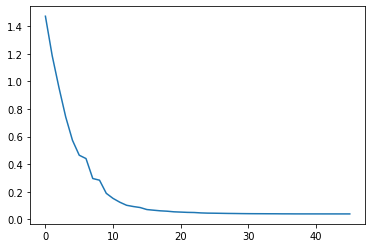

In [8]:
plt.plot(np.mean(globalMSE[0],axis=0))

In [29]:
np.shape(globalinfoB)

(1, 1000, 46)

In [ ]:
plt.subplot(2, 3, 1)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), globalVVAP[0], label='VVAP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(globalCT[0],axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c[0],axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d[0],axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e[0],axis=0)).T[1:46], label='MLWI', linewidth=2)

In [ ]:
globalinfoB.append(infoB)
  globalvarB.append(varB)
  globalSE.append(SE)
  globalRCSE.append(RCSE)
  globalVVAP.append(VVAP)
  globalCT.append(CT)

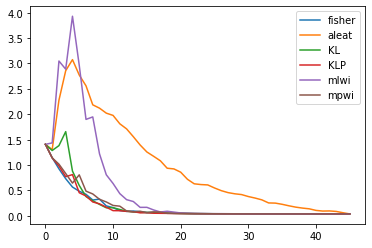

In [16]:
for sc in range(nSC):
  plt.plot(np.mean(globalMSE[sc][0],axis=0))
plt.gca().legend(("fisher","aleat","KL","KLP","mlwi","mpwi"))

In [17]:
globalMSE

[[array([[5.87295269e-01, 2.66619307e-01, 7.09433464e-02, ...,
          4.20004957e-07, 4.20004957e-07, 1.23849169e-07],
         [3.59826307e+00, 2.71230866e+00, 1.95135425e+00, ...,
          8.31405386e-09, 8.31405386e-09, 8.31405386e-09],
         [4.91644176e-01, 2.03557462e-01, 3.35441860e-01, ...,
          6.83221095e-07, 3.00773082e-08, 3.00773082e-08],
         ...,
         [2.49014859e+00, 1.76363836e+00, 1.16212813e+00, ...,
          4.18872711e-10, 4.18872711e-10, 4.18872711e-10],
         [3.16860155e-01, 9.79084917e-02, 5.42439595e-02, ...,
          9.34577238e-09, 9.34577238e-09, 9.34577238e-09],
         [1.18826755e-02, 1.98788327e-02, 1.68800234e-04, ...,
          5.90681059e-11, 5.90681059e-11, 5.90681059e-11]])],
 [array([[5.87295269e-01, 2.66619307e-01, 1.21362849e+00, ...,
          1.65226624e-03, 2.95413144e-03, 1.23849169e-07],
         [3.59826307e+00, 2.71230866e+00, 1.95135425e+00, ...,
          3.58906654e-03, 3.58906654e-03, 8.31405386e-09],
       

In [36]:
np.sqrt(np.mean((globalMSE[1]),axis=0))

array([[7.66351922e-01, 5.16351922e-01, 1.10164808e+00, ...,
        4.06480779e-02, 5.43519221e-02, 3.51922106e-04],
       [1.89690882e+00, 1.64690882e+00, 1.39690882e+00, ...,
        5.99088186e-02, 5.99088186e-02, 9.11814337e-05],
       [7.01173428e-01, 9.51173428e-01, 1.20117343e+00, ...,
        1.73428107e-04, 4.82657189e-03, 1.73428107e-04],
       ...,
       [1.57802047e+00, 1.32802047e+00, 4.15602047e+00, ...,
        3.40204664e-02, 1.02046638e-03, 2.04663800e-05],
       [5.62903326e-01, 8.12903326e-01, 1.57690333e+00, ...,
        3.09667354e-03, 3.09667354e-03, 9.66735350e-05],
       [1.09007686e-01, 3.59007686e-01, 6.09007686e-01, ...,
        3.30076856e-02, 3.40076856e-02, 7.68557778e-06]])

# Salva saídas

In [53]:
import pickle
pickle.dump(globalMSE, open('globalMSE_1000.pkl', 'wb'))
#np.savetxt('globalMSE_1000', globalMSE)
pickle.dump(globalthetaB, open('globalthetaB_1000.pkl', 'wb'))
#np.savetxt('globalthetaB_1000', globalthetaB)
pickle.dump(globalthetasA, open('globalthetasA_1000.pkl', 'wb'))
#np.savetxt('globalthetasA_1000', globalthetasA)

# Grupos

In [21]:
np.sort(theta_original)

array([-3.22438901e+00, -3.22438900e+00, -3.22438889e+00, -3.22438878e+00,
       -3.22438862e+00, -3.22438851e+00, -3.22438829e+00, -3.22438828e+00,
       -3.22438811e+00, -3.22438805e+00, -3.22438797e+00, -3.22438786e+00,
       -3.22438771e+00, -3.22438746e+00, -3.22438742e+00, -3.22438725e+00,
       -3.22438724e+00, -3.22438711e+00, -3.22438694e+00, -3.22438693e+00,
       -3.22438690e+00, -3.22438679e+00, -3.22438673e+00, -3.22438665e+00,
       -3.22438657e+00, -3.22438647e+00, -3.22438645e+00, -3.22438643e+00,
       -3.22438642e+00, -3.22438637e+00, -3.22438627e+00, -3.22438625e+00,
       -3.22438624e+00, -3.22438601e+00, -3.03292989e+00, -2.97233199e+00,
       -2.95539763e+00, -2.95107560e+00, -2.94238701e+00, -2.82417065e+00,
       -2.61419392e+00, -2.58746452e+00, -2.55871302e+00, -2.52267341e+00,
       -2.38376721e+00, -2.17733743e+00, -2.17471860e+00, -2.16516626e+00,
       -2.16127231e+00, -2.15962637e+00, -2.15807202e+00, -2.15704877e+00,
       -2.13950524e+00, -

In [22]:
z = np.argsort(theta_original)
theta_orig = theta_original[z[0:99993]]
theta_orig

array([-3.22438901e+00, -3.22438900e+00, -3.22438889e+00, -3.22438878e+00,
       -3.22438862e+00, -3.22438851e+00, -3.22438829e+00, -3.22438828e+00,
       -3.22438811e+00, -3.22438805e+00, -3.22438797e+00, -3.22438786e+00,
       -3.22438771e+00, -3.22438746e+00, -3.22438742e+00, -3.22438725e+00,
       -3.22438724e+00, -3.22438711e+00, -3.22438694e+00, -3.22438693e+00,
       -3.22438690e+00, -3.22438679e+00, -3.22438673e+00, -3.22438665e+00,
       -3.22438657e+00, -3.22438647e+00, -3.22438645e+00, -3.22438643e+00,
       -3.22438642e+00, -3.22438637e+00, -3.22438627e+00, -3.22438625e+00,
       -3.22438624e+00, -3.22438601e+00, -3.03292989e+00, -2.97233199e+00,
       -2.95539763e+00, -2.95107560e+00, -2.94238701e+00, -2.82417065e+00,
       -2.61419392e+00, -2.58746452e+00, -2.55871302e+00, -2.52267341e+00,
       -2.38376721e+00, -2.17733743e+00, -2.17471860e+00, -2.16516626e+00,
       -2.16127231e+00, -2.15962637e+00, -2.15807202e+00, -2.15704877e+00,
       -2.13950524e+00, -

In [23]:
n = 5
splited = []
len_l = len(theta_orig)
for i in range(n):
    start = int(i*len_l/n)
    end = int((i+1)*len_l/n)
    splited.append(theta_orig[start:end])
print(splited)

[array([-3.22438901, -3.224389  , -3.22438889, -3.22438878, -3.22438862,
       -3.22438851, -3.22438829, -3.22438828, -3.22438811, -3.22438805,
       -3.22438797, -3.22438786, -3.22438771, -3.22438746, -3.22438742,
       -3.22438725, -3.22438724, -3.22438711, -3.22438694, -3.22438693,
       -3.2243869 , -3.22438679, -3.22438673, -3.22438665, -3.22438657,
       -3.22438647, -3.22438645, -3.22438643, -3.22438642, -3.22438637,
       -3.22438627, -3.22438625, -3.22438624, -3.22438601, -3.03292989,
       -2.97233199, -2.95539763, -2.9510756 , -2.94238701, -2.82417065,
       -2.61419392, -2.58746452, -2.55871302, -2.52267341, -2.38376721,
       -2.17733743, -2.1747186 , -2.16516626, -2.16127231, -2.15962637,
       -2.15807202, -2.15704877, -2.13950524, -2.12981384, -2.12758151,
       -2.11046003, -2.10454061, -2.07992654, -2.07536952, -2.05968341,
       -2.01222936, -1.98559594, -1.95487023, -1.93071331, -1.89690882,
       -1.84042056, -1.8376539 , -1.80942427, -1.80628122, -1.7

In [24]:
n = 5
splited1 = []
len_l = len(z)
for i in range(n):
    start = int(i*len_l/n)
    end = int((i+1)*len_l/n)
    splited1.append(z[start:end])
print(splited1)

[array([  7, 430, 279, 717, 622, 927, 193, 777, 544,  55, 380, 828, 786,
       840, 883, 903,  66, 699,  80, 811, 734, 814, 327, 101, 226, 124,
       913, 587, 888, 317, 817, 800,  86, 620, 928, 241, 877, 489, 215,
         3, 314, 359, 304, 276,  18, 679, 558, 321, 212, 160,   6, 874,
       456, 189, 785, 705, 263, 924, 130, 686, 396, 227, 412, 531,   1,
       940,  69, 303, 853,  21, 331,  93, 480, 448, 156, 780, 460, 592,
       799, 445, 368, 444, 132, 944, 603, 318, 164, 202, 315, 907, 370,
        57, 283, 337, 813, 901, 654, 719, 208, 997, 879, 416, 884,  78,
       968, 695, 260, 296, 573, 868, 763,  84, 724, 976, 197, 820, 898,
       184, 249,  97, 818, 696, 108, 675, 672, 810, 575, 301, 268,  85,
       683, 330, 475, 353, 252, 423, 566, 819, 858, 486, 259, 850, 474,
       272, 194,  95, 894, 577, 341, 525, 742, 504, 591, 723,  30,  17,
       401, 745, 464, 594, 935, 242,   4, 238, 608,  24, 733, 180, 975,
       251, 264, 351, 273, 409, 987, 920, 352, 228, 509, 580, 2

In [26]:
ind0 = splited1[0]
ind1 = splited1[1]
ind2 = splited1[2]
ind3 = splited1[3]
ind4 = splited1[4]

In [56]:
import pickle
f = open('globalMSE_1000.pkl', 'rb')   # 'r' for reading; can be omitted
globalMSE_1000 = pickle.load(f)  

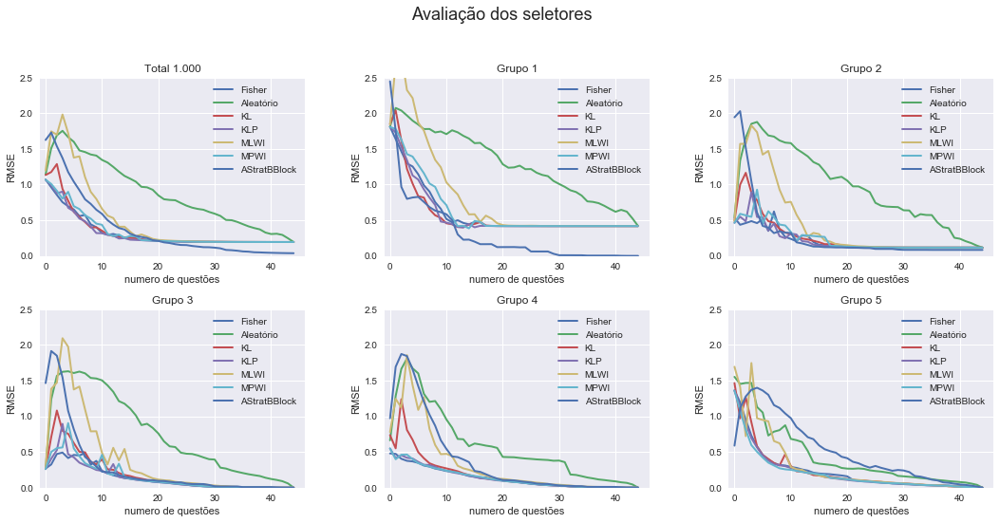

In [121]:
plt.style.use("seaborn")

plt.figure(figsize = ((18, 8)))

a = globalMSE_1000[0]
b = globalMSE_1000[1]
c = globalMSE_1000[2]
d = globalMSE_1000[3]
e = globalMSE_1000[4]
f = globalMSE_1000[5]
g = np.loadtxt('Result_AStratBBlockSelector_theta_orig_1000.txt')

plt.subplot(2, 3, 1)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a[0],axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b[0],axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c[0],axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d[0],axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e[0],axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f[0],axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g[1:,:])**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, 0, 2.5])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Total 1.000")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

g_new = g[1:,:]

##################################
a_base0 = a[0][ind0,:]
b_base0 = b[0][ind0,:]
c_base0 = c[0][ind0,:]
d_base0 = d[0][ind0,:]
e_base0 = e[0][ind0,:]
f_base0 = f[0][ind0,:]
g_base0 = g_new[ind0,:]

plt.subplot(2, 3, 2)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base0,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base0,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base0,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base0,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base0,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base0,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base0)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, 0, 2.5])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 1")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()


#######################################################################################################

a_base1 = a[0][ind1,:]
b_base1 = b[0][ind1,:]
c_base1 = c[0][ind1,:]
d_base1 = d[0][ind1,:]
e_base1 = e[0][ind1,:]
f_base1 = f[0][ind1,:]
g_base1 = g_new[ind1,:]

plt.subplot(2, 3, 3)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base1,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base1,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base1,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base1,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base1,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base1,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base1)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, 0, 2.5])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 2")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base2 = a[0][ind2,:]
b_base2 = b[0][ind2,:]
c_base2 = c[0][ind2,:]
d_base2 = d[0][ind2,:]
e_base2 = e[0][ind2,:]
f_base2 = f[0][ind2,:]
g_base2 = g_new[ind2,:]

plt.subplot(2, 3, 4)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base2,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base2,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base2,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base2,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base2,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base2,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base2)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, 0, 2.5])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 3")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base3 = a[0][ind3,:]
b_base3 = b[0][ind3,:]
c_base3 = c[0][ind3,:]
d_base3 = d[0][ind3,:]
e_base3 = e[0][ind3,:]
f_base3 = f[0][ind3,:]
g_base3 = g_new[ind3,:]

plt.subplot(2, 3, 5)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base3,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base3,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base3,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base3,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base3,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base3,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base3)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, 0, 2.5])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 4")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()



#######################################################################################################

a_base4 = a[0][ind4,:]
b_base4 = b[0][ind4,:]
c_base4 = c[0][ind4,:]
d_base4 = d[0][ind4,:]
e_base4 = e[0][ind4,:]
f_base4 = f[0][ind4,:]
g_base4 = g_new[ind4,:]

plt.subplot(2, 3, 6)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base4,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base4,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base4,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base4,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base4,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base4,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base4)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, 0, 2.5])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 5")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()


plt.suptitle("Avaliação dos seletores", fontsize = 18)
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.85, wspace=0.3, hspace=0.3)


plt.show()

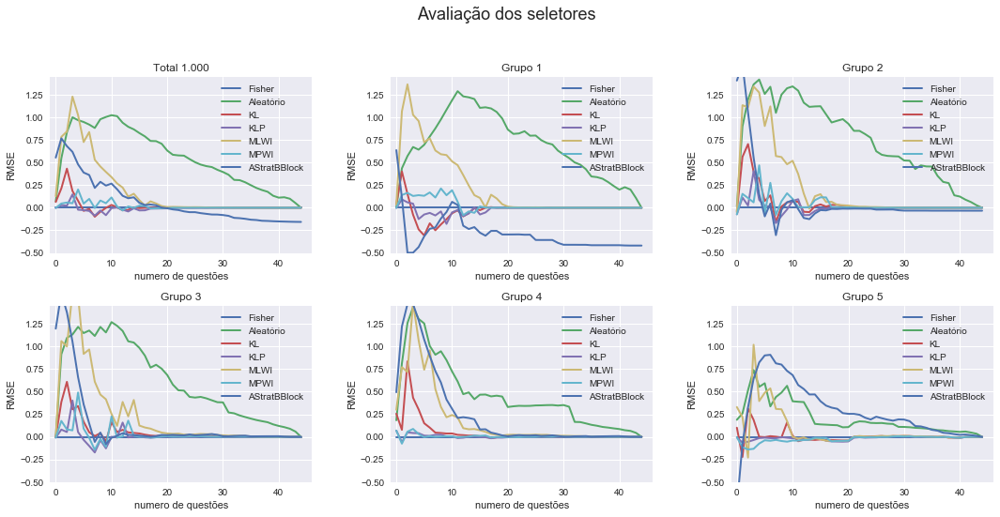

In [123]:
plt.style.use("seaborn")

plt.figure(figsize = ((18, 8)))

a = globalMSE_1000[0]
b = globalMSE_1000[1]
c = globalMSE_1000[2]
d = globalMSE_1000[3]
e = globalMSE_1000[4]
f = globalMSE_1000[5]
g = np.loadtxt('Result_AStratBBlockSelector_theta_orig_1000.txt')

plt.subplot(2, 3, 1)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a[0],axis=0)).T[1:46]-np.sqrt(np.mean(a[0],axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b[0],axis=0)).T[1:46]-np.sqrt(np.mean(a[0],axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c[0],axis=0)).T[1:46]-np.sqrt(np.mean(a[0],axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d[0],axis=0)).T[1:46]-np.sqrt(np.mean(a[0],axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e[0],axis=0)).T[1:46]-np.sqrt(np.mean(a[0],axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f[0],axis=0)).T[1:46]-np.sqrt(np.mean(a[0],axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g[1:,:])**2,axis=0))-np.sqrt(np.mean(a[0],axis=0)).T[1:46], label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, -0.5, 1.45])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Total 1.000")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

g_new = g[1:,:]

##################################
a_base0 = a[0][ind0,:]
b_base0 = b[0][ind0,:]
c_base0 = c[0][ind0,:]
d_base0 = d[0][ind0,:]
e_base0 = e[0][ind0,:]
f_base0 = f[0][ind0,:]
g_base0 = g_new[ind0,:]

plt.subplot(2, 3, 2)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base0,axis=0)).T[1:46]-np.sqrt(np.mean(a_base0,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base0,axis=0)).T[1:46]-np.sqrt(np.mean(a_base0,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base0,axis=0)).T[1:46]-np.sqrt(np.mean(a_base0,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base0,axis=0)).T[1:46]-np.sqrt(np.mean(a_base0,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base0,axis=0)).T[1:46]-np.sqrt(np.mean(a_base0,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base0,axis=0)).T[1:46]-np.sqrt(np.mean(a_base0,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base0)**2,axis=0))-np.sqrt(np.mean(a_base0,axis=0)).T[1:46], label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, -0.5, 1.45])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 1")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()


#######################################################################################################

a_base1 = a[0][ind1,:]
b_base1 = b[0][ind1,:]
c_base1 = c[0][ind1,:]
d_base1 = d[0][ind1,:]
e_base1 = e[0][ind1,:]
f_base1 = f[0][ind1,:]
g_base1 = g_new[ind1,:]

plt.subplot(2, 3, 3)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base1,axis=0)).T[1:46]-np.sqrt(np.mean(a_base1,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base1,axis=0)).T[1:46]-np.sqrt(np.mean(a_base1,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base1,axis=0)).T[1:46]-np.sqrt(np.mean(a_base1,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base1,axis=0)).T[1:46]-np.sqrt(np.mean(a_base1,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base1,axis=0)).T[1:46]-np.sqrt(np.mean(a_base1,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base1,axis=0)).T[1:46]-np.sqrt(np.mean(a_base1,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base1)**2,axis=0))-np.sqrt(np.mean(a_base1,axis=0)).T[1:46], label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, -0.5, 1.45])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 2")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base2 = a[0][ind2,:]
b_base2 = b[0][ind2,:]
c_base2 = c[0][ind2,:]
d_base2 = d[0][ind2,:]
e_base2 = e[0][ind2,:]
f_base2 = f[0][ind2,:]
g_base2 = g_new[ind2,:]

plt.subplot(2, 3, 4)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base2,axis=0)).T[1:46]-np.sqrt(np.mean(a_base2,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base2,axis=0)).T[1:46]-np.sqrt(np.mean(a_base2,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base2,axis=0)).T[1:46]-np.sqrt(np.mean(a_base2,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base2,axis=0)).T[1:46]-np.sqrt(np.mean(a_base2,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base2,axis=0)).T[1:46]-np.sqrt(np.mean(a_base2,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base2,axis=0)).T[1:46]-np.sqrt(np.mean(a_base2,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base2)**2,axis=0))-np.sqrt(np.mean(a_base2,axis=0)).T[1:46], label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, -0.5, 1.45])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 3")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base3 = a[0][ind3,:]
b_base3 = b[0][ind3,:]
c_base3 = c[0][ind3,:]
d_base3 = d[0][ind3,:]
e_base3 = e[0][ind3,:]
f_base3 = f[0][ind3,:]
g_base3 = g_new[ind3,:]

plt.subplot(2, 3, 5)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base3,axis=0)).T[1:46]-np.sqrt(np.mean(a_base3,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base3,axis=0)).T[1:46]-np.sqrt(np.mean(a_base3,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base3,axis=0)).T[1:46]-np.sqrt(np.mean(a_base3,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base3,axis=0)).T[1:46]-np.sqrt(np.mean(a_base3,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base3,axis=0)).T[1:46]-np.sqrt(np.mean(a_base3,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base3,axis=0)).T[1:46]-np.sqrt(np.mean(a_base3,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base3)**2,axis=0))-np.sqrt(np.mean(a_base3,axis=0)).T[1:46], label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, -0.5, 1.45])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 4")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()



#######################################################################################################

a_base4 = a[0][ind4,:]
b_base4 = b[0][ind4,:]
c_base4 = c[0][ind4,:]
d_base4 = d[0][ind4,:]
e_base4 = e[0][ind4,:]
f_base4 = f[0][ind4,:]
g_base4 = g_new[ind4,:]

plt.subplot(2, 3, 6)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean(a_base4,axis=0)).T[1:46]-np.sqrt(np.mean(a_base4,axis=0)).T[1:46], label='Fisher', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(b_base4,axis=0)).T[1:46]-np.sqrt(np.mean(a_base4,axis=0)).T[1:46], label='Aleatório', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(c_base4,axis=0)).T[1:46]-np.sqrt(np.mean(a_base4,axis=0)).T[1:46], label='KL', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(d_base4,axis=0)).T[1:46]-np.sqrt(np.mean(a_base4,axis=0)).T[1:46], label='KLP', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(e_base4,axis=0)).T[1:46]-np.sqrt(np.mean(a_base4,axis=0)).T[1:46], label='MLWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean(f_base4,axis=0)).T[1:46]-np.sqrt(np.mean(a_base4,axis=0)).T[1:46], label='MPWI', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((g_base4)**2,axis=0))-np.sqrt(np.mean(a_base4,axis=0)).T[1:46], label='AStratBBlock', linewidth=2)
plt.axis([-1, 46, -0.5, 1.45])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 5")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()


plt.suptitle("Avaliação dos seletores", fontsize = 18)
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.85, wspace=0.3, hspace=0.3)


plt.show()

# Comparando estimador do pacote com os implementados

## ML e pacote

In [171]:
import pickle
f = open('globalthetaB_1000.pkl', 'rb')   # 'r' for reading; can be omitted
globalthetaB_1000 = pickle.load(f)
globalthetaB_1000[0][0]

array([[ 0.   ,  0.25 ,  0.766, ...,  0.767,  0.767,  0.766],
       [ 0.   , -0.25 , -0.5  , ..., -1.897, -1.897, -1.897],
       [ 0.   , -0.25 ,  0.122, ...,  0.702,  0.701,  0.701],
       ...,
       [ 0.   , -0.25 , -0.5  , ..., -1.578, -1.578, -1.578],
       [ 0.   , -0.25 , -0.5  , ..., -0.563, -0.563, -0.563],
       [ 0.   , -0.25 ,  0.122, ...,  0.109,  0.109,  0.109]])

In [172]:
np.shape(globalthetaB_1000)

(6, 1, 1000, 46)

In [173]:
theta_original = np.loadtxt('Result_theta_original-base1000.txt')
theta_original[0]

0.7663519221053628

In [216]:
z = np.argsort(theta_original)
theta_orig = theta_original[z[0:1000]]


arr = np.array(globalthetaB_1000)
theta1 = arr[0,0,z,45]

In [220]:
theta_orig[0:10]

array([-3.22438901, -3.224389  , -3.22438889, -3.22438878, -3.22438862,
       -3.22438851, -3.22438829, -3.22438828, -3.22438811, -3.22438805])

In [228]:
alunos

,MT'True,MT2,MT3,MT4,MT5,MT6,MT7,MT8,MT9,MT'True'False,...,LC3'True,LC32,LC33,LC34,LC35,LC36,LC37,LC38,LC39,LC4'False
0,True,False,True,True,False,False,False,False,False,True,...,False,False,True,False,False,False,False,True,False,False
1,True,False,False,False,False,False,False,False,False,False,...,True,True,False,False,True,False,False,False,False,False
2,False,False,True,True,False,True,False,False,False,False,...,False,False,False,False,True,False,True,False,True,False
3,False,False,False,False,False,False,True,False,False,True,...,False,False,False,False,False,True,False,False,False,True
4,False,True,False,True,False,True,False,False,False,True,...,False,False,False,False,True,False,True,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,False,True,True,True,False,False,False,False,True,False,...,False,False,False,False,True,False,False,False,False,False
996,False,False,False,True,False,False,False,False,True,False,...,True,False,False,False,True,True,True,False,True,False
997,False,False,False,False,False,True,True,True,False,False,...,False,False,False,False,False,False,False,False,False,False
998,False,False,True,True,False,True,False,False,False,False,...,False,True,True,True,True,False,True,False,True,True


In [232]:
np.shape(respA)

(45, 1000)

In [235]:
respA1 = np.sum(respA.astype(int),axis=0)
respA1

array([19,  8, 23,  7, 12,  7,  5,  9, 18, 17, 15,  9, 15, 29, 13, 13, 25,
        9,  8, 14, 11, 10, 14, 14,  7, 13, 17, 13,  6, 17, 12, 15, 25, 16,
       24, 13, 34, 12, 25, 12, 32, 39, 10,  8, 25, 30, 13, 30, 19, 13, 30,
       26, 21,  8, 14,  8,  8,  7, 13, 18,  8, 36, 10, 39, 26, 13,  6, 18,
       13,  5, 11, 18, 30, 36, 15, 25, 13, 23,  8, 16,  8, 13, 18, 27,  9,
        9, 12, 19, 10, 19, 20, 38, 23,  8, 13,  9, 28, 10,  9, 21, 10,  6,
       10, 12, 17,  8,  8, 19,  9,  9, 24, 13, 29, 31, 10, 17, 15, 19, 20,
       16, 24, 10, 25, 14,  6, 22, 15, 17, 15, 16,  7, 10, 10, 15, 15, 21,
       13, 16, 18, 15, 14, 12, 37, 20, 14, 15, 31, 14, 11, 18, 11, 13, 31,
       11, 18, 18,  9, 13, 14, 18,  7, 10, 20, 13, 13, 19, 12, 13, 21, 29,
       22, 15, 11, 16, 23, 17, 19, 14, 14, 14, 10, 14,  7, 15,  6, 15, 19,
       25, 11,  9, 31, 15, 13,  8, 10, 21, 35,  9, 15, 24, 21, 12,  8, 18,
       18, 11, 23, 15, 10, 11, 23, 13,  6, 10, 18,  9,  8, 10, 11, 20, 22,
       16, 15, 20, 10, 21

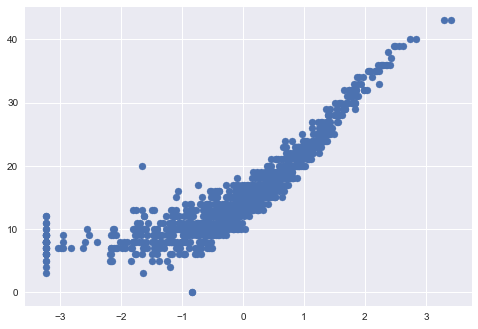

In [244]:
plt.scatter(theta_orig,respA1[z])

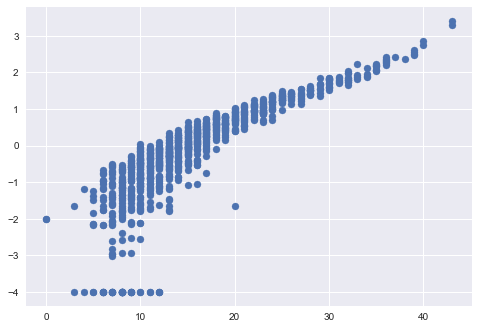

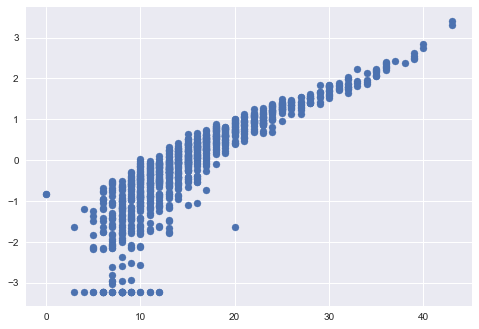

In [245]:
plt.scatter(respA1[z],theta1)
plt.show()
plt.scatter(respA1[z],theta_orig)
plt.show()

In [242]:
plt.plot(theta_orig - theta1)
plt.plot(theta_orig)
plt.plot(theta1)

TypeError: scatter() missing 1 required positional argument: 'y'

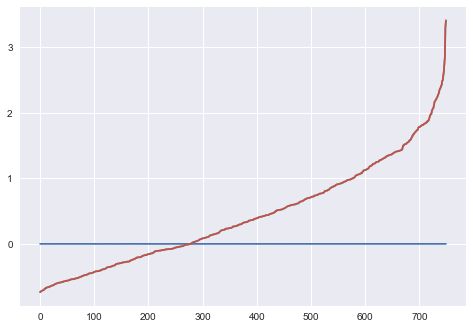

In [223]:
plt.plot(theta_orig[250:1000] - theta1[250:1000])
plt.plot(theta_orig[250:1000])
plt.plot(theta1[250:1000])

In [175]:
n=1000
diferenca = []
for i in range(n):
    dif = (theta_original[i] - globalthetaB_1000[0][0][i][45])
    diferenca.append(dif)
print(diferenca)

[0.00035192210588774753, 9.118143374697851e-05, 0.00017342810675124998, -0.00017065152568918052, 7.619080700571601e-06, -0.000372387070877056, -7.202377795101356e-05, 0.7756109929747392, -0.0003888511933008987, -0.0004625463582961231, 0.00034868746067917566, 5.0366840640081456e-05, -0.00015398212446876558, 0.00045396667324348883, 0.00045612268852857074, 0.0002627210646119482, 2.5418244655739386e-05, 6.083301236037286e-05, 0.00023278540453475216, -0.0004687663134747555, 0.00018822487290454104, 3.628337627725742e-05, -0.00013874126788748775, 0.00027589636757302527, 0.00020603429900867276, 0.00037202314768847167, 0.0004944649534888712, 0.0001394779701577864, -0.00024407629356382188, 0.0002876130815735456, -0.00036875953574022624, -0.000499748547901413, -0.0002674817783694383, 0.00011950162729584823, -0.00028750438637858977, 6.428708488467882e-05, -0.0002914711581105678, 0.000131534935417843, -0.0003313344763060666, -0.00013011675544427614, 0.0004717205522217771, -0.0002575185662312407, 0.

In [176]:
np.max(diferenca)

2.3853934935772187

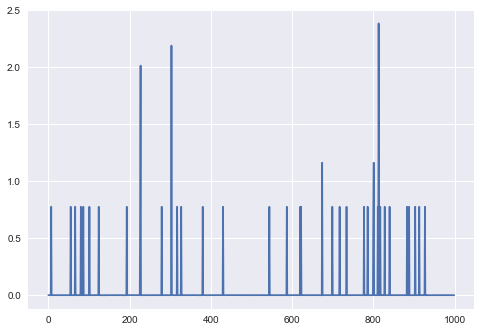

In [177]:
plt.plot(diferenca)

## EAP

In [157]:
# repete = 200;
# nA = 25;

# repete = 1;
# nA = 50;

repete = 2;
nA = len(alunos);

nQ = len(param.iloc[0:45,1]);
maxnQ = min(45,nQ);

# Maximum Likelihood Parameters 

rateGrow = 0.25;
maxGrow = 2;

estimator = 1
estName = ['EAP','MAP','ML']
base = 1
# baseName = ['norm','uni','peak']
shift = 1

nSC = 6;

# thetasA = np.random.randn(nA)
thetasA = theta_original

As = param.iloc[0:45,1].to_numpy()
Bs = param.iloc[0:45,2].to_numpy()
Cs = param.iloc[0:45,3].to_numpy()
D = np.array(1,ndmin=1)

thetasB = np.arange(-4,4,0.001)
nB = len(thetasB)

blf0 =  norm.pdf(thetasB)
blf0 = blf0/np.sum(blf0)

probsB = np.zeros((nQ,nB))
probsA = np.zeros((nQ,nA))
infos = np.zeros((nQ,nB))


for q in np.arange(0,nQ):
    probsA[q,:] = (Cs[q] + (1-Cs[q])/( 1 + np.exp(-D*As[q]*( thetasA - Bs[q]  ) )   ))
    probsB[q,:] = (Cs[q] + (1-Cs[q])/( 1 + np.exp(-D*As[q]*( thetasB - Bs[q]  ) )   ))
    infos[q,:] =  ((1-Cs[q])*D*As[q]*np.exp(-D*As[q]*( thetasB - Bs[q]  ) )/ (1 + np.exp(-D * As[q] * ( thetasB - Bs[q]  ) ))**2 )**2/( probsB[q,:]*(1-probsB[q,:]) )
    infos[q,:] =  info_fisher(As[q],Bs[q],Cs[q],D,thetasB)


logprobsB = np.log(probsB);
log1_probsB = np.log(1-probsB);

In [158]:
globalMSE = []
globalthetaB = []
for sc in range(0,nSC):
  globalMSE.append([])
  globalthetaB.append([])

globalthetasA = []

# respA = probsA > np.random.rand(nQ,nA)
respA = (alunos.iloc[:,0:45].to_numpy()).T

thetaB = np.zeros((nA,maxnQ+1))
    
infosTotal = np.zeros((nQ,len(thetasB)));

for q in range(0,nQ):
    infosTotal[q,:] = info_fisher(As[q],Bs[q],Cs[q],D,thetasB);

for sc in range(0,nSC):
  
  print(sc)
  for a in range(0,nA):

    if np.remainder(a+1,100) == 0:
        print(sc,a/nA)

    blf = blf0
    applied = np.zeros(nQ)

    for q in np.arange(0,maxnQ):

      if estimator == 1:
        # EAP
        T = np.sum(blf*thetasB)
      elif estimator == 2:
        # MAP
        aux = np.argmax(blf)
        T = thetasB[0,aux]
      elif estimator == 3:
        # ML
        if q>0:
          qs = np.flatnonzero(np.isinf(applied))
          if np.min(  respA[qs, a] == 0 ):     # min (python) = all (matlab)
            T = np.max([-maxGrow,-len(qs)*rateGrow])
          elif np.min(  respA[qs, a] == 1 ):
            T = np.min([maxGrow,len(qs)*rateGrow])
          else:
            aux = np.argmax(blf/blf0)
            T = thetasB[aux]
        else:
          T = 0

      if sc == 0:
        inicio = time.time()
        
        I = info_fisher(As,Bs,Cs,D,T)
        vv = np.max(I+applied)
        qq = np.argmax(I+applied)
        
        fim = time.time()
        print(fim - inicio)
        
      elif sc == 1:
        inicio = time.time()
        
        aux = np.flatnonzero(applied==0)
        qq = aux[np.random.randint(len(aux))]

        fim = time.time()
        print(fim - inicio)
        
      elif sc == 2:
        inicio = time.time()
        
        kl = KLP(blf/blf0,thetasB,probsB,logprobsB,log1_probsB,T)
        vv = np.max(kl+applied)
        qq = np.argmax(kl+applied)
        
        fim = time.time()
        print(fim - inicio)

      elif sc == 3:
        inicio = time.time()
        
        klp = KLP(blf,thetasB,probsB,logprobsB,log1_probsB,T)
        vv = np.max(klp+applied)
        qq = np.argmax(klp+applied)
        
        fim = time.time()
        print(fim - inicio)

      elif sc == 4:
        inicio = time.time()
        
        mlwi = (blf/blf0)@infosTotal.T
        vv = np.max(mlwi+applied)
        qq = np.argmax(mlwi+applied)

        fim = time.time()
        print(fim - inicio)
        
      elif sc == 5:
        inicio = time.time()
        
        mpwi = blf@infosTotal.T
        vv = np.max(mpwi+applied)
        qq = np.argmax(mpwi+applied)

        fim = time.time()
        print(fim - inicio)
        
      # elif sc == 6:
#         inicio = time.time()
    
        # er = ExpRed(blf,thetasB,probsB)
        # vv = np.max(er+applied)
        # qq = np.argmax(er+applied)
        
#         fim = time.time()
#         print(fim - inicio)

      if respA[qq,a] == 1:
          blf = blf*probsB[qq,:]
      else:
          blf = blf*(1-probsB[qq,:])

      blf = blf/sum(blf);
      thetaB[a,q] = T;
      applied[qq] = -np.inf;

    if estimator == 1:
      # EAP
      T = np.sum(blf*thetasB)
    elif estimator == 2:
      # MAP
      aux = np.argmax(blf)
      T = thetasB[0,aux]
    elif estimator == 3:
      # ML
      if q>0:
        qs = np.flatnonzero(np.isinf(applied))
        if np.min(  respA[qs, a] == 0 ):     # min (python) = all (matlab)
          T = np.max([-maxGrow,-len(qs)*rateGrow])
        elif np.min(  respA[qs, a] == 1 ):
          T = np.min([maxGrow,len(qs)*rateGrow])
        else:
          aux = np.argmax(blf/blf0)
          T = thetasB[aux]
      else:
        T = 0
          
    thetaB[a,q+1] = T

  MSE = (thetaB-np.tile(thetasA,(maxnQ+1,1)).T)**2
  globalMSE[sc].append(MSE)
  globalthetaB[sc].append(thetaB)
  globalthetasA.append(thetasA)

0
0.06452083587646484
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0009970664978027344
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009827613830566406
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009856224060058594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997781753540039
0.0
0.0009629726409912109
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009989738464355469
0.0010221004486083984
0.0010116100311279297
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0010073184967041016
0.0
0.0
0.0010175704956054688
0.0
0.0
0.0009963512420654297
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001012563705444336
0.0
0.0
0.0
0.0
0.0
0.0
0.0009560585021972656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009560585021972656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009925365447998047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009589195251464844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009763240814208984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009875297546386719
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0 0.099
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009570121765136719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010080337524414062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.001008749008178711
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0010042190551757812
0.0009975433349609375
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009846687316894531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001028299331665039
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000957489013671875
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0010156631469726562
0.0
0.0
0.0
0.00098419189453125
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009849071502685547
0.0
0.0009963512420654297
0.0
0.0
0.00099945068359375
0.0
0.0009989738464355469
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102996826171875
0.0009653568267822266
0.0009970664978027344
0.0
0.0009987354278564453
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009601116180419922
0.0
0.0
0.0
0.0
0.0
0.0009822845458984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0 0.199
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.000997304916381836
0.0
0.0
0.0010488033294677734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009577274322509766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001024484634399414
0.0
0.000957489013671875
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010325908660888672
0.0
0.0009768009185791016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009911060333251953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009531974792480469
0.0009982585906982422
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0010428428649902344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009775161743164062
0.0
0.0
0.0
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0010402202606201172
0.0
0.000957489013671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
0.0
0.0
0.0
0.0
0.0
0.0010232925415039062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009837150573730469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009975433349609375
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009703636169433594
0.0
0.0009870529174804688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0009975433349609375
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0010089874267578125
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0009953975677490234
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0009725093841552734
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009691715240478516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0009999275207519531
0.0009951591491699219
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009548664093017578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0
0.001028299331665039
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0009596347808837891
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0009567737579345703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009708404541015625
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0009818077087402344
0.0009961128234863281
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010180473327636719
0.000946044921875
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000998497009277

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0020036697387695312
0.00102996826171875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009744167327880859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010113716125488281
0.0
0.0
0.0
0.0
0.0009837150573730469
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001007080078125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009779930114746094
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010085105895996094
0.0009632110595703125
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009632110595703125
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0010046958923339844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009629726409912109
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0009908676147460938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.

0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010104179382324219
0.0
0.0
0.001008749008178711
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009691715240478516
0.0
0.0
0.00098896026611328

0.0
0.000997304916381836
0.0
0.0
0.0009975433349609375
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0008795261383056641
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009903907775878906
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009582042694091797
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009737014770507812
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009918212890625
0.0010006427764892578
0.0
0.0
0.0009562969207763672
0.0
0.0009860992431640625
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010142326354980469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009760856628417969
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.001027822494506836
0.0
0.0009601116180419922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009903907775878906
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.000961065292358398

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010120868682861328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010213851928710938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0010123252868652344
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0010089874267578125
0.0010471343994140625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0010044574737548828
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001005411148071289
0.0
0.0009968280792236328
0.0
0.0
0.0009975433349609375
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0009970664978027344
0.0010004043579101562
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
0.00099635

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009677410125732422
0.000997304916381836
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009758472442626953
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001016378402709961
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0010056495666503906
0.0
0.0
0.0
0.0
0.0009870529174804688
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010089874267578125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995874404907

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010280609130859375
0.0
0.0009696483612060547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000957489013671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0010271072387695312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009775161743164062
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009937286376953125
0.0009970664978027344
0.0
0.0
0.0
0.0009982585906982422
0.0010187625885009766
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009331703186035156
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0010652542114257812
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010373592376708984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010192394256591797
0.0009751319885253906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009815692901611328
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009686946868896484
0.0009944438934326172
0.0009992122650146484
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009956

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010361671447753906
0.0
0.0009839534759521484
0.0010037422180175781
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010213851928710938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0010066032409667969
0.0009980201721191406
0.0
0.0
0.0
0.0009984970092773438
0.0009942054748535156
0.0009884834289550781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664

0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0009884834289550781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0009562969207763672
0.0009961128234863281
0.0009970664978027344
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0010004043579101562
0.0009968280792236328
0.0
0.000986337661743164
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009675025939941406
0.0010342597961425781
0.0009579658508300781
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009682178497314453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0010058879852294922
0.0
0.0
0.0009579658508300781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.

0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.001010894775390625
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009927749633789062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0009789466857910156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009911060333251953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010268688201904297
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010042190551757812
0.0
0.0009975433349609375
0.0
0.0010325908660888672
0.000988006591796875
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0009586811065673828
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0009613037109375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000972747802734375
0.00098419189453125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009765625
0.0
0.0
0.001024484634399414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0009551048278808594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009822845458984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0010290145874023438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010242462158203125
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0010056495666503906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010249614715576172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.001016378402709961
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009818077087402344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009827613830566406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010330677032470703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010161399841308594
0.0009846687316894531
0.0
0.0
0.0
0.0
0.0
0.0
0.0009584426879882812
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009756088256835938
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010323524475097656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.00

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001032114028930664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0009903907775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001005411148071289
0.0
0.0009980201721191406
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009589195251464844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009751319885253906
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00103759765625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009918212890625
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010285377502441406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009696483612060547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010046958923339844
0.0
0.0
0.0
0.0
0.0
0.001032114028930664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009763240814208984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0009856224060058594
0.0
0.0
0.0
0.0009748935699462891
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010368824005126953
0.0
0.0
0.0
0.0
0.0
0.0
0.001026153564453125
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009865760803222656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009889602661132812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009925365447998047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009875297546386719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009694099426269531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009779930114746094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.001010894775390625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1 0.599
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009806156158447266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010190010070800781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001005411148071289
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010156631469726562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009770393371582031
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010344982147216797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010161399841308594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00

0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010154247283935547
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0009720325469970703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0010313987731933594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009851455688476562
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009572505950927734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0009765625
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0010349750518798828
0.0009801387786865234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010313987731933594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010352134704589844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010631084442138672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010063648223876953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00101470947265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010120868682861328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009872913360595703
0.0009810924530029297
0.0
0.0010197162628173828
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009968280792236328
0.0
0.0
0.0009980201721191406
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001007080078125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009677410125732422
0.0
0.0
0.0
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009851455688476562
0.0009763240814208984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010340213775634766
0.0
0.

0.02094721794128418
0.023951053619384766
0.018948078155517578
0.017954111099243164
0.01795196533203125
0.01695418357849121
0.01795220375061035
0.020977497100830078
0.016953229904174805
0.018914222717285156
0.020945072174072266
0.018980979919433594
0.02490067481994629
0.02293705940246582
0.018949270248413086
0.016956329345703125
0.01695537567138672
0.0169525146484375
0.017952442169189453
0.01795363426208496
0.021939992904663086
0.019945383071899414
0.0259549617767334
0.02792525291442871
0.019945859909057617
0.016953468322753906
0.016988754272460938
0.01595926284790039
0.01893448829650879
0.022939443588256836
0.02293848991394043
0.018949508666992188
0.015957117080688477
0.01894998550415039
0.022949934005737305
0.021939754486083984
0.024938344955444336
0.02194070816040039
0.02293848991394043
0.023935556411743164
0.017949581146240234
0.016955852508544922
0.016987323760986328
0.016911745071411133
0.01695537567138672
0.015958547592163086
0.02194523811340332
0.02493429183959961
0.024900674819

0.015958070755004883
0.01796102523803711
0.02293872833251953
0.020943880081176758
0.02393651008605957
0.014959573745727539
0.02393651008605957
0.02293872833251953
0.019946813583374023
0.0189511775970459
0.022937536239624023
0.02293705940246582
0.036899566650390625
0.02094292640686035
0.02094292640686035
0.019946813583374023
0.021943330764770508
0.02094101905822754
0.01996588706970215
0.020944595336914062
0.019946813583374023
0.021940946578979492
0.030910491943359375
0.023910999298095703
0.022938966751098633
0.01994633674621582
0.017951488494873047
0.01695537567138672
0.025931119918823242
0.028925180435180664
0.025931119918823242
0.023918628692626953
0.025929927825927734
0.024935245513916016
0.019944429397583008
0.022938013076782227
0.019949674606323242
0.01695394515991211
0.019946575164794922
0.02094411849975586
0.023938417434692383
0.04188799858093262
0.02792501449584961
0.024933815002441406
0.017949342727661133
0.018949031829833984
0.018948078155517578
0.02194046974182129
0.030915260

0.017952919006347656
0.023935556411743164
0.019964933395385742
0.015955686569213867
0.01595759391784668
0.01495981216430664
0.014960527420043945
0.015949487686157227
0.017951250076293945
0.016924142837524414
0.01698899269104004
0.017942190170288086
0.018915414810180664
0.01994013786315918
0.017981529235839844
0.0169222354888916
0.018991708755493164
0.017975568771362305
0.016944408416748047
0.016921043395996094
0.016946792602539062
0.01891016960144043
0.01994633674621582
0.01891469955444336
0.018950223922729492
0.016956090927124023
0.017943620681762695
0.016957759857177734
0.01695418357849121
0.01595592498779297
0.016988515853881836
0.022908687591552734
0.02895522117614746
0.031903743743896484
0.02892470359802246
0.022937774658203125
0.024193763732910156
0.018950223922729492
0.015956878662109375
0.016954660415649414
0.016956567764282227
0.019945859909057617
0.018948793411254883
0.018950462341308594
0.016953706741333008
0.016957998275756836
0.02892327308654785
0.03390932083129883
0.02892

0.018949270248413086
0.015955686569213867
0.017920732498168945
0.015995264053344727
0.01595616340637207
0.016988515853881836
0.014960527420043945
0.016991138458251953
0.0159149169921875
0.015957117080688477
0.015958070755004883
0.015915393829345703
0.019947052001953125
0.019906282424926758
0.024930953979492188
0.022939205169677734
0.01695418357849121
0.016923189163208008
0.01898360252380371
0.016950368881225586
0.016955852508544922
0.01695537567138672
0.020946025848388672
0.019945859909057617
0.01898479461669922
0.01795649528503418
0.016993999481201172
0.016947269439697266
0.016956090927124023
0.01695418357849121
0.016918182373046875
0.016997814178466797
0.018950700759887695
0.019945383071899414
0.01794910430908203
0.018947362899780273
0.016954421997070312
0.017915964126586914
0.015958070755004883
0.015916109085083008
0.015914440155029297
0.017945051193237305
0.01695394515991211
0.019948720932006836
0.018982410430908203
0.017947673797607422
0.018949270248413086
0.01795363426208496
0.01

0.016955137252807617
0.019947528839111328
0.019979476928710938
0.01695084571838379
0.0199124813079834
0.019947052001953125
0.017952442169189453
0.01491999626159668
0.01496267318725586
0.015956878662109375
0.015959739685058594
0.0169522762298584
0.015955448150634766
0.016988515853881836
0.015956401824951172
0.016951799392700195
0.015958070755004883
0.01691460609436035
0.016913890838623047
0.016956090927124023
0.02097773551940918
0.022905826568603516
0.02391505241394043
0.023946046829223633
0.024932861328125
0.023934602737426758
0.016955852508544922
0.01695418357849121
0.017952442169189453
0.017949342727661133
0.024934768676757812
0.022937536239624023
0.016931772232055664
0.016956806182861328
0.016988515853881836
0.01891303062438965
0.016921043395996094
0.01795172691345215
0.016954660415649414
0.016953229904174805
0.020978450775146484
0.020774126052856445
0.017951488494873047
0.016988515853881836
0.017912864685058594
0.016965150833129883
0.015958070755004883
0.01694798469543457
0.0179517

0.018949031829833984
0.020943641662597656
0.01939225196838379
0.019912004470825195
0.017953872680664062
0.018914461135864258
0.017914295196533203
0.016955852508544922
0.016913652420043945
0.01695394515991211
0.01698756217956543
0.019946575164794922
0.021941184997558594
0.030949831008911133
0.029886960983276367
0.027925729751586914
0.023935317993164062
0.020943641662597656
0.016954421997070312
0.0249326229095459
0.024934768676757812
0.020946264266967773
0.017952680587768555
0.015954971313476562
0.014960765838623047
0.01595020294189453
0.017985105514526367
0.02593207359313965
0.029887676239013672
0.019944429397583008
0.02493000030517578
0.018950939178466797
0.015990257263183594
0.016912460327148438
0.01894998550415039
0.019945621490478516
0.016956329345703125
0.019948244094848633
0.0249481201171875
0.03091716766357422
0.027906417846679688
0.02293872833251953
0.01894354820251465
0.016954421997070312
0.017952442169189453
0.020943880081176758
0.020944833755493164
0.017983675003051758
0.0169

0.01994609832763672
0.018949031829833984
0.018950223922729492
0.020943403244018555
0.01795053482055664
0.05086493492126465
0.026926040649414062
0.01894831657409668
0.019947528839111328
0.018947362899780273
0.016954660415649414
0.019946575164794922
0.016988515853881836
0.016941308975219727
0.016956329345703125
0.016954660415649414
0.016986846923828125
0.016918420791625977
0.020941495895385742
0.017988204956054688
0.01791977882385254
0.01695871353149414
0.015991926193237305
0.015957355499267578
0.015952348709106445
0.015915870666503906
0.01595783233642578
0.016916751861572266
0.021940946578979492
0.019943714141845703
0.016954898834228516
0.02093982696533203
0.020946025848388672
0.024932146072387695
0.029919147491455078
0.022939443588256836
0.02293682098388672
0.018939733505249023
0.015958070755004883
0.01894974708557129
0.019939422607421875
0.019948482513427734
0.0189516544342041
0.018948793411254883
0.016954898834228516
0.021941184997558594
0.01795172691345215
0.016953229904174805
0.016

0.02194046974182129
0.01994466781616211
0.01898336410522461
0.016988754272460938
0.016956329345703125
0.015955209732055664
0.019982337951660156
0.01891469955444336
0.01898026466369629
0.01692366600036621
0.018949031829833984
0.019980669021606445
0.01754474639892578
0.015958309173583984
0.016919612884521484
0.0169522762298584
0.01698923110961914
0.016916513442993164
0.016958236694335938
0.015956878662109375
0.018950223922729492
0.021543502807617188
0.017985820770263672
0.015954256057739258
0.01594710350036621
0.016989707946777344
0.015950918197631836
0.0169525146484375
0.016954421997070312
0.016991376876831055
0.01695728302001953
0.018948078155517578
0.0199429988861084
0.017987489700317383
0.016957521438598633
0.015957117080688477
0.01595759391784668
0.019945144653320312
0.0189516544342041
0.017949819564819336
0.01695728302001953
0.015956878662109375
0.01998281478881836
0.017975807189941406
0.015925884246826172
0.015991687774658203
0.014926910400390625
0.01592421531677246
0.015951395034

0.016948938369750977
0.01791834831237793
0.014918088912963867
0.015991926193237305
0.014921903610229492
0.015956401824951172
0.015992164611816406
0.01699519157409668
0.018852949142456055
0.01595783233642578
0.016988754272460938
0.018918752670288086
0.017987489700317383
0.018948793411254883
0.017987489700317383
0.015913724899291992
0.017952919006347656
0.015958309173583984
0.01695418357849121
0.01717972755432129
0.016995668411254883
0.016956567764282227
0.01995372772216797
0.019946813583374023
0.01695561408996582
0.016953229904174805
0.015956878662109375
0.016955137252807617
0.01695418357849121
0.01699090003967285
0.016956567764282227
0.016953468322753906
0.020944833755493164
0.021941423416137695
0.02094292640686035
0.017949342727661133
0.016956090927124023
0.01695418357849121
0.01695537567138672
0.016954421997070312
0.016954660415649414
0.016955137252807617
0.0169527530670166
0.018917083740234375
0.018980741500854492
0.01891326904296875
0.016956806182861328
0.016920804977416992
0.01698

0.01898336410522461
0.02091193199157715
0.017983436584472656
0.016919612884521484
0.01699090003967285
0.015956401824951172
0.01595902442932129
0.015915632247924805
0.01695418357849121
0.020946025848388672
0.01994776725769043
0.02294778823852539
0.03390765190124512
0.01894831657409668
0.015957355499267578
0.014960765838623047
0.01595616340637207
0.014960765838623047
0.015992164611816406
0.014991521835327148
0.014961719512939453
0.016911029815673828
0.017908573150634766
0.018949508666992188
0.016952991485595703
0.016923189163208008
0.01698923110961914
0.01791691780090332
0.017942428588867188
0.016950130462646484
0.02493119239807129
0.016989469528198242
0.01994490623474121
0.01795196533203125
0.018947362899780273
0.0180819034576416
0.017950773239135742
0.016954898834228516
0.016954421997070312
0.015958547592163086
0.015958309173583984
0.015960216522216797
0.016600370407104492
0.025933027267456055
0.027924537658691406
0.016953468322753906
0.01695418357849121
0.01695418357849121
0.016954421

0.018945693969726562
0.020910978317260742
0.01698756217956543
0.018581867218017578
0.01695418357849121
0.017952919006347656
0.016954421997070312
0.0159912109375
0.016916275024414062
0.016946077346801758
0.016953229904174805
0.018950462341308594
0.019907712936401367
0.0199127197265625
0.017992258071899414
0.01692366600036621
0.01695394515991211
0.015958309173583984
0.016897201538085938
0.016948461532592773
0.016956090927124023
0.016954898834228516
0.0189511775970459
0.01894998550415039
0.016951322555541992
0.016987323760986328
0.017914295196533203
0.019946813583374023
0.01795220375061035
0.017984628677368164
0.0199432373046875
0.014959096908569336
0.019948720932006836
0.01795172691345215
0.015958547592163086
0.01499319076538086
0.014925003051757812
0.014994144439697266
0.0159609317779541
0.015958070755004883
0.015959978103637695
0.016986608505249023
0.01698780059814453
0.015949249267578125
0.018982648849487305
0.019949674606323242
0.016956806182861328
0.01791548728942871
0.0179893970489

0.02098369598388672
0.0189511775970459
0.016956329345703125
0.01695394515991211
0.016954421997070312
0.016956806182861328
0.0189511775970459
0.016922473907470703
0.021941184997558594
0.018952131271362305
0.017950057983398438
0.01994633674621582
0.019947528839111328
0.01994800567626953
0.01695394515991211
0.015958786010742188
0.015956640243530273
0.016961097717285156
0.015917062759399414
0.015956878662109375
0.018797874450683594
0.016955137252807617
0.01898193359375
0.019947290420532227
0.017919301986694336
0.0169522762298584
0.01695418357849121
0.016956806182861328
0.0189511775970459
0.016988754272460938
0.016989946365356445
0.01695394515991211
0.015991687774658203
0.020911216735839844
0.018889665603637695
0.016954421997070312
0.02094411849975586
0.018949270248413086
0.01894855499267578
0.01695561408996582
0.01610088348388672
0.014959573745727539
0.015956640243530273
0.014960050582885742
0.016955852508544922
0.017951488494873047
0.015956878662109375
0.015956878662109375
0.0159580707550

0.02194380760192871
0.021904468536376953
0.019937992095947266
0.018915176391601562
0.016338586807250977
0.01595902442932129
0.023972272872924805
0.015746593475341797
0.014992952346801758
0.018525123596191406
0.015957355499267578
0.017914295196533203
0.017952442169189453
0.016991853713989258
0.016919851303100586
0.016989469528198242
0.016988039016723633
0.01698756217956543
0.017957448959350586
0.016953706741333008
0.01695394515991211
0.016954898834228516
0.01994490623474121
0.020978212356567383
0.016912460327148438
0.015956878662109375
0.01795172691345215
0.021939516067504883
0.016954421997070312
0.016954421997070312
0.016956329345703125
0.015991926193237305
0.016953468322753906
0.019944190979003906
0.021940946578979492
0.019946813583374023
0.017951250076293945
0.01898193359375
0.016954898834228516
0.019911766052246094
0.016956567764282227
0.01591801643371582
0.017905473709106445
0.017982006072998047
0.01994800567626953
0.01695418357849121
0.016992568969726562
0.017792701721191406
0.016

0.022941112518310547
0.01993870735168457
0.019945144653320312
0.01695084571838379
0.01695561408996582
0.01695394515991211
0.016951799392700195
0.01595759391784668
0.01591634750366211
0.015957117080688477
0.01791667938232422
0.022942066192626953
0.020943641662597656
0.02094268798828125
0.01698899269104004
0.01495361328125
0.014957189559936523
0.015957355499267578
0.014993667602539062
0.01495361328125
0.014951229095458984
0.01694774627685547
0.016913652420043945
0.017950773239135742
0.01695871353149414
0.016919612884521484
0.016953229904174805
0.016919374465942383
0.01695418357849121
0.016696929931640625
0.015956878662109375
0.016956090927124023
0.02097773551940918
0.01890873908996582
0.01695394515991211
0.015992164611816406
0.016836166381835938
0.017087936401367188
0.01695537567138672
0.01715373992919922
0.019138574600219727
0.01695418357849121
0.017953872680664062
0.01894664764404297
0.018984556198120117
0.017951011657714844
0.01695394515991211
0.016955137252807617
0.016953229904174805

0.0388941764831543
0.025932788848876953
0.021936416625976562
0.018951892852783203
0.02094411849975586
0.0219419002532959
0.025929927825927734
0.024934768676757812
0.025931596755981445
0.022939205169677734
0.026929140090942383
0.022939443588256836
0.023938655853271484
0.026927947998046875
0.02792954444885254
0.02393651008605957
0.02493119239807129
0.024935007095336914
0.02194046974182129
0.025931119918823242
0.02194070816040039
0.022938966751098633
0.023936033248901367
0.02094578742980957
0.02393627166748047
0.01892709732055664
0.01994800567626953
0.02294015884399414
0.020943641662597656
0.020940542221069336
0.020943641662597656
0.021941423416137695
0.022939682006835938
0.019948244094848633
0.026928424835205078
0.02494025230407715
0.023937225341796875
0.024934768676757812
0.022939443588256836
0.020939111709594727
0.023936986923217773
0.01795220375061035
0.01894855499267578
0.021939754486083984
0.021941184997558594
0.019947528839111328
0.018951416015625
0.018949508666992188
0.01994705200

0.02692866325378418
0.03191518783569336
0.03889727592468262
0.03091740608215332
0.031912803649902344
0.027935028076171875
0.029918670654296875
0.027924537658691406
0.02991962432861328
0.02492499351501465
0.024931907653808594
0.024931669235229492
0.024933338165283203
0.02493453025817871
0.0249326229095459
0.026928186416625977
0.024933338165283203
0.02394270896911621
0.022938966751098633
0.02393651008605957
0.026927709579467773
0.028923749923706055
0.025930404663085938
0.024933815002441406
0.02493119239807129
0.02593064308166504
0.023935317993164062
0.026928186416625977
0.025929689407348633
0.018947362899780273
0.018950939178466797
0.016955137252807617
0.016954421997070312
0.015958547592163086
0.017952442169189453
0.017949581146240234
0.022948026657104492
0.021940946578979492
0.021943092346191406
0.02294445037841797
0.02293872833251953
0.019947528839111328
0.019946813583374023
0.02094411849975586
0.02094554901123047
0.02293872833251953
0.020944833755493164
0.024933338165283203
0.02293562

0.06279373168945312
0.032912492752075195
0.03391075134277344
0.01893758773803711
0.01795172691345215
0.01795196533203125
0.020944595336914062
0.019945383071899414
0.03392219543457031
0.03889632225036621
0.022937774658203125
0.02094554901123047
0.01894664764404297
0.01894521713256836
0.01994633674621582
0.021952152252197266
0.020944833755493164
0.018948793411254883
0.017950773239135742
0.022940397262573242
0.018954753875732422
0.01795196533203125
0.016955137252807617
0.01795172691345215
0.019953489303588867
0.01895308494567871
0.01799178123474121
0.018947362899780273
0.017987489700317383
0.018908023834228516
0.024932146072387695
0.01695561408996582
0.019907712936401367
0.021941184997558594
0.018949270248413086
0.017954111099243164
0.0179901123046875
0.01795196533203125
0.01894855499267578
0.0189821720123291
0.018944263458251953
0.01795220375061035
0.019907236099243164
0.021902799606323242
0.019910097122192383
0.016956567764282227
0.019980669021606445
0.021905183792114258
0.0199491977691

0.019916534423828125
0.01899266242980957
0.0169222354888916
0.01696014404296875
0.015958786010742188
0.01695394515991211
0.016991853713989258
0.01695728302001953
0.015993595123291016
0.01670980453491211
0.016990184783935547
0.018985748291015625
0.018901348114013672
0.016957759857177734
0.015957117080688477
0.015956878662109375
0.01795196533203125
0.01595783233642578
0.016919374465942383
0.017917394638061523
0.016673803329467773
0.01795172691345215
0.019946575164794922
0.020944595336914062
0.01698899269104004
0.01695728302001953
0.016988515853881836
0.016956329345703125
0.016953229904174805
0.01795172691345215
0.020944833755493164
0.015957355499267578
0.014961004257202148
0.01794910430908203
0.016956090927124023
0.014959573745727539
0.015958786010742188
0.016992807388305664
0.01695728302001953
0.016954660415649414
0.016986370086669922
0.016990184783935547
0.017767667770385742
0.017953872680664062
0.01695728302001953
0.01994609832763672
0.01894855499267578
0.016955852508544922
0.01695418

0.018950462341308594
0.019945621490478516
0.016954898834228516
0.015957355499267578
0.014959573745727539
0.01495504379272461
0.014993667602539062
0.01492166519165039
0.015990018844604492
0.016988515853881836
0.01591777801513672
0.016950607299804688
0.017912626266479492
0.019946575164794922
0.01798534393310547
0.016910552978515625
0.016991138458251953
0.01695704460144043
0.017987966537475586
0.016953229904174805
0.017951488494873047
0.01695394515991211
0.01695418357849121
0.018906831741333008
0.020900726318359375
0.017954111099243164
0.016983985900878906
0.016954421997070312
0.016988039016723633
0.015918493270874023
0.016944169998168945
0.016923189163208008
0.01798701286315918
0.018922090530395508
0.018907546997070312
0.01798558235168457
0.01694321632385254
0.01694512367248535
0.01694631576538086
0.01694965362548828
0.017914533615112305
0.016944408416748047
0.016954421997070312
0.01695084571838379
0.02097630500793457
0.018944263458251953
0.01698613166809082
0.018985748291015625
0.016923

0.018949270248413086
0.01894998550415039
0.01795053482055664
0.01695394515991211
0.01695084571838379
0.016953706741333008
0.015958309173583984
0.018950939178466797
0.01695561408996582
0.015992164611816406
0.015954017639160156
0.018944978713989258
0.019906997680664062
0.016953229904174805
0.018909215927124023
0.01795220375061035
0.016924142837524414
0.01795339584350586
0.01798415184020996
0.021941661834716797
0.019945383071899414
0.017948150634765625
0.015958070755004883
0.015950918197631836
0.014958381652832031
0.015923261642456055
0.014995813369750977
0.01695108413696289
0.016956329345703125
0.016956329345703125
0.016956329345703125
0.01698756217956543
0.020943880081176758
0.018907546997070312
0.015958070755004883
0.0159151554107666
0.019947052001953125
0.017950057983398438
0.01792621612548828
0.016957521438598633
0.01695561408996582
0.01691150665283203
0.019945383071899414
0.018732786178588867
0.016990184783935547
0.015956401824951172
0.015952110290527344
0.016949892044067383
0.01695

0.019953250885009766
0.019849061965942383
0.016956329345703125
0.01695418357849121
0.01695418357849121
0.016954421997070312
0.017952680587768555
0.015956640243530273
0.01695394515991211
0.016954421997070312
0.01695418357849121
0.01994609832763672
0.02197551727294922
0.01691603660583496
0.01695418357849121
0.015956878662109375
0.01695561408996582
0.01595759391784668
0.016954421997070312
0.016954421997070312
0.01795172691345215
0.016951322555541992
0.01994633674621582
0.017952442169189453
0.01595783233642578
0.01795649528503418
0.01595926284790039
0.016915321350097656
0.016989946365356445
0.01699352264404297
0.01695728302001953
0.020940542221069336
0.022939205169677734
0.01993417739868164
0.017948627471923828
0.014993667602539062
0.01492762565612793
0.01595759391784668
0.014958858489990234
0.015957117080688477
0.014994382858276367
0.014952659606933594
0.016921281814575195
0.017954111099243164
0.01798701286315918
0.02393651008605957
0.01695418357849121
0.01591801643371582
0.01594996452331

0.018949270248413086
0.01925039291381836
0.016995906829833984
0.016991615295410156
0.01691722869873047
0.017754077911376953
0.017042875289916992
0.016954421997070312
0.016954660415649414
0.017635107040405273
0.01695847511291504
0.016953706741333008
0.020951271057128906
0.019948244094848633
0.01994776725769043
0.017983436584472656
0.01695394515991211
0.0169522762298584
0.016954421997070312
0.016920804977416992
0.01695728302001953
0.01698446273803711
0.016955137252807617
0.020943880081176758
0.021942853927612305
0.021947622299194336
0.019948959350585938
0.015989303588867188
0.01494288444519043
0.01894664764404297
0.014959335327148438
0.015993833541870117
0.014926910400390625
0.014995336532592773
0.017985820770263672
0.01993870735168457
0.015955686569213867
0.01691269874572754
0.01698899269104004
0.016947507858276367
0.01692032814025879
0.016992568969726562
0.016955137252807617
0.01694941520690918
0.016992807388305664
0.020946025848388672
0.017951488494873047
0.01695561408996582
0.0169935

0.017984867095947266
0.01790904998779297
0.016954898834228516
0.016996383666992188
0.01790928840637207
0.0169525146484375
0.016998767852783203
0.015917301177978516
0.015948057174682617
0.01694774627685547
0.016914844512939453
0.017016887664794922
0.019981861114501953
0.020904064178466797
0.016954660415649414
0.01695537567138672
0.016960620880126953
0.016952991485595703
0.01699352264404297
0.015933513641357422
0.016947507858276367
0.01698899269104004
0.016920804977416992
0.01891040802001953
0.019942283630371094
0.016953706741333008
0.016942739486694336
0.01695704460144043
0.01695394515991211
0.01695394515991211
0.016954898834228516
0.01796102523803711
0.016988515853881836
0.016919612884521484
0.02094435691833496
0.0199432373046875
0.01698899269104004
0.015941381454467773
0.015915632247924805
0.016956806182861328
0.01794910430908203
0.020944833755493164
0.018949508666992188
0.020945310592651367
0.017083168029785156
0.016956567764282227
0.015955209732055664
0.016943693161010742
0.01495957

0.01799297332763672
0.017908573150634766
0.01695704460144043
0.015956401824951172
0.014954566955566406
0.01594710350036621
0.016991376876831055
0.01794910430908203
0.01695561408996582
0.016989469528198242
0.017876386642456055
0.016954898834228516
0.019980907440185547
0.017915964126586914
0.017388582229614258
0.01692056655883789
0.023898601531982422
0.01595783233642578
0.016948223114013672
0.01591634750366211
0.0189511775970459
0.016988754272460938
0.016952991485595703
0.01890850067138672
0.019946575164794922
0.01795339584350586
0.017241239547729492
0.016956806182861328
0.01795172691345215
0.01794910430908203
0.016953706741333008
0.016959428787231445
0.01695418357849121
0.01698899269104004
0.018952608108520508
0.017951011657714844
0.01699233055114746
0.017917871475219727
0.016956329345703125
0.02592325210571289
0.0169527530670166
0.016954421997070312
0.01695418357849121
0.016954421997070312
0.01695561408996582
0.018950939178466797
0.02094268798828125
0.02094411849975586
0.01795196533203

0.018950939178466797
0.02094411849975586
0.015955686569213867
0.016957759857177734
0.018949508666992188
0.018948793411254883
0.017952680587768555
0.014962196350097656
0.01495814323425293
0.014959096908569336
0.014959335327148438
0.017952680587768555
0.01795172691345215
0.015956878662109375
0.014960050582885742
0.016004085540771484
0.01994633674621582
0.01695418357849121
0.016956329345703125
0.017951488494873047
0.01695561408996582
0.016954898834228516
0.018945693969726562
0.018985748291015625
0.016987323760986328
0.018905162811279297
0.016957759857177734
0.016956090927124023
0.016913414001464844
0.015914201736450195
0.016915321350097656
0.01698780059814453
0.018917322158813477
0.02090167999267578
0.01798558235168457
0.016920804977416992
0.016955852508544922
0.016988277435302734
0.016948223114013672
0.016948699951171875
0.01694464683532715
0.0169217586517334
0.016988277435302734
0.020912647247314453
0.020120620727539062
0.016998291015625
0.016993045806884766
0.0159146785736084
0.0169560

0.019948482513427734
0.01990485191345215
0.017447233200073242
0.01695418357849121
0.016954421997070312
0.021944284439086914
0.0219423770904541
0.017949342727661133
0.01695418357849121
0.01695537567138672
0.018950462341308594
0.018948078155517578
0.017952680587768555
0.016955852508544922
0.01695394515991211
0.019943714141845703
0.018950462341308594
0.017952680587768555
0.014959335327148438
0.01651930809020996
0.01795220375061035
0.017947673797607422
0.0159909725189209
0.014950752258300781
0.01595473289489746
0.014995574951171875
0.015989303588867188
0.015923738479614258
0.01695394515991211
0.01695418357849121
0.01695394515991211
0.016988515853881836
0.01894855499267578
0.017988920211791992
0.01695537567138672
0.016987085342407227
0.016987323760986328
0.020979642868041992
0.01698756217956543
0.016986370086669922
0.017987966537475586
0.01695084571838379
0.016952991485595703
0.01795029640197754
0.018947601318359375
0.01694798469543457
0.01695537567138672
0.015963077545166016
0.016952514648

0.01898336410522461
0.020903825759887695
0.019983530044555664
0.017530441284179688
0.015958309173583984
0.01694965362548828
0.016952991485595703
0.016915082931518555
0.015960216522216797
0.016893863677978516
0.01695418357849121
0.018947124481201172
0.01891350746154785
0.01698923110961914
0.016994714736938477
0.015917062759399414
0.0169219970703125
0.016954660415649414
0.02293992042541504
0.016904115676879883
0.015961408615112305
0.016910314559936523
0.01994633674621582
0.01997995376586914
0.016989707946777344
0.016920089721679688
0.01596999168395996
0.016980886459350586
0.01891636848449707
0.01894855499267578
0.019947528839111328
0.02094411849975586
0.01994609832763672
0.017918825149536133
0.015989303588867188
0.017954111099243164
0.014953374862670898
0.014959573745727539
0.014960050582885742
0.01595759391784668
0.014959573745727539
0.0170285701751709
0.015957117080688477
0.015967369079589844
0.02194046974182129
0.019947290420532227
0.01698899269104004
0.015914440155029297
0.0169539451

0.016953706741333008
0.022937774658203125
0.017952919006347656
0.01691579818725586
0.01695418357849121
0.015959978103637695
0.015960216522216797
0.016957998275756836
0.016954421997070312
0.017953872680664062
0.018915176391601562
0.018981456756591797
0.01698589324951172
0.01695394515991211
0.017455101013183594
0.016954421997070312
0.016988515853881836
0.0169217586517334
0.01994633674621582
0.01695537567138672
0.01695847511291504
0.01991128921508789
0.01795196533203125
0.016956090927124023
0.016991376876831055
0.016948699951171875
0.016915082931518555
0.016950368881225586
0.016953706741333008
0.016954421997070312
0.016954898834228516
0.01698756217956543
0.016987085342407227
0.02393627166748047
0.0219423770904541
0.015953540802001953
0.014959573745727539
0.015991926193237305
0.014924764633178711
0.014995813369750977
0.014927864074707031
0.01495361328125
0.016919612884521484
0.016991853713989258
0.01997971534729004
0.020911455154418945
0.016951322555541992
0.0169525146484375
0.017943859100

0.017951011657714844
0.018951416015625
0.01695418357849121
0.016956329345703125
0.016955137252807617
0.017952442169189453
0.016955137252807617
0.01695847511291504
0.015916824340820312
0.016988039016723633
0.01699066162109375
0.019948959350585938
0.01791548728942871
0.01698923110961914
0.01691746711730957
0.016982316970825195
0.016920089721679688
0.015958547592163086
0.016910552978515625
0.015960693359375
0.015958070755004883
0.017911195755004883
0.01894855499267578
0.020931482315063477
0.016988277435302734
0.0169217586517334
0.016956567764282227
0.016956329345703125
0.016974687576293945
0.017549991607666016
0.016993045806884766
0.01691746711730957
0.019947290420532227
0.019945144653320312
0.016954421997070312
0.016956329345703125
0.01798725128173828
0.016922473907470703
0.016988754272460938
0.016953229904174805
0.016988754272460938
0.01795053482055664
0.01595783233642578
0.019945621490478516
0.017951011657714844
0.016958236694335938
0.016991376876831055
0.017945528030395508
0.019941091

0.0199124813079834
0.01890707015991211
0.016994714736938477
0.0169217586517334
0.01838088035583496
0.017951488494873047
0.019988059997558594
0.01795220375061035
0.01795363426208496
0.014959335327148438
0.01496124267578125
0.017984628677368164
0.01794600486755371
0.015991926193237305
0.014954566955566406
0.015990734100341797
0.014950990676879883
0.015993356704711914
0.015950918197631836
0.016953706741333008
0.016911983489990234
0.015958070755004883
0.016948699951171875
0.02094292640686035
0.018948078155517578
0.017953872680664062
0.016989707946777344
0.015916109085083008
0.01691293716430664
0.0159912109375
0.015958786010742188
0.017988920211791992
0.016989469528198242
0.015958547592163086
0.020978212356567383
0.01990485191345215
0.017985820770263672
0.02293872833251953
0.016989469528198242
0.016955137252807617
0.017951250076293945
0.016953468322753906
0.0169527530670166
0.016993045806884766
0.016994237899780273
0.019912242889404297
0.017949819564819336
0.016957521438598633
0.01795339584

0.018950700759887695
0.018950462341308594
0.01698613166809082
0.017951488494873047
0.016921520233154297
0.016954660415649414
0.016954421997070312
0.016955137252807617
0.0185549259185791
0.015956878662109375
0.015956878662109375
0.019945859909057617
0.01795196533203125
0.016954660415649414
0.015956878662109375
0.016954660415649414
0.016954898834228516
0.016953706741333008
0.01695537567138672
0.01795673370361328
0.01795363426208496
0.016954421997070312
0.01994633674621582
0.018985748291015625
0.017954587936401367
0.016989707946777344
0.016955137252807617
0.0179598331451416
0.016951799392700195
0.01698780059814453
0.01695871353149414
0.019946575164794922
0.018949031829833984
0.022937774658203125
0.02393341064453125
0.01795220375061035
0.018949031829833984
0.014959573745727539
0.01795172691345215
0.01596212387084961
0.01595783233642578
0.017919063568115234
0.01599574089050293
0.01592254638671875
0.019947052001953125
0.018909215927124023
0.016954421997070312
0.01795196533203125
0.0169539451

0.017909765243530273
0.01794576644897461
0.016988754272460938
0.01695704460144043
0.0169527530670166
0.016954898834228516
0.01795220375061035
0.01695990562438965
0.016992568969726562
0.0169522762298584
0.016987323760986328
0.01890850067138672
0.019982576370239258
0.01698756217956543
0.016915559768676758
0.0189821720123291
0.016954660415649414
0.016989946365356445
0.015915632247924805
0.01690673828125
0.016949176788330078
0.0169525146484375
0.018983125686645508
0.01891469955444336
0.017952680587768555
0.016954421997070312
0.01698780059814453
0.016948699951171875
0.017294645309448242
0.01695418357849121
0.01695418357849121
0.016955137252807617
0.016994714736938477
0.018941164016723633
0.018982410430908203
0.01695394515991211
0.016954421997070312
0.016954421997070312
0.01595926284790039
0.01592421531677246
0.016989707946777344
0.01691436767578125
0.017951250076293945
0.0169522762298584
0.021944284439086914
0.024933338165283203
0.020942211151123047
0.017954349517822266
0.014992475509643555

0.017953157424926758
0.019981861114501953
0.019944429397583008
0.017212629318237305
0.015956640243530273
0.019945621490478516
0.01894402503967285
0.01894545555114746
0.01795172691345215
0.01695537567138672
0.015956640243530273
0.017951011657714844
0.018950223922729492
0.015958070755004883
0.01596236228942871
0.014994382858276367
0.014945030212402344
0.01592421531677246
0.018982410430908203
0.017455577850341797
0.01695418357849121
0.016954660415649414
0.020980119705200195
0.018913984298706055
0.017000436782836914
0.01694965362548828
0.016956329345703125
0.017956972122192383
0.016921281814575195
0.01699042320251465
0.015949010848999023
0.015949249267578125
0.015915393829345703
0.019980669021606445
0.02094292640686035
0.017986536026000977
0.016913414001464844
0.016954898834228516
0.016959667205810547
0.016922712326049805
0.016955852508544922
0.01695418357849121
0.015956878662109375
0.01595783233642578
0.020902633666992188
0.020944833755493164
0.01795196533203125
0.016954898834228516
0.016

0.020943403244018555
0.01898026466369629
0.016954898834228516
0.017978906631469727
0.016923189163208008
0.016989707946777344
0.01695084571838379
0.01698756217956543
0.016957998275756836
0.016956806182861328
0.01695108413696289
0.016954660415649414
0.01998114585876465
0.01891613006591797
0.021941661834716797
0.018949031829833984
0.01863384246826172
0.017951250076293945
0.016952037811279297
0.017952919006347656
0.016954421997070312
0.01695561408996582
0.01995086669921875
0.017954111099243164
0.01695847511291504
0.02191162109375
0.018985271453857422
0.019904136657714844
0.018951416015625
0.014958858489990234
0.01593303680419922
0.017918109893798828
0.016948699951171875
0.016989707946777344
0.014990806579589844
0.01499485969543457
0.015958786010742188
0.015913009643554688
0.016954660415649414
0.01698923110961914
0.016988515853881836
0.01695561408996582
0.01894831657409668
0.019946575164794922
0.016954660415649414
0.016954421997070312
0.016923189163208008
0.016987085342407227
0.016989231109

0.016920804977416992
0.016955852508544922
0.017984628677368164
0.015923738479614258
0.015947818756103516
0.01594853401184082
0.016953229904174805
0.016911983489990234
0.016956329345703125
0.016955852508544922
0.01695394515991211
0.01695394515991211
0.018946409225463867
0.018949031829833984
0.01795053482055664
0.016954421997070312
0.016990184783935547
0.01691150665283203
0.01698899269104004
0.016919374465942383
0.017949581146240234
0.017987489700317383
0.015955209732055664
0.018949508666992188
0.01994609832763672
0.01695418357849121
0.01695537567138672
0.016988515853881836
0.016957521438598633
0.01738119125366211
0.016953229904174805
0.015957355499267578
0.015956878662109375
0.016955137252807617
0.019946813583374023
0.01865983009338379
0.01695418357849121
0.017951011657714844
0.01695704460144043
0.016954421997070312
0.015957117080688477
0.01695418357849121
0.016956567764282227
0.019910812377929688
0.022939682006835938
0.02293705940246582
0.02194380760192871
0.015956640243530273
0.014993

0.019947052001953125
0.019942760467529297
0.018949031829833984
0.016989469528198242
0.016921043395996094
0.016954421997070312
0.015956640243530273
0.016713619232177734
0.016951560974121094
0.02089405059814453
0.018950700759887695
0.02094411849975586
0.01798701286315918
0.015957117080688477
0.016024112701416016
0.014960050582885742
0.014960050582885742
0.01595759391784668
0.015956640243530273
0.016423463821411133
0.01499319076538086
0.015951156616210938
0.01890850067138672
0.02197718620300293
0.016915082931518555
0.015958786010742188
0.016918182373046875
0.015956640243530273
0.016953229904174805
0.0169222354888916
0.016954421997070312
0.01699066162109375
0.01698899269104004
0.018909692764282227
0.020936250686645508
0.01798725128173828
0.016988754272460938
0.016952037811279297
0.016954898834228516
0.01598954200744629
0.0169527530670166
0.01707005500793457
0.01695418357849121
0.01695418357849121
0.018951416015625
0.020328760147094727
0.01695394515991211
0.016954660415649414
0.031914234161

0.01995229721069336
0.022939205169677734
0.0219419002532959
0.01894831657409668
0.016954421997070312
0.01595616340637207
0.01595783233642578
0.01595759391784668
0.0159914493560791
0.016956806182861328
0.016947507858276367
0.018941640853881836
0.01993703842163086
0.017984628677368164
0.01595139503479004
0.015950679779052734
0.017984390258789062
0.015983104705810547
0.015948057174682617
0.01698589324951172
0.016919851303100586
0.017953157424926758
0.0199432373046875
0.021940946578979492
0.01898646354675293
0.02093958854675293
0.014961481094360352
0.015967369079589844
0.015956640243530273
0.016051292419433594
0.0159914493560791
0.020908594131469727
0.017951488494873047
0.015956640243530273
0.01595020294189453
0.01595783233642578
0.01695561408996582
0.01695871353149414
0.018909454345703125
0.016954421997070312
0.016954421997070312
0.016954421997070312
0.01699542999267578
0.018949270248413086
0.01698446273803711
0.01697516441345215
0.016989707946777344
0.016928672790527344
0.016952037811279

0.01695084571838379
0.016956090927124023
0.016988754272460938
0.016954421997070312
0.017954349517822266
0.016947269439697266
0.016988515853881836
0.016930818557739258
0.015991926193237305
0.017949342727661133
0.01695418357849121
0.01994609832763672
0.018856048583984375
0.018947601318359375
0.01695418357849121
0.016989707946777344
0.01746535301208496
0.01698923110961914
0.01691913604736328
0.016950368881225586
0.01780414581298828
0.01695561408996582
0.018950223922729492
0.018946409225463867
0.016989469528198242
0.0159909725189209
0.01795053482055664
0.016954898834228516
0.016954898834228516
0.016989469528198242
0.016919374465942383
0.016954421997070312
0.0159909725189209
0.019947052001953125
0.0189516544342041
0.020945310592651367
0.021941423416137695
0.016952037811279297
0.01695394515991211
0.01695394515991211
0.01795673370361328
0.01695418357849121
0.016954421997070312
0.01595759391784668
0.02493429183959961
0.020944833755493164
0.017952919006347656
0.015956401824951172
0.015957355499

0.018947362899780273
0.01894688606262207
0.016952037811279297
0.016954421997070312
0.01795196533203125
0.01795220375061035
0.016954421997070312
0.01998162269592285
0.018982887268066406
0.01894974708557129
0.01795172691345215
0.017952680587768555
0.01894855499267578
0.014997243881225586
0.015957117080688477
0.01495981216430664
0.014993667602539062
0.014958381652832031
0.014959335327148438
0.015957117080688477
0.015958309173583984
0.01695704460144043
0.019947052001953125
0.018986940383911133
0.016955137252807617
0.01695561408996582
0.016954660415649414
0.01695418357849121
0.017667770385742188
0.01691603660583496
0.016956806182861328
0.015957117080688477
0.016954660415649414
0.018947124481201172
0.020940303802490234
0.01691150665283203
0.017951488494873047
0.016989946365356445
0.015957355499267578
0.016988039016723633
0.017796993255615234
0.016992568969726562
0.01795482635498047
0.01698923110961914
0.018982648849487305
0.01890873908996582
0.016954421997070312
0.01795220375061035
0.0159585

0.01595783233642578
0.01894855499267578
0.02094292640686035
0.01695418357849121
0.016956090927124023
0.01695561408996582
0.016953468322753906
0.016991615295410156
0.01595592498779297
0.01794600486755371
0.01695418357849121
0.01994609832763672
0.021940946578979492
0.01695728302001953
0.016988039016723633
0.016988039016723633
0.0159149169921875
0.016955852508544922
0.01699042320251465
0.016944408416748047
0.016988277435302734
0.01691746711730957
0.018960952758789062
0.018951892852783203
0.01695418357849121
0.016954421997070312
0.01695418357849121
0.01695394515991211
0.017592430114746094
0.016954421997070312
0.019946813583374023
0.019948482513427734
0.017951488494873047
0.017951011657714844
0.017983675003051758
0.014959573745727539
0.015955448150634766
0.01496124267578125
0.014950990676879883
0.014928102493286133
0.014926910400390625
0.015996694564819336
0.01595020294189453
0.016953229904174805
0.018947124481201172
0.01894831657409668
0.016953229904174805
0.016950607299804688
0.0159907341

0.018947839736938477
0.018810272216796875
0.016988754272460938
0.017723560333251953
0.016989469528198242
0.016916513442993164
0.01695418357849121
0.01695394515991211
0.016988039016723633
0.017953157424926758
0.016988754272460938
0.018954753875732422
0.017945289611816406
0.017818689346313477
0.016954898834228516
0.016954421997070312
0.016954421997070312
0.016988515853881836
0.017918825149536133
0.017180204391479492
0.01692342758178711
0.01994800567626953
0.02293705940246582
0.018949508666992188
0.016900300979614258
0.014959335327148438
0.015957355499267578
0.014959335327148438
0.01595592498779297
0.014961481094360352
0.015960216522216797
0.014995098114013672
0.03394675254821777
0.017949819564819336
0.017950773239135742
0.016949176788330078
0.0169527530670166
0.016990184783935547
0.01695418357849121
0.016990184783935547
0.01695561408996582
0.01708364486694336
0.016954660415649414
0.019953489303588867
0.01795220375061035
0.01595759391784668
0.016911983489990234
0.016986846923828125
0.0169

0.01891613006591797
0.018949508666992188
0.01695418357849121
0.01695394515991211
0.016989469528198242
0.01692342758178711
0.01795172691345215
0.01595759391784668
0.01695537567138672
0.016988039016723633
0.016953706741333008
0.016956090927124023
0.018982887268066406
0.018983840942382812
0.01794576644897461
0.016994953155517578
0.016986846923828125
0.01692032814025879
0.01698923110961914
0.016988277435302734
0.01698899269104004
0.016951799392700195
0.016988515853881836
0.018944501876831055
0.018949031829833984
0.01699090003967285
0.01698589324951172
0.01698923110961914
0.016989469528198242
0.01694488525390625
0.01694798469543457
0.016915082931518555
0.01898360252380371
0.01694655418395996
0.01894354820251465
0.02093672752380371
0.016956806182861328
0.016988039016723633
0.01694774627685547
0.016956090927124023
0.018983840942382812
0.017913103103637695
0.020943403244018555
0.01890730857849121
0.018947601318359375
0.01698780059814453
0.015926599502563477
0.01496124267578125
0.01495313644409

0.016948699951171875
0.025930404663085938
0.020945310592651367
0.019945383071899414
0.014960050582885742
0.014997005462646484
0.01495504379272461
0.015990495681762695
0.014957189559936523
0.014958620071411133
0.014994621276855469
0.016954421997070312
0.01890850067138672
0.020943641662597656
0.016954898834228516
0.019944429397583008
0.017981767654418945
0.01997971534729004
0.0169219970703125
0.01699042320251465
0.0159149169921875
0.015958309173583984
0.01894855499267578
0.0189056396484375
0.016990184783935547
0.01695704460144043
0.016954898834228516
0.016922473907470703
0.018954038619995117
0.029920339584350586
0.026927947998046875
0.017983675003051758
0.02788710594177246
0.020943403244018555
0.019954442977905273
0.023936986923217773
0.02393651008605957
0.020943164825439453
0.016954898834228516
0.019946575164794922
0.016954898834228516
0.016956090927124023
0.018950462341308594
0.017949342727661133
0.0169527530670166
0.01798534393310547
0.01691722869873047
0.01699090003967285
0.017985582

0.02094292640686035
0.022939682006835938
0.01695394515991211
0.017948627471923828
0.01595759391784668
0.01695394515991211
0.015958309173583984
0.01691269874572754
0.01994609832763672
0.01994633674621582
0.018948793411254883
0.018950223922729492
0.01595759391784668
0.014960289001464844
0.015958547592163086
0.014960289001464844
0.014959573745727539
0.014959573745727539
0.015956640243530273
0.015956878662109375
0.017951488494873047
0.01595759391784668
0.01994776725769043
0.01894688606262207
0.01695537567138672
0.01695728302001953
0.016952037811279297
0.01695418357849121
0.01690673828125
0.01795172691345215
0.016989469528198242
0.0159151554107666
0.016954421997070312
0.02097916603088379
0.016954660415649414
0.016988039016723633
0.01695561408996582
0.019921302795410156
0.017987489700317383
0.016953706741333008
0.016953468322753906
0.015958786010742188
0.016913414001464844
0.020975828170776367
0.01894211769104004
0.01790928840637207
0.016989946365356445
0.016956329345703125
0.016955614089965

0.01595902442932129
0.017952919006347656
0.01798701286315918
0.0169217586517334
0.016948938369750977
0.018942594528198242
0.01694941520690918
0.01695704460144043
0.016956567764282227
0.016951799392700195
0.027957916259765625
0.019980192184448242
0.020902633666992188
0.01694464683532715
0.016956329345703125
0.016989469528198242
0.016989469528198242
0.01591634750366211
0.0169374942779541
0.016951799392700195
0.016957521438598633
0.016988515853881836
0.018943309783935547
0.02589583396911621
0.019945383071899414
0.019901037216186523
0.014994144439697266
0.014992952346801758
0.014992475509643555
0.01497650146484375
0.015949249267578125
0.01595020294189453
0.014928102493286133
0.016953229904174805
0.01690816879272461
0.016950607299804688
0.01591658592224121
0.015993833541870117
0.01676464080810547
0.017953872680664062
0.01798558235168457
0.016923189163208008
0.016992568969726562
0.0159146785736084
0.018906831741333008
0.01998162269592285
0.017917871475219727
0.017984390258789062
0.0169875621

0.01695394515991211
0.017953157424926758
0.017952442169189453
0.01698756217956543
0.016956090927124023
0.015914201736450195
0.015949487686157227
0.016947507858276367
0.01694655418395996
0.016911745071411133
0.016989469528198242
0.01994609832763672
0.020943641662597656
0.01595783233642578
0.01699519157409668
0.016954660415649414
0.01695418357849121
0.016956090927124023
0.01699042320251465
0.01694774627685547
0.016988754272460938
0.01694941520690918
0.019939422607421875
0.01898813247680664
0.017952442169189453
0.016611337661743164
0.0159151554107666
0.016956329345703125
0.017985820770263672
0.01691913604736328
0.016989469528198242
0.016952991485595703
0.016953468322753906
0.019978761672973633
0.017909526824951172
0.016985654830932617
0.016948223114013672
0.017217397689819336
0.016989946365356445
0.017989397048950195
0.016922473907470703
0.01795339584350586
0.016954660415649414
0.018948793411254883
0.020941495895385742
0.02094411849975586
0.01994609832763672
0.01495981216430664
0.01496124

0.018951416015625
0.019980192184448242
0.016913175582885742
0.016989707946777344
0.016954421997070312
0.020943641662597656
0.018950939178466797
0.018949270248413086
0.01595592498779297
0.014993429183959961
0.015954256057739258
0.016954898834228516
0.017951488494873047
0.015958070755004883
0.015959978103637695
0.01496124267578125
0.017952680587768555
0.018946170806884766
0.020941734313964844
0.01695418357849121
0.016989707946777344
0.016918420791625977
0.02094411849975586
0.016954421997070312
0.016956806182861328
0.0179593563079834
0.01695394515991211
0.016603708267211914
0.01595139503479004
0.015955686569213867
0.01691126823425293
0.016989707946777344
0.016953229904174805
0.018949270248413086
0.018948793411254883
0.021941423416137695
0.020936012268066406
0.019947528839111328
0.019947528839111328
0.022947311401367188
0.021941661834716797
0.019947052001953125
0.019947528839111328
0.019945859909057617
0.01695394515991211
0.01595759391784668
0.01695847511291504
0.016954421997070312
0.02294

0.018948793411254883
0.018984079360961914
0.016911029815673828
0.016954660415649414
0.017954111099243164
0.01699233055114746
0.016957521438598633
0.016989946365356445
0.02090144157409668
0.021941184997558594
0.016988277435302734
0.02197575569152832
0.022932052612304688
0.022934913635253906
0.014962434768676758
0.014961719512939453
0.0159914493560791
0.014917612075805664
0.015956640243530273
0.014995574951171875
0.01596236228942871
0.01995062828063965
0.019769906997680664
0.01695537567138672
0.016995906829833984
0.01695704460144043
0.01695418357849121
0.016956329345703125
0.016957521438598633
0.016956806182861328
0.0159146785736084
0.015924930572509766
0.01894998550415039
0.017952442169189453
0.01695394515991211
0.016988754272460938
0.01694774627685547
0.016637563705444336
0.01898503303527832
0.020946979522705078
0.018949031829833984
0.019948482513427734
0.025931119918823242
0.01994633674621582
0.017987489700317383
0.016953229904174805
0.01698780059814453
0.01698780059814453
0.016953945

0.01994466781616211
0.017947912216186523
0.017986536026000977
0.016948461532592773
0.016959190368652344
0.016988039016723633
0.016919851303100586
0.016953706741333008
0.016960620880126953
0.01695537567138672
0.015958786010742188
0.025897741317749023
0.02094721794128418
0.01898193359375
0.01894831657409668
0.014961004257202148
0.014958858489990234
0.014961004257202148
0.014993906021118164
0.014951229095458984
0.014958858489990234
0.01794910430908203
0.01791238784790039
0.015956640243530273
0.014960050582885742
0.014960050582885742
0.015957117080688477
0.015956401824951172
0.016921043395996094
0.016919851303100586
0.01695537567138672
0.015956640243530273
0.015958070755004883
0.01994943618774414
0.017953157424926758
0.01698923110961914
0.016956806182861328
0.016961097717285156
0.016985654830932617
0.01691913604736328
0.01695394515991211
0.017953157424926758
0.016919851303100586
0.018978357315063477
0.01791548728942871
0.016954421997070312
0.016954421997070312
0.016954421997070312
0.016954

0.017951488494873047
0.019947052001953125
0.020945310592651367
0.020943403244018555
0.02194046974182129
0.019948720932006836
0.01699042320251465
0.01491689682006836
0.01496124267578125
0.014952659606933594
0.014958858489990234
0.01595163345336914
0.017957210540771484
0.018951892852783203
0.014959335327148438
0.014978408813476562
0.016988754272460938
0.0169527530670166
0.01695418357849121
0.015956640243530273
0.015957117080688477
0.016955137252807617
0.016991376876831055
0.01994037628173828
0.01990509033203125
0.016956567764282227
0.016923189163208008
0.016956329345703125
0.01695394515991211
0.016921281814575195
0.0169527530670166
0.02195262908935547
0.015990495681762695
0.01798558235168457
0.01991581916809082
0.018949031829833984
0.01799178123474121
0.016918182373046875
0.01695418357849121
0.017988920211791992
0.017955541610717773
0.016956567764282227
0.016918420791625977
0.016954421997070312
0.01695418357849121
0.016986370086669922
0.020903348922729492
0.01994609832763672
0.0179193019

0.01894998550415039
0.020948410034179688
0.01695418357849121
0.016988277435302734
0.016952991485595703
0.016989707946777344
0.01695537567138672
0.015916109085083008
0.015917301177978516
0.01697564125061035
0.01695394515991211
0.020945310592651367
0.01894974708557129
0.016954421997070312
0.016954421997070312
0.017958879470825195
0.016988515853881836
0.01694774627685547
0.015949726104736328
0.015957355499267578
0.016953229904174805
0.019947290420532227
0.02094435691833496
0.02193927764892578
0.018906831741333008
0.014961957931518555
0.014923334121704102
0.01627492904663086
0.014959573745727539
0.0171205997467041
0.014995098114013672
0.015913724899291992
0.01791238784790039
0.019948959350585938
0.015957117080688477
0.015957117080688477
0.01595783233642578
0.015958309173583984
0.016992568969726562
0.015949487686157227
0.01595020294189453
0.015916824340820312
0.015918254852294922
0.02197408676147461
0.020943641662597656
0.01798558235168457
0.015914201736450195
0.015914440155029297
0.0159146

0.01696014404296875
0.01994466781616211
0.017950057983398438
0.017957448959350586
0.01698470115661621
0.018982887268066406
0.016954898834228516
0.01795196533203125
0.02393817901611328
0.018950223922729492
0.02094268798828125
0.020943164825439453
0.016955137252807617
0.01795029640197754
0.017948627471923828
0.016954660415649414
0.01696038246154785
0.01693105697631836
0.017910480499267578
0.024931907653808594
0.02393341064453125
0.016954660415649414
0.016952991485595703
0.019910335540771484
0.015958309173583984
0.016994476318359375
0.016952991485595703
0.015914440155029297
0.017952919006347656
0.018912076950073242
0.020943164825439453
0.01891493797302246
0.02094268798828125
0.01795029640197754
0.018948793411254883
0.014993429183959961
0.014961004257202148
0.014961719512939453
0.015958309173583984
0.014994382858276367
0.017986536026000977
0.01891303062438965
0.01998281478881836
0.014963150024414062
0.015958309173583984
0.0159912109375
0.017910242080688477
0.016988515853881836
0.0169870853

0.016954898834228516
0.024934768676757812
0.02393507957458496
0.017954111099243164
0.0159914493560791
0.01595783233642578
0.015924453735351562
0.015958309173583984
0.020980119705200195
0.01606297492980957
0.014960050582885742
0.01894998550415039
0.018950700759887695
0.01596355438232422
0.016954421997070312
0.01795220375061035
0.015956640243530273
0.015958547592163086
0.016953706741333008
0.016924381256103516
0.016954898834228516
0.01698780059814453
0.016986608505249023
0.018944978713989258
0.018976926803588867
0.01759481430053711
0.016956567764282227
0.016989707946777344
0.01699042320251465
0.016992807388305664
0.0169522762298584
0.016954421997070312
0.016954421997070312
0.015957355499267578
0.019944190979003906
0.018949270248413086
0.01798844337463379
0.01791834831237793
0.016954898834228516
0.017987728118896484
0.016953229904174805
0.022908687591552734
0.020943641662597656
0.015960216522216797
0.020941734313964844
0.01993727684020996
0.017952919006347656
0.016961097717285156
0.016953

0.021940946578979492
0.025888919830322266
0.01698756217956543
0.01595783233642578
0.016919374465942383
0.016954421997070312
0.01695418357849121
0.0169522762298584
0.01695537567138672
0.015948772430419922
0.01594853401184082
0.018982648849487305
0.01798844337463379
0.01701211929321289
0.016986608505249023
0.01695418357849121
0.016918182373046875
0.016954898834228516
0.015957355499267578
0.015956878662109375
0.015958547592163086
0.01995086669921875
0.02194070816040039
0.02194070816040039
0.018904924392700195
0.015958309173583984
0.01496124267578125
0.01495981216430664
0.01499319076538086
0.014926671981811523
0.01495981216430664
0.01495981216430664
0.016954421997070312
0.01894998550415039
0.0169525146484375
0.01695704460144043
0.016957521438598633
0.0169827938079834
0.015960693359375
0.01696181297302246
0.016988515853881836
0.01698923110961914
0.0169522762298584
0.019979238510131836
0.01894855499267578
0.01898193359375
0.016985177993774414
0.015915393829345703
0.016946792602539062
0.01694

0.02094864845275879
0.01795220375061035
0.01692032814025879
0.0169527530670166
0.016946792602539062
0.01691436767578125
0.01895451545715332
0.027924060821533203
0.017163991928100586
0.01695394515991211
0.016954898834228516
0.01998114585876465
0.018480777740478516
0.01695418357849121
0.01795172691345215
0.01695418357849121
0.016989469528198242
0.016953706741333008
0.016954421997070312
0.01695394515991211
0.015957117080688477
0.01599431037902832
0.015950441360473633
0.01994609832763672
0.020943641662597656
0.016954421997070312
0.016954421997070312
0.016952991485595703
0.016956329345703125
0.016956090927124023
0.01694941520690918
0.01695394515991211
0.01695394515991211
0.016921281814575195
0.021940231323242188
0.019947528839111328
0.016956090927124023
0.016954421997070312
0.015956640243530273
0.015958786010742188
0.016854286193847656
0.02094578742980957
0.01994633674621582
0.017949342727661133
0.01994609832763672
0.016956567764282227
0.016919851303100586
0.01495814323425293
0.014993190765

0.022903919219970703
0.020903825759887695
0.024930477142333984
0.021974802017211914
0.016955852508544922
0.01592254638671875
0.016955137252807617
0.01614689826965332
0.016437530517578125
0.016954898834228516
0.0169525146484375
0.0199127197265625
0.01795482635498047
0.019947290420532227
0.017951250076293945
0.020945310592651367
0.021941423416137695
0.022939443588256836
0.023935317993164062
0.03291511535644531
0.02393794059753418
0.020944595336914062
0.018947362899780273
0.017953872680664062
0.01795053482055664
0.01695728302001953
0.019913434982299805
0.024931907653808594
0.019945383071899414
0.01894855499267578
0.016954421997070312
0.018957138061523438
0.017945289611816406
0.01795172691345215
0.017985820770263672
0.017952442169189453
0.017956256866455078
0.019946813583374023
0.017951011657714844
0.01894545555114746
0.016953468322753906
0.01699042320251465
0.0169525146484375
0.01695394515991211
0.016954421997070312
0.016956090927124023
0.017946481704711914
0.017986536026000977
0.02094554

0.019913434982299805
0.015961647033691406
0.016921281814575195
0.016954421997070312
0.016988039016723633
0.016955137252807617
0.015924692153930664
0.01692056655883789
0.03789854049682617
0.01898479461669922
0.019946575164794922
0.016955852508544922
0.01595926284790039
0.016951799392700195
0.01695418357849121
0.01697564125061035
0.016913414001464844
0.017356395721435547
0.01795029640197754
0.01699066162109375
0.01695537567138672
0.021906614303588867
0.018945693969726562
0.019911766052246094
0.04986763000488281
0.05086493492126465
0.023935794830322266
0.023967504501342773
0.020908355712890625
0.017952680587768555
0.016956329345703125
0.017986059188842773
0.016915321350097656
0.017951488494873047
0.016954660415649414
0.025963783264160156
0.01791214942932129
0.017989397048950195
0.027954816818237305
0.018908023834228516
0.0189511775970459
0.020981311798095703
0.01791834831237793
0.018911123275756836
0.018949031829833984
0.01894831657409668
0.01795363426208496
0.016956090927124023
0.0179841

0.026927947998046875
0.020945072174072266
0.017951488494873047
0.01495981216430664
0.016951560974121094
0.01998448371887207
0.017984867095947266
0.015959739685058594
0.016962051391601562
0.016922712326049805
0.0169522762298584
0.01798701286315918
0.016448974609375
0.01695418357849121
0.016954898834228516
0.016918659210205078
0.01698136329650879
0.016956329345703125
0.01599287986755371
0.015955448150634766
0.016990184783935547
0.017096519470214844
0.01695394515991211
0.01695418357849121
0.016989469528198242
0.017957448959350586
0.019946575164794922
0.019982576370239258
0.02393651008605957
0.016954660415649414
0.019948959350585938
0.02293992042541504
0.023927927017211914
0.02293872833251953
0.02493119239807129
0.02692723274230957
0.02692866325378418
0.03191518783569336
0.02593064308166504
0.021942615509033203
0.020939350128173828
0.0249330997467041
0.02094268798828125
0.020944595336914062
0.01695394515991211
0.01795172691345215
0.02892327308654785
0.019948482513427734
0.0249326229095459


0.01994633674621582
0.01695108413696289
0.019978761672973633
0.01595759391784668
0.016952037811279297
0.018944263458251953
0.016953468322753906
0.019915103912353516
0.01795172691345215
0.020978212356567383
0.023900508880615234
0.02596735954284668
0.019947528839111328
0.024934053421020508
0.02294015884399414
0.018950700759887695
0.020943880081176758
0.016978025436401367
0.01894831657409668
0.018982887268066406
0.01798534393310547
0.018921613693237305
0.016914844512939453
0.017917394638061523
0.019948244094848633
0.01795220375061035
0.017952442169189453
0.023908615112304688
0.016988039016723633
0.016913414001464844
0.016956567764282227
0.01594996452331543
0.016942501068115234
0.016952991485595703
0.01695394515991211
0.015958309173583984
0.016912460327148438
0.017985820770263672
0.028922557830810547
0.02090597152709961
0.018477916717529297
0.018954038619995117
0.017983436584472656
0.01692056655883789
0.017986297607421875
0.019946575164794922
0.021943092346191406
0.018947124481201172
0.014

0.016913175582885742
0.015957355499267578
0.015957117080688477
0.016955852508544922
0.019944429397583008
0.017956972122192383
0.018947362899780273
0.01691269874572754
0.01698589324951172
0.016954660415649414
0.01757073402404785
0.01695561408996582
0.018199682235717773
0.016951799392700195
0.016954421997070312
0.01695394515991211
0.015958309173583984
0.015917301177978516
0.01695537567138672
0.021163225173950195
0.018911123275756836
0.020979642868041992
0.016988039016723633
0.014961719512939453
0.014960050582885742
0.014958858489990234
0.014992475509643555
0.014958381652832031
0.016956806182861328
0.014923095703125
0.01595330238342285
0.016988754272460938
0.01692938804626465
0.01695418357849121
0.016989469528198242
0.01697516441345215
0.01695418357849121
0.016991615295410156
0.016959667205810547
0.016951322555541992
0.015990257263183594
0.016950607299804688
0.017258405685424805
0.016989469528198242
0.0172421932220459
0.017986774444580078
0.016956806182861328
0.015957117080688477
0.016986

0.018949031829833984
0.02094435691833496
0.019953012466430664
0.01795339584350586
0.015698671340942383
0.014959573745727539
0.015995502471923828
0.014963388442993164
0.01592421531677246
0.014993429183959961
0.01595592498779297
0.014961004257202148
0.01694345474243164
0.016955137252807617
0.016956567764282227
0.01695394515991211
0.01691722869873047
0.01699066162109375
0.016986846923828125
0.015991687774658203
0.01695418357849121
0.016954421997070312
0.016954421997070312
0.019983530044555664
0.017950057983398438
0.016989707946777344
0.016956567764282227
0.01795196533203125
0.016916513442993164
0.015957355499267578
0.016954898834228516
0.016994714736938477
0.015957117080688477
0.01798725128173828
0.01692032814025879
0.01695394515991211
0.017953872680664062
0.016988515853881836
0.016955137252807617
0.019938945770263672
0.016989707946777344
0.016953706741333008
0.01699066162109375
0.016984939575195312
0.016917705535888672
0.01695418357849121
0.016955137252807617
0.01686263084411621
0.017951

0.017989158630371094
0.016955137252807617
0.015954256057739258
0.016989469528198242
0.016919612884521484
0.016988754272460938
0.016919612884521484
0.016988039016723633
0.016953468322753906
0.01695418357849121
0.016989707946777344
0.0169527530670166
0.015958309173583984
0.0169219970703125
0.016946792602539062
0.016956806182861328
0.015957355499267578
0.016921043395996094
0.01695394515991211
0.016992568969726562
0.0169219970703125
0.016957521438598633
0.01794886589050293
0.0189511775970459
0.01894688606262207
0.017949581146240234
0.01795482635498047
0.01592421531677246
0.02393364906311035
0.02692866325378418
0.014960050582885742
0.014959573745727539
0.015956878662109375
0.01610279083251953
0.014960050582885742
0.016968727111816406
0.016989707946777344
0.016988277435302734
0.016956567764282227
0.016953706741333008
0.022942304611206055
0.02011847496032715
0.017950057983398438
0.019948482513427734
0.016954898834228516
0.01795053482055664
0.016955852508544922
0.015956878662109375
0.015990495

0.015990018844604492
0.014950275421142578
0.014928102493286133
0.015956878662109375
0.015923023223876953
0.014961004257202148
0.015950441360473633
0.016988277435302734
0.016924142837524414
0.017986774444580078
0.01699066162109375
0.01695561408996582
0.01998114585876465
0.021941184997558594
0.018917322158813477
0.0169217586517334
0.016954660415649414
0.016954660415649414
0.01695728302001953
0.01695418357849121
0.015958070755004883
0.01695728302001953
0.01699233055114746
0.016988277435302734
0.016954421997070312
0.01695704460144043
0.015992403030395508
0.015956878662109375
0.016954898834228516
0.017040252685546875
0.016988515853881836
0.016956567764282227
0.01795053482055664
0.01695537567138672
0.01795172691345215
0.016956806182861328
0.015956878662109375
0.01595783233642578
0.01695537567138672
0.016954421997070312
0.01699209213256836
0.016957521438598633
0.019908428192138672
0.01795172691345215
0.016956806182861328
0.017951250076293945
0.016994953155517578
0.017362117767333984
0.0169885

0.015955448150634766
0.01695728302001953
0.016954421997070312
0.015958070755004883
0.01684713363647461
0.01695418357849121
0.016956567764282227
0.015989303588867188
0.015993118286132812
0.01691126823425293
0.016989946365356445
0.017129898071289062
0.01695394515991211
0.01739978790283203
0.01695418357849121
0.015992164611816406
0.01759624481201172
0.016956567764282227
0.016985654830932617
0.01698613166809082
0.015958309173583984
0.016939163208007812
0.01692366600036621
0.016991138458251953
0.0169522762298584
0.01695394515991211
0.022941112518310547
0.019948720932006836
0.018948793411254883
0.015956401824951172
0.014962196350097656
0.01598954200744629
0.014918327331542969
0.015957117080688477
0.015957117080688477
0.015956401824951172
0.014959573745727539
0.015957355499267578
0.01599407196044922
0.015956640243530273
0.015956640243530273
0.016954421997070312
0.01709747314453125
0.01695418357849121
0.01795172691345215
0.016988277435302734
0.016956567764282227
0.01795649528503418
0.021908998

0.016956806182861328
0.015923738479614258
0.0169525146484375
0.016987323760986328
0.01791834831237793
0.016954421997070312
0.016947507858276367
0.017620325088500977
0.016954421997070312
0.016954660415649414
0.01695418357849121
0.02097630500793457
0.016913652420043945
0.01695418357849121
0.016988515853881836
0.01695561408996582
0.01695394515991211
0.015958070755004883
0.015957117080688477
0.01698446273803711
0.016952037811279297
0.016953706741333008
0.016956329345703125
0.016951799392700195
0.016954421997070312
0.01795172691345215
0.016989707946777344
0.0169525146484375
0.015959739685058594
0.016953706741333008
0.01695990562438965
0.016989946365356445
0.017951488494873047
0.016948699951171875
0.016956329345703125
0.016956329345703125
0.01694941520690918
0.016988039016723633
0.016953468322753906
0.016582012176513672
0.016954421997070312
0.017483949661254883
0.02094411849975586
0.025929689407348633
0.02194046974182129
0.021941661834716797
0.023935556411743164
0.018955469131469727
0.019940

0.016913652420043945
0.015958070755004883
0.016909360885620117
0.016956329345703125
0.015957355499267578
0.015958309173583984
0.015993833541870117
0.016948699951171875
0.016958236694335938
0.016982316970825195
0.017635583877563477
0.01695394515991211
0.02094244956970215
0.018950939178466797
0.01595616340637207
0.016957759857177734
0.016953468322753906
0.0159609317779541
0.015921354293823242
0.01499485969543457
0.01595902442932129
0.01595616340637207
0.01695418357849121
0.01698899269104004
0.01694774627685547
0.016955852508544922
0.016918182373046875
0.016988277435302734
0.0219423770904541
0.016956090927124023
0.01695418357849121
0.016922712326049805
0.016989469528198242
0.016911029815673828
0.01695418357849121
0.016988754272460938
0.016956090927124023
0.0169222354888916
0.01695418357849121
0.016954660415649414
0.017954587936401367
0.016954421997070312
0.01698899269104004
0.0169219970703125
0.017987728118896484
0.01699209213256836
0.01699209213256836
0.016957759857177734
0.0169897079467

0.016991853713989258
0.01599407196044922
0.01595926284790039
0.017311573028564453
0.016955137252807617
0.016987323760986328
0.01595759391784668
0.017985820770263672
0.017918825149536133
0.01695704460144043
0.01698923110961914
0.01898670196533203
0.016953468322753906
0.01695871353149414
0.01695418357849121
0.016954660415649414
0.015958786010742188
0.017986297607421875
0.017075538635253906
0.016954660415649414
0.01695394515991211
0.016988039016723633
0.016919612884521484
0.0169980525970459
0.016993284225463867
0.015949726104736328
0.015953540802001953
0.016954421997070312
0.016954660415649414
0.015955209732055664
0.01595759391784668
0.015957355499267578
0.016987323760986328
0.01591634750366211
0.01598978042602539
0.017951488494873047
0.016955137252807617
0.017293453216552734
0.017113447189331055
0.01695418357849121
0.016954660415649414
0.016986846923828125
0.016987323760986328
0.016988277435302734
0.01695537567138672
0.01599407196044922
0.015916824340820312
0.01795196533203125
0.02094674

0.017986536026000977
0.016952037811279297
0.01695561408996582
0.01695418357849121
0.01695394515991211
0.01695418357849121
0.017952680587768555
0.019947052001953125
0.021938800811767578
0.01595449447631836
0.0169525146484375
0.01695418357849121
0.015958547592163086
0.01591634750366211
0.015951871871948242
0.01595020294189453
0.015952110290527344
0.015915632247924805
0.01695418357849121
0.016954421997070312
0.016956806182861328
0.01695394515991211
0.016951799392700195
0.015958070755004883
0.01695871353149414
0.016954660415649414
0.01595783233642578
0.017908573150634766
0.01895594596862793
0.017949819564819336
0.015956640243530273
0.014961957931518555
0.01641106605529785
0.015991926193237305
0.01891779899597168
0.014954566955566406
0.014951705932617188
0.017943859100341797
0.015955209732055664
0.0159912109375
0.01598644256591797
0.015926837921142578
0.015913963317871094
0.016954421997070312
0.01795196533203125
0.01795196533203125
0.016988277435302734
0.01591634750366211
0.0169551372528076

0.017951250076293945
0.01595783233642578
0.01695537567138672
0.015958070755004883
0.02389693260192871
0.01894855499267578
0.01795172691345215
0.014959335327148438
0.01495981216430664
0.014960289001464844
0.014960527420043945
0.015956878662109375
0.015956878662109375
0.014960527420043945
0.01595616340637207
0.016956329345703125
0.016988039016723633
0.0169219970703125
0.016951799392700195
0.01795196533203125
0.01595926284790039
0.017943620681762695
0.01792454719543457
0.016956806182861328
0.01695394515991211
0.016956329345703125
0.0219423770904541
0.0229339599609375
0.020946741104125977
0.020941734313964844
0.02593207359313965
0.023932456970214844
0.023937225341796875
0.018949031829833984
0.017955780029296875
0.017955303192138672
0.02094101905822754
0.016959428787231445
0.016955137252807617
0.015994548797607422
0.016948938369750977
0.016953706741333008
0.016956090927124023
0.01795172691345215
0.01695418357849121
0.016954421997070312
0.01695418357849121
0.020943403244018555
0.018949508666

0.016980886459350586
0.016753673553466797
0.022939443588256836
0.017951488494873047
0.016954898834228516
0.016990184783935547
0.016915559768676758
0.016954421997070312
0.016989946365356445
0.015917301177978516
0.01694965362548828
0.01891613006591797
0.016988754272460938
0.0176088809967041
0.016954421997070312
0.016954421997070312
0.016988515853881836
0.01695871353149414
0.01695561408996582
0.01691913604736328
0.016953229904174805
0.015957355499267578
0.015957117080688477
0.01695394515991211
0.016950607299804688
0.016989469528198242
0.017461061477661133
0.0170443058013916
0.01707601547241211
0.01699090003967285
0.017054319381713867
0.01695418357849121
0.01695418357849121
0.01795053482055664
0.016988039016723633
0.016705751419067383
0.0189511775970459
0.019945621490478516
0.017954349517822266
0.014991283416748047
0.015473127365112305
0.014959096908569336
0.014991044998168945
0.014960289001464844
0.01595616340637207
0.01495981216430664
0.016956567764282227
0.015959501266479492
0.015958070

0.02355813980102539
0.016954421997070312
0.016954898834228516
0.016987323760986328
0.016954421997070312
0.01994490623474121
0.016960620880126953
0.016920804977416992
0.016954660415649414
0.016954421997070312
0.017609596252441406
0.017953157424926758
0.016953468322753906
0.016952037811279297
0.016956567764282227
0.017951250076293945
0.020943880081176758
0.01891922950744629
0.014975547790527344
0.014960050582885742
0.015956640243530273
0.014996767044067383
0.014959096908569336
0.014916658401489258
0.014959096908569336
0.015918254852294922
0.01595926284790039
0.016953229904174805
0.01695561408996582
0.01691412925720215
0.020911455154418945
0.018946409225463867
0.017917156219482422
0.016956806182861328
0.01689004898071289
0.016956090927124023
0.016956567764282227
0.01695418357849121
0.016954660415649414
0.016954421997070312
0.015956878662109375
0.01695728302001953
0.01691889762878418
0.017949342727661133
0.01795196533203125
0.017760753631591797
0.017985820770263672
0.016957998275756836
0.0

0.014959573745727539
0.01595473289489746
0.014964580535888672
0.015990734100341797
0.015950441360473633
0.016957759857177734
0.016923189163208008
0.016953706741333008
0.015995025634765625
0.015953540802001953
0.01595759391784668
0.01595020294189453
0.018905162811279297
0.018982410430908203
0.016989946365356445
0.016986846923828125
0.01698923110961914
0.015989303588867188
0.016974210739135742
0.01695394515991211
0.0169527530670166
0.015955686569213867
0.016915559768676758
0.016953229904174805
0.01595902442932129
0.01695871353149414
0.016947507858276367
0.016947269439697266
0.016955137252807617
0.016919612884521484
0.016954421997070312
0.015957117080688477
0.01592397689819336
0.022934913635253906
0.016953468322753906
0.016989707946777344
0.016950368881225586
0.016969919204711914
0.016954421997070312
0.01695418357849121
0.016924142837524414
0.016988754272460938
0.016992568969726562
0.016953706741333008
0.015956878662109375
0.015957355499267578
0.017076969146728516
0.016954660415649414
0.0

0.01695704460144043
0.01795053482055664
0.015957117080688477
0.01699090003967285
0.01691126823425293
0.016954421997070312
0.018951416015625
0.021941661834716797
0.022937536239624023
0.01596379280090332
0.016955852508544922
0.016954421997070312
0.01695847511291504
0.015917062759399414
0.01595020294189453
0.0159146785736084
0.016951799392700195
0.016950368881225586
0.01595783233642578
0.016907215118408203
0.016989707946777344
0.017911434173583984
0.016988039016723633
0.020943403244018555
0.018981456756591797
0.014957904815673828
0.01499485969543457
0.014923334121704102
0.015927553176879883
0.015957117080688477
0.015792131423950195
0.015955686569213867
0.017951250076293945
0.015958070755004883
0.016988039016723633
0.01694631576538086
0.01732778549194336
0.01695418357849121
0.016954421997070312
0.01699066162109375
0.01695728302001953
0.0169217586517334
0.016956567764282227
0.017950057983398438
0.016956329345703125
0.016954660415649414
0.01695394515991211
0.01695418357849121
0.0159902572631

0.01798415184020996
0.016953468322753906
0.016957521438598633
0.016972064971923828
0.021941423416137695
0.02194070816040039
0.018951416015625
0.015956401824951172
0.01495981216430664
0.014961957931518555
0.015955448150634766
0.015956401824951172
0.015952348709106445
0.017955780029296875
0.018947601318359375
0.024940967559814453
0.023934364318847656
0.025931119918823242
0.02393364906311035
0.024928569793701172
0.017951011657714844
0.016955852508544922
0.016951799392700195
0.015956878662109375
0.015956401824951172
0.016988277435302734
0.016921043395996094
0.02293872833251953
0.029920578002929688
0.016954660415649414
0.017955541610717773
0.01798534393310547
0.024938344955444336
0.019947052001953125
0.01891803741455078
0.018949508666992188
0.02090311050415039
0.018946409225463867
0.01699233055114746
0.01697826385498047
0.016986370086669922
0.017952919006347656
0.01990365982055664
0.016954421997070312
0.016996383666992188
0.020911693572998047
0.016985654830932617
0.019950151443481445
0.0189

0.016915082931518555
0.01695394515991211
0.016955137252807617
0.016993045806884766
0.015918970108032227
0.016954421997070312
0.01695728302001953
0.01699376106262207
0.016954898834228516
0.016965866088867188
0.01691889762878418
0.016956567764282227
0.016945838928222656
0.016954660415649414
0.016987323760986328
0.016953229904174805
0.016990184783935547
0.017949581146240234
0.017116308212280273
0.01695394515991211
0.016989707946777344
0.01698756217956543
0.016987323760986328
0.01591801643371582
0.01791691780090332
0.01698899269104004
0.01894855499267578
0.018982648849487305
0.017953872680664062
0.014918804168701172
0.014960765838623047
0.014997243881225586
0.014963865280151367
0.01595616340637207
0.014958620071411133
0.015924453735351562
0.016954898834228516
0.016922950744628906
0.016953706741333008
0.016956090927124023
0.016988277435302734
0.017951488494873047
0.024932384490966797
0.017040252685546875
0.01698780059814453
0.016958951950073242
0.016991853713989258
0.01795172691345215
0.016

0.017952442169189453
0.020943880081176758
0.017952680587768555
0.014959573745727539
0.015956878662109375
0.015956878662109375
0.01496124267578125
0.015956640243530273
0.014960050582885742
0.014958858489990234
0.015992164611816406
0.016911983489990234
0.01695394515991211
0.017028331756591797
0.016989946365356445
0.016919851303100586
0.018982887268066406
0.016911745071411133
0.01795506477355957
0.018982887268066406
0.017954587936401367
0.017951488494873047
0.017919063568115234
0.016988515853881836
0.015951871871948242
0.01790785789489746
0.022937774658203125
0.017950773239135742
0.0169832706451416
0.01691722869873047
0.016954421997070312
0.018950939178466797
0.016955137252807617
0.017951011657714844
0.016954898834228516
0.01695537567138672
0.016988277435302734
0.01720905303955078
0.016994714736938477
0.016991138458251953
0.016989707946777344
0.016949176788330078
0.016953229904174805
0.017919301986694336
0.016956329345703125
0.017496824264526367
0.016989469528198242
0.016953706741333008
0

0.016986370086669922
0.01695728302001953
0.01699066162109375
0.015920162200927734
0.021903514862060547
0.016949892044067383
0.02090740203857422
0.01994490623474121
0.01695394515991211
0.01599264144897461
0.01798534393310547
0.016949176788330078
0.016956329345703125
0.016921043395996094
0.015917062759399414
0.016988277435302734
0.01692342758178711
0.016954421997070312
0.01595759391784668
0.015957117080688477
0.016956090927124023
0.017984867095947266
0.016921520233154297
0.01698756217956543
0.015916109085083008
0.015958070755004883
0.016910791397094727
0.016989946365356445
0.016912460327148438
0.01695394515991211
0.0169522762298584
0.016987323760986328
0.016953468322753906
0.016955137252807617
0.01798725128173828
0.016920804977416992
0.01898503303527832
0.01794576644897461
0.01792001724243164
0.020945310592651367
0.01795029640197754
0.016955852508544922
0.01499485969543457
0.014948368072509766
0.01598644256591797
0.015820741653442383
0.01496124267578125
0.016373634338378906
0.01599597930

0.01798558235168457
0.01664590835571289
0.01853179931640625
0.016956567764282227
0.01695394515991211
0.016954421997070312
0.017953872680664062
0.019951343536376953
0.01994609832763672
0.016950607299804688
0.016955137252807617
0.01695394515991211
0.01795053482055664
0.01795172691345215
0.016956090927124023
0.01795196533203125
0.017952919006347656
0.016955137252807617
0.017951488494873047
0.019947052001953125
0.019942283630371094
0.01994633674621582
0.02197575569152832
0.015956878662109375
0.014960527420043945
0.014916181564331055
0.01598978042602539
0.015617847442626953
0.01595759391784668
0.015957117080688477
0.015993595123291016
0.016956329345703125
0.017954349517822266
0.01695704460144043
0.017954349517822266
0.016954660415649414
0.01695418357849121
0.01695418357849121
0.016954660415649414
0.01695418357849121
0.016954421997070312
0.015958547592163086
0.016954421997070312
0.017952442169189453
0.01695394515991211
0.016987323760986328
0.01691150665283203
0.016954421997070312
0.016989469

0.015958547592163086
0.01496124267578125
0.014960765838623047
0.01592087745666504
0.01598978042602539
0.015926599502563477
0.015926361083984375
0.015915393829345703
0.016983509063720703
0.016953468322753906
0.015958309173583984
0.016916751861572266
0.017989635467529297
0.01694774627685547
0.016947269439697266
0.016916275024414062
0.016957998275756836
0.020909786224365234
0.016957759857177734
0.016919851303100586
0.01698899269104004
0.01594996452331543
0.0159757137298584
0.017944812774658203
0.016956090927124023
0.01698613166809082
0.01591634750366211
0.01698756217956543
0.01691150665283203
0.016947269439697266
0.016956806182861328
0.01695108413696289
0.01695394515991211
0.016988515853881836
0.015918731689453125
0.01697516441345215
0.01591348648071289
0.016988754272460938
0.01692366600036621
0.016985416412353516
0.017949342727661133
0.015917062759399414
0.016908884048461914
0.016954660415649414
0.016921520233154297
0.01795172691345215
0.016954421997070312
0.01704096794128418
0.015958309

0.016948223114013672
0.016913414001464844
0.01698899269104004
0.016954421997070312
0.016988039016723633
0.01698780059814453
0.0169522762298584
0.016955137252807617
0.01591324806213379
0.01698923110961914
0.01993727684020996
0.01791667938232422
0.016987085342407227
0.016952991485595703
0.01698923110961914
0.016953468322753906
0.016947269439697266
0.016950130462646484
0.017944812774658203
0.016948223114013672
0.0169522762298584
0.01694965362548828
0.015987634658813477
0.016948223114013672
0.016953706741333008
0.016989469528198242
0.016956806182861328
0.016918659210205078
0.017950057983398438
0.01994633674621582
0.01894974708557129
0.015958309173583984
0.014953851699829102
0.015991926193237305
0.015959501266479492
0.01496124267578125
0.015992403030395508
0.014954328536987305
0.015990257263183594
0.016989946365356445
0.016987085342407227
0.018941164016723633
0.016942977905273438
0.01698899269104004
0.016955137252807617
0.01792001724243164
0.01697254180908203
0.017992496490478516
0.01698040

0.01994633674621582
0.019944429397583008
0.0189511775970459
0.02094125747680664
0.01998162269592285
0.01994800567626953
0.02489185333251953
0.01795196533203125
0.019946575164794922
0.021937847137451172
0.021940946578979492
0.019949913024902344
0.02193927764892578
0.018945932388305664
0.018949031829833984
0.018947362899780273
0.018914222717285156
0.015957355499267578
0.018984079360961914
0.019903898239135742
0.020939350128173828
0.01897740364074707
0.019951581954956055
0.019947528839111328
0.02097916603088379
0.021906137466430664
0.01794886589050293
0.018952608108520508
0.018950700759887695
0.018949031829833984
0.019948959350585938
0.01898050308227539
0.02190113067626953
0.019980907440185547
0.02197718620300293
0.019916296005249023
0.01994609832763672
0.020908117294311523
0.019943714141845703
0.021945953369140625
0.017954111099243164
0.01994776725769043
0.017949819564819336
0.019948482513427734
0.01891493797302246
0.017955541610717773
0.017960309982299805
0.020902395248413086
0.01795220

0.018949270248413086
0.022939682006835938
0.021942138671875
0.020906448364257812
0.017979860305786133
0.021900177001953125
0.01795482635498047
0.019950389862060547
0.019910573959350586
0.02098250389099121
0.02094411849975586
0.020908117294311523
0.01994776725769043
0.01894688606262207
0.01898479461669922
0.018991708755493164
0.02289867401123047
0.022939205169677734
0.02094268798828125
0.01895284652709961
0.018947601318359375
0.0169522762298584
0.017952442169189453
0.01695418357849121
0.016957521438598633
0.01894974708557129
0.01894855499267578
0.017983198165893555
0.02290654182434082
0.017953157424926758
0.017918109893798828
0.02094554901123047
0.018981218338012695
0.020904541015625
0.021996021270751953
0.02190399169921875
0.0189816951751709
0.0219268798828125
0.01990509033203125
0.018983840942382812
0.020947694778442383
0.02091193199157715
0.01898336410522461
0.019945621490478516
0.020943403244018555
0.019939899444580078
0.02493572235107422
0.020941734313964844
0.017989397048950195
0.

0.02093982696533203
0.019951343536376953
0.017993688583374023
0.018983125686645508
0.020978450775146484
0.01894354820251465
0.021905899047851562
0.01795220375061035
0.01798868179321289
0.01991105079650879
0.019981861114501953
0.021945714950561523
0.019946813583374023
0.020978689193725586
0.019980907440185547
0.021904945373535156
0.018949508666992188
0.018950462341308594
0.01894664764404297
0.021944522857666016
0.01894998550415039
0.01795196533203125
0.0199429988861084
0.01994609832763672
0.018909215927124023
0.018941879272460938
0.017948627471923828
0.02289867401123047
0.021941184997558594
0.021940946578979492
0.016954898834228516
0.015958786010742188
0.019947290420532227
0.01795339584350586
0.026931047439575195
0.018980979919433594
0.020903348922729492
0.021939516067504883
0.01995110511779785
0.019947052001953125
0.01994633674621582
0.01794910430908203
0.017912626266479492
0.018983125686645508
0.01795172691345215
0.018949270248413086
0.019946813583374023
0.020945310592651367
0.0179550

0.01990509033203125
0.022939205169677734
0.020956754684448242
0.01994490623474121
0.025929689407348633
0.021930694580078125
0.017953157424926758
0.01595592498779297
0.02892136573791504
0.0179445743560791
0.017952442169189453
0.016956806182861328
0.020944595336914062
0.017954587936401367
0.01994776725769043
0.019945859909057617
0.017952442169189453
0.017951488494873047
0.01795172691345215
0.019948720932006836
0.019947528839111328
0.018948793411254883
0.01995706558227539
0.018915653228759766
0.02193927764892578
0.019947290420532227
0.02197265625
0.02190423011779785
0.01894998550415039
0.020946264266967773
0.018947362899780273
0.02097940444946289
0.017990589141845703
0.020905733108520508
0.019982576370239258
0.021939754486083984
0.018984079360961914
0.022938013076782227
0.020938634872436523
0.018947362899780273
0.020908594131469727
0.01894688606262207
0.018949270248413086
0.01994466781616211
0.017984628677368164
0.01898360252380371
0.018909454345703125
0.024965763092041016
0.0209212303161

0.016956090927124023
0.016953706741333008
0.01695418357849121
0.01695418357849121
0.01695537567138672
0.015955209732055664
0.01695418357849121
0.016991138458251953
0.0169525146484375
0.016955137252807617
0.016953706741333008
0.01883387565612793
0.01795172691345215
0.01995396614074707
0.018949508666992188
0.014961957931518555
0.017953157424926758
0.0158388614654541
0.015392065048217773
0.014959573745727539
0.015871286392211914
0.015959501266479492
0.016995906829833984
0.01691293716430664
0.015958309173583984
0.01694798469543457
0.016986370086669922
0.015912294387817383
0.01592564582824707
0.01695394515991211
0.015921354293823242
0.016920804977416992
0.016954421997070312
0.016989707946777344
0.016921043395996094
0.027924537658691406
0.017383575439453125
0.01795196533203125
0.01698899269104004
0.017417430877685547
0.01695418357849121
0.016989707946777344
0.01732325553894043
0.01695418357849121
0.016954421997070312
0.016945362091064453
0.016989707946777344
0.016953468322753906
0.0159521102

0.022939205169677734
0.018949031829833984
0.020943880081176758
0.016954898834228516
0.016956329345703125
0.016956329345703125
0.02094411849975586
0.01695084571838379
0.016951560974121094
0.015956878662109375
0.01695418357849121
0.01894855499267578
0.016988754272460938
0.016950607299804688
0.016921520233154297
0.016992807388305664
0.016956806182861328
0.016923189163208008
0.016954898834228516
0.01595449447631836
0.016953706741333008
0.016926050186157227
0.01699209213256836
0.016921043395996094
0.01599574089050293
0.01591658592224121
0.016684293746948242
0.01695418357849121
0.018949031829833984
0.017953872680664062
0.017916440963745117
0.01695418357849121
0.01795172691345215
0.020946502685546875
0.025930166244506836
0.01894974708557129
0.018949508666992188
0.015995264053344727
0.016953229904174805
0.017948627471923828
0.015923023223876953
0.016917943954467773
0.02692699432373047
0.02297234535217285
0.02097463607788086
0.01694321632385254
0.01794743537902832
0.016953468322753906
0.0169394

0.02097797393798828
0.020908594131469727
0.01798224449157715
0.01804208755493164
0.01798725128173828
0.023939132690429688
0.01894998550415039
0.015956878662109375
0.01592087745666504
0.015957117080688477
0.016953468322753906
0.015957355499267578
0.015912294387817383
0.020084142684936523
0.0186767578125
0.01898026466369629
0.017948389053344727
0.02094411849975586
0.018946170806884766
0.01795172691345215
0.02094435691833496
0.018782615661621094
0.0169527530670166
0.017951488494873047
0.01795196533203125
0.01795029640197754
0.01795172691345215
0.02593255043029785
0.028916358947753906
0.016921043395996094
0.018958330154418945
0.016884803771972656
0.016915082931518555
0.016954660415649414
0.016988754272460938
0.018013954162597656
0.016954421997070312
0.016954421997070312
0.01799178123474121
0.016921520233154297
0.016954421997070312
0.01898193359375
0.018950223922729492
0.016988277435302734
0.01699519157409668
0.016941547393798828
0.01695418357849121
0.016954898834228516
0.023938417434692383

0.034905433654785156
0.02692890167236328
0.03091883659362793
0.02892446517944336
0.02691817283630371
0.03490781784057617
0.030917644500732422
0.02792644500732422
0.027924537658691406
0.02892279624938965
0.020942211151123047
0.01795220375061035
0.01795196533203125
0.023938894271850586
0.02293705940246582
0.026927947998046875
0.020931482315063477
0.027927398681640625
0.02591228485107422
0.025840044021606445
0.051859378814697266
0.025926589965820312
0.03191423416137695
0.026932477951049805
0.030917882919311523
0.021940946578979492
0.02094435691833496
0.020944833755493164
0.02194380760192871
0.022939443588256836
0.020943641662597656
0.020951509475708008
0.019947052001953125
0.02094411849975586
0.01695394515991211
0.017950773239135742
0.019946575164794922
0.014960527420043945
0.015957117080688477
0.015958070755004883
0.017954111099243164
0.020946979522705078
0.0229034423828125
0.019946575164794922
0.019945621490478516
0.03593897819519043
0.01993393898010254
0.018949270248413086
0.0199775695

0.018908262252807617
0.016988754272460938
0.016914844512939453
0.01699090003967285
0.016914844512939453
0.01691269874572754
0.016943931579589844
0.016955852508544922
0.0179443359375
0.01791524887084961
0.01694655418395996
0.017986059188842773
0.016947031021118164
0.016921281814575195
0.02094578742980957
0.014994621276855469
0.015923261642456055
0.015993833541870117
0.015936613082885742
0.017949819564819336
0.017986536026000977
0.016988754272460938
0.017945528030395508
0.01691460609436035
0.016956090927124023
0.016989469528198242
0.01695418357849121
0.01798534393310547
0.016947507858276367
0.01691913604736328
0.016954421997070312
0.01696014404296875
0.01698899269104004
0.016951322555541992
0.01695418357849121
0.016955137252807617
0.016954660415649414
0.01795172691345215
0.0169527530670166
0.01807999610900879
0.01698756217956543
0.016989469528198242
0.01794886589050293
0.017317771911621094
0.016951560974121094
0.017951488494873047
0.016957521438598633
0.01699209213256836
0.01691961288452

0.01791691780090332
0.016951322555541992
0.016989707946777344
0.016959428787231445
0.016953468322753906
0.01695394515991211
0.017910480499267578
0.01726365089416504
0.016949176788330078
0.01691412925720215
0.017953872680664062
0.019229888916015625
0.01695418357849121
0.016989707946777344
0.01743626594543457
0.01695418357849121
0.01698780059814453
0.017950057983398438
0.017951250076293945
0.0159912109375
0.015957355499267578
0.017318248748779297
0.016988039016723633
0.016988515853881836
0.015917062759399414
0.015913724899291992
0.016954421997070312
0.016955137252807617
0.016954898834228516
0.01774764060974121
0.017099618911743164
0.016956090927124023
0.016954660415649414
0.016953706741333008
0.01698899269104004
0.016956090927124023
0.01695418357849121
0.016543865203857422
0.016954421997070312
0.016989946365356445
0.017531156539916992
0.016954421997070312
0.017951488494873047
0.0169527530670166
0.016954421997070312
0.016955852508544922
0.015990495681762695
0.015992164611816406
0.01595759

0.017986774444580078
0.016952991485595703
0.01695394515991211
0.0169527530670166
0.01695394515991211
0.01695418357849121
0.01695394515991211
0.016956090927124023
0.016954660415649414
0.016953706741333008
0.016958236694335938
0.016956329345703125
0.01695418357849121
0.01698899269104004
0.016921520233154297
0.016950607299804688
0.01695537567138672
0.016992568969726562
0.01898360252380371
0.0189816951751709
0.016953468322753906
0.016910791397094727
0.016947507858276367
0.016913414001464844
0.018915176391601562
0.01795482635498047
0.015958786010742188
0.022922515869140625
0.019979000091552734
0.01694774627685547
0.016910791397094727
0.016955852508544922
0.02097344398498535
0.017946481704711914
0.01695561408996582
0.016988754272460938
0.016955137252807617
0.018915891647338867
0.016989707946777344
0.021906137466430664
0.024969100952148438
0.016984224319458008
0.016956090927124023
0.016921520233154297
0.016985177993774414
0.017920970916748047
0.01891636848449707
0.017536640167236328
0.0169515

0.016953468322753906
0.016953229904174805
0.016954660415649414
0.01695418357849121
0.016954660415649414
0.016954660415649414
0.019946575164794922
0.018950700759887695
0.016954421997070312
0.016992568969726562
0.01694774627685547
0.01795220375061035
0.0169222354888916
0.01699090003967285
0.017984390258789062
0.015958070755004883
0.016946792602539062
0.017427921295166016
0.016954898834228516
0.016954660415649414
0.017955541610717773
0.016947269439697266
0.017951250076293945
0.01695418357849121
0.018952369689941406
0.016954660415649414
0.0169525146484375
0.016951799392700195
0.016954421997070312
0.016955852508544922
0.01695418357849121
0.017953157424926758
0.01795053482055664
0.017951488494873047
0.01795172691345215
0.020945310592651367
0.020945072174072266
0.01695394515991211
0.017957210540771484
0.01695418357849121
0.01795172691345215
0.017952680587768555
0.017956972122192383
0.016954898834228516
0.017902135848999023
0.017951488494873047
0.01599264144897461
0.016959190368652344
0.016989

0.017952680587768555
0.01894688606262207
0.016953229904174805
0.01998114585876465
0.019945144653320312
0.016954421997070312
0.027926206588745117
0.020944595336914062
0.016954660415649414
0.019946575164794922
0.017952919006347656
0.017989397048950195
0.016945838928222656
0.019942045211791992
0.01695704460144043
0.01795506477355957
0.0169219970703125
0.016956329345703125
0.016988515853881836
0.017004966735839844
0.016953468322753906
0.01894855499267578
0.01798844337463379
0.01692342758178711
0.016954421997070312
0.015957355499267578
0.016992568969726562
0.016984939575195312
0.0169217586517334
0.016913175582885742
0.016989707946777344
0.017244577407836914
0.017038583755493164
0.018947124481201172
0.01994609832763672
0.016954660415649414
0.016954898834228516
0.016954660415649414
0.01698899269104004
0.016921043395996094
0.016942501068115234
0.017235994338989258
0.01695728302001953
0.016953706741333008
0.017951488494873047
0.016956329345703125
0.017952680587768555
0.01592278480529785
0.01853

0.017918825149536133
0.01895308494567871
0.022908687591552734
0.01998138427734375
0.016953229904174805
0.01794600486755371
0.01997971534729004
0.016953468322753906
0.016989946365356445
0.0179593563079834
0.01795172691345215
0.017952680587768555
0.0179901123046875
0.01692056655883789
0.016911983489990234
0.01798415184020996
0.01799464225769043
0.016916275024414062
0.01695394515991211
0.016954660415649414
0.01796436309814453
0.017983198165893555
0.01792621612548828
0.01695394515991211
0.016956806182861328
0.016956567764282227
0.016946077346801758
0.016954660415649414
0.016954660415649414
0.017954111099243164
0.017956256866455078
0.017987966537475586
0.017983675003051758
0.016954898834228516
0.017952442169189453
0.018920183181762695
0.016988515853881836
0.01798224449157715
0.016954421997070312
0.016956329345703125
0.016955852508544922
0.016908884048461914
0.01894688606262207
0.016988754272460938
0.016957521438598633
0.016954421997070312
0.01794910430908203
0.01695871353149414
0.0169587135

0.020928382873535156
0.018720149993896484
0.019945859909057617
0.020635604858398438
0.018948793411254883
0.018949270248413086
0.018949270248413086
0.019946575164794922
0.018947839736938477
0.021719932556152344
0.022974014282226562
0.01990365982055664
0.02190542221069336
0.020941734313964844
0.02792644500732422
0.01998138427734375
0.019979000091552734
0.02489471435546875
0.02492213249206543
0.020943880081176758
0.021939516067504883
0.020944595336914062
0.027924776077270508
0.02094578742980957
0.025932788848876953
0.029929637908935547
0.021942615509033203
0.020933151245117188
0.020939111709594727
0.026927471160888672
0.024934053421020508
0.01894974708557129
0.018954038619995117
0.018954753875732422
0.020943164825439453
0.0199429988861084
0.019980669021606445
0.019948959350585938
0.018983840942382812
0.018947124481201172
0.019947290420532227
0.018985748291015625
0.01898360252380371
0.019085168838500977
0.018983125686645508
0.019947052001953125
0.01997971534729004
0.018914222717285156
0.01

0.01797628402709961
0.0199129581451416
0.018951892852783203
0.020945310592651367
0.020945310592651367
0.022939443588256836
0.019924640655517578
0.018949508666992188
0.01994919776916504
0.019938230514526367
0.016918420791625977
0.021973133087158203
0.019979000091552734
0.019914627075195312
0.01694631576538086
0.016953468322753906
0.019948959350585938
0.01695847511291504
0.01795172691345215
0.018949031829833984
0.017951488494873047
0.017951488494873047
0.01698899269104004
0.016920804977416992
0.016950368881225586
0.01696181297302246
0.0169525146484375
0.01795196533203125
0.017923593521118164
0.017952919006347656
0.018954038619995117
0.019954204559326172
0.01795339584350586
0.01796746253967285
0.016958236694335938
0.016988039016723633
0.01795029640197754
0.019943952560424805
0.018843650817871094
0.01795172691345215
0.02094411849975586
0.01891803741455078
0.02197408676147461
0.018960237503051758
0.021811485290527344
0.022939443588256836
0.02094292640686035
0.017952680587768555
0.0179517269

0.019904613494873047
0.017952442169189453
0.016955852508544922
0.017952680587768555
0.01795220375061035
0.016956329345703125
0.016948461532592773
0.017951488494873047
0.016953468322753906
0.016924142837524414
0.015988588333129883
0.018916845321655273
0.020982742309570312
0.020945072174072266
0.021932601928710938
0.019952058792114258
0.022972822189331055
0.01795029640197754
0.017910003662109375
0.01795220375061035
0.02194690704345703
0.016990184783935547
0.014927864074707031
0.015995502471923828
0.016953229904174805
0.016986370086669922
0.016989469528198242
0.0169527530670166
0.01691412925720215
0.018948793411254883
0.021934032440185547
0.021975994110107422
0.021187782287597656
0.0199434757232666
0.017950773239135742
0.016955137252807617
0.016951799392700195
0.01791071891784668
0.01994609832763672
0.01898360252380371
0.016917943954467773
0.016953706741333008
0.016956329345703125
0.01795172691345215
0.01791071891784668
0.0202484130859375
0.020946502685546875
0.020941972732543945
0.024945

0.016952037811279297
0.02193903923034668
0.01795196533203125
0.01894974708557129
0.017946958541870117
0.016955137252807617
0.01695394515991211
0.016954898834228516
0.01699042320251465
0.016911983489990234
0.018928050994873047
0.017812728881835938
0.016992807388305664
0.016957759857177734
0.019980430603027344
0.01798534393310547
0.017986536026000977
0.016912221908569336
0.017951488494873047
0.018907785415649414
0.01795220375061035
0.022945165634155273
0.018942594528198242
0.018945693969726562
0.01799607276916504
0.02094268798828125
0.01891779899597168
0.02097606658935547
0.02197432518005371
0.020906925201416016
0.019947528839111328
0.01795339584350586
0.018948078155517578
0.01994800567626953
0.01890873908996582
0.01895451545715332
0.018957138061523438
0.017950057983398438
0.017918825149536133
0.018909215927124023
0.019946575164794922
0.01994943618774414
0.017983198165893555
0.017918109893798828
0.018949508666992188
0.01994490623474121
0.018948793411254883
0.01994800567626953
0.017953872

0.01691293716430664
0.016994714736938477
0.017954111099243164
0.01795363426208496
0.015993595123291016
0.016991376876831055
0.01592230796813965
0.0169527530670166
0.016988039016723633
0.025901317596435547
0.017986059188842773
0.018973588943481445
0.01795172691345215
0.01591777801513672
0.015958070755004883
0.016953706741333008
0.01795172691345215
0.01741933822631836
0.01795172691345215
0.02097773551940918
0.016953706741333008
0.016991853713989258
0.016955137252807617
0.0169522762298584
0.016989469528198242
0.02290177345275879
0.019949674606323242
0.018981218338012695
0.0179903507232666
0.01791238784790039
0.018146753311157227
0.016953706741333008
0.016954660415649414
0.01795220375061035
0.01794886589050293
0.016954421997070312
0.01894974708557129
0.01996469497680664
0.019945859909057617
0.01894974708557129
0.020944833755493164
0.017951488494873047
0.016955852508544922
0.017951488494873047
0.01695537567138672
0.01691913604736328
0.01695418357849121
0.017951488494873047
0.017951488494873

0.01695418357849121
0.017952442169189453
0.01695418357849121
0.023936033248901367
0.016988754272460938
0.016920804977416992
0.016947507858276367
0.016957521438598633
0.01695537567138672
0.0169522762298584
0.016921520233154297
0.016991853713989258
0.01595330238342285
0.015956878662109375
0.015912771224975586
0.015958547592163086
0.017922639846801758
0.01699066162109375
0.016920804977416992
0.016954660415649414
0.016956567764282227
0.018862485885620117
0.017951488494873047
0.017841577529907227
0.016954660415649414
0.016952991485595703
0.015956878662109375
0.015958786010742188
0.017951488494873047
0.01695418357849121
0.014958381652832031
0.01695537567138672
0.01695418357849121
0.01695418357849121
0.025931119918823242
0.01795339584350586
0.023970365524291992
0.018981456756591797
0.0249326229095459
0.01791238784790039
0.017940282821655273
0.017965078353881836
0.01894855499267578
0.018982887268066406
0.01990675926208496
0.025897979736328125
0.01794719696044922
0.016955137252807617
0.01795148

0.01656651496887207
0.016781330108642578
0.015990257263183594
0.016953229904174805
0.016991376876831055
0.016956090927124023
0.015956878662109375
0.01695394515991211
0.01595902442932129
0.016991853713989258
0.016954898834228516
0.016955137252807617
0.015953540802001953
0.0169217586517334
0.016988515853881836
0.016946792602539062
0.016617298126220703
0.016954421997070312
0.01698589324951172
0.015914440155029297
0.016826391220092773
0.01695394515991211
0.01695394515991211
0.016985654830932617
0.01698756217956543
0.01692032814025879
0.016955137252807617
0.01715230941772461
0.016988515853881836
0.017370939254760742
0.016956567764282227
0.01695418357849121
0.017292022705078125
0.015956640243530273
0.01687908172607422
0.016953706741333008
0.017985105514526367
0.01695418357849121
0.017523765563964844
0.01695418357849121
0.016954421997070312
0.016954421997070312
0.01695537567138672
0.01695418357849121
0.016954421997070312
0.01795172691345215
0.01706075668334961
0.01591777801513672
0.0179827213

0.016954660415649414
0.016954660415649414
0.017951250076293945
0.01698756217956543
0.01691579818725586
0.016954421997070312
0.016911029815673828
0.01695537567138672
0.015957117080688477
0.016955852508544922
0.01695418357849121
0.01795220375061035
0.016954421997070312
0.01695537567138672
0.016953468322753906
0.01595759391784668
0.0170745849609375
0.017162561416625977
0.016988515853881836
0.015923738479614258
0.015913009643554688
0.016954898834228516
0.01698780059814453
0.018242835998535156
0.01695394515991211
0.016954421997070312
0.016955852508544922
0.021975278854370117
0.022939443588256836
0.020945072174072266
0.015991687774658203
0.015915870666503906
0.015915393829345703
0.016987085342407227
0.017951488494873047
0.016954898834228516
0.016917705535888672
0.015990495681762695
0.015959739685058594
0.01698780059814453
0.01692962646484375
0.0169217586517334
0.016989946365356445
0.01596808433532715
0.01591658592224121
0.01694798469543457
0.017941951751708984
0.016957521438598633
0.01699733

0.018984556198120117
0.01790618896484375
0.017951488494873047
0.018949508666992188
0.01894664764404297
0.018948793411254883
0.017952442169189453
0.017911434173583984
0.018949270248413086
0.017951011657714844
0.019946575164794922
0.018949508666992188
0.01894855499267578
0.018949031829833984
0.018952369689941406
0.018952131271362305
0.01898360252380371
0.01894831657409668
0.01795220375061035
0.018947601318359375
0.01894974708557129
0.018985986709594727
0.019954681396484375
0.019945621490478516
0.022905826568603516
0.022906780242919922
0.017911672592163086
0.018983125686645508
0.01794600486755371
0.019205093383789062
0.019982337951660156
0.01695537567138672
0.01696014404296875
0.01894855499267578
0.017951488494873047
0.01894855499267578
0.018951892852783203
0.017951488494873047
0.01994633674621582
0.01795339584350586
0.018987655639648438
0.019949674606323242
0.017909526824951172
0.018982410430908203
0.018981218338012695
0.01891350746154785
0.01795220375061035
0.018979787826538086
0.018948

0.019945621490478516
0.01499485969543457
0.01595616340637207
0.015956401824951172
0.015919208526611328
0.01687169075012207
0.01698923110961914
0.016921281814575195
0.016954421997070312
0.016957521438598633
0.016954421997070312
0.017987966537475586
0.01791858673095703
0.01895284652709961
0.016193866729736328
0.015964746475219727
0.016991853713989258
0.01695394515991211
0.015957117080688477
0.015957117080688477
0.01695418357849121
0.01695418357849121
0.016954421997070312
0.01699233055114746
0.017948150634765625
0.01698923110961914
0.016920089721679688
0.016989946365356445
0.016956329345703125
0.01891493797302246
0.017951488494873047
0.016951560974121094
0.015994787216186523
0.017670154571533203
0.01712965965270996
0.016954421997070312
0.016954898834228516
0.016954421997070312
0.01695418357849121
0.01695418357849121
0.016990184783935547
0.01695418357849121
0.01695394515991211
0.016988754272460938
0.015958309173583984
0.01695847511291504
0.01795220375061035
0.01795220375061035
0.0169546604

0.017951250076293945
0.016954421997070312
0.01695561408996582
0.01699090003967285
0.016913175582885742
0.016991615295410156
0.016953468322753906
0.0169522762298584
0.016950130462646484
0.016952037811279297
0.016949176788330078
0.017919301986694336
0.016956567764282227
0.015956878662109375
0.015958070755004883
0.015990018844604492
0.015953540802001953
0.016948223114013672
0.016954898834228516
0.017919540405273438
0.016956090927124023
0.01595592498779297
0.016922712326049805
0.016953706741333008
0.015957355499267578
0.016988039016723633
0.017919063568115234
0.01894974708557129
0.020943164825439453
0.01595759391784668
0.018949508666992188
0.01595759391784668
0.014959335327148438
0.016955852508544922
0.01698756217956543
0.016921520233154297
0.01695418357849121
0.016987323760986328
0.01695990562438965
0.016955137252807617
0.015924692153930664
0.017987966537475586
0.016952991485595703
0.016955137252807617
0.017986059188842773
0.01673150062561035
0.01592111587524414
0.015925168991088867
0.019

0.01795172691345215
0.016987085342407227
0.0169217586517334
0.016954898834228516
0.015964984893798828
0.015917301177978516
0.02390456199645996
0.01695418357849121
0.016954421997070312
0.01695704460144043
0.016553878784179688
0.0169522762298584
0.016954660415649414
0.016954421997070312
0.01695728302001953
0.015955448150634766
0.019945859909057617
0.014960050582885742
0.014959573745727539
0.016954421997070312
0.016987085342407227
0.017950773239135742
0.016954660415649414
0.016953706741333008
0.01695418357849121
0.016985416412353516
0.01594996452331543
0.016911983489990234
0.01698899269104004
0.01692509651184082
0.01998305320739746
0.016920804977416992
0.016953468322753906
0.015956878662109375
0.015955686569213867
0.01695537567138672
0.01591634750366211
0.016913414001464844
0.01595616340637207
0.01791238784790039
0.016954660415649414
0.01695394515991211
0.016958236694335938
0.01695084571838379
0.01695394515991211
0.01695418357849121
0.01695418357849121
0.016954421997070312
0.0169880390167

0.016955852508544922
0.020943641662597656
0.016953229904174805
0.016954660415649414
0.01695418357849121
0.015959978103637695
0.01894998550415039
0.016954898834228516
0.017952442169189453
0.015958309173583984
0.01695537567138672
0.015956640243530273
0.015958070755004883
0.01694655418395996
0.019980669021606445
0.01695704460144043
0.016956567764282227
0.016986846923828125
0.016989469528198242
0.016988277435302734
0.01792168617248535
0.016953706741333008
0.01695394515991211
0.016989946365356445
0.016996383666992188
0.016996145248413086
0.017917394638061523
0.016956567764282227
0.016953229904174805
0.01798534393310547
0.016954421997070312
0.0169217586517334
0.015915393829345703
0.016949892044067383
0.015917301177978516
0.01595139503479004
0.015957117080688477
0.016990184783935547
0.016913175582885742
0.017000198364257812
0.016919612884521484
0.016954421997070312
0.01795196533203125
0.016954421997070312
0.01898479461669922
0.014954090118408203
0.015956878662109375
0.01695418357849121
0.0169

0.01793980598449707
0.01591634750366211
0.01691436767578125
0.01691913604736328
0.01698899269104004
0.016957521438598633
0.015958547592163086
0.016992568969726562
0.01698446273803711
0.015912771224975586
0.016953706741333008
0.016950130462646484
0.017948389053344727
0.016953229904174805
0.01595902442932129
0.01595020294189453
0.01594686508178711
0.015973806381225586
0.016987085342407227
0.016986846923828125
0.020977258682250977
0.01695728302001953
0.01792001724243164
0.016953706741333008
0.015990495681762695
0.016952991485595703
0.020943880081176758
0.014961719512939453
0.023936033248901367
0.016955137252807617
0.01595783233642578
0.015992164611816406
0.016945838928222656
0.01698780059814453
0.016956090927124023
0.01691889762878418
0.016954660415649414
0.016988515853881836
0.016956329345703125
0.016918659210205078
0.016955852508544922
0.016952991485595703
0.016954660415649414
0.01795196533203125
0.016955852508544922
0.016954660415649414
0.01695561408996582
0.01698923110961914
0.0169522

0.016986846923828125
0.016919612884521484
0.017551660537719727
0.01711249351501465
0.016991138458251953
0.016994237899780273
0.016986846923828125
0.01795506477355957
0.017945051193237305
0.015407800674438477
0.01698780059814453
0.016991376876831055
0.01598954200744629
0.016956567764282227
0.016954421997070312
0.01795196533203125
0.016951560974121094
0.016988754272460938
0.01695728302001953
0.015956640243530273
0.018956422805786133
0.01698756217956543
0.016955137252807617
0.018161535263061523
0.016989469528198242
0.016942977905273438
0.016919612884521484
0.016989707946777344
0.016954898834228516
0.01694655418395996
0.017879247665405273
0.016954421997070312
0.01699542999267578
0.016918659210205078
0.016944169998168945
0.016920804977416992
0.01695728302001953
0.01695704460144043
0.017264366149902344
0.01695394515991211
0.016954421997070312
0.016955137252807617
0.01698899269104004
0.016996145248413086
0.01716136932373047
0.01715540885925293
0.017989397048950195
0.016956329345703125
0.01694

0.016945362091064453
0.0169522762298584
0.016954421997070312
0.015957355499267578
0.01788473129272461
0.016955137252807617
0.01695394515991211
0.015957117080688477
0.015957117080688477
0.01699972152709961
0.016954421997070312
0.01695084571838379
0.016945600509643555
0.0169527530670166
0.017986536026000977
0.018049240112304688
0.016952991485595703
0.0169527530670166
0.016988039016723633
0.016954421997070312
0.017951488494873047
0.016658782958984375
0.016990184783935547
0.017675161361694336
0.0170133113861084
0.017325639724731445
0.015956640243530273
0.016951322555541992
0.016954421997070312
0.016954660415649414
0.01695418357849121
0.015992164611816406
0.017072439193725586
0.01695418357849121
0.01698756217956543
0.016913414001464844
0.01695561408996582
0.016988754272460938
0.01763010025024414
0.01795196533203125
0.023934602737426758
0.01795220375061035
0.014927148818969727
0.016938447952270508
0.016954898834228516
0.01720595359802246
0.0169527530670166
0.01695537567138672
0.0169553756713

0.017949819564819336
0.015956401824951172
0.015990734100341797
0.0169374942779541
0.015950441360473633
0.015917301177978516
0.015957355499267578
0.015914201736450195
0.016947269439697266
0.015916109085083008
0.016956090927124023
0.015953779220581055
0.016946792602539062
0.015956640243530273
0.01695418357849121
0.01795220375061035
0.016989469528198242
0.016949892044067383
0.01891803741455078
0.016946077346801758
0.014995336532592773
0.01595592498779297
0.015958309173583984
0.015952587127685547
0.016990184783935547
0.015960693359375
0.01698756217956543
0.01691913604736328
0.016954898834228516
0.016995906829833984
0.015920639038085938
0.01698780059814453
0.017003297805786133
0.01595759391784668
0.01691293716430664
0.01695394515991211
0.01794910430908203
0.015957355499267578
0.018954753875732422
0.016988515853881836
0.015988588333129883
0.015916824340820312
0.0159146785736084
0.015949249267578125
0.01595020294189453
0.016951799392700195
0.016956567764282227
0.016952037811279297
0.016989231

0.017950057983398438
0.018947839736938477
0.01898479461669922
0.019980669021606445
0.018914461135864258
0.01695704460144043
0.01695418357849121
0.016954660415649414
0.016955137252807617
0.01795220375061035
0.018949270248413086
0.017952442169189453
0.018985509872436523
0.018913745880126953
0.017985105514526367
0.017952680587768555
0.01791858673095703
0.0179443359375
0.017946481704711914
0.01795053482055664
0.017909526824951172
0.017951488494873047
0.01694798469543457
0.01798534393310547
0.01795053482055664
0.016989469528198242
0.01798391342163086
0.01795196533203125
0.017954349517822266
0.016913890838623047
0.017910242080688477
0.01894831657409668
0.017951011657714844
0.01795196533203125
0.0179595947265625
0.01595592498779297
0.017105579376220703
0.01795172691345215
0.01795196533203125
0.01795172691345215
0.017951250076293945
0.017985105514526367
0.017987728118896484
0.01795172691345215
0.01795172691345215
0.017986774444580078
0.01795363426208496
0.017919063568115234
0.01798963546752929

0.0169219970703125
0.01795029640197754
0.01734471321105957
0.015955686569213867
0.016985416412353516
0.01691269874572754
0.01699066162109375
0.0169222354888916
0.016953229904174805
0.016954421997070312
0.018949270248413086
0.015993118286132812
0.01598668098449707
0.015956878662109375
0.01695394515991211
0.015959978103637695
0.016912460327148438
0.018065452575683594
0.01695394515991211
0.017952442169189453
0.017622947692871094
0.016953468322753906
0.016991615295410156
0.016919612884521484
0.01695418357849121
0.016952991485595703
0.01736927032470703
0.0170896053314209
0.01695418357849121
0.01695418357849121
0.01695418357849121
0.016954421997070312
0.017949581146240234
0.015958547592163086
0.016911983489990234
0.016954421997070312
0.016958236694335938
0.015957117080688477
0.01698613166809082
0.016920804977416992
0.015958547592163086
0.016911983489990234
0.016954421997070312
0.017984628677368164
0.017949819564819336
0.01798725128173828
0.0219419002532959
0.016952037811279297
0.016988277435

0.01796126365661621
0.016954660415649414
0.015957117080688477
0.015957117080688477
0.016954421997070312
0.016999483108520508
0.0169219970703125
0.016954421997070312
0.016954660415649414
0.015957117080688477
0.016954660415649414
0.016961336135864258
0.016952991485595703
0.01795172691345215
0.016955137252807617
0.016991376876831055
0.016955137252807617
0.017984390258789062
0.016956090927124023
0.017920255661010742
0.017986536026000977
0.016915559768676758
0.016985416412353516
0.016915559768676758
0.016989469528198242
0.015950918197631836
0.015916824340820312
0.015952110290527344
0.01683831214904785
0.015990734100341797
0.015948057174682617
0.01594400405883789
0.016989707946777344
0.016988039016723633
0.016989707946777344
0.015949726104736328
0.01591777801513672
0.0159146785736084
0.017641305923461914
0.016921281814575195
0.016954660415649414
0.01698756217956543
0.016957998275756836
0.01795339584350586
0.018947124481201172
0.0159912109375
0.01607346534729004
0.0159909725189209
0.015915155

0.017950773239135742
0.016913652420043945
0.016956329345703125
0.01695394515991211
0.01699066162109375
0.01692509651184082
0.016985654830932617
0.01695704460144043
0.01695537567138672
0.015914440155029297
0.016988515853881836
0.016989707946777344
0.017426490783691406
0.01695418357849121
0.01695394515991211
0.01698756217956543
0.016346454620361328
0.016954421997070312
0.016954660415649414
0.01798534393310547
0.01694631576538086
0.016923904418945312
0.016986370086669922
0.016919851303100586
0.016954660415649414
0.016954898834228516
0.022906064987182617
0.015954971313476562
0.01795172691345215
0.015848875045776367
0.0159604549407959
0.01695394515991211
0.015958547592163086
0.016959428787231445
0.01695418357849121
0.016956567764282227
0.0169522762298584
0.01698780059814453
0.016986846923828125
0.019900083541870117
0.016988277435302734
0.01688551902770996
0.01695394515991211
0.016954660415649414
0.016954660415649414
0.016955137252807617
0.015990495681762695
0.01695418357849121
0.01595711708

0.016989707946777344
0.016955137252807617
0.016956090927124023
0.016952037811279297
0.018956422805786133
0.017951488494873047
0.01495981216430664
0.015956640243530273
0.016954421997070312
0.01695537567138672
0.0169222354888916
0.016954421997070312
0.01795196533203125
0.016956567764282227
0.01695394515991211
0.01695418357849121
0.017989397048950195
0.016957521438598633
0.016956090927124023
0.016919374465942383
0.01695537567138672
0.016953468322753906
0.016925573348999023
0.0159609317779541
0.0169525146484375
0.01695418357849121
0.016954421997070312
0.01695418357849121
0.016954421997070312
0.017290115356445312
0.01595926284790039
0.017267227172851562
0.017944812774658203
0.016977787017822266
0.016954421997070312
0.01795220375061035
0.017435312271118164
0.016954421997070312
0.016954421997070312
0.01695418357849121
0.01695418357849121
0.016954421997070312
0.016954421997070312
0.016954660415649414
0.01698899269104004
0.016953229904174805
0.01695394515991211
0.016988754272460938
0.0159158706

0.01795196533203125
0.015956401824951172
0.01691436767578125
0.016955852508544922
0.015994548797607422
0.016954660415649414
0.017986774444580078
0.02293682098388672
0.021908044815063477
0.017950773239135742
0.015915632247924805
0.01695728302001953
0.01695394515991211
0.016956567764282227
0.016954898834228516
0.015993118286132812
0.015923738479614258
0.015958547592163086
0.016663312911987305
0.01695418357849121
0.017984628677368164
0.017941713333129883
0.015926361083984375
0.015991926193237305
0.015916109085083008
0.01695418357849121
0.01695418357849121
0.015955686569213867
0.015959978103637695
0.0159146785736084
0.016954421997070312
0.016954898834228516
0.016953229904174805
0.015958786010742188
0.017952680587768555
0.015169382095336914
0.01499485969543457
0.015924930572509766
0.015957355499267578
0.016986846923828125
0.01695704460144043
0.01595282554626465
0.01795506477355957
0.01788783073425293
0.01695418357849121
0.01698923110961914
0.01707911491394043
0.015958070755004883
0.01692175

0.019052505493164062
0.017087221145629883
0.016951322555541992
0.016954660415649414
0.016954421997070312
0.01700448989868164
0.016988277435302734
0.01696324348449707
0.016956567764282227
0.018947601318359375
0.01595592498779297
0.015956878662109375
0.016990184783935547
0.017690420150756836
0.016989946365356445
0.016957521438598633
0.01699519157409668
0.016954421997070312
0.016956567764282227
0.016954421997070312
0.017200231552124023
0.01698756217956543
0.016921043395996094
0.01698923110961914
0.017949819564819336
0.016927719116210938
0.016951560974121094
0.017041444778442383
0.016954421997070312
0.01695418357849121
0.015958070755004883
0.015990257263183594
0.01691603660583496
0.01695418357849121
0.016986846923828125
0.017919301986694336
0.01695537567138672
0.01695537567138672
0.015958547592163086
0.01695418357849121
0.017952442169189453
0.01695394515991211
0.017136573791503906
0.016954421997070312
0.016954421997070312
0.01695418357849121
0.018302202224731445
0.016890764236450195
0.0169

0.016988039016723633
0.015955209732055664
0.01695537567138672
0.01795339584350586
0.016954660415649414
0.016950607299804688
0.016954660415649414
0.01695394515991211
0.01698756217956543
0.016996145248413086
0.016918182373046875
0.016954421997070312
0.016990184783935547
0.01691913604736328
0.01695537567138672
0.016911983489990234
0.01696014404296875
0.01714301109313965
0.01695418357849121
0.016991853713989258
0.016954660415649414
0.017153024673461914
0.016988277435302734
0.016922712326049805
0.015960216522216797
0.015958309173583984
0.016921520233154297
0.015912771224975586
0.015956878662109375
0.016953229904174805
0.017053842544555664
0.016988515853881836
0.01699519157409668
0.016957521438598633
0.02090930938720703
0.014992952346801758
0.016063928604125977
0.0158383846282959
0.015956878662109375
0.01698923110961914
0.015923261642456055
0.016989469528198242
0.0169219970703125
0.016988277435302734
0.016987085342407227
0.01695537567138672
0.0169525146484375
0.01695418357849121
0.0169539451

0.01798224449157715
0.01651740074157715
0.0159914493560791
0.017951488494873047
0.017568349838256836
0.01695394515991211
0.016987323760986328
0.01691746711730957
0.01698756217956543
0.01692032814025879
0.017345905303955078
0.020943880081176758
0.014955520629882812
0.014961957931518555
0.0159609317779541
0.015957117080688477
0.01662611961364746
0.01795196533203125
0.01795172691345215
0.0199127197265625
0.01699209213256836
0.01694774627685547
0.016952037811279297
0.017954111099243164
0.016921520233154297
0.02094435691833496
0.015915870666503906
0.015915393829345703
0.015914440155029297
0.017984390258789062
0.020946025848388672
0.019980907440185547
0.016954421997070312
0.016953468322753906
0.016988277435302734
0.016954898834228516
0.01699090003967285
0.01698899269104004
0.017916440963745117
0.015958070755004883
0.0159149169921875
0.015991687774658203
0.016957521438598633
0.01695418357849121
0.016988754272460938
0.016919374465942383
0.016933679580688477
0.017984390258789062
0.0169184207916

0.01798844337463379
0.017410993576049805
0.01695418357849121
0.015956878662109375
0.016954421997070312
0.01595759391784668
0.016988515853881836
0.0169522762298584
0.02589869499206543
0.016984939575195312
0.016986846923828125
0.01695561408996582
0.01594829559326172
0.015990257263183594
0.016911983489990234
0.01798224449157715
0.01695728302001953
0.016953706741333008
0.016954660415649414
0.016915082931518555
0.016989707946777344
0.016956090927124023
0.016986608505249023
0.017952680587768555
0.016948938369750977
0.01698899269104004
0.017944812774658203
0.016919851303100586
0.016989707946777344
0.01694464683532715
0.015923261642456055
0.015917539596557617
0.015916824340820312
0.015950441360473633
0.01694631576538086
0.016920804977416992
0.016927480697631836
0.015957355499267578
0.015958070755004883
0.016955137252807617
0.01692342758178711
0.017951488494873047
0.01898336410522461
0.014957189559936523
0.01499032974243164
0.015323400497436523
0.015911340713500977
0.016952991485595703
0.016954

0.016947269439697266
0.01695728302001953
0.01695394515991211
0.015956640243530273
0.015960216522216797
0.015956878662109375
0.015956878662109375
0.01595759391784668
0.015957117080688477
0.01595759391784668
0.016954898834228516
0.017953872680664062
0.015958070755004883
0.016954421997070312
0.015990734100341797
0.01795172691345215
0.020937204360961914
0.015915870666503906
0.01595783233642578
0.01592111587524414
0.017951488494873047
0.017951250076293945
0.014992952346801758
0.016101837158203125
0.015955686569213867
0.01599574089050293
0.016953706741333008
0.016952991485595703
0.016954421997070312
0.01695418357849121
0.016988039016723633
0.016986608505249023
0.016919374465942383
0.017919063568115234
0.01594829559326172
0.016989946365356445
0.01691460609436035
0.015955448150634766
0.0159912109375
0.01699090003967285
0.0159149169921875
0.016988277435302734
0.01734328269958496
0.016954660415649414
0.017950773239135742
0.01798701286315918
0.01791858673095703
0.017957448959350586
0.018948078155

0.024932861328125
0.021940231323242188
0.018949031829833984
0.01894831657409668
0.01894974708557129
0.02094435691833496
0.019948720932006836
0.021933317184448242
0.02290487289428711
0.02091050148010254
0.01998758316040039
0.019949674606323242
0.019913196563720703
0.020940780639648438
0.024928569793701172
0.020938396453857422
0.02097630500793457
0.022938013076782227
0.018985986709594727
0.020914554595947266
0.020674943923950195
0.018948793411254883
0.019951343536376953
0.02025771141052246
0.018949270248413086
0.01994633674621582
0.01994633674621582
0.02094411849975586
0.01997852325439453
0.019947528839111328
0.018944740295410156
0.020911216735839844
0.01997995376586914
0.019946575164794922
0.021005868911743164
0.018948078155517578
0.01995110511779785
0.019948244094848633
0.01991438865661621
0.01998138427734375
0.01994776725769043
0.01891803741455078
0.019962787628173828
0.0199124813079834
0.019945859909057617
0.018982887268066406
0.018906831741333008
0.01994633674621582
0.01894927024841

0.02293992042541504
0.017953872680664062
0.019914627075195312
0.019936084747314453
0.01695394515991211
0.01595902442932129
0.01695418357849121
0.016956806182861328
0.016987085342407227
0.017920970916748047
0.01591324806213379
0.016955137252807617
0.016994476318359375
0.016918182373046875
0.01695394515991211
0.01695418357849121
0.016919612884521484
0.016954421997070312
0.016954421997070312
0.016921520233154297
0.016951322555541992
0.016954421997070312
0.016990184783935547
0.016917943954467773
0.015958309173583984
0.01595592498779297
0.015957355499267578
0.015957117080688477
0.015957117080688477
0.0159914493560791
0.022899389266967773
0.016953706741333008
0.01695418357849121
0.01695728302001953
0.017951488494873047
0.01695394515991211
0.01695418357849121
0.017567157745361328
0.015958070755004883
0.01691412925720215
0.016953706741333008
0.016954421997070312
0.015996694564819336
0.01795506477355957
0.015958070755004883
0.015958070755004883
0.01792001724243164
0.01701951026916504
0.01698994

0.01795172691345215
0.01695418357849121
0.016954421997070312
0.016953229904174805
0.01695418357849121
0.016956090927124023
0.01695561408996582
0.01688861846923828
0.016989469528198242
0.016923189163208008
0.01695418357849121
0.016991138458251953
0.01692342758178711
0.01695394515991211
0.015956878662109375
0.01595759391784668
0.01723790168762207
0.017055988311767578
0.016956806182861328
0.017284393310546875
0.016989469528198242
0.01696014404296875
0.01791667938232422
0.016988039016723633
0.01698613166809082
0.015950918197631836
0.0167543888092041
0.016917943954467773
0.016985177993774414
0.01695847511291504
0.016956567764282227
0.015958309173583984
0.0159151554107666
0.018950700759887695
0.014959096908569336
0.021979093551635742
0.015592575073242188
0.015957355499267578
0.015957355499267578
0.015954256057739258
0.017988920211791992
0.016912221908569336
0.016954898834228516
0.016987085342407227
0.017940998077392578
0.016430139541625977
0.016954421997070312
0.01698923110961914
0.016956329

0.016954898834228516
0.020944833755493164
0.014959096908569336
0.016879558563232422
0.015956640243530273
0.015990734100341797
0.0169527530670166
0.01695418357849121
0.01695704460144043
0.01674032211303711
0.017952680587768555
0.02094554901123047
0.01795029640197754
0.016988039016723633
0.016988039016723633
0.015950441360473633
0.017957448959350586
0.016956090927124023
0.015916109085083008
0.016955137252807617
0.015958309173583984
0.015912532806396484
0.017985105514526367
0.016991376876831055
0.016948461532592773
0.016964435577392578
0.0159149169921875
0.02297210693359375
0.018947839736938477
0.016954660415649414
0.016954421997070312
0.01713705062866211
0.015992164611816406
0.016921043395996094
0.01695537567138672
0.01670098304748535
0.01698899269104004
0.01735854148864746
0.01695394515991211
0.0169527530670166
0.018953323364257812
0.01798558235168457
0.01695394515991211
0.019948482513427734
0.01795220375061035
0.017946481704711914
0.01894831657409668
0.020941734313964844
0.016955137252

0.01894855499267578
0.018980741500854492
0.016915321350097656
0.01691412925720215
0.017956256866455078
0.017952680587768555
0.018982648849487305
0.017908334732055664
0.017984867095947266
0.020572900772094727
0.0359034538269043
0.0189359188079834
0.0239408016204834
0.01795172691345215
0.01798558235168457
0.01891303062438965
0.01812148094177246
0.01798558235168457
0.02289867401123047
0.017984628677368164
0.018949270248413086
0.019655704498291016
0.01795029640197754
0.017983675003051758
0.01894235610961914
0.01898360252380371
0.0169217586517334
0.019947290420532227
0.017920732498168945
0.018950223922729492
0.019942045211791992
0.017905712127685547
0.016955137252807617
0.016988039016723633
0.018985986709594727
0.018938064575195312
0.01821279525756836
0.01695418357849121
0.021941423416137695
0.01795172691345215
0.016954660415649414
0.02194070816040039
0.020943641662597656
0.016954898834228516
0.01790904998779297
0.017919301986694336
0.018950462341308594
0.021973133087158203
0.02293920516967

0.017920494079589844
0.01698780059814453
0.016943693161010742
0.01695418357849121
0.017918825149536133
0.01695561408996582
0.016925573348999023
0.016955137252807617
0.016948699951171875
0.016921520233154297
0.016955852508544922
0.017909765243530273
0.016956090927124023
0.01795506477355957
0.016955137252807617
0.016989707946777344
0.02190876007080078
0.021940231323242188
0.02094268798828125
0.02094292640686035
0.019947052001953125
0.020906686782836914
0.02393507957458496
0.021913766860961914
0.0189516544342041
0.023905277252197266
0.019947290420532227
0.023935556411743164
0.020946979522705078
0.015945911407470703
0.020904064178466797
0.024930953979492188
0.021941661834716797
0.023942232131958008
0.01994609832763672
0.019948959350585938
0.017954111099243164
0.01894974708557129
0.01795053482055664
0.01795172691345215
0.01793956756591797
0.017951488494873047
0.017918825149536133
0.017989635467529297
0.017949342727661133
0.017952442169189453
0.01795172691345215
0.018949508666992188
0.018939

0.019032716751098633
0.016988039016723633
0.01698923110961914
0.017260313034057617
0.017952442169189453
0.01695561408996582
0.01699066162109375
0.017954349517822266
0.01891469955444336
0.015991926193237305
0.016953229904174805
0.017950773239135742
0.01698780059814453
0.015918493270874023
0.016913175582885742
0.017985105514526367
0.0169527530670166
0.01695847511291504
0.016953468322753906
0.016988754272460938
0.01698756217956543
0.01694512367248535
0.01692032814025879
0.016953706741333008
0.017985105514526367
0.016921043395996094
0.016944408416748047
0.01692032814025879
0.016988039016723633
0.015912771224975586
0.01691269874572754
0.016922950744628906
0.016947507858276367
0.016923189163208008
0.017984390258789062
0.016925334930419922
0.016988039016723633
0.01695418357849121
0.01591324806213379
0.016927719116210938
0.016948938369750977
0.017957687377929688
0.01690959930419922
0.017986536026000977
0.017948389053344727
0.01591634750366211
0.016947031021118164
0.016956329345703125
0.0169544

0.017919301986694336
0.021974802017211914
0.018942594528198242
0.017951488494873047
0.01695394515991211
0.01695561408996582
0.016989946365356445
0.018169641494750977
0.01795172691345215
0.017987489700317383
0.01795482635498047
0.016952991485595703
0.016953468322753906
0.0179443359375
0.01695394515991211
0.0179903507232666
0.0179140567779541
0.016988754272460938
0.017950057983398438
0.01695847511291504
0.01694655418395996
0.018947601318359375
0.016954898834228516
0.016513347625732422
0.015957117080688477
0.015956640243530273
0.017377853393554688
0.017985820770263672
0.017954349517822266
0.016955852508544922
0.01795053482055664
0.016954660415649414
0.016919374465942383
0.017985820770263672
0.017951250076293945
0.01795363426208496
0.017951250076293945
0.01793956756591797
0.01798415184020996
0.018948078155517578
0.017948389053344727
0.01699352264404297
0.01894855499267578
0.01894998550415039
0.01795196533203125
0.017953872680664062
0.01695561408996582
0.017913818359375
0.019946575164794922

0.018546104431152344
0.016953706741333008
0.016956090927124023
0.023933887481689453
0.0179898738861084
0.01695418357849121
0.018128633499145508
0.016989707946777344
0.016916990280151367
0.0169522762298584
0.01795196533203125
0.0179598331451416
0.016922473907470703
0.025892257690429688
0.02297234535217285
0.01994490623474121
0.017918825149536133
0.020944833755493164
0.0199129581451416
0.017983675003051758
0.019951343536376953
0.01794719696044922
0.024933815002441406
0.019944190979003906
0.0159912109375
0.021933794021606445
0.018950223922729492
0.017951488494873047
0.01894855499267578
0.01995253562927246
0.022940397262573242
0.025930166244506836
0.018949270248413086
0.018952131271362305
0.023936986923217773
0.019946575164794922
0.02094435691833496
0.0179898738861084
0.018952369689941406
0.020978927612304688
0.025931596755981445
0.02090597152709961
0.02293848991394043
0.023891687393188477
0.02195143699645996
0.02094435691833496
0.020939111709594727
0.022938966751098633
0.01895856857299804

0.017951488494873047
0.01767420768737793
0.01695394515991211
0.01695537567138672
0.016946792602539062
0.01695728302001953
0.016954898834228516
0.01738452911376953
0.01695418357849121
0.01695537567138672
0.016921281814575195
0.01794719696044922
0.01795339584350586
0.0169527530670166
0.016954421997070312
0.016959190368652344
0.01898789405822754
0.016947507858276367
0.01695394515991211
0.01691150665283203
0.01695418357849121
0.018945693969726562
0.021940946578979492
0.020943880081176758
0.02493453025817871
0.01695394515991211
0.016954660415649414
0.016955137252807617
0.016991138458251953
0.016924142837524414
0.01695704460144043
0.01695871353149414
0.017949819564819336
0.01747417449951172
0.01798558235168457
0.017742633819580078
0.01695394515991211
0.016959667205810547
0.01695418357849121
0.01794886589050293
0.018954753875732422
0.018978357315063477
0.017950773239135742
0.01694202423095703
0.01795029640197754
0.017986059188842773
0.01798725128173828
0.018985271453857422
0.01794934272766113

0.023937225341796875
0.021942853927612305
0.01894831657409668
0.024933815002441406
0.019947052001953125
0.017951488494873047
0.017950773239135742
0.016956806182861328
0.017959117889404297
0.017952919006347656
0.018949270248413086
0.018944501876831055
0.023937463760375977
0.023937463760375977
0.02393627166748047
0.01994776725769043
0.023936033248901367
0.017951011657714844
0.022940874099731445
0.019946813583374023
0.026928186416625977
0.023935556411743164
0.03390908241271973
0.026927709579467773
0.023936748504638672
0.03191375732421875
0.029919147491455078
0.02593255043029785
0.02692699432373047
0.01994776725769043
0.02293705940246582
0.0249330997467041
0.020941734313964844
0.020946264266967773
0.021941423416137695
0.018949270248413086
0.017953157424926758
0.025929689407348633
0.018948793411254883
0.02493453025817871
0.025946378707885742
0.018955230712890625
0.02294015884399414
0.01795339584350586
0.018984556198120117
0.016987085342407227
0.019914627075195312
0.016954421997070312
0.0249

0.017951488494873047
0.016957521438598633
0.016954421997070312
0.015958309173583984
0.016942501068115234
0.016921281814575195
0.016956329345703125
0.01795029640197754
0.01695418357849121
0.01795196533203125
0.016988515853881836
0.01791834831237793
0.01694202423095703
0.01795220375061035
0.017919063568115234
0.01699042320251465
0.017520666122436523
0.0169522762298584
0.01795172691345215
0.01695418357849121
0.01695418357849121
0.01795196533203125
0.016955852508544922
0.01695394515991211
0.01695418357849121
0.01795220375061035
0.018950939178466797
0.019946575164794922
0.01695561408996582
0.016988754272460938
0.016952991485595703
0.01691269874572754
0.016986846923828125
0.016915321350097656
0.016909122467041016
0.016954421997070312
0.016953468322753906
0.016952991485595703
0.018913745880126953
0.019946575164794922
0.014957189559936523
0.015957117080688477
0.016955137252807617
0.016707181930541992
0.017952919006347656
0.017950057983398438
0.017986059188842773
0.017911195755004883
0.01695466

0.018980979919433594
0.01793217658996582
0.018985271453857422
0.016948461532592773
0.0189816951751709
0.016944408416748047
0.01795196533203125
0.01798558235168457
0.015987157821655273
0.015956640243530273
0.016954660415649414
0.01798415184020996
0.01795649528503418
0.016952991485595703
0.01994776725769043
0.01894855499267578
0.01795196533203125
0.018952608108520508
0.018817901611328125
0.01909923553466797
0.017989635467529297
0.01790928840637207
0.01798868179321289
0.017919301986694336
0.017949581146240234
0.01795172691345215
0.018949031829833984
0.01795172691345215
0.017934083938598633
0.017918825149536133
0.01695418357849121
0.01795363426208496
0.01695418357849121
0.01895594596862793
0.017963409423828125
0.01695418357849121
0.016988515853881836
0.017985105514526367
0.017950773239135742
0.01795172691345215
0.01694941520690918
0.01692032814025879
0.01695537567138672
0.01895284652709961
0.017950057983398438
0.016954421997070312
0.016956806182861328
0.0169525146484375
0.01698970794677734

0.025931119918823242
0.02293848991394043
0.024932384490966797
0.018987417221069336
0.020917892456054688
0.021941423416137695
0.018983840942382812
0.019945621490478516
0.020946025848388672
0.019942522048950195
0.02094435691833496
0.019945621490478516
0.019947290420532227
0.02596902847290039
0.025931835174560547
0.024939298629760742
0.02393507957458496
0.021939754486083984
0.02290034294128418
0.020943880081176758
0.020943880081176758
0.0219419002532959
0.019910812377929688
0.01994490623474121
0.021940946578979492
0.020943641662597656
0.02293848991394043
0.02308940887451172
0.022938966751098633
0.022942066192626953
0.01894974708557129
0.02294135093688965
0.024934053421020508
0.020981550216674805
0.020909786224365234
0.01994180679321289
0.018942594528198242
0.019922256469726562
0.020945072174072266
0.020919322967529297
0.025931596755981445
0.019947052001953125
0.020907878875732422
0.017951250076293945
0.018950700759887695
0.020943403244018555
0.019979476928710938
0.01798415184020996
0.0169

0.02094435691833496
0.0219419002532959
0.023936033248901367
0.024967432022094727
0.017951011657714844
0.01894974708557129
0.01994609832763672
0.02293848991394043
0.02294015884399414
0.018910884857177734
0.019947052001953125
0.019946575164794922
0.016957759857177734
0.017954587936401367
0.022937297821044922
0.02197718620300293
0.01894855499267578
0.01798701286315918
0.018950223922729492
0.01894688606262207
0.017984867095947266
0.019947528839111328
0.024933576583862305
0.019946813583374023
0.01793050765991211
0.019947052001953125
0.01898503303527832
0.024928808212280273
0.01990652084350586
0.01798701286315918
0.01691889762878418
0.018949270248413086
0.017949819564819336
0.02091193199157715
0.017946958541870117
0.01695394515991211
0.017952919006347656
0.01994919776916504
0.019948482513427734
0.01994776725769043
0.022940874099731445
0.02293682098388672
0.017951250076293945
0.01795172691345215
0.01695561408996582
0.017951250076293945
0.019946575164794922
0.018949031829833984
0.0189495086669

0.0189821720123291
0.023902416229248047
0.024966001510620117
0.019911766052246094
0.01795220375061035
0.01898503303527832
0.020949602127075195
0.01994037628173828
0.018915653228759766
0.016955137252807617
0.01795196533203125
0.025930166244506836
0.017987728118896484
0.01994800567626953
0.017983198165893555
0.018948078155517578
0.01795220375061035
0.0249021053314209
0.019947052001953125
0.026925086975097656
0.025934457778930664
0.023937225341796875
0.017953872680664062
0.018949270248413086
0.020945310592651367
0.017953872680664062
0.01698780059814453
0.019947290420532227
0.01894974708557129
0.01894521713256836
0.021938800811767578
0.017953157424926758
0.021941661834716797
0.02294015884399414
0.018949031829833984
0.023936986923217773
0.017912864685058594
0.02789163589477539
0.01695990562438965
0.017951488494873047
0.017949819564819336
0.017920970916748047
0.01795029640197754
0.017986059188842773
0.020946025848388672
0.017978429794311523
0.02490234375
0.017950057983398438
0.01895070075988

0.015956878662109375
0.017951011657714844
0.01695418357849121
0.016954421997070312
0.017952680587768555
0.01695394515991211
0.01695394515991211
0.017952680587768555
0.017360925674438477
0.017950773239135742
0.017241716384887695
0.017951488494873047
0.017952680587768555
0.01695561408996582
0.017951488494873047
0.017950773239135742
0.018941640853881836
0.023937463760375977
0.016956090927124023
0.016954421997070312
0.016992568969726562
0.016988515853881836
0.016952991485595703
0.017951250076293945
0.01694488525390625
0.017910480499267578
0.01699209213256836
0.01699042320251465
0.016913652420043945
0.016954660415649414
0.016955137252807617
0.017949819564819336
0.01692056655883789
0.018187522888183594
0.016956090927124023
0.017914533615112305
0.016919612884521484
0.01695394515991211
0.016990184783935547
0.0169222354888916
0.018949508666992188
0.017633676528930664
0.017950773239135742
0.016956806182861328
0.015918970108032227
0.017908096313476562
0.017984390258789062
0.01795506477355957
0.01

0.019983291625976562
0.01891469955444336
0.01797628402709961
0.017957210540771484
0.017954349517822266
0.017949581146240234
0.01798534393310547
0.01795172691345215
0.017952919006347656
0.018949031829833984
0.01795172691345215
0.01894998550415039
0.018948793411254883
0.01894974708557129
0.025928258895874023
0.01894998550415039
0.018950700759887695
0.017952442169189453
0.018947839736938477
0.024935007095336914
0.019945859909057617
0.01795220375061035
0.01695394515991211
0.016954898834228516
0.016956090927124023
0.016955137252807617
0.018213510513305664
0.018949508666992188
0.018345355987548828
0.018390893936157227
0.02194499969482422
0.018563270568847656
0.018948793411254883
0.017986297607421875
0.017952919006347656
0.018947124481201172
0.01795196533203125
0.020945072174072266
0.024968624114990234
0.017950057983398438
0.020945072174072266
0.02290630340576172
0.01950550079345703
0.018571138381958008
0.017944812774658203
0.018949270248413086
0.017952442169189453
0.017951488494873047
0.0179

0.01894831657409668
0.016956567764282227
0.017950057983398438
0.015958070755004883
0.01790928840637207
0.018948078155517578
0.01795172691345215
0.01692056655883789
0.01695084571838379
0.016948699951171875
0.01991748809814453
0.017950773239135742
0.018950223922729492
0.04388141632080078
0.10471844673156738
0.04786181449890137
0.0249326229095459
0.037905216217041016
0.05585312843322754
0.06982111930847168
0.02094268798828125
0.020945072174072266
0.01994609832763672
0.021931171417236328
0.018948793411254883
0.01795196533203125
0.021941661834716797
0.019947528839111328
0.018956661224365234
0.019947528839111328
0.018949031829833984
0.01894235610961914
0.01894974708557129
0.020944595336914062
0.02393484115600586
0.02293992042541504
0.018951416015625
0.01795196533203125
0.01795029640197754
0.016955852508544922
0.016953706741333008
0.016954421997070312
0.016956806182861328
0.01772594451904297
0.016954421997070312
0.016989707946777344
0.017954111099243164
0.019946813583374023
0.0219414234161376

0.018911361694335938
0.017952919006347656
0.017952680587768555
0.019983768463134766
0.018948793411254883
0.01795220375061035
0.01994800567626953
0.01998114585876465
0.018911123275756836
0.01595592498779297
0.01495814323425293
0.014919519424438477
0.015957355499267578
0.01698899269104004
0.015957117080688477
0.015958786010742188
0.015956640243530273
0.015957355499267578
0.016987323760986328
0.01795220375061035
0.016913652420043945
0.017914295196533203
0.017950057983398438
0.016948938369750977
0.016988754272460938
0.017986774444580078
0.016922712326049805
0.017987489700317383
0.01695108413696289
0.019944429397583008
0.020907878875732422
0.01798415184020996
0.01698923110961914
0.017985820770263672
0.017920494079589844
0.018947839736938477
0.017952442169189453
0.01938152313232422
0.016954421997070312
0.01695537567138672
0.018949270248413086
0.016953706741333008
0.0179901123046875
0.016957521438598633
0.01695418357849121
0.015956878662109375
0.017953872680664062
0.016921043395996094
0.01695

0.018949031829833984
0.02094101905822754
0.01795053482055664
0.017952680587768555
0.016954421997070312
0.01794886589050293
0.016955137252807617
0.017991065979003906
0.01695108413696289
0.01695847511291504
0.0169219970703125
0.01798558235168457
0.01691293716430664
0.017982959747314453
0.016951560974121094
0.016952037811279297
0.016947269439697266
0.016955852508544922
0.016922712326049805
0.01695537567138672
0.01694774627685547
0.016948938369750977
0.017913341522216797
0.016920089721679688
0.018829345703125
0.01695418357849121
0.016956567764282227
0.01695418357849121
0.016954660415649414
0.017951488494873047
0.016955852508544922
0.01695394515991211
0.017946481704711914
0.02393817901611328
0.021941184997558594
0.019947052001953125
0.017951488494873047
0.015958070755004883
0.01495981216430664
0.01495981216430664
0.014960050582885742
0.015956878662109375
0.015958786010742188
0.01695418357849121
0.01495981216430664
0.014960050582885742
0.01495981216430664
0.016953468322753906
0.0169556140899

0.01698780059814453
0.01552724838256836
0.015956878662109375
0.016705036163330078
0.016989707946777344
0.022897005081176758
0.03889107704162598
0.03390836715698242
0.022939205169677734
0.019944190979003906
0.020946502685546875
0.018943309783935547
0.01894831657409668
0.01795339584350586
0.018949270248413086
0.018949031829833984
0.021943330764770508
0.016954660415649414
0.019945621490478516
0.022939205169677734
0.018950700759887695
0.018951892852783203
0.020946025848388672
0.019947290420532227
0.02493429183959961
0.018946409225463867
0.021939992904663086
0.01795220375061035
0.017952442169189453
0.018947839736938477
0.019946575164794922
0.019946813583374023
0.01894855499267578
0.02094411849975586
0.01795220375061035
0.017951011657714844
0.022937774658203125
0.018949270248413086
0.021937131881713867
0.018950462341308594
0.01894998550415039
0.016955852508544922
0.01795363426208496
0.015956640243530273
0.018950223922729492
0.018942594528198242
0.016953229904174805
0.024934053421020508
0.032

0.01994776725769043
0.020945072174072266
0.019979476928710938
0.01695418357849121
0.0169525146484375
0.017330169677734375
0.01591801643371582
0.01694512367248535
0.016953229904174805
0.016954421997070312
0.016988039016723633
0.019945859909057617
0.02090287208557129
0.018993139266967773
0.01699090003967285
0.01591658592224121
0.016948461532592773
0.016954898834228516
0.01791095733642578
0.01699090003967285
0.017951011657714844
0.016954660415649414
0.017943143844604492
0.020939350128173828
0.0199434757232666
0.01695537567138672
0.01695561408996582
0.016952991485595703
0.01695537567138672
0.016922473907470703
0.01698923110961914
0.016954421997070312
0.018916606903076172
0.018947124481201172
0.020943403244018555
0.02094578742980957
0.017951250076293945
0.014962196350097656
0.01596212387084961
0.014961957931518555
0.01795339584350586
0.02194380760192871
0.018950700759887695
0.019948244094848633
0.018938302993774414
0.01695394515991211
0.016954898834228516
0.016958951950073242
0.016951560974

0.018993139266967773
0.01990985870361328
0.022939205169677734
0.018948793411254883
0.014961481094360352
0.01495981216430664
0.015957355499267578
0.014961004257202148
0.015956640243530273
0.014960289001464844
0.01595783233642578
0.018947601318359375
0.01994609832763672
0.017952680587768555
0.01795196533203125
0.017992734909057617
0.022905349731445312
0.016953706741333008
0.021937131881713867
0.016989707946777344
0.016912460327148438
0.01795053482055664
0.01798725128173828
0.018947362899780273
0.019945859909057617
0.016919374465942383
0.01795339584350586
0.017918825149536133
0.017958402633666992
0.01695394515991211
0.020466327667236328
0.020945072174072266
0.017951488494873047
0.016948699951171875
0.017922163009643555
0.016954421997070312
0.01698780059814453
0.017918825149536133
0.018948793411254883
0.01695871353149414
0.01695418357849121
0.019954681396484375
0.01994800567626953
0.016955137252807617
0.015956640243530273
0.01592087745666504
0.021896839141845703
0.01698589324951172
0.01694

0.01695537567138672
0.0179901123046875
0.017919063568115234
0.017952442169189453
0.018949031829833984
0.017953872680664062
0.01894974708557129
0.018951892852783203
0.01695537567138672
0.01795172691345215
0.018949031829833984
0.019948244094848633
0.018982648849487305
0.01791691780090332
0.017950773239135742
0.01994633674621582
0.018947839736938477
0.01595473289489746
0.01595759391784668
0.015958070755004883
0.014959335327148438
0.015956878662109375
0.01595783233642578
0.01595616340637207
0.016955137252807617
0.01998114585876465
0.016975879669189453
0.016953229904174805
0.01591801643371582
0.015970706939697266
0.016988277435302734
0.016953229904174805
0.016947507858276367
0.016955852508544922
0.016986846923828125
0.020938873291015625
0.01795363426208496
0.02091240882873535
0.021940231323242188
0.01898360252380371
0.020943403244018555
0.018947124481201172
0.020939350128173828
0.02194070816040039
0.020941972732543945
0.018948793411254883
0.01795172691345215
0.016953706741333008
0.016955614

0.01791071891784668
0.020974159240722656
0.01894831657409668
0.016953229904174805
0.01698780059814453
0.01597762107849121
0.017946481704711914
0.01692032814025879
0.016954421997070312
0.016986608505249023
0.016952991485595703
0.018949508666992188
0.017985820770263672
0.017950057983398438
0.017952442169189453
0.015958547592163086
0.01691293716430664
0.016991853713989258
0.017030954360961914
0.01699066162109375
0.016954421997070312
0.016956090927124023
0.02393627166748047
0.02094268798828125
0.019980430603027344
0.014962196350097656
0.014960050582885742
0.014959096908569336
0.014958858489990234
0.014959573745727539
0.013961553573608398
0.015957117080688477
0.02094292640686035
0.019947290420532227
0.016953706741333008
0.016954660415649414
0.016955137252807617
0.015960693359375
0.0169525146484375
0.016952991485595703
0.016956806182861328
0.01698756217956543
0.01695561408996582
0.01891493797302246
0.017952919006347656
0.019387006759643555
0.016954421997070312
0.016954898834228516
0.01698827

0.019946813583374023
0.017953157424926758
0.017946720123291016
0.017953872680664062
0.01595139503479004
0.015959739685058594
0.015956878662109375
0.01695418357849121
0.016991138458251953
0.017725467681884766
0.015956878662109375
0.01994633674621582
0.021941661834716797
0.017951488494873047
0.015956878662109375
0.01695561408996582
0.016955852508544922
0.01695561408996582
0.016953706741333008
0.016955852508544922
0.016956806182861328
0.016995906829833984
0.020943403244018555
0.019713640213012695
0.017951250076293945
0.016954421997070312
0.015956640243530273
0.01695537567138672
0.016913175582885742
0.015959501266479492
0.01695418357849121
0.017945051193237305
0.01695537567138672
0.020943641662597656
0.018948078155517578
0.016954421997070312
0.01695537567138672
0.019946813583374023
0.01894831657409668
0.01698780059814453
0.014926671981811523
0.01696300506591797
0.01563119888305664
0.017986297607421875
0.016990184783935547
0.015956878662109375
0.015958786010742188
0.018948793411254883
0.015

0.017979145050048828
0.017950057983398438
0.01594996452331543
0.01596975326538086
0.015957117080688477
0.015957355499267578
0.016956090927124023
0.017952680587768555
0.015991687774658203
0.016991138458251953
0.018949031829833984
0.016957998275756836
0.018952131271362305
0.01894831657409668
0.017947673797607422
0.01695418357849121
0.018951416015625
0.02294015884399414
0.018939495086669922
0.01695537567138672
0.016962766647338867
0.01695561408996582
0.016954898834228516
0.02197551727294922
0.02091217041015625
0.017951250076293945
0.016989469528198242
0.01691913604736328
0.016951799392700195
0.016919374465942383
0.016956567764282227
0.017282485961914062
0.01994609832763672
0.021941423416137695
0.017945528030395508
0.017243385314941406
0.016993284225463867
0.016923189163208008
0.016954421997070312
0.017951011657714844
0.016953706741333008
0.01698899269104004
0.016957759857177734
0.018981456756591797
0.018949270248413086
0.017951250076293945
0.01595759391784668
0.017956972122192383
0.016987

0.01898360252380371
0.018953323364257812
0.016954898834228516
0.0189511775970459
0.016955137252807617
0.016944169998168945
0.01795196533203125
0.015956878662109375
0.016990184783935547
0.02094435691833496
0.019947052001953125
0.01595759391784668
0.016954421997070312
0.015957355499267578
0.014959096908569336
0.014960527420043945
0.014961004257202148
0.01595783233642578
0.015956878662109375
0.015957117080688477
0.022940874099731445
0.018949270248413086
0.021939516067504883
0.019947290420532227
0.01696038246154785
0.017990589141845703
0.016987085342407227
0.016988515853881836
0.015918731689453125
0.017986297607421875
0.0169217586517334
0.01691889762878418
0.018982410430908203
0.019907712936401367
0.01795053482055664
0.016989707946777344
0.016646385192871094
0.01795482635498047
0.01699042320251465
0.018949270248413086
0.02293872833251953
0.01894855499267578
0.019946575164794922
0.01795196533203125
0.01795196533203125
0.017986297607421875
0.016953706741333008
0.017450809478759766
0.01695442

0.019980192184448242
0.020902633666992188
0.018951416015625
0.016946077346801758
0.016921043395996094
0.016958236694335938
0.016954421997070312
0.016919612884521484
0.01698923110961914
0.016921281814575195
0.016955137252807617
0.019945859909057617
0.017942428588867188
0.018947362899780273
0.016953468322753906
0.016954660415649414
0.016956090927124023
0.017951250076293945
0.01595449447631836
0.016954660415649414
0.016919612884521484
0.01895928382873535
0.01990532875061035
0.019941091537475586
0.016953468322753906
0.016954421997070312
0.016956090927124023
0.01994943618774414
0.017951488494873047
0.014995574951171875
0.014937639236450195
0.014958381652832031
0.017951250076293945
0.018952608108520508
0.01798272132873535
0.015956401824951172
0.0169222354888916
0.016988754272460938
0.01695704460144043
0.016956090927124023
0.01695561408996582
0.016955137252807617
0.01894855499267578
0.017985820770263672
0.0189816951751709
0.016942262649536133
0.017920970916748047
0.016990184783935547
0.016952

0.01894974708557129
0.019946813583374023
0.0199434757232666
0.016989469528198242
0.0169525146484375
0.016919612884521484
0.016956090927124023
0.017184972763061523
0.016953706741333008
0.01791834831237793
0.016956806182861328
0.018946170806884766
0.01992034912109375
0.018229246139526367
0.016955137252807617
0.016992568969726562
0.016921520233154297
0.01894998550415039
0.016993284225463867
0.016919851303100586
0.016954421997070312
0.016954421997070312
0.018917083740234375
0.019948959350585938
0.017986297607421875
0.017951488494873047
0.01795172691345215
0.016954421997070312
0.01698899269104004
0.01691722869873047
0.016955852508544922
0.016989707946777344
0.018989086151123047
0.020962953567504883
0.020978689193725586
0.020902633666992188
0.018949508666992188
0.023900747299194336
0.016988277435302734
0.015923500061035156
0.015956640243530273
0.014960050582885742
0.0169525146484375
0.019947290420532227
0.018949270248413086
0.015958547592163086
0.016988515853881836
0.01695084571838379
0.0179

0.017946958541870117
0.01894831657409668
0.01994633674621582
0.016954898834228516
0.01695394515991211
0.0169527530670166
0.02094411849975586
0.01895427703857422
0.014960050582885742
0.01496124267578125
0.017954587936401367
0.020946264266967773
0.01795220375061035
0.01595616340637207
0.015957117080688477
0.01595783233642578
0.015956878662109375
0.01695394515991211
0.016954421997070312
0.01698899269104004
0.01795816421508789
0.016956806182861328
0.01894855499267578
0.017951250076293945
0.018949508666992188
0.0189516544342041
0.01994633674621582
0.016955852508544922
0.016954660415649414
0.016955137252807617
0.016953706741333008
0.016956329345703125
0.018949270248413086
0.01995682716369629
0.01795673370361328
0.01695561408996582
0.016992568969726562
0.017952680587768555
0.016954898834228516
0.017986059188842773
0.0169217586517334
0.01698899269104004
0.016957521438598633
0.020976543426513672
0.019194602966308594
0.016954421997070312
0.016988515853881836
0.01695418357849121
0.016952991485595

0.01897740364074707
0.019947052001953125
0.017951250076293945
0.016954421997070312
0.02792644500732422
0.01695418357849121
0.016957521438598633
0.01695418357849121
0.01695561408996582
0.016993045806884766
0.016997575759887695
0.018946409225463867
0.017987966537475586
0.0189511775970459
0.01695561408996582
0.016956090927124023
0.01699090003967285
0.01695990562438965
0.015958070755004883
0.01591634750366211
0.01795339584350586
0.01665949821472168
0.01798844337463379
0.018909692764282227
0.021941423416137695
0.018949508666992188
0.014995098114013672
0.014962196350097656
0.017287731170654297
0.01495981216430664
0.014953374862670898
0.015993595123291016
0.015993595123291016
0.017986297607421875
0.017983436584472656
0.01691412925720215
0.016954421997070312
0.017952680587768555
0.01592397689819336
0.01695537567138672
0.017949819564819336
0.01699042320251465
0.01595449447631836
0.015955209732055664
0.02094435691833496
0.01996445655822754
0.017950773239135742
0.028923511505126953
0.016954898834

0.01695537567138672
0.018953323364257812
0.017952680587768555
0.017949342727661133
0.016953706741333008
0.017565011978149414
0.016954421997070312
0.018949031829833984
0.0174560546875
0.015957117080688477
0.016768932342529297
0.017955303192138672
0.02194690704345703
0.01795053482055664
0.016954421997070312
0.017995119094848633
0.02193617820739746
0.016957521438598633
0.015922069549560547
0.016988515853881836
0.016954660415649414
0.017738819122314453
0.021913528442382812
0.01990652084350586
0.017910480499267578
0.016956806182861328
0.01898050308227539
0.016912460327148438
0.01691412925720215
0.017505884170532227
0.016954421997070312
0.016954421997070312
0.016989946365356445
0.018915176391601562
0.020978689193725586
0.01795172691345215
0.0169219970703125
0.01695561408996582
0.01695394515991211
0.018984079360961914
0.01894688606262207
0.018950223922729492
0.01595592498779297
0.01495981216430664
0.017951488494873047
0.016956090927124023
0.016954421997070312
0.01496124267578125
0.01495814323

0.01894974708557129
0.02193427085876465
0.01894402503967285
0.015917062759399414
0.017946243286132812
0.017951011657714844
0.016956090927124023
0.0199127197265625
0.01894831657409668
0.018950462341308594
0.01598978042602539
0.01694655418395996
0.017987489700317383
0.02090167999267578
0.020938873291015625
0.015956878662109375
0.01595783233642578
0.024924516677856445
0.015917062759399414
0.016988754272460938
0.01699233055114746
0.019979476928710938
0.019982576370239258
0.01791214942932129
0.017950057983398438
0.01698756217956543
0.01696014404296875
0.01695394515991211
0.016952991485595703
0.015958786010742188
0.016920089721679688
0.015990495681762695
0.017919301986694336
0.017950057983398438
0.01894974708557129
0.016919374465942383
0.01698899269104004
0.0159914493560791
0.016952037811279297
0.015959501266479492
0.0159909725189209
0.0166323184967041
0.01695537567138672
0.018949508666992188
0.017950057983398438
0.017951250076293945
0.015958309173583984
0.016954660415649414
0.01595687866210

0.018984317779541016
0.02090597152709961
0.01912403106689453
0.01698923110961914
0.01695704460144043
0.023938655853271484
0.016991853713989258
0.015956401824951172
0.016954660415649414
0.01795196533203125
0.016955137252807617
0.018941879272460938
0.018942594528198242
0.016956567764282227
0.016954421997070312
0.01594829559326172
0.01696038246154785
0.01595783233642578
0.02094268798828125
0.018951416015625
0.01791214942932129
0.014923572540283203
0.016955852508544922
0.018903017044067383
0.016986370086669922
0.014952421188354492
0.016945838928222656
0.015955686569213867
0.01595020294189453
0.015993833541870117
0.016985177993774414
0.016954421997070312
0.016989469528198242
0.018908262252807617
0.020925521850585938
0.019992828369140625
0.016921043395996094
0.01795649528503418
0.018947362899780273
0.018914461135864258
0.01699066162109375
0.01695704460144043
0.0169219970703125
0.018977642059326172
0.019978046417236328
0.016951799392700195
0.01692032814025879
0.016956567764282227
0.0159573554

0.0169527530670166
0.020943403244018555
0.017951011657714844
0.019980669021606445
0.01698756217956543
0.016953229904174805
0.016955137252807617
0.015948057174682617
0.0159914493560791
0.017950057983398438
0.016920804977416992
0.018941879272460938
0.01990509033203125
0.019913196563720703
0.015990018844604492
0.015950441360473633
0.015913724899291992
0.016954421997070312
0.016988277435302734
0.016945362091064453
0.020934104919433594
0.01898479461669922
0.01891493797302246
0.019912004470825195
0.016991138458251953
0.016962766647338867
0.016927480697631836
0.01890730857849121
0.01698780059814453
0.016960620880126953
0.016956567764282227
0.01695394515991211
0.021900177001953125
0.021936655044555664
0.017953872680664062
0.015987157821655273
0.014958620071411133
0.014954090118408203
0.014926671981811523
0.014997720718383789
0.016507387161254883
0.017951488494873047
0.01706552505493164
0.018951416015625
0.017950057983398438
0.017950773239135742
0.01695394515991211
0.016986846923828125
0.017118

0.017919540405273438
0.020945310592651367
0.017950773239135742
0.017952442169189453
0.016956090927124023
0.015958070755004883
0.015911102294921875
0.01698899269104004
0.017125844955444336
0.016954421997070312
0.01695418357849121
0.018911361694335938
0.018949508666992188
0.017950773239135742
0.01695537567138672
0.01790928840637207
0.017642498016357422
0.01698923110961914
0.017351150512695312
0.017951011657714844
0.01699066162109375
0.01894855499267578
0.017951250076293945
0.021939516067504883
0.01595592498779297
0.01595759391784668
0.016955137252807617
0.016954421997070312
0.016954660415649414
0.016954898834228516
0.016988515853881836
0.016922473907470703
0.020910263061523438
0.021941423416137695
0.016985654830932617
0.015956401824951172
0.016986846923828125
0.02090144157409668
0.016954421997070312
0.02094578742980957
0.017953157424926758
0.014993906021118164
0.014924764633178711
0.01795172691345215
0.017137765884399414
0.015991687774658203
0.015960693359375
0.015921831130981445
0.01695

0.017952680587768555
0.020943880081176758
0.018952131271362305
0.016955137252807617
0.01695561408996582
0.017957210540771484
0.018949031829833984
0.01798224449157715
0.01692032814025879
0.016988277435302734
0.016990184783935547
0.01890730857849121
0.020920515060424805
0.018947839736938477
0.016950130462646484
0.016947507858276367
0.0169525146484375
0.01692056655883789
0.01695394515991211
0.016954421997070312
0.015956878662109375
0.015957117080688477
0.018986225128173828
0.01894831657409668
0.01798701286315918
0.016989946365356445
0.017019987106323242
0.01695394515991211
0.017911195755004883
0.016988039016723633
0.01798534393310547
0.016950368881225586
0.01690959930419922
0.019946813583374023
0.018980741500854492
0.016954660415649414
0.01698613166809082
0.016919374465942383
0.017090559005737305
0.017986059188842773
0.01695537567138672
0.016991138458251953
0.01739978790283203
0.01695561408996582
0.018981456756591797
0.018984317779541016
0.01695990562438965
0.01791071891784668
0.018947839

0.018950939178466797
0.020943880081176758
0.018949270248413086
0.017951250076293945
0.016954421997070312
0.018949031829833984
0.01595783233642578
0.01695394515991211
0.016953706741333008
0.01695394515991211
0.01695537567138672
0.018949508666992188
0.020943880081176758
0.01994609832763672
0.01795220375061035
0.016954660415649414
0.01695394515991211
0.01695418357849121
0.015958547592163086
0.01894855499267578
0.01595926284790039
0.015954971313476562
0.017951488494873047
0.017983675003051758
0.01695561408996582
0.016956090927124023
0.01695394515991211
0.01896047592163086
0.016982316970825195
0.018942594528198242
0.01694965362548828
0.016956567764282227
0.018916606903076172
0.01798391342163086
0.018982410430908203
0.01691889762878418
0.01695394515991211
0.018983125686645508
0.01694774627685547
0.016948223114013672
0.016920804977416992
0.01698923110961914
0.016918182373046875
0.019980907440185547
0.020938396453857422
0.017984390258789062
0.0169217586517334
0.01595592498779297
0.017951250076

0.014961481094360352
0.017949581146240234
0.01795196533203125
0.016951322555541992
0.01496124267578125
0.014992475509643555
0.01592564582824707
0.014959573745727539
0.01596212387084961
0.0169522762298584
0.014992713928222656
0.015956401824951172
0.017985820770263672
0.019908905029296875
0.016987323760986328
0.015990257263183594
0.015954971313476562
0.016956567764282227
0.01698756217956543
0.015917301177978516
0.016956567764282227
0.016953706741333008
0.016954421997070312
0.019946813583374023
0.018985509872436523
0.020978450775146484
0.01795053482055664
0.017065048217773438
0.01698756217956543
0.017948389053344727
0.017921924591064453
0.018984556198120117
0.016921281814575195
0.01891469955444336
0.01894831657409668
0.021975040435791016
0.016959667205810547
0.01691150665283203
0.016954898834228516
0.01695418357849121
0.016955852508544922
0.015955448150634766
0.016907453536987305
0.016954660415649414
0.018949508666992188
0.0209195613861084
0.020903825759887695
0.020946741104125977
0.01994

0.015966176986694336
0.01795172691345215
0.01695394515991211
0.014958381652832031
0.016002178192138672
0.015923261642456055
0.01571035385131836
0.014960765838623047
0.01691746711730957
0.016953706741333008
0.016565561294555664
0.015946149826049805
0.019947528839111328
0.019946575164794922
0.016954660415649414
0.0159914493560791
0.016952991485595703
0.01791071891784668
0.01695418357849121
0.01695394515991211
0.01695418357849121
0.01699209213256836
0.015957117080688477
0.01894855499267578
0.020069122314453125
0.017986536026000977
0.016959667205810547
0.015957117080688477
0.01695418357849121
0.01695418357849121
0.016954660415649414
0.01706242561340332
0.017988204956054688
0.01691913604736328
0.018949270248413086
0.01894855499267578
0.01894211769104004
0.01728653907775879
0.016951322555541992
0.01695728302001953
0.021940946578979492
0.018948078155517578
0.019904375076293945
0.019907712936401367
0.020943880081176758
0.01894855499267578
0.01695561408996582
0.014960765838623047
0.015957117080

0.020946741104125977
0.02593088150024414
0.02393651008605957
0.02093791961669922
0.018948793411254883
0.01994943618774414
0.016953706741333008
0.014955997467041016
0.014960050582885742
0.01695561408996582
0.016954421997070312
0.017952442169189453
0.017951011657714844
0.01695418357849121
0.018949031829833984
0.01695394515991211
0.014958381652832031
0.015949010848999023
0.014961957931518555
0.01592278480529785
0.018979549407958984
0.01990509033203125
0.017984390258789062
0.017919063568115234
0.016956329345703125
0.017949342727661133
0.01595783233642578
0.018912792205810547
0.016956329345703125
0.01891040802001953
0.019979476928710938
0.01993846893310547
0.02094578742980957
0.018950462341308594
0.018943309783935547
0.01691460609436035
0.016955137252807617
0.017988920211791992
0.01692056655883789
0.01795220375061035
0.017984867095947266
0.01895284652709961
0.02190232276916504
0.020944833755493164
0.016953229904174805
0.018908262252807617
0.01798415184020996
0.016956329345703125
0.017986774

0.016954421997070312
0.022973299026489258
0.022899866104125977
0.02197575569152832
0.01894998550415039
0.01894998550415039
0.016953706741333008
0.015962839126586914
0.014961481094360352
0.014959335327148438
0.017952442169189453
0.01994776725769043
0.019946813583374023
0.015957355499267578
0.01695561408996582
0.014959573745727539
0.014960765838623047
0.015957117080688477
0.016954660415649414
0.015956878662109375
0.017951488494873047
0.01795363426208496
0.01894831657409668
0.019942045211791992
0.020945310592651367
0.018949031829833984
0.016954421997070312
0.017949581146240234
0.017952442169189453
0.016952991485595703
0.01795220375061035
0.018949031829833984
0.021938562393188477
0.020657062530517578
0.01994633674621582
0.020945310592651367
0.017952919006347656
0.01695561408996582
0.016954660415649414
0.01696491241455078
0.016954898834228516
0.021940231323242188
0.01994919776916504
0.020946025848388672
0.017952919006347656
0.017952442169189453
0.01696038246154785
0.01694965362548828
0.0199

0.01795339584350586
0.01994633674621582
0.01795220375061035
0.01894998550415039
0.015958309173583984
0.01795363426208496
0.01795363426208496
0.01595592498779297
0.016953468322753906
0.01795196533203125
0.020945310592651367
0.021940231323242188
0.019945859909057617
0.02293848991394043
0.016956329345703125
0.016954421997070312
0.017953157424926758
0.018947601318359375
0.01994633674621582
0.0189511775970459
0.021940946578979492
0.020946741104125977
0.01795172691345215
0.017951011657714844
0.01894998550415039
0.017952919006347656
0.017953157424926758
0.017953157424926758
0.017952680587768555
0.021941423416137695
0.020944595336914062
0.019943952560424805
0.02294135093688965
0.021941661834716797
0.019945859909057617
0.019946813583374023
0.018948793411254883
0.019947528839111328
0.019946575164794922
0.019945621490478516
0.016953468322753906
0.015958547592163086
0.01695537567138672
0.015956640243530273
0.01595592498779297
0.015956878662109375
0.01595759391784668
0.01794743537902832
0.018949747

0.017917633056640625
0.01891493797302246
0.01695394515991211
0.016986370086669922
0.01495218276977539
0.01599264144897461
0.02294182777404785
0.015989065170288086
0.014997005462646484
0.015951156616210938
0.014960527420043945
0.017955303192138672
0.018952608108520508
0.01795363426208496
0.01695871353149414
0.016953229904174805
0.016956567764282227
0.016952991485595703
0.01592707633972168
0.015918493270874023
0.015734195709228516
0.0159609317779541
0.01894855499267578
0.017951488494873047
0.016951799392700195
0.01695537567138672
0.01695537567138672
0.016955137252807617
0.016953706741333008
0.016953706741333008
0.017951011657714844
0.016988277435302734
0.017910003662109375
0.020952939987182617
0.017951011657714844
0.015956401824951172
0.016431331634521484
0.016988754272460938
0.016919612884521484
0.017989397048950195
0.01666259765625
0.015959501266479492
0.017919540405273438
0.018949508666992188
0.01894998550415039
0.017950773239135742
0.016954421997070312
0.017953157424926758
0.01994657

0.01795220375061035
0.020936012268066406
0.018948793411254883
0.017949342727661133
0.015918970108032227
0.015955686569213867
0.015991926193237305
0.016953706741333008
0.016922712326049805
0.01591801643371582
0.0219423770904541
0.023934364318847656
0.018956661224365234
0.022936105728149414
0.0159914493560791
0.015958309173583984
0.014954566955566406
0.0159912109375
0.014948368072509766
0.015923738479614258
0.014950752258300781
0.01798534393310547
0.01994466781616211
0.01791834831237793
0.014927148818969727
0.014990091323852539
0.01599264144897461
0.015958070755004883
0.015947341918945312
0.015914201736450195
0.01695537567138672
0.01695394515991211
0.018981218338012695
0.02193450927734375
0.01698756217956543
0.01698923110961914
0.016988039016723633
0.016988039016723633
0.016988754272460938
0.016921520233154297
0.016953706741333008
0.016989469528198242
0.01691889762878418
0.021944761276245117
0.02190232276916504
0.02190232276916504
0.017946243286132812
0.015956878662109375
0.0159921646118

0.020945310592651367
0.020943164825439453
0.018980979919433594
0.016991138458251953
0.017910480499267578
0.015950918197631836
0.0169827938079834
0.01695418357849121
0.016957759857177734
0.015917539596557617
0.016919851303100586
0.018948078155517578
0.02090311050415039
0.020978450775146484
0.016986846923828125
0.015959978103637695
0.016944408416748047
0.01691412925720215
0.019945383071899414
0.021907329559326172
0.017947673797607422
0.018942594528198242
0.019979238510131836
0.019904375076293945
0.01994490623474121
0.01994919776916504
0.018948793411254883
0.01798701286315918
0.014925241470336914
0.014953136444091797
0.015958070755004883
0.017949819564819336
0.016948699951171875
0.01793503761291504
0.0159909725189209
0.01492762565612793
0.015948772430419922
0.015991926193237305
0.014959335327148438
0.01595592498779297
0.014961004257202148
0.018942594528198242
0.015923023223876953
0.01795029640197754
0.021943092346191406
0.01997828483581543
0.01694941520690918
0.015914201736450195
0.015996

0.016988039016723633
0.019905805587768555
0.01894378662109375
0.015945911407470703
0.016922950744628906
0.016953468322753906
0.016988515853881836
0.016988277435302734
0.01695537567138672
0.016954421997070312
0.018908262252807617
0.01894688606262207
0.019909381866455078
0.01997995376586914
0.015952587127685547
0.016955852508544922
0.01592421531677246
0.0159149169921875
0.01691913604736328
0.01698923110961914
0.016919374465942383
0.018949270248413086
0.022938966751098633
0.0179898738861084
0.016955852508544922
0.021905899047851562
0.016947507858276367
0.016954421997070312
0.016988515853881836
0.016988277435302734
0.016935348510742188
0.01699042320251465
0.01994800567626953
0.018949508666992188
0.016989469528198242
0.016950368881225586
0.016958236694335938
0.020943641662597656
0.01994776725769043
0.021950483322143555
0.019947052001953125
0.014959573745727539
0.014959335327148438
0.01894998550415039
0.01795196533203125
0.013960123062133789
0.016954660415649414
0.017952442169189453
0.021942

0.020943641662597656
0.021941423416137695
0.022939682006835938
0.019949913024902344
0.018915176391601562
0.01698756217956543
0.014924764633178711
0.014959335327148438
0.01595592498779297
0.01495981216430664
0.016954898834228516
0.01795363426208496
0.016955852508544922
0.016953706741333008
0.015954971313476562
0.014959573745727539
0.015447854995727539
0.014959573745727539
0.01499629020690918
0.0159914493560791
0.01695728302001953
0.01599264144897461
0.01994633674621582
0.021938800811767578
0.016952991485595703
0.01695418357849121
0.017952680587768555
0.0159909725189209
0.015950918197631836
0.016953468322753906
0.016115188598632812
0.01595616340637207
0.015956878662109375
0.018948078155517578
0.017946958541870117
0.016955852508544922
0.017950773239135742
0.01695847511291504
0.016954421997070312
0.01695418357849121
0.016954421997070312
0.019685983657836914
0.015958309173583984
0.0159151554107666
0.019946575164794922
0.01990675926208496
0.01695990562438965
0.016991138458251953
0.0169575214

0.022939443588256836
0.020911693572998047
0.018984556198120117
0.019536495208740234
0.01696014404296875
0.016925334930419922
0.0170443058013916
0.0169527530670166
0.01698899269104004
0.0169222354888916
0.01699233055114746
0.019945383071899414
0.020976543426513672
0.02190089225769043
0.016952037811279297
0.016991853713989258
0.015993118286132812
0.01894688606262207
0.01994609832763672
0.018949031829833984
0.01894855499267578
0.02094411849975586
0.017951011657714844
0.0169217586517334
0.015960216522216797
0.0159914493560791
0.014926433563232422
0.015961408615112305
0.015956640243530273
0.014958858489990234
0.015991687774658203
0.016940593719482422
0.01798701286315918
0.015987396240234375
0.014957427978515625
0.014918804168701172
0.01665949821472168
0.014999151229858398
0.01599287986755371
0.01691889762878418
0.01595759391784668
0.015957355499267578
0.015992164611816406
0.021939992904663086
0.01894998550415039
0.016954898834228516
0.015926361083984375
0.01591658592224121
0.016911983489990

0.01591801643371582
0.018943071365356445
0.01795029640197754
0.015972137451171875
0.014953374862670898
0.014961004257202148
0.014960050582885742
0.01695561408996582
0.015931129455566406
0.015950679779052734
0.01694965362548828
0.018952369689941406
0.02093791961669922
0.018950462341308594
0.016954898834228516
0.016950368881225586
0.016947269439697266
0.016954660415649414
0.01592254638671875
0.01693439483642578
0.015992403030395508
0.015915870666503906
0.0199124813079834
0.02094125747680664
0.01695394515991211
0.01594710350036621
0.015958547592163086
0.016913890838623047
0.017225980758666992
0.016921043395996094
0.016989469528198242
0.01591348648071289
0.021942853927612305
0.021975994110107422
0.020946979522705078
0.0159914493560791
0.01591634750366211
0.017986536026000977
0.015955686569213867
0.018958091735839844
0.020940065383911133
0.018950939178466797
0.022938251495361328
0.019947528839111328
0.01795172691345215
0.015956878662109375
0.01495981216430664
0.01595783233642578
0.014997243

0.01894831657409668
0.019961118698120117
0.0169525146484375
0.015990018844604492
0.0179901123046875
0.0169522762298584
0.021943092346191406
0.018948793411254883
0.018950700759887695
0.017952680587768555
0.01894855499267578
0.01795220375061035
0.01894974708557129
0.015963077545166016
0.014959573745727539
0.01595783233642578
0.01495981216430664
0.014959335327148438
0.01596236228942871
0.014958858489990234
0.015957355499267578
0.016956090927124023
0.016985177993774414
0.017951011657714844
0.01695394515991211
0.015958547592163086
0.0159149169921875
0.016986370086669922
0.01695418357849121
0.01695394515991211
0.017987966537475586
0.016963958740234375
0.01998281478881836
0.01994466781616211
0.019567251205444336
0.016956567764282227
0.0169527530670166
0.01695418357849121
0.016954421997070312
0.01695537567138672
0.016954660415649414
0.016989707946777344
0.016920804977416992
0.017986297607421875
0.01894855499267578
0.02197551727294922
0.016920804977416992
0.016953706741333008
0.0170333385467529

0.016954421997070312
0.018949031829833984
0.01894974708557129
0.017951488494873047
0.016954421997070312
0.016954421997070312
0.01795220375061035
0.017092466354370117
0.015956878662109375
0.016956567764282227
0.01699090003967285
0.0199124813079834
0.0209047794342041
0.018953561782836914
0.017985105514526367
0.016953468322753906
0.017952680587768555
0.021978139877319336
0.018949031829833984
0.018949270248413086
0.01791238784790039
0.017954587936401367
0.017949342727661133
0.016954660415649414
0.014918327331542969
0.014995098114013672
0.014955520629882812
0.016953706741333008
0.016950607299804688
0.01595783233642578
0.015990257263183594
0.015918493270874023
0.01595759391784668
0.018946170806884766
0.018982648849487305
0.01712203025817871
0.016989469528198242
0.016954660415649414
0.01695418357849121
0.016954421997070312
0.015958547592163086
0.01795220375061035
0.020945072174072266
0.024933815002441406
0.02194070816040039
0.019945859909057617
0.01795172691345215
0.016989707946777344
0.02297

0.018981218338012695
0.01994466781616211
0.017951011657714844
0.016948461532592773
0.01795172691345215
0.01795220375061035
0.016994714736938477
0.016948223114013672
0.016924381256103516
0.016988754272460938
0.017950773239135742
0.023946285247802734
0.022937297821044922
0.019945859909057617
0.014990568161010742
0.014919281005859375
0.014991283416748047
0.015857458114624023
0.014959335327148438
0.014961481094360352
0.014954090118408203
0.016927003860473633
0.018950223922729492
0.018981218338012695
0.015921354293823242
0.01695394515991211
0.0169525146484375
0.016958236694335938
0.016951799392700195
0.016954898834228516
0.016991376876831055
0.01695418357849121
0.022939205169677734
0.01994633674621582
0.01695394515991211
0.015958309173583984
0.01691460609436035
0.017953157424926758
0.016951322555541992
0.01695418357849121
0.016954421997070312
0.018956661224365234
0.020902156829833984
0.01894998550415039
0.015961647033691406
0.016957759857177734
0.017804622650146484
0.01695418357849121
0.016

0.018944978713989258
0.018943309783935547
0.016986608505249023
0.017917156219482422
0.016988277435302734
0.016917705535888672
0.017951011657714844
0.01994609832763672
0.017487525939941406
0.0170285701751709
0.016997098922729492
0.0199124813079834
0.019980669021606445
0.018521547317504883
0.018949031829833984
0.016954421997070312
0.01695537567138672
0.016956567764282227
0.01994633674621582
0.021943330764770508
0.016954660415649414
0.019946813583374023
0.0199434757232666
0.017951250076293945
0.015957117080688477
0.01595783233642578
0.016957759857177734
0.016992807388305664
0.016954660415649414
0.018914222717285156
0.019948959350585938
0.0219419002532959
0.020944595336914062
0.02094268798828125
0.015957117080688477
0.015956401824951172
0.014915704727172852
0.014993906021118164
0.01592254638671875
0.014920473098754883
0.01595926284790039
0.014994621276855469
0.016946792602539062
0.019902944564819336
0.017973661422729492
0.016951799392700195
0.016912460327148438
0.01698899269104004
0.016987

0.018984317779541016
0.0189511775970459
0.01894998550415039
0.01699042320251465
0.020916223526000977
0.01898336410522461
0.016919612884521484
0.017766952514648438
0.015957117080688477
0.016955137252807617
0.018980979919433594
0.019908428192138672
0.019948482513427734
0.02094435691833496
0.019911527633666992
0.018907785415649414
0.018986225128173828
0.015956878662109375
0.01495981216430664
0.015957117080688477
0.014960765838623047
0.016947031021118164
0.01795196533203125
0.01496124267578125
0.015995264053344727
0.01592278480529785
0.014957904815673828
0.016954660415649414
0.015992164611816406
0.016917943954467773
0.017987728118896484
0.016955137252807617
0.018947124481201172
0.019946575164794922
0.017951250076293945
0.015956878662109375
0.015956878662109375
0.01695418357849121
0.018950700759887695
0.016954421997070312
0.016954421997070312
0.016954421997070312
0.016956806182861328
0.019947528839111328
0.019947052001953125
0.02592921257019043
0.022938251495361328
0.02293848991394043
0.021

0.021941184997558594
0.022939443588256836
0.02194070816040039
0.015958309173583984
0.014961004257202148
0.014959573745727539
0.014960050582885742
0.014924287796020508
0.015957117080688477
0.016704559326171875
0.01495981216430664
0.01795220375061035
0.01990795135498047
0.016919374465942383
0.01798558235168457
0.016919612884521484
0.016954898834228516
0.016989469528198242
0.017983675003051758
0.017954349517822266
0.016921520233154297
0.016954421997070312
0.018985271453857422
0.018947601318359375
0.017951488494873047
0.016942977905273438
0.016954898834228516
0.017916202545166016
0.016954421997070312
0.016954421997070312
0.01699042320251465
0.0169219970703125
0.016954898834228516
0.018984317779541016
0.022899150848388672
0.021940231323242188
0.020979881286621094
0.016916990280151367
0.016991615295410156
0.016954898834228516
0.016920804977416992
0.01695418357849121
0.01695394515991211
0.019980669021606445
0.023934125900268555
0.01695084571838379
0.016956329345703125
0.016956090927124023
0.0

0.017984390258789062
0.018909692764282227
0.019913434982299805
0.0169219970703125
0.01695418357849121
0.016956329345703125
0.01698923110961914
0.016988039016723633
0.016986608505249023
0.01698780059814453
0.018949508666992188
0.018909215927124023
0.020944833755493164
0.016956090927124023
0.016988039016723633
0.018954992294311523
0.019944429397583008
0.019945621490478516
0.018951416015625
0.014964818954467773
0.014959573745727539
0.01695728302001953
0.01795172691345215
0.015956640243530273
0.014958381652832031
0.01496124267578125
0.014960289001464844
0.015956878662109375
0.014959573745727539
0.01592087745666504
0.01795172691345215
0.016916513442993164
0.016989707946777344
0.018948078155517578
0.020899057388305664
0.01795220375061035
0.0159151554107666
0.015917062759399414
0.01791691780090332
0.01698756217956543
0.016951799392700195
0.015958070755004883
0.01591801643371582
0.015969276428222656
0.021944046020507812
0.019904136657714844
0.01791238784790039
0.016954898834228516
0.0169889926

0.018914222717285156
0.01994633674621582
0.017984390258789062
0.016990184783935547
0.01695537567138672
0.01591634750366211
0.01695561408996582
0.0169222354888916
0.016953229904174805
0.018901824951171875
0.015956640243530273
0.01995062828063965
0.019945859909057617
0.016989707946777344
0.017951488494873047
0.017987966537475586
0.01791834831237793
0.016954660415649414
0.017992258071899414
0.016954660415649414
0.016913414001464844
0.015958547592163086
0.020945310592651367
0.0209505558013916
0.018502235412597656
0.01699066162109375
0.017952442169189453
0.016942262649536133
0.01991415023803711
0.018949031829833984
0.018949031829833984
0.015959501266479492
0.01598834991455078
0.01795339584350586
0.01894998550415039
0.016953468322753906
0.01495504379272461
0.014961957931518555
0.01496124267578125
0.014959573745727539
0.016001462936401367
0.015956878662109375
0.016958236694335938
0.015921592712402344
0.01695418357849121
0.01894831657409668
0.018951892852783203
0.016956090927124023
0.015956640

0.018915176391601562
0.01890873908996582
0.015963315963745117
0.014982223510742188
0.014982461929321289
0.014926433563232422
0.0159909725189209
0.01491999626159668
0.015991687774658203
0.01692056655883789
0.01599407196044922
0.016913652420043945
0.02094411849975586
0.02097916603088379
0.016953468322753906
0.01795196533203125
0.018948793411254883
0.020943641662597656
0.017951250076293945
0.016954421997070312
0.01791834831237793
0.015912771224975586
0.02289414405822754
0.017986297607421875
0.01894664764404297
0.016954421997070312
0.016989707946777344
0.016956090927124023
0.016987085342407227
0.016951560974121094
0.01591634750366211
0.015957355499267578
0.01684093475341797
0.020946025848388672
0.01995062828063965
0.016951560974121094
0.017917871475219727
0.01713728904724121
0.016954660415649414
0.016956567764282227
0.01595783233642578
0.016715049743652344
0.015955686569213867
0.015990734100341797
0.02094292640686035
0.020945310592651367
0.016948938369750977
0.017986297607421875
0.01700091

0.018949508666992188
0.03191256523132324
0.017987966537475586
0.016959190368652344
0.01798415184020996
0.015924692153930664
0.016947269439697266
0.015916109085083008
0.01698923110961914
0.01695561408996582
0.018949031829833984
0.024897336959838867
0.02194046974182129
0.019947052001953125
0.018910884857177734
0.01595783233642578
0.014960765838623047
0.016953229904174805
0.014994382858276367
0.014952898025512695
0.01793813705444336
0.018909454345703125
0.016989469528198242
0.014952898025512695
0.015955448150634766
0.015958547592163086
0.015956640243530273
0.016954421997070312
0.01699066162109375
0.01749444007873535
0.016954898834228516
0.02097773551940918
0.018909931182861328
0.01695418357849121
0.016956806182861328
0.0169527530670166
0.01695394515991211
0.015957117080688477
0.015955686569213867
0.01691436767578125
0.016989469528198242
0.022970914840698242
0.023938655853271484
0.01894974708557129
0.016918659210205078
0.016954421997070312
0.01695537567138672
0.01695561408996582
0.01695370

0.015915632247924805
0.02090930938720703
0.017986536026000977
0.019911766052246094
0.015915870666503906
0.016956567764282227
0.01695394515991211
0.016991376876831055
0.01730823516845703
0.01698923110961914
0.01695537567138672
0.018949508666992188
0.019951343536376953
0.019946813583374023
0.016954660415649414
0.017951250076293945
0.01695394515991211
0.01695537567138672
0.016957998275756836
0.016955852508544922
0.016954660415649414
0.01695418357849121
0.01894974708557129
0.02094435691833496
0.01795172691345215
0.016958951950073242
0.01694631576538086
0.016948223114013672
0.016955852508544922
0.0164182186126709
0.017951250076293945
0.01699066162109375
0.017951250076293945
0.01894974708557129
0.023936033248901367
0.02193927764892578
0.01895284652709961
0.017952919006347656
0.014960527420043945
0.01495981216430664
0.014959096908569336
0.014914751052856445
0.014999866485595703
0.014946937561035156
0.017953157424926758
0.016954898834228516
0.015955448150634766
0.015958309173583984
0.015956401

0.02194070816040039
0.02393651008605957
0.023937702178955078
0.020943880081176758
0.018947839736938477
0.016954898834228516
0.015957355499267578
0.014958858489990234
0.014959573745727539
0.014992952346801758
0.01691913604736328
0.018949270248413086
0.01695394515991211
0.018947601318359375
0.014980316162109375
0.01595759391784668
0.0159912109375
0.016954898834228516
0.017954349517822266
0.0189821720123291
0.015949726104736328
0.017909765243530273
0.020901918411254883
0.01994466781616211
0.016989469528198242
0.01695847511291504
0.01695418357849121
0.016953229904174805
0.016923189163208008
0.016989946365356445
0.016988515853881836
0.0169525146484375
0.018950939178466797
0.021942615509033203
0.01695418357849121
0.016989946365356445
0.01695561408996582
0.016955137252807617
0.016989946365356445
0.016954660415649414
0.017339229583740234
0.0159609317779541
0.019946813583374023
0.018949270248413086
0.01695394515991211
0.015958309173583984
0.016954660415649414
0.01599597930908203
0.0189466476440

0.01994800567626953
0.018950462341308594
0.017952680587768555
0.01695394515991211
0.016989946365356445
0.016920804977416992
0.016954660415649414
0.017955780029296875
0.016733407974243164
0.016953706741333008
0.01698923110961914
0.018915414810180664
0.020904064178466797
0.017978429794311523
0.016921043395996094
0.017988920211791992
0.01698899269104004
0.015915870666503906
0.016954421997070312
0.01795220375061035
0.02094578742980957
0.018909931182861328
0.02189922332763672
0.019947290420532227
0.017960071563720703
0.014960050582885742
0.022937536239624023
0.01599264144897461
0.014959573745727539
0.01493072509765625
0.01598978042602539
0.014924287796020508
0.01495981216430664
0.018949031829833984
0.01795363426208496
0.018949031829833984
0.02290797233581543
0.017012596130371094
0.016954421997070312
0.016953706741333008
0.015958309173583984
0.01595902442932129
0.02493119239807129
0.01993846893310547
0.01991415023803711
0.016952037811279297
0.01695704460144043
0.01695394515991211
0.016988992

0.018983125686645508
0.020905017852783203
0.017917871475219727
0.016955137252807617
0.01591658592224121
0.01591038703918457
0.016953706741333008
0.01694464683532715
0.0159151554107666
0.01592421531677246
0.015958786010742188
0.019979476928710938
0.01993703842163086
0.016955852508544922
0.016991138458251953
0.016922950744628906
0.016908645629882812
0.016956090927124023
0.017012357711791992
0.017796039581298828
0.016989707946777344
0.016942501068115234
0.019944190979003906
0.017951250076293945
0.017952680587768555
0.016930580139160156
0.01595902442932129
0.016953468322753906
0.01708197593688965
0.01695394515991211
0.016954421997070312
0.01695394515991211
0.016951560974121094
0.021943330764770508
0.02294158935546875
0.0209352970123291
0.017951488494873047
0.01894974708557129
0.015958547592163086
0.014959573745727539
0.015957117080688477
0.014959335327148438
0.014959573745727539
0.014959335327148438
0.018949031829833984
0.018949270248413086
0.01695394515991211
0.01495814323425293
0.0159578

0.01595902442932129
0.018948793411254883
0.017950773239135742
0.01695418357849121
0.014959573745727539
0.015956878662109375
0.01495981216430664
0.014960289001464844
0.015957117080688477
0.015957117080688477
0.01695537567138672
0.015958547592163086
0.019945383071899414
0.018949031829833984
0.019934892654418945
0.01695871353149414
0.016946792602539062
0.025896310806274414
0.01695418357849121
0.016949892044067383
0.01695394515991211
0.016986846923828125
0.016952991485595703
0.019977569580078125
0.020975112915039062
0.020941495895385742
0.01694774627685547
0.01695108413696289
0.016927242279052734
0.015958070755004883
0.016945838928222656
0.01695847511291504
0.01791834831237793
0.01599264144897461
0.018982887268066406
0.01795053482055664
0.018948078155517578
0.016955137252807617
0.01795172691345215
0.01695418357849121
0.018949508666992188
0.016954898834228516
0.016954421997070312
0.016955137252807617
0.015991926193237305
0.018906593322753906
0.020943880081176758
0.019899606704711914
0.02194

0.02393484115600586
0.01695084571838379
0.01696014404296875
0.01695394515991211
0.02293872833251953
0.01795172691345215
0.02194070816040039
0.02293992042541504
0.021941423416137695
0.021944522857666016
0.020951032638549805
0.01595616340637207
0.016951322555541992
0.018950939178466797
0.01695418357849121
0.025933265686035156
0.017956018447875977
0.016954898834228516
0.014955997467041016
0.020945072174072266
0.018959999084472656
0.016955137252807617
0.016954660415649414
0.016954421997070312
0.016954421997070312
0.016955852508544922
0.016953229904174805
0.01695537567138672
0.01795029640197754
0.017944812774658203
0.018982410430908203
0.018917083740234375
0.021941423416137695
0.019908905029296875
0.017948627471923828
0.019944190979003906
0.019945859909057617
0.020951271057128906
0.01694798469543457
0.017918109893798828
0.020941734313964844
0.019919157028198242
0.017986297607421875
0.017916440963745117
0.016989469528198242
0.016945600509643555
0.016955852508544922
0.016950368881225586
0.016

0.020938873291015625
0.02093648910522461
0.01695537567138672
0.018915653228759766
0.01898360252380371
0.019946575164794922
0.016911029815673828
0.016954660415649414
0.018949508666992188
0.016989469528198242
0.02094244956970215
0.018908023834228516
0.017917156219482422
0.016988515853881836
0.016961097717285156
0.016954660415649414
0.016920089721679688
0.017983436584472656
0.01991415023803711
0.017950057983398438
0.02194046974182129
0.01798534393310547
0.01791071891784668
0.016988754272460938
0.014925241470336914
0.016875267028808594
0.01496124267578125
0.014960289001464844
0.015956878662109375
0.01795339584350586
0.022937297821044922
0.01994490623474121
0.017951488494873047
0.01994776725769043
0.01894831657409668
0.020943403244018555
0.016954660415649414
0.016954898834228516
0.016989946365356445
0.019945621490478516
0.018906593322753906
0.017952442169189453
0.018950462341308594
0.016986846923828125
0.01695704460144043
0.016954898834228516
0.01698589324951172
0.016955852508544922
0.01695

0.017917871475219727
0.018947362899780273
0.02097630500793457
0.016956090927124023
0.016955137252807617
0.015993118286132812
0.015949010848999023
0.015919208526611328
0.01699042320251465
0.015916824340820312
0.018948078155517578
0.017949581146240234
0.019943714141845703
0.016954898834228516
0.016918420791625977
0.016958951950073242
0.01699042320251465
0.016986608505249023
0.01695394515991211
0.01692032814025879
0.016954421997070312
0.018949270248413086
0.0189058780670166
0.017985820770263672
0.016945838928222656
0.01698756217956543
0.016988515853881836
0.016954898834228516
0.0159149169921875
0.015956401824951172
0.017943859100341797
0.01591634750366211
0.020941972732543945
0.019906282424926758
0.01798558235168457
0.01692342758178711
0.01695394515991211
0.016989707946777344
0.021941423416137695
0.019947052001953125
0.017950057983398438
0.01795172691345215
0.018909692764282227
0.0169525146484375
0.01695418357849121
0.014958620071411133
0.01496267318725586
0.015957355499267578
0.014995336

0.019948244094848633
0.018947839736938477
0.018949031829833984
0.018950462341308594
0.01894235610961914
0.015952110290527344
0.014954090118408203
0.01491856575012207
0.015956878662109375
0.014923095703125
0.014993667602539062
0.01994800567626953
0.018909931182861328
0.017919301986694336
0.015957355499267578
0.016954421997070312
0.01695418357849121
0.016954421997070312
0.01698899269104004
0.016952991485595703
0.016907930374145508
0.017075538635253906
0.01994633674621582
0.02097606658935547
0.01695561408996582
0.016988277435302734
0.01691412925720215
0.016954421997070312
0.016991853713989258
0.016988039016723633
0.016984939575195312
0.015976428985595703
0.016979694366455078
0.015946388244628906
0.01998138427734375
0.020903587341308594
0.01698613166809082
0.015917062759399414
0.016922712326049805
0.01693272590637207
0.01698780059814453
0.015921831130981445
0.018949031829833984
0.01695418357849121
0.01695418357849121
0.02097916603088379
0.019937515258789062
0.01691746711730957
0.0169551372

0.018949031829833984
0.019906044006347656
0.018982887268066406
0.016954898834228516
0.01592564582824707
0.016955137252807617
0.016954660415649414
0.016956567764282227
0.01698899269104004
0.017580509185791016
0.01695418357849121
0.018989086151123047
0.019949913024902344
0.0189511775970459
0.016953706741333008
0.025920629501342773
0.018953800201416016
0.02293848991394043
0.019905805587768555
0.01795339584350586
0.014957427978515625
0.016956806182861328
0.018944501876831055
0.01797938346862793
0.0169527530670166
0.0159912109375
0.014959096908569336
0.014961481094360352
0.014997005462646484
0.01598978042602539
0.01595902442932129
0.016949176788330078
0.016953468322753906
0.018912076950073242
0.017952442169189453
0.01898193359375
0.01792001724243164
0.016956329345703125
0.01695418357849121
0.018643617630004883
0.01699042320251465
0.01710963249206543
0.016989469528198242
0.016992568969726562
0.020943880081176758
0.02094411849975586
0.017951488494873047
0.018949270248413086
0.0169882774353027

0.01994633674621582
0.017952680587768555
0.016953229904174805
0.017951250076293945
0.016954660415649414
0.016954421997070312
0.01695537567138672
0.016957521438598633
0.01663827896118164
0.01695418357849121
0.01695537567138672
0.019946575164794922
0.021941184997558594
0.018947601318359375
0.016955137252807617
0.016926050186157227
0.016954421997070312
0.016954898834228516
0.01695418357849121
0.016956329345703125
0.01695704460144043
0.016956567764282227
0.018948078155517578
0.020948410034179688
0.016953706741333008
0.016954421997070312
0.01894998550415039
0.01994609832763672
0.019947290420532227
0.018947124481201172
0.015958786010742188
0.016954660415649414
0.019947528839111328
0.017951011657714844
0.015957117080688477
0.014961481094360352
0.01595783233642578
0.01496124267578125
0.014960527420043945
0.015992403030395508
0.015923500061035156
0.017152786254882812
0.017014265060424805
0.018940448760986328
0.0209503173828125
0.016988754272460938
0.01591634750366211
0.01695537567138672
0.01695

0.018950462341308594
0.01995229721069336
0.0219423770904541
0.018948793411254883
0.01795053482055664
0.01994776725769043
0.01994633674621582
0.018949031829833984
0.020943164825439453
0.01994800567626953
0.02094554901123047
0.02393817901611328
0.022937297821044922
0.0189511775970459
0.019945859909057617
0.02094578742980957
0.018950939178466797
0.018948078155517578
0.018949031829833984
0.024929046630859375
0.023938417434692383
0.01994943618774414
0.021941661834716797
0.019946813583374023
0.020943880081176758
0.018950939178466797
0.01995372772216797
0.021941184997558594
0.023937702178955078
0.02193617820739746
0.0189511775970459
0.01894998550415039
0.018949270248413086
0.019944429397583008
0.021941184997558594
0.026927471160888672
0.026928186416625977
0.023936033248901367
0.017952680587768555
0.018949270248413086
0.021941661834716797
0.01795172691345215
0.017953872680664062
0.02094435691833496
0.01795220375061035
0.01994609832763672
0.018950223922729492
0.0189511775970459
0.01795196533203

0.01795053482055664
0.016956090927124023
0.017949819564819336
0.01495981216430664
0.014960289001464844
0.014960050582885742
0.015995264053344727
0.01781320571899414
0.014959573745727539
0.015957117080688477
0.01599717140197754
0.014957189559936523
0.01795339584350586
0.019948482513427734
0.01795172691345215
0.01695418357849121
0.01695537567138672
0.016955137252807617
0.017953872680664062
0.016954660415649414
0.016954660415649414
0.018949508666992188
0.016954421997070312
0.019946575164794922
0.019947052001953125
0.016952991485595703
0.017953872680664062
0.016954421997070312
0.016954660415649414
0.016952991485595703
0.01795196533203125
0.015958070755004883
0.016954660415649414
0.016997098922729492
0.01698923110961914
0.024933576583862305
0.020903825759887695
0.016954421997070312
0.017918825149536133
0.016989707946777344
0.0169217586517334
0.01894998550415039
0.020943880081176758
0.019905805587768555
0.01994919776916504
0.019945621490478516
0.021905183792114258
0.02097916603088379
0.01795

0.018913745880126953
0.0189516544342041
0.01894855499267578
0.016954421997070312
0.01695394515991211
0.015917301177978516
0.016955137252807617
0.016991615295410156
0.01591968536376953
0.015912294387817383
0.017911911010742188
0.023935556411743164
0.020944595336914062
0.019947052001953125
0.018950223922729492
0.018910884857177734
0.01894855499267578
0.01795220375061035
0.014959573745727539
0.01795196533203125
0.02193284034729004
0.01795363426208496
0.015956401824951172
0.014956235885620117
0.01595759391784668
0.014926433563232422
0.014996051788330078
0.014959096908569336
0.01595902442932129
0.014924287796020508
0.016953468322753906
0.018947362899780273
0.017917871475219727
0.015949010848999023
0.015950679779052734
0.0169525146484375
0.01598978042602539
0.017955780029296875
0.01692056655883789
0.016988277435302734
0.01695084571838379
0.0169525146484375
0.021972179412841797
0.020305633544921875
0.016954421997070312
0.01695418357849121
0.017951250076293945
0.01695418357849121
0.01695442199

0.018949508666992188
0.021939754486083984
0.019983768463134766
0.016913414001464844
0.015954971313476562
0.01695394515991211
0.016954660415649414
0.015958309173583984
0.017951488494873047
0.016957759857177734
0.015958786010742188
0.020944595336914062
0.019947052001953125
0.017952680587768555
0.01695847511291504
0.01790928840637207
0.03191637992858887
0.023937225341796875
0.01894855499267578
0.022940635681152344
0.02393627166748047
0.021939992904663086
0.01795220375061035
0.014961957931518555
0.01595783233642578
0.014959335327148438
0.014960765838623047
0.014958858489990234
0.01596236228942871
0.014994621276855469
0.01694512367248535
0.018943071365356445
0.0169525146484375
0.015917301177978516
0.01695728302001953
0.020910978317260742
0.014993906021118164
0.01595473289489746
0.014994621276855469
0.015944480895996094
0.014925956726074219
0.019947290420532227
0.0189516544342041
0.016952991485595703
0.016953706741333008
0.015956878662109375
0.016954660415649414
0.01695418357849121
0.0179514

0.01594996452331543
0.020978212356567383
0.018981218338012695
0.018914461135864258
0.016946792602539062
0.015972137451171875
0.01694631576538086
0.01695728302001953
0.016956090927124023
0.016954660415649414
0.016954660415649414
0.018950939178466797
0.01798415184020996
0.021940946578979492
0.016950130462646484
0.015924692153930664
0.016947269439697266
0.018982887268066406
0.017953872680664062
0.016958236694335938
0.016945838928222656
0.016947031021118164
0.01895618438720703
0.020975351333618164
0.018950462341308594
0.017987489700317383
0.016946792602539062
0.016956090927124023
0.016955137252807617
0.01891350746154785
0.02094435691833496
0.023935556411743164
0.021944284439086914
0.01894974708557129
0.018908977508544922
0.014959573745727539
0.014994144439697266
0.014928579330444336
0.014994621276855469
0.016953706741333008
0.0159604549407959
0.018949508666992188
0.017950773239135742
0.015955686569213867
0.014960289001464844
0.014957904815673828
0.01496124267578125
0.0189511775970459
0.014

0.013961553573608398
0.019947052001953125
0.016956567764282227
0.01795482635498047
0.015957117080688477
0.015957117080688477
0.014960050582885742
0.014961004257202148
0.015957355499267578
0.014960765838623047
0.01596236228942871
0.014994382858276367
0.01699042320251465
0.019910097122192383
0.016986370086669922
0.015958070755004883
0.016955137252807617
0.016988515853881836
0.015923738479614258
0.0159909725189209
0.016987085342407227
0.01699209213256836
0.016956806182861328
0.01894974708557129
0.0219268798828125
0.020978689193725586
0.016952991485595703
0.01898813247680664
0.016921281814575195
0.016989946365356445
0.016919374465942383
0.016991376876831055
0.017949819564819336
0.016961097717285156
0.019915103912353516
0.020944833755493164
0.01994609832763672
0.01695728302001953
0.016955137252807617
0.016922712326049805
0.016987323760986328
0.016950368881225586
0.01598834991455078
0.01698756217956543
0.015955686569213867
0.023936986923217773
0.025931596755981445
0.021939516067504883
0.0189

0.017914772033691406
0.018941640853881836
0.021905183792114258
0.01794886589050293
0.020903348922729492
0.016989469528198242
0.016953229904174805
0.016953706741333008
0.018947362899780273
0.018949031829833984
0.022937536239624023
0.019946813583374023
0.02094411849975586
0.018948793411254883
0.018947362899780273
0.014960050582885742
0.015957355499267578
0.01595902442932129
0.01695418357849121
0.01894998550415039
0.01695537567138672
0.01698923110961914
0.014964103698730469
0.014921903610229492
0.015956878662109375
0.014952659606933594
0.014994382858276367
0.014979839324951172
0.015954971313476562
0.01496124267578125
0.018909692764282227
0.01695394515991211
0.01894855499267578
0.016920089721679688
0.016988039016723633
0.015918493270874023
0.01597905158996582
0.01591348648071289
0.01696157455444336
0.015958070755004883
0.015914440155029297
0.019945859909057617
0.021901607513427734
0.017919540405273438
0.018909215927124023
0.01698780059814453
0.01691412925720215
0.01699042320251465
0.016954

0.018910884857177734
0.01894974708557129
0.019913196563720703
0.016954421997070312
0.01698923110961914
0.01695537567138672
0.016911029815673828
0.016994476318359375
0.016920089721679688
0.016952037811279297
0.01698923110961914
0.02094292640686035
0.01990675926208496
0.017949581146240234
0.01695418357849121
0.017983436584472656
0.016913414001464844
0.01695418357849121
0.01698923110961914
0.016919851303100586
0.015959978103637695
0.01695704460144043
0.020943641662597656
0.02393627166748047
0.01994609832763672
0.018948793411254883
0.017953157424926758
0.017952442169189453
0.017952442169189453
0.016957759857177734
0.015957355499267578
0.014959573745727539
0.015969038009643555
0.01695394515991211
0.017952919006347656
0.01595759391784668
0.015960216522216797
0.014959573745727539
0.014994144439697266
0.015923261642456055
0.01495981216430664
0.01492619514465332
0.01495981216430664
0.014994144439697266
0.01891326904296875
0.018952131271362305
0.017951488494873047
0.020946502685546875
0.01894927

0.016954660415649414
0.019945621490478516
0.016991138458251953
0.01595783233642578
0.014958620071411133
0.014959096908569336
0.015956878662109375
0.01599717140197754
0.01496577262878418
0.015956640243530273
0.014927148818969727
0.015992164611816406
0.0189361572265625
0.020904064178466797
0.01795172691345215
0.015991926193237305
0.015976428985595703
0.015931367874145508
0.016954421997070312
0.015992164611816406
0.01598811149597168
0.016915321350097656
0.01592230796813965
0.019989728927612305
0.020939111709594727
0.017911672592163086
0.01795196533203125
0.016988515853881836
0.020941734313964844
0.01599287986755371
0.016945362091064453
0.0159146785736084
0.01795172691345215
0.016989707946777344
0.020910024642944336
0.018950700759887695
0.018952369689941406
0.016954421997070312
0.017951011657714844
0.01795196533203125
0.017951488494873047
0.016943693161010742
0.0199124813079834
0.019902706146240234
0.01994609832763672
0.02991771697998047
0.027924060821533203
0.014997720718383789
0.01495623

0.018948078155517578
0.018951416015625
0.02293848991394043
0.020943403244018555
0.021943330764770508
0.019948482513427734
0.020979642868041992
0.017953872680664062
0.016952991485595703
0.015996217727661133
0.015987634658813477
0.017917394638061523
0.01695394515991211
0.014960289001464844
0.015995264053344727
0.01492619514465332
0.014959573745727539
0.014959573745727539
0.01647472381591797
0.01499485969543457
0.01695394515991211
0.01495981216430664
0.016985416412353516
0.0169527530670166
0.016956329345703125
0.014960050582885742
0.015993833541870117
0.015923500061035156
0.016955852508544922
0.01695394515991211
0.017739057540893555
0.015956401824951172
0.015956878662109375
0.015956878662109375
0.019946575164794922
0.0189511775970459
0.017284154891967773
0.017951011657714844
0.016988754272460938
0.016951799392700195
0.016956806182861328
0.01695537567138672
0.016412019729614258
0.01695418357849121
0.017544031143188477
0.01695728302001953
0.019980192184448242
0.019907236099243164
0.01795172

0.017935514450073242
0.017952442169189453
0.018944263458251953
0.016954898834228516
0.016953706741333008
0.01695728302001953
0.017916440963745117
0.016953706741333008
0.016954421997070312
0.019947290420532227
0.020944833755493164
0.021940946578979492
0.01994490623474121
0.021945714950561523
0.02094435691833496
0.01695728302001953
0.014960765838623047
0.014961481094360352
0.015956878662109375
0.014959096908569336
0.018944978713989258
0.017953872680664062
0.018949031829833984
0.018947362899780273
0.01595592498779297
0.014955759048461914
0.014922857284545898
0.014997243881225586
0.014926910400390625
0.015959978103637695
0.014960765838623047
0.014918804168701172
0.01795220375061035
0.01894974708557129
0.017951488494873047
0.01695418357849121
0.016954660415649414
0.015957117080688477
0.015990734100341797
0.015950679779052734
0.015952587127685547
0.016910552978515625
0.016917943954467773
0.018949031829833984
0.019946813583374023
0.016989469528198242
0.016950607299804688
0.01694965362548828
0

0.0169219970703125
0.018979787826538086
0.018910646438598633
0.019936561584472656
0.016948938369750977
0.016953229904174805
0.01695418357849121
0.016985177993774414
0.016988039016723633
0.016919851303100586
0.016955137252807617
0.01898026466369629
0.01891779899597168
0.020940780639648438
0.019945621490478516
0.016956329345703125
0.016956806182861328
0.016953468322753906
0.0159912109375
0.015944242477416992
0.01792311668395996
0.020981311798095703
0.020978212356567383
0.017985820770263672
0.019913196563720703
0.019947052001953125
0.020903348922729492
0.018984556198120117
0.01998281478881836
0.02297353744506836
0.015956640243530273
0.019906997680664062
0.019971132278442383
0.01598954200744629
0.014955520629882812
0.015954971313476562
0.014961481094360352
0.014993906021118164
0.014927148818969727
0.015252351760864258
0.014960050582885742
0.015991926193237305
0.01791834831237793
0.015991926193237305
0.017950057983398438
0.014958620071411133
0.01595473289489746
0.01595592498779297
0.0169906

0.018950700759887695
0.019907712936401367
0.017951011657714844
0.015958070755004883
0.01691412925720215
0.016989707946777344
0.01762986183166504
0.016988039016723633
0.017287254333496094
0.015964508056640625
0.016989707946777344
0.019945859909057617
0.0219419002532959
0.025931358337402344
0.023936033248901367
0.019945383071899414
0.019945621490478516
0.01995086669921875
0.019946813583374023
0.01495981216430664
0.015956878662109375
0.017952919006347656
0.018941879272460938
0.01795029640197754
0.01595592498779297
0.01595616340637207
0.014960289001464844
0.015956640243530273
0.014961004257202148
0.014961004257202148
0.014961004257202148
0.015995264053344727
0.014925479888916016
0.017951488494873047
0.015957117080688477
0.01798844337463379
0.01698756217956543
0.01695108413696289
0.01692032814025879
0.016991615295410156
0.01694798469543457
0.016926050186157227
0.015958547592163086
0.019945144653320312
0.020941972732543945
0.01994776725769043
0.01795220375061035
0.01591777801513672
0.0169208

0.016954421997070312
0.018948793411254883
0.01994633674621582
0.01894998550415039
0.016953468322753906
0.017440319061279297
0.017081260681152344
0.016956567764282227
0.0169525146484375
0.0169527530670166
0.016954898834228516
0.020942211151123047
0.019944429397583008
0.019945383071899414
0.016954660415649414
0.015958070755004883
0.015961885452270508
0.016955137252807617
0.01691460609436035
0.016988515853881836
0.0169217586517334
0.018951416015625
0.01990795135498047
0.0209043025970459
0.016989469528198242
0.015917539596557617
0.01592278480529785
0.018946170806884766
0.020946264266967773
0.018947839736938477
0.03287243843078613
0.02094411849975586
0.018950223922729492
0.017951250076293945
0.01496124267578125
0.014959573745727539
0.015955209732055664
0.01495981216430664
0.017951250076293945
0.019946575164794922
0.017991304397583008
0.016947269439697266
0.01894211769104004
0.01894402503967285
0.015950918197631836
0.01496577262878418
0.014959573745727539
0.01595616340637207
0.01592350006103

0.018907785415649414
0.016954898834228516
0.016954660415649414
0.01595759391784668
0.01595616340637207
0.014958858489990234
0.014992952346801758
0.014993906021118164
0.014959335327148438
0.014953374862670898
0.014957904815673828
0.014994621276855469
0.020899295806884766
0.01695561408996582
0.018924236297607422
0.01894998550415039
0.015951156616210938
0.015956878662109375
0.015918254852294922
0.015988588333129883
0.016988754272460938
0.016919851303100586
0.016988277435302734
0.01894068717956543
0.02094244956970215
0.019945859909057617
0.01695394515991211
0.0159914493560791
0.016950368881225586
0.017095088958740234
0.01682114601135254
0.01695418357849121
0.016988515853881836
0.01894831657409668
0.019672155380249023
0.017290353775024414
0.01695418357849121
0.016954660415649414
0.01753377914428711
0.01695537567138672
0.016954898834228516
0.015957117080688477
0.017513513565063477
0.016954898834228516
0.019921064376831055
0.018909454345703125
0.016985654830932617
0.017954587936401367
0.01998

0.01695418357849121
0.018949270248413086
0.02193927764892578
0.020945310592651367
0.01795220375061035
0.01695990562438965
0.015992403030395508
0.01692986488342285
0.01795506477355957
0.021975040435791016
0.02393364906311035
0.019946575164794922
0.02293872833251953
0.020943403244018555
0.018949508666992188
0.01695394515991211
0.014959335327148438
0.014961719512939453
0.014959573745727539
0.014960527420043945
0.014960050582885742
0.016953229904174805
0.01695561408996582
0.015957117080688477
0.014960050582885742
0.015956401824951172
0.014993429183959961
0.015987157821655273
0.015915632247924805
0.015957117080688477
0.015992403030395508
0.017951011657714844
0.020945310592651367
0.018948078155517578
0.016952991485595703
0.01699376106262207
0.016918182373046875
0.01696038246154785
0.016920804977416992
0.016952037811279297
0.016954421997070312
0.016953229904174805
0.01998305320739746
0.02190542221069336
0.020943164825439453
0.016956090927124023
0.0169522762298584
0.01595616340637207
0.0169198

0.018915176391601562
0.01998114585876465
0.019946813583374023
0.016953706741333008
0.016954421997070312
0.016954421997070312
0.016954660415649414
0.01695418357849121
0.016953706741333008
0.015956878662109375
0.015957117080688477
0.019948720932006836
0.01994466781616211
0.017953872680664062
0.016919612884521484
0.017951488494873047
0.016989469528198242
0.01695561408996582
0.016953706741333008
0.016988754272460938
0.016954421997070312
0.016919612884521484
0.018982887268066406
0.018985509872436523
0.017912626266479492
0.019945859909057617
0.01994943618774414
0.018947362899780273
0.019949674606323242
0.023935556411743164
0.02094435691833496
0.02194070816040039
0.01994919776916504
0.0169525146484375
0.014959096908569336
0.01796698570251465
0.015957117080688477
0.019945144653320312
0.03490710258483887
0.02991962432861328
0.018949031829833984
0.022942781448364258
0.03091907501220703
0.028923988342285156
0.018947601318359375
0.019958019256591797
0.017951011657714844
0.019945621490478516
0.0189

0.018908262252807617
0.018943309783935547
0.018950223922729492
0.01791834831237793
0.016982078552246094
0.016923189163208008
0.017235755920410156
0.01695394515991211
0.016990184783935547
0.016954660415649414
0.016992807388305664
0.018948078155517578
0.018949031829833984
0.017951011657714844
0.016991853713989258
0.01695418357849121
0.01761150360107422
0.016988515853881836
0.018760204315185547
0.016954421997070312
0.017917394638061523
0.015956878662109375
0.019950151443481445
0.021944522857666016
0.016988754272460938
0.016805171966552734
0.017986059188842773
0.016954660415649414
0.01798725128173828
0.018906116485595703
0.020982742309570312
0.01894831657409668
0.0179593563079834
0.022938013076782227
0.019948482513427734
0.01495981216430664
0.015956401824951172
0.014957666397094727
0.014920234680175781
0.01495981216430664
0.014960527420043945
0.014963865280151367
0.014924764633178711
0.01695394515991211
0.01798844337463379
0.016919374465942383
0.014959573745727539
0.014959335327148438
0.01

0.01794743537902832
0.015945911407470703
0.01591634750366211
0.015956640243530273
0.015956640243530273
0.014960050582885742
0.015995025634765625
0.015921592712402344
0.01695394515991211
0.01595926284790039
0.015957355499267578
0.016989707946777344
0.019945859909057617
0.019948482513427734
0.01691746711730957
0.015958547592163086
0.016916513442993164
0.01598811149597168
0.016956090927124023
0.016954660415649414
0.016950607299804688
0.016989946365356445
0.01694774627685547
0.01994609832763672
0.018950223922729492
0.01691412925720215
0.016954421997070312
0.01719951629638672
0.016954660415649414
0.015957355499267578
0.01599407196044922
0.018210649490356445
0.016954421997070312
0.01695418357849121
0.018950939178466797
0.021942138671875
0.017951488494873047
0.016954421997070312
0.01795029640197754
0.017429351806640625
0.015959978103637695
0.016954421997070312
0.021941423416137695
0.0189516544342041
0.018949031829833984
4
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0010080337524414062
0.00099

0.000997304916381836
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009584426879882812
0.0009586811065673828
0.0009577274322509766
0.0009598731994628906
0.0009589195251464844
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009953975677490234
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009996891021728516
0.0
0.0009980201721191406
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0010058879852294922
0.0
0.0009999275207519531
0.0
0.0010006427764892578
0.0
0.0009655952453613281
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009987354278564453
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0009987354278564453
0.0
0.0009996891021728516
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009694099426269531
0.0
0.0
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0010161399841308594
0.0
0.000985860824584961
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0010156631469726562
0.0
0.000997304916381836
0.0010037422180175781
0.0009949207305908203
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0010030269622802734
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0010018348693847656
0.0
0.0009982585906982422
0.0
0.0009999275207519531
0.0
0.000997781753540039
0.0
0.0010013580322265625
0.0
0.0
0.0009996891021728516
0.0
0.0010004043579101562
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0010023117065429688
0.0
0.0009992122650146484
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0010020732879638672
0.00102066993713378

0.0
0.0
0.0009999275207519531
0.0009834766387939453
0.0
0.0
0.0009989738464355469
0.000997304916381836
0.0
0.0
0.001018524169921875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0009961128234863281
0.0
0.0009686946868896484
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009963512420654297
0.0
0.0010292530059814453
0.0
0.001035451889038086
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0009982585906982422
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0010297298431396484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010242462158203125
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009713172912597656
0.0
0.0009696483612060547
0.001002

0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0009992122650146484
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0009958744049072266
0.00099945068359375
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009546279907226562
0.0009596347808837891
0.0
0.0
0.0009987354278564453
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009965896606445312
0.0010001659393310547
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0010347366333007812
0.0
0.0009970664978027344
0.0
0.0010135173797607422
0.0009558200836181641
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0010190010070800781
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0010008811950683594
0.0
0.0
0.0009999275207519531
0.0
0.0010006427764892578
0.0
0.0010116100311279297
0.0
0.0009968280792236328
0.0
0.0
0.0010344982147216797
0.0009632110595703125
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0009634494781494141
0.0
0.0


0.0
0.000995635986328125
0.0010051727294921875
0.0009636878967285156
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009980201721191406
0.0009982585906982422
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.001016855239868164
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0009999275207519531
0.0
0.0009982585906982422
0.0
0.0009989738464355469
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009963512420654297
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009989738464355469
0.0
0.0009961128234863281
0.0
0.0009965896606445312
0.0
0.0
0.000997304916381836
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009951591491699219
0.0
0.0009734630584716797
0.0
0.0009760856628417969
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009980201721191406
0.0
0.0009641647338867188
0.001043081283569336
0.0
0.0
0.0009975433349

0.0
0.0
0.0
0.0
0.0009980201721191406
0.0009963512420654297
0.0009808540344238281
0.0009937286376953125
0.0009815692901611328
0.0010013580322265625
0.0
0.0
0.0010128021240234375
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0009903907775878906
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009963512420654297
0.0009691715240478516
0.0
0.0009965896606445312
0.0
0.0010290145874023438
0.0
0.0
0.0009927749633789062
0.0
0.0010173320770263672
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0009648799896240234
0.0
0.0
0.0009946823120117188
0.0009942054748535156
0.0
0.0010006427764892578
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0009636878967285156
0.0
0.0009641647338867188
0.0
0.0009641647338867188
0.0
0.0009999275207519531
0.0
0.001010894775390625
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009961128234863281
0.0
0.0009894371032714844
0.0
0.001009225845336914


0.0009577274322509766
0.0
0.0009963512420654297
0.0
0.0
0.0010023117065429688
0.0
0.0
0.000997781753540039
0.0
0.0009970664978027344
0.0
0.0
0.0
0.000989675521850586
0.0009925365447998047
0.0
0.0
0.0
0.0
0.0010128021240234375
0.0
0.0009992122650146484
0.0
0.0
0.0010013580322265625
0.0010149478912353516
0.0
0.0
0.0009691715240478516
0.0
0.0
0.0
0.0
0.0009684562683105469
0.0
0.0
0.0009946823120117188
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0009899139404296875
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0009961128234863281
0.0
0.0
0.0010044574737548828
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009946823120117188
0.0
0.0009989738464355469
0.0
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0010106563568115234
0.0
0.0
0.0010001659393310547
0.0010013580322265625
0.0009961128234863281
0.0
0.0010285377502441406
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009989738464355469
0.0

0.0009996891021728516
0.0009744167327880859
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0010044574737548828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009555816650390625
0.0
0.0
0.0010166168212890625
0.0
0.0010030269622802734
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0009951591491699219
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009968280792236328
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0010271072387695312
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0009992122650146484
0.0
0.0010001659393310547
0.0
0.0009968280792236328
0.0
0.0
0.0009639263153076172
0.0
0.0009984970092773438
0.0010251998901367188
0.0
0.0009961128234863281
0.0
0.0009932518005371094
0.0
0.0
0.0009989738464355469
0.0
0.0009961128234863281
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009713172912597656
0.0
0.0009725093841552734
0.

0.0
0.0
0.0
0.000989675521850586
0.0
0.0009961128234863281
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0009641647338867188
0.0
0.0
0.001001119613647461
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0010313987731933594
0.0
0.0009989738464355469
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009999275207519531
0.0
0.0009996891021728516
0.0
0.0010006427764892578
0.0010344982147216797
0.0010004043579101562
0.001009225845336914
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0010199546813964844
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009670257568359375
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009710788726806641
0.0009713172912597656
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0010342597961425781
0.0
0.0009968280792236328
0.000969171524047

0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0009608268737792969
0.0009577274322509766
0.0009589195251464844
0.0009589195251464844
0.0010077953338623047
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0010073184967041016
0.0
0.0009980201721191406
0.0
0.0009963512420654297
0.000965118408203125
0.0009992122650146484
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0009789466857910156
0.0009984970092773438
0.0
0.0009968280792236328
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010271072387695312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0009732246398925781
0.0
0.0
0.0
0.0009725093841552734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009930133819580078
0.0
0.0010402202606201172
0.0
0.0009984970092773438
0.0
0.0009975433349609375
0.001024007797241211
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0010313987731933594
0

0.0
0.0009722709655761719
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0009601116180419922
0.0009589195251464844
0.0009555816650390625
0.0009982585906982422
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009970664978027344
0.0010154247283935547
0.0
0.0
0.0
0.0009596347808837891
0.0
0.0010097026824951172
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0010285377502441406
0.0
0.0010342597961425781
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0009980201721191406
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0010421276092529297
0.0010302066802978516
0.0009870529174804688
0.0
0.0009639263153076172
0.0
0.0
0.000965118408203125
0.0009970664978027344
0.0
0.0
0.0009963512420654297
0.0
0.0010230541229248047
0.0
0.0010294914245605469
0.0
0.0009737014770507812
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.00096058

0.0009729862213134766
0.0
0.0
0.0
0.0
0.0009667873382568359
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0009672641754150391
0.0
0.0009572505950927734
0.0
0.0009961128234863281
0.0
0.0009968280792236328
0.0
0.0009984970092773438
0.0
0.0
0.0010378360748291016
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0009987354278564453
0.0
0.0009670257568359375
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.00101470947265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009717941284179688
0.0
0.0010001659393310547
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0009984970092773438
0.0
0.001026153564453125
0.0
0.0
0.0009970664978027344
0.0
0.0009722709655761719
0.0
0.0
0.0
0.0010235309600830078
0.0
0.0009968280792236328
0.0009989738464355469
0.0
0.0
0.0
0.000997781753540039
0.0
0.0010221004486083984
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009737014770507

0.0
0.0009958744049072266
0.0
0.0
0.0009589195251464844
0.0009706020355224609
0.0009837150573730469
0.0009677410125732422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009572505950927734
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001031637191772461
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009989738464355469
0.0009572505950927734
0.0
0.0
0.0009665489196777344
0.0
0.0010001659393310547
0.0
0.0009958744049072266
0.0
0.0009942054748535156
0.0
0.0009636878967285156
0.0010042190551757812
0.0
0.0009725093841552734
0.0
0.0
0.0
0.0009672641754150391
0.000972747802734375
0.0
0.0
0.000997304916381836
0.0009708404541015625
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0010237693786621094
0.0
0.0010249614715576172
0.0
0.0010037422180175781
0.0
0.0009968280792236328
0.0
0.0
0.001001596450805664
0.0
0.0
0.0009965896606445312
0.0
0.0
0.000999450

0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009684562683105469
0.0009992122650146484
0.0009720325469970703
0.0009679794311523438
0.0
0.0009565353393554688
0.0
0.000997781753540039
0.0009608268737792969
0.0009553432464599609
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0010216236114501953
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009963512420654297
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0010223388671875
0.0
0.0009965896606445312
0.0
0.0009987354278564453
0.0
0.000972747802734375
0.000995635986328125
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0010023117065429688
0.0
0.0
0.0009696483612060547
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0
0.0
0.0
0.0009703636169433594
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009984970092773438
0.0
0.0009722709655761719
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009989738464355469
0.0
0.0009999275207519531


0.0
0.0010004043579101562
0.000997304916381836
0.0009996891021728516
0.0
0.0
0.0
0.0009882450103759766
0.0
0.0
0.0
0.0009572505950927734
0.0
0.0
0.0
0.0009558200836181641
0.0009579658508300781
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009951591491699219
0.0
0.0010228157043457031
0.0
0.0009970664978027344
0.0010013580322265625
0.0
0.0009930133819580078
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009660720825195312
0.0
0.0
0.0010170936584472656
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009658336639404297
0.000997781753540039
0.0
0.0009636878967285156
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009715557098388672
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0010237693786621094
0.0
0.0
0.0
0.001026153564453125
0.0
0.0
0.0010499954223632812
0.0
0.000995635986328125
0.0
0.0009975433349609375
0.0
0.0009691715240478516
0.0009915828704833984
0.0
0.0
0.0010018348693847656
0.0
0.0009996891021728516
0.0
0.00096

0.0
0.001004934310913086
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000949859619140625
0.0009589195251464844
0.0009918212890625
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0010042190551757812
0.0
0.0010004043579101562
0.0010023117065429688
0.0
0.0009984970092773438
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0009987354278564453
0.0009951591491699219
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009629726409912109
0.0
0.0009949207305908203
0.0
0.0009655952453613281
0.0
0.0
0.0009703636169433594
0.0
0.0
0.0
0.0
0.0
0.0010142326354980469
0.0
0.000997781753540039
0.0
0.0009722709655761719
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.000997781753540039
0.0009989738464355469
0.0
0.0009925365447998047
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0010044574737548828
0.0
0.0009989738464355469
0.0
0.0010128021240234375
0.0
0.0009999275207519531
0.0
0.0009970664978027344
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.00099

0.000997781753540039
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009975433349609375
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0010330677032470703
0.0010037422180175781
0.0010008811950683594
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0010356903076171875
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0009999275207519531
0.0
0.0009646415710449219
0.0
0.0009894371032714844
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0009946823120117188
0.0
0.0
0.0009667873382568359
0.0
0.0
0.0
0.0
0.0
0.0
0.0010387897491455078
0.0


0.0
0.0
0.0009996891021728516
0.0
0.0010042190551757812
0.0009641647338867188
0.0
0.0
0.0009970664978027344
0.0009677410125732422
0.0
0.0
0.0009891986846923828
0.0009791851043701172
0.0
0.0
0.0
0.0
0.0
0.0
0.0009872913360595703
0.0
0.0009989738464355469
0.0
0.0
0.000997304916381836
0.0009958744049072266
0.00099945068359375
0.0010030269622802734
0.000997304916381836
0.0009646415710449219
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010068416595458984
0.0
0.0009965896606445312
0.0
0.000997304916381836
0.0
0.0
0.0
0.0010061264038085938
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0010116100311279297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009708404541015625
0.0
0.0010235309600830078
0.0
0.0009722709655761719
0.0
0.0010101795196533203
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.000995635986328125
0.0
0.0009970664978027344
0.0
0.0009937286376953125
0.0
0.0
0.0
0.00099754

0.0
0.0
0.0010063648223876953
0.0
0.0
0.0
0.0
0.0
0.0010042190551757812
0.0
0.0
0.0
0.0
0.0010068416595458984
0.0
0.0
0.0010035037994384766
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009970664978027344
0.0
0.000965118408203125
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009927749633789062
0.0
0.0
0.000995635986328125
0.0
0.0009644031524658203
0.0009980201721191406
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009963512420654297
0.0
0.0010251998901367188
0.0
0.0010061264038085938
0.001028299331665039
0.0
0.0009725093841552734
0.0
0.0010273456573486328
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0009980201721191406
0.0
0.0009965896606445312
0.0
0.0010173320770263672
0.0
0.0009992122650146484
0.0
0.0010006427764892578
0.0
0.001017332

0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0010008811950683594
0.0
0.0
0.0009999275207519531
0.0010013580322265625
0.0
0.001001119613647461
0.0
0.0010013580322265625
0.0
0.0009982585906982422
0.00099945068359375
0.0
0.0
0.0
0.0
0.0009582042694091797
0.0
0.0
0.0010280609130859375
0.0
0.0009975433349609375
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.000997781753540039
0.0
0.0009980201721191406
0.0
0.0009698867797851562
0.0
0.0009980201721191406
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0010080337524414062
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0009691715240478516
0.0
0.0009961128234863281
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009925365447998047
0.0
0.00099945068359375
0.0
0.0009627342224121094
0.0
0.0009832382202148438
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.00099778

0.0009911060333251953
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0009958744049072266
0.0
0.0
0.0009970664978027344
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009562969207763672
0.0
0.0
0.000995635986328125
0.0010097026824951172
0.0
0.0009984970092773438
0.0
0.0010001659393310547
0.0
0.0009646415710449219
0.0009891986846923828
0.0
0.0009989738464355469
0.0
0.0
0.0009996891021728516
0.0
0.000965118408203125
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0010294914245605469
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009980201721191406
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0009946823120117188
0.0
0.0
0.001010894775390625
0.0
0.0009970664978027344
0.0
0.0009629726409912109
0.0010180473327636719
0.0009725093841552734
0.0
0.0009639263153076172
0.0
0.0010094642639160156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00100

0.0
0.0010051727294921875
0.0009582042694091797
0.0009987354278564453
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0010118484497070312
0.0
0.0010001659393310547
0.0
0.0
0.001001596450805664
0.0
0.0009636878967285156
0.001001119613647461
0.0
0.0009984970092773438
0.0
0.0009646415710449219
0.0
0.0
0.0010356903076171875
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0010120868682861328
0.0
0.0009634494781494141
0.000995635986328125
0.0
0.0
0.0010368824005126953
0.0
0.0009982585906982422
0.0009999275207519531
0.0
0.001007080078125
0.0
0.0009951591491699219
0.0
0.0010006427764892578
0.0
0.001039266586303711
0.0
0.0
0.0009989738464355469
0.0
0.000995635986328125
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0010292530059814453
0.0010018348693847656
0.0
0.00099945068359375
0.0
0.0010008811950683594
0.0
0.0
0.0010013580322265625
0.0
0.0009994506835937

0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009598731994628906
0.0
0.0009775161743164062
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0009741783142089844
0.0
0.0
0.0
0.0
0.0009706020355224609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0009953975677490234
0.0
0.0
0.0
0.0010232925415039062
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009691715240478516
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009946823120117188
0.0
0.0010001659393310547
0.0
0.000997781753540039
0.0010285377502441406
0.0
0.0
0.0009999275207519531
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0010030269622802734
0.00095725059

0.0
0.0
0.0009715557098388672
0.0009980201721191406
0.0009722709655761719
0.0
0.0
0.0010008811950683594
0.0
0.000997781753540039
0.0010020732879638672
0.00096893310546875
0.0009562969207763672
0.0009589195251464844
0.0009567737579345703
0.0009570121765136719
0.0
0.0
0.0
0.0
0.0009579658508300781
0.0
0.0010025501251220703
0.0009965896606445312
0.0009601116180419922
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0009889602661132812
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0009961128234863281
0.0
0.0009694099426269531
0.0010020732879638672
0.0
0.000997304916381836
0.0
0.0009715557098388672
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0010318756103515625
0.0
0.0009944438934326172
0.0
0.0009684562683105469
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0010237693786621094
0.0
0.0009992122650146484
0.0
0.0
0.0009779930114746094
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0010259151458740234
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009567737579345703
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0010018348693847656
0.0
0.0
0.0009641647338867188
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0
0.0009665489196777344
0.0
0.0009968280792236328
0.0
0.0009975433349609375
0.0
0.0010051727294921875
0.0
0.0010294914245605469
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009999275207519531
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009996891021728516
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009632110595703125
0.001009225845336914
0.0009963512420654297
0.0
0.0010218620300292969
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0009953975677490234
0.0010035037994384766
0.0
0.0009970664978027344
0.00099945068359375
0.0010294914245605469
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0010209083557128906
0.0010013580322265625
0.0
0.0
0.0
0.000995635986328125
0.0009667873382568359
0.

0.0009992122650146484
0.0009987354278564453
0.0009975433349609375
0.0009927749633789062
0.000997304916381836
0.0019958019256591797
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0010027885437011719
0.000997781753540039
0.0
0.0
0.0010008811950683594
0.0
0.0009999275207519531
0.0
0.0010008811950683594
0.0
0.0010149478912353516
0.0
0.001001119613647461
0.0
0.0
0.0009963512420654297
0.0
0.0009992122650146484
0.0
0.0009968280792236328
0.0
0.0
0.0009999275207519531
0.0
0.0009984970092773438
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0009965896606445312
0.0
0.000989675521850586
0.0
0.00099945068359375
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0009968280792236328
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.000995635986328125
0.0010004043579101562
0.000986337661743164
0.0
0.001001119613647461
0.0
0.0009999275207519

0.0
0.0010004043579101562
0.000997781753540039
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009989738464355469
0.0010018348693847656
0.0010013580322265625
0.0009663105010986328
0.0009627342224121094
0.0009620189666748047
0.0009624958038330078
0.001001119613647461
0.0
0.0
0.00099945068359375
0.0
0.0
0.0009667873382568359
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.0
0.0010006427764892578
0.0
0.0009951591491699219
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009970664978027344
0.0
0.0010306835174560547
0.0
0.0
0.000997304916381836
0.0
0.0009963512420654297
0.0
0.0009965896606445312
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009634494781494141
0.0009584426879882812
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.001033782958984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009980201721191

0.000995635986328125
0.0
0.0009646415710449219
0.0
0.0
0.0009999275207519531
0.0009868144989013672
0.0
0.0
0.0010066032409667969
0.00099945068359375
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0010006427764892578
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009744167327880859
0.0
0.0009696483612060547
0.0
0.0
0.00101470947265625
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0
0.0009930133819580078
0.0
0.0010023117065429688
0.0
0.0009970664978027344
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.000997304916381836
0.0
0.0009984970092773438
0.000957489013671875
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.000997304916381836
0.0
0.0010302066802978

0.0009963512420654297
0.0
0.0009961128234863281
0.0
0.0009980201721191406
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.000990152359008789
0.0
0.001005411148071289
0.001001596450805664
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0009963512420654297
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0010008811950683594
0.0
0.0
0.0
0.0
0.00101470947265625
0.0
0.0010349750518798828
0.0009610652923583984
0.0009646415710449219
0.0
0.0
0.0010068416595458984
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009946823120117188
0.0
0.0
0.0009710788726806641
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0010402202606201172
0.0
0.0009975433349609375
0.0
0.0009627342224121094
0.0
0.0009975433349609375
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009961128234863281
0.0009980201721191406
0.0
0.0009984970092773438
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0010139942169189453
0.0
0.0009970664978027344
0.0
0.0

0.0
0.0
0.0009953975677490234
0.0009763240814208984
0.0009694099426269531
0.0009613037109375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009968280792236328
0.0
0.0009961128234863281
0.0
0.0009982585906982422
0.0009593963623046875
0.0009608268737792969
0.0
0.0
0.0009949207305908203
0.0
0.0010025501251220703
0.0009982585906982422
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010406970977783203
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009765625
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010161399841308594
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0009958744049072266
0.0
0.0009655952453613281
0.0
0.001039266586303711
0.0
0.001008749008178711
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.000970602035522460

0.0009968280792236328
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0009953975677490234
0.0
0.0
0.001013040542602539
0.0
0.0
0.0
0.0010018348693847656
0.0
0.001001119613647461
0.0
0.0
0.00099945068359375
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000972747802734375
0.0
0.001026153564453125
0.0
0.0010027885437011719
0.0010228157043457031
0.0
0.0009992122650146484
0.0
0.0
0.0009975433349609375
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009744167327880859
0.0
0.0
0.0009713172912597656
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.000993967056274414
0.0
0.0009984970092773438
0.0
0.0010309219360351562
0.0
0.0
0.0009968280792236328
0.0
0.0009989738464355469
0.0
0.0009982585906982422
0.0
0.0009984970092773438
0.0
0.00099945068359375
0.0
0.0
0.00099945068359375
0.0
0.0009615421295166016
0.0
0.0009629726409912109
0.0
0.00099

0.0
0.0
0.0009827613830566406
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.001003265380859375
0.0009968280792236328
0.0009562969207763672
0.0009713172912597656
0.0009596347808837891
0.0009672641754150391
0.0009565353393554688
0.0009641647338867188
0.0009920597076416016
0.0
0.0
0.0009984970092773438
0.0
0.0009982585906982422
0.0
0.0009567737579345703
0.0009996891021728516
0.0
0.0
0.0009944438934326172
0.0010082721710205078
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0010044574737548828
0.0
0.0009980201721191406
0.0
0.0009965896606445312
0.0
0.0
0.0009672641754150391
0.0
0.0009660720825195312
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0009999275207519531
0.0
0.0009648799896240234
0.0
0.0010182857513427734
0.0
0.0
0.0010356903076171875
0.0009646415710449219
0.0


0.0
0.0
0.0010025501251220703
0.0009965896606445312
0.0
0.0
0.0
0.0009660720825195312
0.0009551048278808594
0.0
0.0009992122650146484
0.0009922981262207031
0.000997304916381836
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0010027885437011719
0.0
0.0010020732879638672
0.0010013580322265625
0.0
0.0
0.0
0.0009980201721191406
0.0010058879852294922
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0009970664978027344
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0010066032409667969
0.000997304916381836
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0010061264038085938
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009987354278564453
0.0
0.0010020732879638672
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009984970092773438
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0010020732879638672
0.000996112

0.0
0.0
0.0
0.0009958744049072266
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0009987354278564453
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0010006427764892578
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0010268688201904297
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0
0.0009667873382568359
0.0
0.0009667873382568359
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009996891021728516
0.0
0.000997781753540039
0.0
0.0009999275207519531
0.0
0.0
0.0
0.001026153564453125
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009970664978027344
0.0
0.0009965896606445312
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.000997781753540039
0.0
0.0010221004486083984
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0009963512420654297
0.0
0.000997304916381836
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0

0.0009715557098388672
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009548664093017578
0.0
0.000957489013671875
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009963512420654297
0.000993967056274414
0.0010027885437011719
0.0019614696502685547
0.0
0.0009984970092773438
0.0
0.0010001659393310547
0.0
0.0009965896606445312
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0010008811950683594
0.0
0.0010006427764892578
0.0
0.0009675025939941406
0.0
0.0009648799896240234
0.0
0.0009639263153076172
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0010385513305664062
0.0010001659393310547
0.0
0.0009987354278564453
0.0
0.0009970664978027344
0.0
0.00099945068359375
0.0
0.0
0.0009672641754150391
0.0009627342224121094
0.0
0.0
0.0
0.0
0.0
0.0009629726409912109
0.0
0.0009965896606445312
0.0
0.0
0.0009963512420654297
0.0
0.0009989738464355469
0.0
0.0009636878967285156
0.0
0.0009632110595703125
0.0
0.0
0.0009963512420654297
0.0
0.000997304916381836

0.0009958744049072266
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0009644031524658203
0.0
0.0009739398956298828
0.0
0.0009555816650390625
0.0009615421295166016
0.0009620189666748047
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009968280792236328
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0010004043579101562
0.0
0.0009996891021728516
0.001001119613647461
0.000995635986328125
0.0010302066802978516
0.0
0.0009953975677490234
0.0
0.0009677410125732422
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009665489196777344
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0010280609130859375
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009686946868896484
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010180473327636719
0.0
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0009989738464355469
0.0009984970092773438
0.0009598731994628906
0.0
0.0
0.0


0.0009963512420654297
0.0
0.001003265380859375
0.0
0.0
0.0009996891021728516
0.001032114028930664
0.0
0.0
0.0009577274322509766
0.0
0.0
0.0010030269622802734
0.0009608268737792969
0.000965118408203125
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0010001659393310547
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0010018348693847656
0.0009658336639404297
0.0009593963623046875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0010349750518798828
0.0
0.0
0.0009620189666748047
0.0
0.001001119613647461
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0009903907775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010094642639160156
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0010197162628173828
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0009965896606445312
0.0
0.000997304916381836
0.0
0.0009915828704833984
0.0
0.0
0.0009641647338867188
0.0
0.0009963512420654297
0.0
0.0009982585906982422
0.0
0.0009982585906982422
0.0
0

0.0009963512420654297
0.0010044574737548828
0.0
0.0
0.0010018348693847656
0.001001119613647461
0.0009987354278564453
0.0010013580322265625
0.000997781753540039
0.0
0.0009975433349609375
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0009982585906982422
0.0
0.0
0.0010037422180175781
0.0009982585906982422
0.0009989738464355469
0.00099945068359375
0.0
0.0009984970092773438
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0009911060333251953
0.0
0.0
0.0010006427764892578
0.0009953975677490234
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0010020732879638672
0.000997304916381836
0.0
0.0
0.0009984970092773438
0.0
0.0
0.001001596450805664
0.0010001659393310547
0.0
0.0
0.000997304916381836
0.0
0.0
0.0010046958923339844
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0010101795196533203
0.0
0.0
0.0010013580322

0.0009982585906982422
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0009970664978027344
0.0009562969207763672
0.0009601116180419922
0.0009598731994628906
0.0009591579437255859
0.0
0.0009889602661132812
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0009982585906982422
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0009653568267822266
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0009853839874267578
0.0
0.0
0.0009982585906982422
0.0
0.000997781753540039
0.0
0.0
0.0
0.001013040542602539
0.0
0.0
0.0
0.0
0.0
0.001041412353515625
0.0
0.0009999275207519531
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009996891021728516
0.0
0.0009992122650146484
0.0
0.000997304916381836
0.0
0.0009951591491699219
0.0
0.0010199546813964844
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0009951591491699219
0.0
0.0
0.000997781753540039
0.0
0.0010292530059814453
0.0
0.

0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.000997781753540039
0.0
0.0009975433349609375
0.0
0.0010037422180175781
0.0
0.0009646415710449219
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009629726409912109
0.0010025501251220703
0.0
0.0009672641754150391
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0009732246398925781
0.0
0.00099945068359375
0.0
0.0009963512420654297
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0009982585906982422
0.0009617805480957031
0.0
0.0009644031524658203
0.0009989738464355469
0.0
0.0
0.000997781753540039
0.0
0.000997781753540039
0.0
0.0
0.0
0.0010051727294921875
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009906291961669922
0.0
0.0009748935699462891
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0009717941284179688
0.0
0.0010004043579101562
0.0
0.0009975433349609375
0.0
0.0
0.0009982585906982422
0.0
0.0010254383087158203
0.0
0.0
0.0009984970092773438
0.0
0.000997

0.0
0.0009949207305908203
0.0
0.0009729862213134766
0.0009980201721191406
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0009980201721191406
0.0009639263153076172
0.000957489013671875
0.0009758472442626953
0.0009601116180419922
0.0009586811065673828
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.001005411148071289
0.0
0.0009968280792236328
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009953975677490234
0.0
0.001001596450805664
0.0
0.0
0.0009968280792236328
0.0
0.0009617805480957031
0.0
0.0010213851928710938
0.0
0.000997304916381836
0.0009996891021728516
0.0
0.0
4 0.799
0.0
0.0
0.0
0.0
0.0010242462158203125
0.0009641647338867188
0.0
0.0009691715240478516
0.0
0.0009970664978027344
0.0010306835174560547
0.0
0.0009980201721191406
0.0
0.0009963512420654297
0.001001119613647461
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0010001659393310547
0.0
0.0009982585906982422
0.0
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0
0.

0.0009672641754150391
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0010013580322265625
0.0
0.0
0.0010001659393310547
0.0
0.0010013580322265625
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0009887218475341797
0.0
0.0
0.0010013580322265625
0.0019960403442382812
0.0
0.0
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0009980201721191406
0.0
0.0009965896606445312
0.0010004043579101562
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0009639263153076172
0.0
0.000995635986328125
0.0
0.0009925365447998047
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0009987354278564453
0.0
0.0009963512420654297
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009963512420654297
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.0009999275207519531
0.0
0.0009636878967285156
0.0
0.0
0.

0.0009903907775878906
0.0
0.0009989738464355469
0.0009646415710449219
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010056495666503906
0.0
0.0009987354278564453
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009996891021728516
0.0
0.0009961128234863281
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0010216236114501953
0.0
0.001020669937133789
0.0
0.0009989738464355469
0.0
0.0010306835174560547
0.0
0.0009982585906982422
0.0
0.0009965896606445312
0.0
0.0010027885437011719
0.0
0.0009963512420654297
0.0
0.0009701251983642578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009930133819580078
0.0
0.0
0.0
0.0
0.0009698867797851562
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009951591491699219
0.0009884834289550781
0.0
0.000993967056274414
0.0009558200836181641
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0009632110595703125
0.0
0.0
0.

0.0
0.0
0.000965118408203125
0.0009992122650146484
0.0010035037994384766
0.0
0.0
0.0009958744049072266
0.0
0.0010008811950683594
0.0009984970092773438
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0009560585021972656
0.0009629726409912109
0.0009541511535644531
0.0009949207305908203
0.0
0.0009968280792236328
0.0
0.0
0.0010058879852294922
0.0
0.0009970664978027344
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0010275840759277344
0.0
0.0009963512420654297
0.0
0.00099945068359375
0.0
0.0010077953338623047
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009682178497314453
0.0
0.0009608268737792969
0.0010082721710205078
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009927749633789062
0.0
0.0010101795196533203
0.0
0.0
0.0009751319885253906
0.0
0.0010192394256591797
0.0
0.0009992122650146484
0.0
0.0
0.0009696483612060547
0.0
0.0009887218475341797
0.0
0.0
0.0

0.0009615421295166016
0.0009970664978027344
0.0
0.0009970664978027344
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009989738464355469
0.0009903907775878906
0.0009908676147460938
0.0009844303131103516
0.0009601116180419922
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0010008811950683594
0.0
0.0009613037109375
0.0
0.0
0.00099945068359375
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0009675025939941406
0.0
0.0
0.0010004043579101562
0.0
0.0009965896606445312
0.0
0.000993967056274414
0.0
0.0
0.000995635986328125
0.0
0.0010004043579101562
0.0
0.001046895980834961
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0010344982147216797
0.0
0.0009949207305908203
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009677410125732422
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.000990152359008789
0.0009629726409912109
0.0
0.0
0.0
0.0010340213775634766
0.0
0.0010232925415039062
0.0
0.000997781753540039
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.

0.0
0.0009653568267822266
0.0
0.0
0.0
0.000997781753540039
0.0010042190551757812
0.0
0.0
0.0009546279907226562
0.00095367431640625
0.0009586811065673828
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009999275207519531
0.0
0.0
0.0009648799896240234
0.0
0.0010001659393310547
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0010001659393310547
0.0
0.0009987354278564453
0.0
0.0
0.000997781753540039
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.000995635986328125
0.0
0.0010380744934082031
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0009694099426269531
0.0
0.0009984970092773438
0.0
0.0010004043579101562
0.0
0.0010018348693847656
0.0
0.0009975433349609375
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0

0.0009975433349609375
0.0009999275207519531
0.0009622573852539062
0.0
0.0
0.0
0.0
0.0
0.0
0.0009582042694091797
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0009922981262207031
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009968280792236328
0.0
0.0009856224060058594
0.0009770393371582031
0.0
0.0010030269622802734
0.0
0.0009958744049072266
0.0
0.0009996891021728516
0.0
0.0009987354278564453
0.0010330677032470703
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0009636878967285156
0.0
0.0009827613830566406
0.0
0.0010013580322265625
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0010025501251220703
0.0010030269622802734
0.0
0.0
0.0009999275207519531
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009665489196777344
0.0
0.0
0.0009686946868896484
0.0009627342224121094
0.0
0.0009996891021728516
0.000995635986328125
0.0
0.0009968280792236328
0.0
0.0
0.0009963512420654297
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0009968280792236328
0.0009829998016357422
0.001001119613647461
0.0
0.0
0.0
0.0
0.001001119613647461
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.0009570121765136719
0.0
0.0010004043579101562
0.0
0.004985809326171875
0.0010035037994384766
0.001001119613647461
0.0009963512420654297
0.0009980201721191406
0.0
0.000997781753540039
0.0
0.0
0.0
0.0010058879852294922
0.0010027885437011719
0.0010023117065429688
0.0009984970092773438
0.0009980201721191406
0.0
0.0
0.00096893310546875
0.0009958744049072266
0.0009975433349609375
0.0009622573852539062
0.0009963512420654297
0.0
0.0
0.0009951591491699219
0.0009999275207519531
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0010123252868652344
0.0009987354278564453
0.001003265380859375
0.0009999275207519531
0.0009989738464355469
0.0
0.000995635986328125
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.000997304916381836
0.0
0.001000

0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0009989738464355469
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0010025501251220703
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0009968280792236328
0.0
0.0009982585906982422
0.0
0.0009961128234863281
0.0
0.0010004043579101562
0.0
0.0009999275207519531
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010080337524414062
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0009636878967285156
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0010304450988769531
0.0009603500366210938
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0010175704956054688
0.0
0.0
0.0009970664978027344
0.0009684562683105469
0.0
0.0010004043579101562
0.0
0.0010120868682861328
0.0
0.0009970664978027344
0.0
0.0010113716125488281
0.0


0.0010356903076171875
0.0
0.0009961128234863281
0.0
0.0009982585906982422
0.0009613037109375
0.0009667873382568359
0.0
0.0
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.0009584426879882812
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0010230541229248047
0.0
0.0009961128234863281
0.0009968280792236328
0.0
0.0009613037109375
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009620189666748047
0.0
0.0
0.0
0.0
0.0
0.0
0.0010280609130859375
0.0
0.0010001659393310547
0.0010313987731933594
0.0009987354278564453
0.0
0.0
0.0009968280792236328
0.0
0.000997781753540039
0.0
0.000993967056274414
0.0
0.0
0.0
0.0009968280792236328
0.0
0.00099945068359375
0.001008749008178711
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0009646415710449219
0.0
0.0009970664978027344
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.00099658966064453

0.0010008811950683594
0.0009644031524658203
0.0009644031524658203
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.001001596450805664
0.0009660720825195312
0.0010008811950683594
0.0009999275207519531
0.0
0.0009965896606445312
0.0
0.0010006427764892578
0.0
0.00099945068359375
0.0009613037109375
0.0
0.0
0.0
0.0009639263153076172
0.001003265380859375
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009980201721191406
0.0009660720825195312
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0009980201721191406
0.0009684562683105469
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0009996891021728516
0.0009639263153076172
0.0009691715240478516
0.001020669937133789
0.0
0.000997304916381836
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009763240814208984
0.0
0.0
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009729862213134

0.0009984970092773438
0.0
0.0
0.0009770393371582031
0.0
0.0
0.0009982585906982422
0.0009980201721191406
0.001016378402709961
0.0009591579437255859
0.0009601116180419922
0.0
0.0
0.0
0.0
0.0009586811065673828
0.0009853839874267578
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0009982585906982422
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0010020732879638672
0.0
0.001003265380859375
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0009980201721191406
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0009729862213134766
0.0010025501251220703
0.0
0.0
0.0010004043579101562
0.0
0.0
0.000997781753540039
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009725093841552734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009708404541015625
0.00

0.0
0.0009968280792236328
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009987354278564453
0.0
0.0
0.001001119613647461
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0010342597961425781
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0010373592376708984
0.0
0.0
0.0010156631469726562
0.0
0.0
0.0
0.0
0.0
0.0010075569152832031
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0009975433349609375
0.0
0.0010263919830322266
0.0
0.0010256767272949219
0.0
0.0010001659393310547
0.0
0.0009980201721191406
0.0010006427764892578
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0010249614715576172
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0009949207305908203
0.0
0.0010056495666503906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.00100111961

0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0009911060333251953
0.0009930133819580078
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0009999275207519531
0.0010006427764892578
0.0
0.001001119613647461
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009989738464355469
0.0
0.0010333061218261719
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0010387897491455078
0.0
0.0
0.0
0.0
0.0009744167327880859
0.0
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0010223388671875
0.0
0.0009760856628417969
0.0
0.0
0.0
0.0
0.0
0.0010066032409667969
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009684562683105469
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009696483612060547
0.0
0.000993490219116211
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0


0.0
0.0
0.001001119613647461
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0009667873382568359
0.0009586811065673828
0.0009624958038330078
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.000989675521850586
0.0
0.0
0.0
0.0009570121765136719
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010259151458740234
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009765625
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0009946823120117188
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000989675521850586
0.0
0.0
0.0009758472442626953
0.0
0.0009996891021728516
0.0009970664978027344
0.0
0.0
0.00099

0.0
0.0
0.0010216236114501953
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0009629726409912109
0.0009601116180419922
0.0009605884552001953
0.0009992122650146484
0.0009706020355224609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0009789466857910156
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0010075569152832031
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009963512420654297
0.0
0.000997781753540039
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009708404541015625
0.0
0.0009965896606445312
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0010266304016113281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009725093841552734
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0010101795196533203
0.0
0.0
0.0
0.0
0.0009987354278564453
0.00100398063659

0.0010025501251220703
0.0009942054748535156
0.0
0.0
0.0
0.0009965896606445312
0.0010037422180175781
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0009582042694091797
0.0009553432464599609
0.0009949207305908203
0.000995635986328125
0.0
0.0
0.0009660720825195312
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0009918212890625
0.0009682178497314453
0.0
0.0009582042694091797
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0010030269622802734
0.0010001659393310547
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0010001659393310547
0.0
0.00099945068359375
0.0
0.0009961128234863281
0.0
0.000997781753540039
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0009756088256835938
0.0
0.0
0.

0.0
0.0010030269622802734
0.0010037422180175781
0.0010001659393310547
0.001001119613647461
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0009992122650146484
0.0009982585906982422
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009963512420654297
0.0009970664978027344
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.001001119613647461
0.0
0.0009989738464355469
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0009963512420654297
0.0
0.001001119613647461
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009982585906982422
0.0010387897491455078
0.0009987354278564453
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0010352134704589844
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0009737014770507812
0.0
0.000999212265014

0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009570121765136719
0.0
0.0
0.0009598731994628906
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0010001659393310547
0.0
0.0009655952453613281
0.0
0.0009570121765136719
0.0
0.0
0.000997781753540039
0.0
0.0009634494781494141
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0009970664978027344
0.0
0.0009675025939941406
0.0
0.0009965896606445312
0.0
0.0010018348693847656
0.0
0.0
0.000993490219116211
0.0
0.0010104179382324219
0.000997304916381836
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009980201721191406
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0010008811950683594
0.0
0.0
0.001009225845336914
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.000997304916381836
0.0
0.001007080078125
0.0010287761688232422
0.0
0.0
0.0
0.0010251998901367188
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0010075569

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009582042694091797
0.0009589195251464844
0.0009596347808837891
0.0009567737579345703
0.0
0.0
0.0009984970092773438
0.0009584426879882812
0.0
0.0
0.0009968280792236328
0.0
0.0009958744049072266
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0009870529174804688
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.000997304916381836
0.0
0.001003265380859375
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0010223388671875
0.0009548664093017578
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0009629726409912109
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009734630584716797
0.0
0.0
0.0009975433349609375
0.0
0.001009225845336914
0.0
0.0009720325469970703
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0009734630584716797

0.0010006427764892578
0.0009999275207519531
0.0010099411010742188
0.0
0.0
0.0009667873382568359
0.0010030269622802734
0.0
0.0009605884552001953
0.0009658336639404297
0.0009911060333251953
0.0
0.0
0.0
0.0009629726409912109
0.0009670257568359375
0.0
0.0
0.0009968280792236328
0.0
0.0010139942169189453
0.0
0.0
0.0
0.0
0.0
0.0009908676147460938
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0010330677032470703
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0010023117065429688
0.0
0.00099945068359375
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0009891986846923828
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0010235309600830078
0.0
0.0
0.0009987354278564453
0.0
0.0010001659393310547
0.0010061264038085938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0009946823120117188
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.000999212265014648

0.0010006427764892578
0.0
0.000997781753540039
0.0
0.0009982585906982422
0.0009658336639404297
0.0009636878967285156
0.0
0.0009567737579345703
0.0009546279907226562
0.0009610652923583984
0.000997781753540039
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0010242462158203125
0.0
0.0009758472442626953
0.0
0.0
0.0
0.0010099411010742188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009984970092773438
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009646415710449219
0.001016855239868164
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0010128021240234375
0.0
0.0009720325469970703
0.0
0.0009946823120117188
0.0
0.0
0.00103425979

0.0
0.0009968280792236328
0.0
0.0
0.0009984970092773438
0.0
0.0
0.000997304916381836
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.00099945068359375
0.0010340213775634766
0.0
0.0
0.0
0.0009996891021728516
0.0
0.00101470947265625
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0009980201721191406
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0010335445404052734
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0009713172912597656
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.001001596450805664
0.0
0.0009760856628417969
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0010442733764648438
0.0
0.0010228157043457031
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009567737579345703
0.000999689102172851

0.0009946823120117188
0.0
0.0
0.0009691715240478516
0.0009732246398925781
0.0010213851928710938
0.0
0.0009980201721191406
0.0
0.0
0.0009963512420654297
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.00099945068359375
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0010139942169189453
0.0
0.0009980201721191406
0.0010001659393310547
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0009989738464355469
0.0009577274322509766
0.0
0.0
0.0009965896606445312
0.0
0.0009970664978027344
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009975433349609375
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010149478912353516
0.0
0.0009996891021728516
0.0
0.0009982585906982422
0.0
0.001031637191772461
0.0
0.0
0.001035690307617187

0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0009975433349609375
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0009694099426269531
0.0010001659393310547
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009987354278564453
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0010035037994384766
0.0
0.0009987354278564453
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0009965896606445312
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010437965393066406
0.0
0.00099945068359375
0.0010383129119873047
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0009961128234863281
0.0
0.0009982585906982422
0.0
0.0009961128234863281
0.0
0.0010061264038085938
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0010

0.0009965896606445312
0.000995635986328125
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.000985860824584961
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0010001659393310547
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0010094642639160156
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0009965896606445312
0.0
0.001024007797241211
0.0
0.0
0.0009984970092773438
0.0
0.0010044574737548828
0.0
0.0009968280792236328
0.0
0.0009970664978027344
0.0010018348693847656
0.0
0.0
0.0009999275207519531
0.0
0.001004934310913086
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010313987731933594
0.0009992122650146484
0.0
0.0
0.0009615421295166016
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0
0.

0.000957489013671875
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0010025501251220703
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009887218475341797
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009951591491699219
0.0009975433349609375
0.0
0.000997304916381836
0.0
0.0
0.0009968280792236328
0.0
0.000995635986328125
0.0
0.0
0.0
0.0009982585906982422
0.0009989738464355469
0.0010018348693847656
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0010104179382324219
0.0
0.0010378360748291016
0.0
0.000993967056274414
0.0
0.0010035037994384766
0.0
0.00099945068359375
0.0
0.00102996826171875
0.0
0.0009663105010986328
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009641647338867188
0.0
0.0
0.0010001659393310547
0.0
0.00097155

0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0
0.001024007797241211
0.0
0.0
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.001010894775390625
0.0
0.0
0.0009987354278564453
0.0
0.0009996891021728516
0.0
0.0
0.00099945068359375
0.0
0.0
0.0010020732879638672
0.0
0.001001596450805664
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0010116100311279297
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.000997304916381836
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010144710540771484
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.

0.0010004043579101562
0.0
0.0
0.0
0.0010030269622802734
0.0009996891021728516
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0010046958923339844
0.0
0.0009958744049072266
0.0
0.0
0.0
0.001018524169921875
0.0010023117065429688
0.0
0.0
0.000997781753540039
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.001001119613647461
0.0009984970092773438
0.0
0.0009965896606445312
0.0
0.0
0.0009999275207519531
0.0
0.0010006427764892578
0.0
0.0
0.000990152359008789
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.001001119613647461
0.0
0.0010001659393310547
0.0009915828704833984
0.0
0.0
0.0
0.0010149478912353516
0.0
0.0009908676147460938
0.0
0.0
0.0010

0.0009984970092773438
0.0
0.0009975433349609375
0.0009980201721191406
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0010013580322265625
0.0
0.0
0.0009982585906982422
0.0049953460693359375
0.0009987354278564453
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.000997781753540039
0.000993967056274414
0.0009996891021728516
0.0
0.0
0.0
0.0010006427764892578
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0010013580322265625
0.0
0.0010075569152832031
0.0
0.0010037422180175781
0.0
0.0009944438934326172
0.0
0.0
0.0009908676147460938
0.0009980201721191406
0.0
0.0009996891021728516
0.0
0.0009989738464355469
0.0
0.0
0.0009961128234863281
0.0
0.001001119613647461
0.0
0.0
0.00099945068359375
0.001001119613647461
0.0
0.0010056495666503906
0.0
0.0010018348693847656
0.0010027885437011719
0.001001596450805

0.0010058879852294922
0.0
0.0009984970092773438
0.0
0.0009968280792236328
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010046958923339844
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0010018348693847656
0.001001596450805664
0.0
0.0009930133819580078
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0010018348693847656
0.0
0.001001596450805664
0.0
0.00099945068359375
0.0
0.0009562969207763672
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009717941284179688
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0009984970092773438
0.0
0.0009992122650146484
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0010132789611816406
0.

0.0
0.0
0.0
0.0009975433349609375
0.0009963512420654297
0.0010023117065429688
0.0
0.0009644031524658203
0.0009672641754150391
0.0
0.0
0.0
0.0009670257568359375
0.0009603500366210938
0.0009605884552001953
0.0009558200836181641
0.0009586811065673828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009996891021728516
0.0
0.0
0.0009591579437255859
0.0
0.0010235309600830078
0.0
0.0
0.0009965896606445312
0.0
0.001003265380859375
0.0
0.000997781753540039
0.0
0.000997781753540039
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0010292530059814453
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0009965896606445312
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099

0.0
0.0
0.0
0.0
0.0
0.0010061264038085938
0.0
0.0
0.0010004043579101562
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0010006427764892578
0.0
0.0
0.0
0.0009672641754150391
0.0009989738464355469
0.0
0.0
0.0
0.0
0.000995635986328125
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0010113716125488281
0.0
0.0
0.001024484634399414
0.0
0.001001119613647461
0.0
0.0010192394256591797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0009982585906982422
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009722709655761719
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009799003601074219
0.0009660720825195312
0.0009

0.0009968280792236328
0.0010004043579101562
0.0009925365447998047
0.0009968280792236328
0.001001596450805664
0.0
0.0
0.0
0.000997304916381836
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0009965896606445312
0.0
0.001001596450805664
0.0
0.0010004043579101562
0.0
0.0009942054748535156
0.001003265380859375
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009999275207519531
0.0
0.00101470947265625
0.0
0.0
0.000993967056274414
0.0
0.0010037422180175781
0.0
0.0010008811950683594
0.0
0.0
0.0010221004486083984
0.0
0.0
0.0010023117065429688
0.000997781753540039
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.000997304916381836
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0
0.0010068416595458984
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009982585906982422
0.0010035037994384766
0.000993967056274414
0.0
0.00100

0.001004934310913086
0.0010023117065429688
0.0
0.0
0.0
0.00096893310546875
0.0
0.0
0.0009996891021728516
0.0009987354278564453
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0
0.000990152359008789
0.0
0.0
0.0
0.0009975433349609375
0.0009875297546386719
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.001013040542602539
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0010242462158203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009984970092773438
0.0
0.0009984970092773438
0.0
0.0009999275207519531
0.0
0.0009975433349609375
0.0009963512420654297
0.0
0.0009987354278564453
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0009660720825195312
0.0009686946868896484
0.0
0.0009987354278564453
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0010235309600830078
0.0
0.000995397567749

0.0
0.0009996891021728516
0.0
0.0009968280792236328
0.0
0.0
0.0
0.000997304916381836
0.0009665489196777344
0.000957489013671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009968280792236328
0.0010020732879638672
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0010030269622802734
0.0
0.0009999275207519531
0.0
0.0009987354278564453
0.0010013580322265625
0.0
0.0
0.0009577274322509766
0.0010027885437011719
0.0009560585021972656
0.0
0.0
0.0010046958923339844
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0009984970092773438
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009975433349609375
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0010037422180175781
0.0
0.0009992122650146484
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.001005411148071289
0.0009999275207519531
0.0009930133819580078
0.0009996891021728516
0.0


0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009744167327880859
0.0009744167327880859
0.0
0.0
0.0009970664978027344
0.0009908676147460938
0.0
0.0
0.000997304916381836
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0009610652923583984
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0009984970092773438
0.0010221004486083984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0009732246398925781
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.000997304916381836
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0010075569152832031
0.0
0.0
0.0
0.000997304916381836
0.001024484634399414
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0010137557983398438
0.0
0.00097084045

0.0010035037994384766
0.0
0.0009999275207519531
0.0
0.0
0.0009660720825195312
0.0009996891021728516
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0009984970092773438
0.0009984970092773438
0.0
0.0
0.0
0.0009982585906982422
0.0
0.001001119613647461
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010118484497070312
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0010106563568115234
0.0
0.0010058879852294922
0.0
0.000997781753540039
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009641647338867188
0.0009877681732177734
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0009682178497314453
0.0009644031524658203
0.0
0.0
0.0
0.0009582042694091797
0.0
0.0
0.0
0.000997304916381836
0.0009710788726806641
0.0009610652923583984
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0009644031524658203
0.0
0.0010042190551757812
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.001005411148071289
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0009970664978027344
0.0
0.0010290145874023438
0.0
0.0010097026824951172
0.0
0.0
0.0
0.0010030269622802734
0.0009922981262207031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009658336639404297
0.0
0.0009992122650146484
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009729862213134766
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009827613830566

0.0009984970092773438
0.0
0.0
0.0010008811950683594
0.0
0.0010018348693847656
0.0009996891021728516
0.0009965896606445312
0.0
0.0010166168212890625
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009975433349609375
0.0
0.0010039806365966797
0.0
0.0010249614715576172
0.0
0.0
0.0
0.0010008811950683594
0.0
0.001001596450805664
0.0010008811950683594
0.001001119613647461
0.0
0.0010004043579101562
0.0010004043579101562
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0010154247283935547
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0009999275207519531
0.0009992122650146484
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0009958744049072266
0.0
0.0009999275207519531
0.0
0.0010004043579101562
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0009975433349609375
0.0

0.0
0.0
0.0
0.0009980201721191406
0.0009989738464355469
0.001001596450805664
0.0010023117065429688
0.0010020732879638672
0.0009989738464355469
0.000995635986328125
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009961128234863281
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0009992122650146484
0.0010006427764892578
0.0010027885437011719
0.0
0.0
0.0010061264038085938
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0009961128234863281
0.0
0.0
0.001003265380859375
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.001992940902709961
0.0010230541229248047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0010256767272949219
0.00099992

0.0
0.0009920597076416016
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.000982522964477539
0.0009629726409912109
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0009925365447998047
0.0
0.0
0.0009987354278564453
0.0
0.000997781753540039
0.0009572505950927734
0.0
0.0010106563568115234
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0009999275207519531
0.0
0.0009970664978027344
0.0
0.0010209083557128906
0.0
0.0010142326354980469
0.0
0.0
0.0009984970092773438
0.0
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0010035037994384766
0.0
0.0009987354278564453
0.0
0.000993967056274414
0.0
0.0
0.0
0.0009984970092773438
0.0010342597961425781
0.0010335445404052734
0.0
0.0009963512420654297
0.0
0.0009980201721191406
0.0
0.0
0.0009987354278564453
0.0
0.001001119613647461
0.001003265380859375
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0009598731994628906
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0
0.001020908355712890

0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0009558200836181641
0.0009605884552001953
0.0009999275207519531
0.0009579658508300781
0.000957489013671875
0.0009584426879882812
0.0009911060333251953
0.0009980201721191406
0.0
0.0
0.0009980201721191406
0.0
0.0010023117065429688
0.0010018348693847656
0.0
0.0009915828704833984
0.0
0.0
0.0009953975677490234
0.0
0.001001596450805664
0.0009999275207519531
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.00099945068359375
0.0
0.0019941329956054688
0.0
0.0009987354278564453
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009965896606445312
0.001003265380859375
0.0
0.0009992122650146484
0.0
0.0009996891021728516
0.0
0.000997304916381836
0.0
0.0
0.0009992122650146484
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009703636169433594
0.0
0.0
0.0
0.001003265380859375
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0009970664978027344

0.0
0.0
0.0009975433349609375
0.0010042190551757812
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0009682178497314453
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0009560585021972656
0.0
0.0009570121765136719
0.0
0.0
0.0010006427764892578
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0010018348693847656
0.0
0.0009989738464355469
0.0009970664978027344
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0009968280792236328
0.0009992122650146484
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010263919830322266
0.0
0.0009980201721191406
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0010232925415039062
0.0
0.0010051727294921875
0.000989675521850586
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0009927749633789062
0.0
0.0010018348693847656
0.0
0.0010120868682861328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010068416595458984
0.0
0.0009970664978027344
0.0
0.00099396705627

0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009999275207519531
0.0
0.0009572505950927734
0.0009593963623046875
0.0009577274322509766
0.0009586811065673828
0.000965118408203125
0.0009620189666748047
0.0009598731994628906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0010018348693847656
0.0
0.0009949207305908203
0.0
0.0010008811950683594
0.0
0.0009970664978027344
0.0010356903076171875
0.0
0.0009975433349609375
0.0
0.0
0.0009925365447998047
0.0
0.0009989738464355469
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0009982585906982422
0.0
0.00099945068359375
0.0
0.0
0.001020669937133789
0.0
0.0
0.0
0.0
0.0
0.0
0.00103759765625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0009703636169433594
0.0
0.0

0.0009975433349609375
0.0009665489196777344
0.0009648799896240234
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0009660720825195312
0.0010004043579101562
0.0
0.0
0.0
0.001008749008178711
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0009930133819580078
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009975433349609375
0.0009984970092773438
0.0010132789611816406
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0010068416595458984
0.0
0.001004934310913086
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0010156631469726562
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001008749008178711
0.0
0.0
0.0
0.0009648799896240234
0.0009660720825195312
0.0
0.0
0.0
0.0010340213775634766
0.0
0.0
0.0
0.0
0.0
0.0
0.0009927749633789062
0.000998020172119

0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009965896606445312
0.000965118408203125
0.0
0.0
0.0009686946868896484
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0010004043579101562
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0009968280792236328
0.0
0.000997304916381836
0.0009982585906982422
0.0
0.0
0.0
0.0
0.000997304916381836
0.0010223388671875
0.0010001659393310547
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010254383087158203
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009987354278564453
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0010254383087158203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0010235309600830078
0.0
0.0009965896606445312
0.0009686946868896484
0.0
0.0
0.0010025501251220703
0.001002073287

0.0
0.0
0.0009920597076416016
0.0
0.0
0.0
0.000997304916381836
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0009560585021972656
0.0
0.0
0.0010101795196533203
0.0
0.0
0.0010001659393310547
0.0
0.001001119613647461
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.000997781753540039
0.0
0.0009980201721191406
0.000997781753540039
0.0010004043579101562
0.0009992122650146484
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009911060333251953
0.0
0.0
0.0
0.0
0.0
0.0010318756103515625
0.0
0.0
0.0
0.0010235309600830078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010247230529785156
0.0
0.0
0.0010190010070800781
0.0
0.0
0.0009949207305908203

0.0
0.0
0.0
0.0010194778442382812
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009694099426269531
0.0
0.0009722709655761719
0.0009582042694091797
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.000965118408203125
0.0
0.0009984970092773438
0.0
0.0010006427764892578
0.0
0.0
0.0009565353393554688
0.0010178089141845703
0.0
0.0
0.0
0.0009696483612060547
0.0
0.0009965896606445312
0.0
0.0
0.0009932518005371094
0.0
0.0009982585906982422
0.0
0.0
0.0009961128234863281
0.0
0.0
0.000997304916381836
0.0010216236114501953
0.0009965896606445312
0.0
0.0
0.0
0.0009987354278564453
0.0009970664978027344
0.0
0.0009679794311523438
0.0
0.0009970664978027344
0.0
0.0009963512420654297
0.0010044574737548828
0.0
0.0
0.0
0.0010123252868652344
0.0
0.0
0.0
0.000993967056274414
0.0
0.0010306835174560547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0


0.0
0.0010104179382324219
0.0
0.0
0.000997304916381836
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.001001119613647461
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0009992122650146484
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009975433349609375
0.0
0.0009965896606445312
0.0
0.0
0.0009965896606445312
0.0
0.0009968280792236328
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009906291961669922
0.0009975433349609375
0.000997304916381836
0.0
0.0
0.0009984970092773438
0.0
0.0010082721710205078
0.0009887218475341797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009648799896240234
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009551048278808594
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0009648799896240234
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009970664978027344
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0009577274322509766
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009992122650146484
0.0
0.0
0.0009951591491699219
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009701251983642578
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009915828704833984
0.0
0.0
0.0010001659393310547
0.0009968280792236328
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0010106563568115234
0.0
0.0009975433349609375
0.0
0.0010001659393310547
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0010104179382324219
0.0
0.0
0.0010001659393310547
0.0
0.0009989738464355469
0.0
0.0009982585906982422
0.0
0.0009980201721191406
0.0
0.0
0.0009691715240478516
0.0
0.0010225772857666016
0.0
0.0
0.0010306835174560547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009763

0.0
0.0
0.001001596450805664
0.0
0.0
0.0009722709655761719
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0009813308715820312
0.0009608268737792969
0.0009560585021972656
0.000965118408203125
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0009882450103759766
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0009975433349609375
0.0010273456573486328
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010077953338623047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0010294914245605469
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009694099426269531
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009961128234863281
0.0
0.0
0.0009975433349609375
0.0
0.0
0.00099945068359375
0.0010128021240234375
0.0
0.0
5 0.899
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009970664978027344
0.0
0.0
0.0009684562683105469
0.000964403152

0.0
0.0
0.0
0.0
0.0009632110595703125
0.0009670257568359375
0.0009658336639404297
0.0
0.0
0.0009989738464355469
0.0009603500366210938
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009551048278808594
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009543895721435547
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0009882450103759766
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009698867797851562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010287761688232422
0.0
0.0009670257568359375
0.0009925365447998047
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0010118484497070312
0.0
0.0
0.000997781753540039
0.0010263919830322266
0.0
0.0
0.0009989738464355469
0.0009944438934326172
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.000997304916381836
0.0
0.0009968280792236328
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.001009225845336914
0.0
0.0
0.0
0.0
0.0
0.0
0.0009906291961669922
0.0
0.0009911060333251953
0.0
0.0
0.0009965896606445312
0.0
0.0009989738464355469
0.0
0.000997781753540039
0.0
0.0010020732879638672
0.000995635986328125
0.0
0.001001119613647461
0.0
0.0
0.0010242462158203125
0.0
0.0
0.0
0.0009963512420654297
0.0009980201721191406
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102996826171875
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009729862213134766
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0010437965393066406
0.0
0.0010111331939697266
0.0009608268737792969
0.0
0.0
0.0
0.0009622573852539062
0.000997781753540039
0.0
0.0
0.0010204315185546875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0010008811950683594
0.0010211467742919922
0.0
0.0
0.0
0.0
0.00099444389343261

0.0
0.0009949207305908203
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0009579658508300781
0.0009610652923583984
0.0009582042694091797
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0009608268737792969
0.0009984970092773438
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009968280792236328
0.0
0.0009970664978027344
0.0
0.0010008811950683594
0.0
0.0009622573852539062
0.0
0.0
0.0
0.0
0.0
0.0010352134704589844
0.0
0.001033782958984375
0.0
0.0
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0010166168212890625
0.0
0.000997781753540039
0.0
0.0010313987731933594
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0009708404541015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009984970092773438

0.000997781753540039
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.001005411148071289
0.0
0.0
0.0010116100311279297
0.0
0.0
0.0009844303131103516
0.0009660720825195312
0.0009593963623046875
0.0
0.0
0.0009989738464355469
0.0
0.000997781753540039
0.0009951591491699219
0.0
0.0
0.0
0.0009710788726806641
0.0
0.0
0.0010027885437011719
0.0
0.0009987354278564453
0.0009992122650146484
0.0010101795196533203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009691715240478516
0.0
0.0
0.0
0.0009729862213134766
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0009992122650146484
0.0
0.0009927749633789062
0.0
0.0
0.0009984970092773438
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0
0.001001119613647461
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.000995635986328125
0.0
0.0
0.0009982585906982422
0.0
0.0
0.00100517272

In [159]:
n=1000
diferenca = []
for i in range(n):
    dif = abs(theta_original[i] - globalthetaB[0][0][i][45])
    diferenca.append(dif)
print(diferenca)

[0.11043376587050924, 0.5055997506337764, 0.07991086355689025, 1.3820973831581933, 0.14939974877626483, 0.06347084603901398, 0.6293256731412256, 1.6763885643596859, 0.07187818462550871, 0.08092517029255986, 0.11302891532615572, 0.00043745426694175027, 0.12874497827480863, 0.09811136058571757, 0.05151983152521239, 0.03165703953359478, 0.11135407024202437, 0.16709199173736888, 0.9277533839940033, 0.09009191634314234, 0.02001730415163261, 0.5128322404830485, 0.04857765618473692, 0.06425615569616308, 0.14614757424736602, 0.07237933939231855, 0.11470972628069454, 0.06271117886547506, 0.023885706306467247, 0.0858955718394713, 0.18277809370618114, 0.07343769322425148, 0.10436426715539682, 0.07627220057963896, 0.08334441083683886, 0.045864186012956304, 0.10001029685442409, 0.04288469961784247, 0.12959134819590878, 0.014910952666803867, 0.09941285164050084, 0.10820733849936337, 0.02171936525678103, 0.09881569877179752, 0.07614913104838394, 0.11079021815195023, 0.04915822911166323, 0.09652718660

In [160]:
np.max(diferenca)

2.0333271474602777

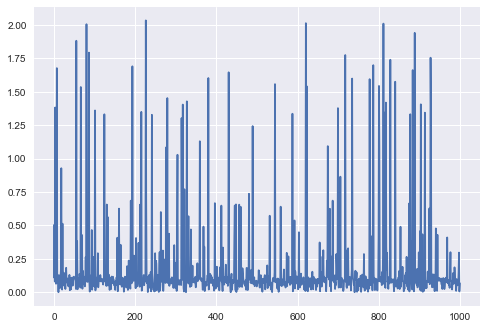

In [161]:
plt.plot(diferenca)

## MAP

In [164]:
# repete = 200;
# nA = 25;

# repete = 1;
# nA = 50;

repete = 2;
nA = len(alunos);

nQ = len(param.iloc[0:45,1]);
maxnQ = min(45,nQ);

# Maximum Likelihood Parameters 

rateGrow = 0.25;
maxGrow = 2;

estimator = 2
estName = ['EAP','MAP','ML']
base = 1
# baseName = ['norm','uni','peak']
shift = 1

nSC = 6;

# thetasA = np.random.randn(nA)
thetasA = theta_original

As = param.iloc[0:45,1].to_numpy()
Bs = param.iloc[0:45,2].to_numpy()
Cs = param.iloc[0:45,3].to_numpy()
D = np.array(1,ndmin=1)

thetasB = np.arange(-4,4,0.001)
nB = len(thetasB)

blf0 =  norm.pdf(thetasB)
blf0 = blf0/np.sum(blf0)

probsB = np.zeros((nQ,nB))
probsA = np.zeros((nQ,nA))
infos = np.zeros((nQ,nB))


for q in np.arange(0,nQ):
    probsA[q,:] = (Cs[q] + (1-Cs[q])/( 1 + np.exp(-D*As[q]*( thetasA - Bs[q]  ) )   ))
    probsB[q,:] = (Cs[q] + (1-Cs[q])/( 1 + np.exp(-D*As[q]*( thetasB - Bs[q]  ) )   ))
    infos[q,:] =  ((1-Cs[q])*D*As[q]*np.exp(-D*As[q]*( thetasB - Bs[q]  ) )/ (1 + np.exp(-D * As[q] * ( thetasB - Bs[q]  ) ))**2 )**2/( probsB[q,:]*(1-probsB[q,:]) )
    infos[q,:] =  info_fisher(As[q],Bs[q],Cs[q],D,thetasB)


logprobsB = np.log(probsB);
log1_probsB = np.log(1-probsB);

In [167]:
globalMSE = []
globalthetaB = []
for sc in range(0,nSC):
  globalMSE.append([])
  globalthetaB.append([])

globalthetasA = []

# respA = probsA > np.random.rand(nQ,nA)
respA = (alunos.iloc[:,0:45].to_numpy()).T

thetaB = np.zeros((nA,maxnQ+1))
    
infosTotal = np.zeros((nQ,len(thetasB)));

for q in range(0,nQ):
    infosTotal[q,:] = info_fisher(As[q],Bs[q],Cs[q],D,thetasB);

for sc in range(0,nSC):
  
  print(sc)
  for a in range(0,nA):

    if np.remainder(a+1,100) == 0:
        print(sc,a/nA)

    blf = blf0
    applied = np.zeros(nQ)

    for q in np.arange(0,maxnQ):

      if estimator == 1:
        # EAP
        T = np.sum(blf*thetasB)
      elif estimator == 2:
        # MAP
        aux = np.argmax(blf)
        T = thetasB[aux]
      elif estimator == 3:
        # ML
        if q>0:
          qs = np.flatnonzero(np.isinf(applied))
          if np.min(  respA[qs, a] == 0 ):     # min (python) = all (matlab)
            T = np.max([-maxGrow,-len(qs)*rateGrow])
          elif np.min(  respA[qs, a] == 1 ):
            T = np.min([maxGrow,len(qs)*rateGrow])
          else:
            aux = np.argmax(blf/blf0)
            T = thetasB[aux]
        else:
          T = 0

      if sc == 0:
        inicio = time.time()
        
        I = info_fisher(As,Bs,Cs,D,T)
        vv = np.max(I+applied)
        qq = np.argmax(I+applied)
        
        fim = time.time()
        print(fim - inicio)
        
      elif sc == 1:
        inicio = time.time()
        
        aux = np.flatnonzero(applied==0)
        qq = aux[np.random.randint(len(aux))]

        fim = time.time()
        print(fim - inicio)
        
      elif sc == 2:
        inicio = time.time()
        
        kl = KLP(blf/blf0,thetasB,probsB,logprobsB,log1_probsB,T)
        vv = np.max(kl+applied)
        qq = np.argmax(kl+applied)
        
        fim = time.time()
        print(fim - inicio)

      elif sc == 3:
        inicio = time.time()
        
        klp = KLP(blf,thetasB,probsB,logprobsB,log1_probsB,T)
        vv = np.max(klp+applied)
        qq = np.argmax(klp+applied)
        
        fim = time.time()
        print(fim - inicio)

      elif sc == 4:
        inicio = time.time()
        
        mlwi = (blf/blf0)@infosTotal.T
        vv = np.max(mlwi+applied)
        qq = np.argmax(mlwi+applied)

        fim = time.time()
        print(fim - inicio)
        
      elif sc == 5:
        inicio = time.time()
        
        mpwi = blf@infosTotal.T
        vv = np.max(mpwi+applied)
        qq = np.argmax(mpwi+applied)

        fim = time.time()
        print(fim - inicio)
        
      # elif sc == 6:
#         inicio = time.time()
    
        # er = ExpRed(blf,thetasB,probsB)
        # vv = np.max(er+applied)
        # qq = np.argmax(er+applied)
        
#         fim = time.time()
#         print(fim - inicio)

      if respA[qq,a] == 1:
          blf = blf*probsB[qq,:]
      else:
          blf = blf*(1-probsB[qq,:])

      blf = blf/sum(blf);
      thetaB[a,q] = T;
      applied[qq] = -np.inf;

    if estimator == 1:
      # EAP
      T = np.sum(blf*thetasB)
    elif estimator == 2:
      # MAP
      aux = np.argmax(blf)
      T = thetasB[aux]
    elif estimator == 3:
      # ML
      if q>0:
        qs = np.flatnonzero(np.isinf(applied))
        if np.min(  respA[qs, a] == 0 ):     # min (python) = all (matlab)
          T = np.max([-maxGrow,-len(qs)*rateGrow])
        elif np.min(  respA[qs, a] == 1 ):
          T = np.min([maxGrow,len(qs)*rateGrow])
        else:
          aux = np.argmax(blf/blf0)
          T = thetasB[aux]
      else:
        T = 0
          
    thetaB[a,q+1] = T

  MSE = (thetaB-np.tile(thetasA,(maxnQ+1,1)).T)**2
  globalMSE[sc].append(MSE)
  globalthetaB[sc].append(thetaB)
  globalthetasA.append(thetasA)

0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009975433349609375
0.000986337661743164
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.000988006591796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009634494781494141
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010306835174560547
0.0009975433349609375
0.0
0.0009846687316894531
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0010023117065429688
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0009980201721191406
0.0009965896606445312
0.0
0.0
0.0009899139404296875
0.0
0.0
0.0
0.0
0.0
0.0
0.0010175704956054688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010221004486083984
0.0009865760803222656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0009870529174804688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009834766387939453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0020263195037841797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0009963512

0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009772777557373047
0.0
0.0010197162628173828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010318756103515625
0.0
0.0
0.001028299331665039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009572505950927734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.001020669937133789
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0

0.0
0.0
0.0010144710540771484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009911060333251953
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010230541229248047
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009629726409912109
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010228157043457031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010361671447753906
0.0
0.0
0.0
0.0
0.001020193099975586
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009875297546386719
0.0009961128234863281
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001035451889038086
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0009987354278564453
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009584426879882812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009629726409912109
0.0
0.0
0.0009882450103759766
0.0
0.001035451889038086
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0009927749633789062
0.0
0.0
0.0
0.0
0.0009706020355224609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010297298431396484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010285377502441406
0.0
0.0
0.0010170936584472656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010180473327636719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010459423065185547
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009725093841552734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010085105895996094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102686882

0.0
0.0
0.0
0.0
0.0
0.0
0.0009667873382568359
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010151863098144531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010075569152832031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010330677032470703
0.0
0.001027822494506836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102996826171875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0009560585021972656
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009808540344238281
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0009963512420654297
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0009930133819580078
0.0
0.0
0.0010368824005126953
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009684562683105469
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0009970664978027344
0.0
0.0009965896606445312
0.0
0.000989675521850586
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010328292846679688
0.0009937286376953125
0.0009827613830566406
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0009801387786865234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00103759765625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010232925415039062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0010159015655517578
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000962257385253

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009911060333251953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010209083557128906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001027822494506836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099

0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0010302066802978516
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0010006427764892578
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.000997543334960

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009655952453613281
0.0010159015655517578
0.0010132789611816406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000986337661743164
0.0010154247283935547
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0010142326354980469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010175704956054688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0010254383087158203
0.0
0.0010366439819335938
0.0009894371032714844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010139942169189453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010378360748291016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001010894775390625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001033782958984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.001031637191772461
0.0
0.0
0.0
0.0009953975677490234
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001016855239868164
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010287761688232422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010209083557128906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010302066802978516
0.0010027885437011719
0.0009877681732177734
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0010149478912353516
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010342597961425781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009734630584716797
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010221004486083984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.000997304916381836
0.0009856224060058594
0.0
0.0
0.0009522438049316406
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010182857513427734
0.0010066032409667969
0.0009763240814208984
0.001016378402709961
0.000989675521850586
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009734630584716797
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0010190010070800781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009634494781494141
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010292530059814453
0.0009682178497314453
0.0
0.0010168552398681

0.0
0.0
0.0
0.0
0.0
0.0010373592376708984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010390281677246094
0.0
0.0
0.0
0.0
0.0
0.0
0.00102996826171875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010249614715576172
0.0
0.001035451889038086
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0
0.0
0.0
0.0009682178497314453
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0009660720825195312
0.0
0.0
0.0010304450988769531
0.0
0.0
0.0
0.0009965896606445312
0.0010151863098144531
0.0009810924530029297
0.000997781753540039
0.0009965896606445312
0.0
0.0
0.0
0.0009963512420654297
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010209083557128906
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.001031637191772461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0010268688201904297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010344982147216797
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0

0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.00096893310546875
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001010894775390625
0.0009975433349609375
0.0009846687316894531
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.001013040542602539
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010178089141845703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010313987731933594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0010387897491455078
0.0009834766387939453

0.0009622573852539062
0.0
0.0
0.0
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010352134704589844
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010154247283935547
0.0
0.0
0.0
0.0
0.0010492801666259766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009710788726806641
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0010221004486083984
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0009989738464355469
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009713172912597656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010221004486083984
0.0
0.0
0.0
0.0
0.0
0.0010149478912353516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009586811065673828
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009992122650146484


0.0009968280792236328
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001035451889038086
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009772777557373047
0.0
0.001027822494506836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010085105895996094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0010018348693847656
0.001

0.0
0.0009982585906982422
0.0010292530059814453
0.0010023117065429688
0.0
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001020669937133789
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010311603546142578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0010311603546142578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009703636169433594
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001022338867187

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010461807250976562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102996826171875
0.0
0.001049041748046875
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00102925300

0.0010247230529785156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010302066802978516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009567737579345703
0.0
0.0009963512420654297
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010209083557128906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.00103759765625
0.0
0.0
0.0


0.0
0.0
0.0
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009603500366210938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.0
0.001007080078125
0.0
0.0
0.0
0.0009725093841552734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009849071502685547
0.0
0.0
0.0
0.0
0.000988006591796875
0.0009891986846923828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009815692901611328
0.0
0.0
0.0
0.0
0.0
0.000978231430053711
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009829998016357422
0.0
0.0
0.0009677410125732422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009925365447998047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009818077087402344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1 0.099
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009894371032714844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009815692901611328
0.0
0.0
0.0
0.000980377197265625
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0009865760803222656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009768009185791016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0009846687316894531
0.0009710788726806641
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009872913360595703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009903907775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000986337661743164
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.00099968910217285

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009789466857910156
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0009965896606445312
0.0
0.0
0.0
0.000957489013671875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009810924530029297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009789466857910156
0.0
0.0
0.0
0.0009846687316894531
0.0
0.0
0.0
0.0
0.0
0.0009810924530029297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009765625
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009887218475341797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000963211059570312

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00103759765625
0.0
0.0
0.0
0.0009832382202148438
0.0009717941284179688
0.0
0.0
0.0
0.0
0.0
0.0
0.0009567737579345703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001005411148071289
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00098

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009596347808837891
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.000982522964477539
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009851455688476562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009667873382568359
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009748935699462891
0.0009827613830566406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009808540344238281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010380744934082031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009889602661132812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001013040542602539
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009849071502685547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001027822494506836
0.0
0.0009789466857910156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0009860992431640625
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.001005411148071289
0.0
0.0
0.0
0.0009572505950927734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0009551048278808594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009794235229492188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009813308715820312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009744167327880859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009810924530029297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0009772777557373047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0009865760803222656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000982046127319336
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010068416595458984
0.0
0.0
0.0
0.0
0.0
0.0
0.0010404586791992188
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0009949207305908203
0.0
0.0
0.0
0.0010328292846679688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001004934310913086

0.0
0.0
0.0
0.0
0.0009644031524658203
0.0010225772857666016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009856224060058594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010254383087158203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001035928726196289
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000990152359008789
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009860992431640625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00

0.0
0.0
0.0009703636169433594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009832382202148438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009887218475341797
0.0
0.0
0.0
0.0009684562683105469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009920597076416016
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009818077087402344
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0009768009185791016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009524822235107422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010347366333007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010526180267333984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009624958038330078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010387897491455078
0.0
0.0
0.0
0.0
0.0
0.0
0.001012563705444336
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009756088256835938
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009808540344238281
0.0009770393371582031
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009891986846923828
0.0
0.0
0.0
0.0
0.0
0.0
0.0009903907775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.000982522964477539
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009710788726806641
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009903907775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009796619415283203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009770393371582031
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009915828704833984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009577274322509766
0.0
0.0
0.0
0.000980377197265625
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1 0.599
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0009894371032714844
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009829998016357422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009806156158447266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00098419189453125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010311603546142578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009822845458984375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001024007797241211
0.0009765625
0.0
0.0
0.0
0.0
0.0
0.0
0.0009760856628417969
0.0009796619415283203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000978708267211914
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010056495666503906
0.0
0.0
0.0
0.0
0.0
0.0010263919830322266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009646415710449219
0.0
0.0010166168212890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009815692901611328
0.0
0.0
0.0
0.0
0.0
0.0009753704071044922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000972747802734375
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009870529174804688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009706020355224609
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009834766387939453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000982046127319336
0.0
0.0
0.0
0.0
0.0
0.0009860992431640625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009698867797851562
0.0009860992431640625
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009927749633789062
0.0009646415710449219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009582042694091797
0.0
0.0
0.0
0.0
0.001056671142578125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009598731994628

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001032114028930664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009546279907226562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009844303131103516
0.0
0.0
0.0009889602661132812
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010089874267578125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010073184967041016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009815692901611328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009591579437255859
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0009722709655761719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000990152359008789
0.0
0.0
0.0
0.0009694099426269531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009768009185791016
0.0
0.0
0.0
0.

0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
0.0
0.0009927749633789062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00096893310546875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0010297298431396484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009868144989013672
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0009891986846923828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000989675521850586
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009620189666748047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001039266586303711
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009610652923583984
0.0


0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010101795196533203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009906291961669922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0009701251983642578
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.

0.0
0.0
0.0
0.0009660720825195312
0.0009884834289550781
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009615421295166016
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009813308715820312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009682178497314453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009698867797851562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.018948793411254883
0.025917530059814453
0.0249330997467041
0.01994013786315918
0.016951322555541992
0.01595759391784668
0.016964435577392578
0.01595926284790039
0.014961719512939453
0.014995574951171875
0.015960693359375
0.017952919006347656
0.0249330997467041
0.030919551849365234
0.029920339584350586
0.021942615509033203
0.022938966751098633
0.016956567764282227
0.017952919006347656
0.01695537567138672
0.030915021896362305
0.017951488494873047
0.016954660415649414
0.01695561408996582
0.01994609832763672
0.017990589141845703
0.016920804977416992
0.029877901077270508
0.030918359756469727
0.02792525291442871
0.020938634872436523
0.01894974708557129
0.01692676544189453
0.01694965362548828
0.01698923110961914
0.017941951751708984
0.017845869064331055
0.01798105239868164
0.017920494079589844
0.016987323760986328
0.018912315368652344
0.024932861328125
0.032868146896362305
0.028911590576171875
0.026934146881103516
0.01994609832763672
0.020943880081176758
0.018949508666992188
0.0159592628479

0.01891636848449707
0.02194046974182129
0.018949508666992188
0.016988515853881836
0.016953468322753906
0.0176389217376709
0.016954421997070312
0.01794910430908203
0.01795172691345215
0.017950057983398438
0.01695561408996582
0.0189206600189209
0.017953872680664062
0.01798248291015625
0.02090764045715332
0.019913434982299805
0.01632857322692871
0.014960289001464844
0.015957355499267578
0.01499485969543457
0.016951799392700195
0.01698923110961914
0.01794910430908203
0.016957521438598633
0.01683521270751953
0.016957759857177734
0.01691913604736328
0.020941495895385742
0.0169525146484375
0.01695418357849121
0.016952037811279297
0.020979642868041992
0.01932692527770996
0.020978212356567383
0.018948793411254883
0.016954898834228516
0.02094292640686035
0.01795196533203125
0.017955303192138672
0.016954421997070312
0.016988754272460938
0.016777992248535156
0.01791834831237793
0.018949508666992188
0.022938251495361328
0.01695418357849121
0.022044658660888672
0.018945932388305664
0.021942853927612

0.02293848991394043
0.02492833137512207
0.025931358337402344
0.022943735122680664
0.019940853118896484
0.024936199188232422
0.023934602737426758
0.0299222469329834
0.04188132286071777
0.025931119918823242
0.024933815002441406
0.022967100143432617
0.035898685455322266
0.03191423416137695
0.04488015174865723
0.02692890167236328
0.021950483322143555
0.021941423416137695
0.019946575164794922
0.022944927215576172
0.02193903923034668
0.02094578742980957
0.022904396057128906
0.023937225341796875
0.018938541412353516
0.018947839736938477
0.02194380760192871
0.018949508666992188
0.01795220375061035
0.01894974708557129
0.022937774658203125
0.02593684196472168
0.02094292640686035
0.021942853927612305
0.023934364318847656
0.02094268798828125
0.02293705940246582
0.01994609832763672
0.01994633674621582
0.018983125686645508
0.023930788040161133
0.020926952362060547
0.028935670852661133
0.022904634475708008
0.025920629501342773
0.024933815002441406
0.021938323974609375
0.027927398681640625
0.029921531

0.016950607299804688
0.016989707946777344
0.016919374465942383
0.01695418357849121
0.016953706741333008
0.016988039016723633
0.017951250076293945
0.01855158805847168
0.018434762954711914
0.01695537567138672
0.016954660415649414
0.01695704460144043
0.016922950744628906
0.016991138458251953
0.016956329345703125
0.016954660415649414
0.017694711685180664
0.017952680587768555
0.016954421997070312
0.016988039016723633
0.01691460609436035
0.01695084571838379
0.0179135799407959
0.017951488494873047
0.016952991485595703
0.016955137252807617
0.01695418357849121
0.016954421997070312
0.01695394515991211
0.02294015884399414
0.02293992042541504
0.026928424835205078
0.0189511775970459
0.023936033248901367
0.02493453025817871
0.023937463760375977
0.02593255043029785
0.025930404663085938
0.020943641662597656
0.01794147491455078
0.01695418357849121
0.0249330997467041
0.01994466781616211
0.01795172691345215
0.017952680587768555
0.014960289001464844
0.01696181297302246
0.01898336410522461
0.01795291900634

0.01695561408996582
0.016955137252807617
0.015956878662109375
0.01795172691345215
0.016987323760986328
0.018983840942382812
0.016989946365356445
0.018583059310913086
0.017952680587768555
0.016953706741333008
0.01695418357849121
0.017951250076293945
0.016957998275756836
0.016791582107543945
0.01695418357849121
0.016954421997070312
0.017952442169189453
0.016954660415649414
0.016810894012451172
0.017951488494873047
0.01795339584350586
0.014958620071411133
0.015936613082885742
0.01582169532775879
0.016956567764282227
0.017951488494873047
0.017209768295288086
0.016954660415649414
0.017292022705078125
0.01805424690246582
0.01831531524658203
0.01798534393310547
0.01795482635498047
0.021942615509033203
0.017951488494873047
0.016953706741333008
0.01795220375061035
0.01695418357849121
0.015958786010742188
0.016954421997070312
0.017988204956054688
0.017952919006347656
0.017915010452270508
0.01798701286315918
0.017920732498168945
0.017917156219482422
0.017983436584472656
0.016954421997070312
0.016

0.03789997100830078
0.03091740608215332
0.020943403244018555
0.026927947998046875
0.02094411849975586
0.018950462341308594
0.02293872833251953
0.03889608383178711
0.03989434242248535
0.034906625747680664
0.03191375732421875
0.01994633674621582
0.017952442169189453
0.017952442169189453
0.01695418357849121
0.01695537567138672
0.0179901123046875
0.020947933197021484
0.045877695083618164
0.041886091232299805
0.03490567207336426
0.021936416625976562
0.03190898895263672
0.024932146072387695
0.0249330997467041
0.028920412063598633
0.02493739128112793
0.021942853927612305
0.03793764114379883
0.03889894485473633
0.021941423416137695
0.02094554901123047
0.01994609832763672
0.020944595336914062
0.021943092346191406
0.020943403244018555
0.019946575164794922
0.029924631118774414
0.02593088150024414
0.021940946578979492
0.018950700759887695
0.019946813583374023
0.022938251495361328
0.023936986923217773
0.02293705940246582
0.022938966751098633
0.025930166244506836
0.021941661834716797
0.0269284248352

0.018950700759887695
0.016954898834228516
0.017950773239135742
0.01699090003967285
0.01695561408996582
0.01691269874572754
0.016951799392700195
0.0239717960357666
0.016921043395996094
0.0169527530670166
0.015957117080688477
0.01698899269104004
0.016919612884521484
0.01698923110961914
0.01698923110961914
0.015958309173583984
0.01687002182006836
0.016954421997070312
0.020940542221069336
0.01699042320251465
0.016956329345703125
0.01698899269104004
0.016957521438598633
0.024936437606811523
0.018948793411254883
0.01695394515991211
0.016957759857177734
0.016994237899780273
0.016945600509643555
0.017918109893798828
0.016956806182861328
0.016741275787353516
0.017983675003051758
0.017951011657714844
0.014957189559936523
0.014959573745727539
0.014960527420043945
0.014912843704223633
0.01595926284790039
0.016953468322753906
0.015956878662109375
0.016961097717285156
0.016956090927124023
0.016989469528198242
0.017948389053344727
0.01705479621887207
0.016954898834228516
0.01698613166809082
0.0169861

0.017827987670898438
0.016956806182861328
0.016986846923828125
0.016953468322753906
0.01595616340637207
0.016988515853881836
0.018944501876831055
0.01691126823425293
0.016952037811279297
0.016954421997070312
0.01695418357849121
0.01798868179321289
0.018948793411254883
0.016953706741333008
0.015957355499267578
0.014960050582885742
0.014959573745727539
0.015955448150634766
0.014960050582885742
0.01695418357849121
0.015957355499267578
0.015956878662109375
0.01695394515991211
0.017952919006347656
0.01695394515991211
0.016994714736938477
0.016954421997070312
0.025931119918823242
0.016988754272460938
0.01695394515991211
0.017950773239135742
0.017989158630371094
0.016948938369750977
0.01795339584350586
0.017269372940063477
0.016957998275756836
0.015958309173583984
0.01684260368347168
0.01695418357849121
0.016989707946777344
0.017815351486206055
0.01595783233642578
0.016954421997070312
0.01795196533203125
0.02493119239807129
0.020975112915039062
0.016641616821289062
0.016916513442993164
0.0169

0.018948793411254883
0.017954587936401367
0.016673564910888672
0.01698923110961914
0.015918493270874023
0.01691150665283203
0.02297353744506836
0.016957759857177734
0.01761341094970703
0.017152786254882812
0.016957759857177734
0.017986297607421875
0.01695728302001953
0.016956329345703125
0.015957117080688477
0.01695394515991211
0.01695418357849121
0.01695728302001953
0.016956090927124023
0.017949819564819336
0.016954421997070312
0.016954660415649414
0.0179903507232666
0.016915321350097656
0.016989469528198242
0.016919612884521484
0.01695418357849121
0.016954660415649414
0.01695394515991211
0.016959190368652344
0.016989469528198242
0.016922473907470703
0.018949270248413086
0.01894974708557129
0.014964103698730469
0.014996528625488281
0.015956640243530273
0.014993667602539062
0.014959096908569336
0.015959739685058594
0.0159909725189209
0.015952587127685547
0.01738286018371582
0.016954898834228516
0.017984867095947266
0.01722097396850586
0.01741790771484375
0.01695418357849121
0.017269849

0.016950130462646484
0.016953229904174805
0.01995563507080078
0.02293705940246582
0.020945310592651367
0.018937349319458008
0.01695537567138672
0.01595783233642578
0.014958620071411133
0.014960765838623047
0.015956878662109375
0.015956640243530273
0.01695561408996582
0.01699090003967285
0.017976999282836914
0.016950368881225586
0.016953706741333008
0.016988515853881836
0.016953229904174805
0.016958236694335938
0.016921520233154297
0.01595473289489746
0.0169219970703125
0.01695394515991211
0.01695394515991211
0.017986774444580078
0.0169522762298584
0.016947269439697266
0.020908832550048828
0.0178375244140625
0.016988277435302734
0.016954898834228516
0.01792168617248535
0.0169522762298584
0.01695394515991211
0.016956806182861328
0.015958309173583984
0.016948938369750977
0.016919851303100586
0.016955852508544922
0.01698780059814453
0.017371177673339844
0.01795172691345215
0.017975807189941406
0.016918659210205078
0.01695561408996582
0.0169222354888916
0.015957117080688477
0.01595926284790

0.017951488494873047
0.016909360885620117
0.016989469528198242
0.016985177993774414
0.0159151554107666
0.015956878662109375
0.01659369468688965
0.017949819564819336
0.01795172691345215
0.01791238784790039
0.018950223922729492
0.018946170806884766
0.01795363426208496
0.018588781356811523
0.016957759857177734
0.017990589141845703
0.016911745071411133
0.017986774444580078
0.017918109893798828
0.01997995376586914
0.017918109893798828
0.01795220375061035
0.0189516544342041
0.01790785789489746
0.017951250076293945
0.017952442169189453
0.01791238784790039
0.021944046020507812
0.017560243606567383
0.01904463768005371
0.01795220375061035
0.01798558235168457
0.017949342727661133
0.021941661834716797
0.020944833755493164
0.017981767654418945
0.014953851699829102
0.015921354293823242
0.01997971534729004
0.017947912216186523
0.015958786010742188
0.015956878662109375
0.021950483322143555
0.01894855499267578
0.016951799392700195
0.01695561408996582
0.01841592788696289
0.016953706741333008
0.018020391

0.017952442169189453
0.014995574951171875
0.01509237289428711
0.01499485969543457
0.0159909725189209
0.01594996452331543
0.015924930572509766
0.018915653228759766
0.019948482513427734
0.017951250076293945
0.022937774658203125
0.018915653228759766
0.019982337951660156
0.022925615310668945
0.020946741104125977
0.020944833755493164
0.019980907440185547
0.021943092346191406
0.021906137466430664
0.01894831657409668
0.01798701286315918
0.022903919219970703
0.01792001724243164
0.01798248291015625
0.017986536026000977
0.017951011657714844
0.01795172691345215
0.017955541610717773
0.018979549407958984
0.017996788024902344
0.017951250076293945
0.017952442169189453
0.018951416015625
0.01875758171081543
0.01791667938232422
0.017986536026000977
0.019980192184448242
0.018908262252807617
0.01794123649597168
0.020944595336914062
0.02090287208557129
0.01823735237121582
0.017949342727661133
0.017170190811157227
0.018982887268066406
0.01795339584350586
0.01798415184020996
0.017920732498168945
0.0189850330

0.020946502685546875
0.021942615509033203
0.022937536239624023
0.01894998550415039
0.01795053482055664
0.017956256866455078
0.018948793411254883
0.01894521713256836
0.01695108413696289
0.021940231323242188
0.018951416015625
0.017461299896240234
0.016956567764282227
0.01695418357849121
0.017951250076293945
0.020944833755493164
0.01894998550415039
0.01795220375061035
0.016916990280151367
0.016955137252807617
0.016989707946777344
0.017954349517822266
0.017985820770263672
0.017908096313476562
0.01795482635498047
0.01695537567138672
0.01698756217956543
0.01692366600036621
0.016988277435302734
0.01791834831237793
0.021929264068603516
0.01991128921508789
0.017917156219482422
0.01964735984802246
0.01795196533203125
0.018949031829833984
0.016954421997070312
0.016954421997070312
0.01695704460144043
0.018949031829833984
0.018950462341308594
0.020942211151123047
0.017952442169189453
0.018949508666992188
0.016956329345703125
0.01795339584350586
0.016953229904174805
0.02892279624938965
0.03490734100

0.018949508666992188
0.023934602737426758
0.017947673797607422
0.016954660415649414
0.016954421997070312
0.017951488494873047
0.015957355499267578
0.02095770835876465
0.017985820770263672
0.01994800567626953
0.020911216735839844
0.022939443588256836
0.020975828170776367
0.01894974708557129
0.018950700759887695
0.02194523811340332
0.021968364715576172
0.03191566467285156
0.06382870674133301
0.02991938591003418
0.032914161682128906
0.0329136848449707
0.029918432235717773
0.026927947998046875
0.016956567764282227
0.01994633674621582
0.022934675216674805
0.019945859909057617
0.018950223922729492
0.02094411849975586
0.020943164825439453
0.016989946365356445
0.016954421997070312
0.016953468322753906
0.017984390258789062
0.01664137840270996
0.01691913604736328
0.019947052001953125
0.016954421997070312
0.016954421997070312
0.015950679779052734
0.016955137252807617
0.018984556198120117
0.01956963539123535
0.016954898834228516
0.017987489700317383
0.016911745071411133
0.016955137252807617
0.0179

0.018949508666992188
0.016951560974121094
0.01795196533203125
0.01695418357849121
0.016954421997070312
0.016950607299804688
0.017951488494873047
0.01795220375061035
0.017951250076293945
0.016956567764282227
0.01695561408996582
0.01695418357849121
0.01795172691345215
0.01695418357849121
0.016954421997070312
0.016954898834228516
0.01695561408996582
0.016954660415649414
0.01696181297302246
0.016913175582885742
0.01994800567626953
0.0159909725189209
0.014950275421142578
0.01591968536376953
0.01698756217956543
0.016955852508544922
0.016991615295410156
0.016956806182861328
0.015956878662109375
0.016988039016723633
0.017597675323486328
0.016990184783935547
0.017391204833984375
0.01698780059814453
0.018916606903076172
0.017915964126586914
0.016954898834228516
0.016946792602539062
0.015918731689453125
0.016957521438598633
0.01695418357849121
0.017919063568115234
0.020555734634399414
0.017076492309570312
0.016988754272460938
0.01695537567138672
0.017952919006347656
0.016919851303100586
0.0189502

0.03590273857116699
0.01795220375061035
0.016955137252807617
0.016955137252807617
0.016954421997070312
0.01795196533203125
0.016947269439697266
0.020949840545654297
0.01591777801513672
0.01591658592224121
0.015917062759399414
0.01795053482055664
0.01591801643371582
0.0169830322265625
0.016954660415649414
0.016954421997070312
0.016989707946777344
0.021944046020507812
0.015958547592163086
0.016913175582885742
0.01798558235168457
0.016954421997070312
0.01695108413696289
0.01798391342163086
0.01691603660583496
0.016992568969726562
0.016956329345703125
0.01595902442932129
0.015958786010742188
0.016953229904174805
0.0169522762298584
0.01894998550415039
0.017982959747314453
0.0179903507232666
0.017896175384521484
0.01695418357849121
0.015958786010742188
0.016915321350097656
0.016954898834228516
0.01695418357849121
0.015917539596557617
0.01790904998779297
0.01994609832763672
0.01894855499267578
0.016956329345703125
0.014958620071411133
0.015958547592163086
0.014961481094360352
0.01495981216430

0.015958309173583984
0.017953872680664062
0.015956878662109375
0.01695418357849121
0.015956640243530273
0.01595783233642578
0.018949031829833984
0.01995229721069336
0.024935483932495117
0.020938634872436523
0.019946575164794922
0.02094292640686035
0.027927160263061523
0.026927471160888672
0.017946720123291016
0.01695537567138672
0.01695418357849121
0.01695537567138672
0.01994609832763672
0.016954660415649414
0.016954660415649414
0.01695418357849121
0.017951011657714844
0.01799607276916504
0.0169527530670166
0.02197551727294922
0.017986297607421875
0.01795196533203125
0.017986774444580078
0.016947031021118164
0.017950057983398438
0.016919851303100586
0.017952442169189453
0.017984867095947266
0.016953229904174805
0.017952919006347656
0.0169827938079834
0.016911745071411133
0.0199434757232666
0.01695418357849121
0.017951011657714844
0.017951250076293945
0.017951011657714844
0.017951250076293945
0.016987085342407227
0.01695394515991211
0.02094578742980957
0.019907236099243164
0.01695322990

0.017951011657714844
0.016988754272460938
0.01794147491455078
0.01795172691345215
0.017951488494873047
0.01692056655883789
0.01704239845275879
0.01695418357849121
0.016992807388305664
0.016953468322753906
0.016954421997070312
0.01695418357849121
0.017952919006347656
0.016955137252807617
0.017971038818359375
0.018949270248413086
0.017951488494873047
0.01695394515991211
0.014959573745727539
0.014993906021118164
0.01592230796813965
0.014960527420043945
0.014952421188354492
0.014963388442993164
0.014959573745727539
0.014960289001464844
0.01694631576538086
0.016950607299804688
0.016956090927124023
0.01699042320251465
0.017555713653564453
0.017168283462524414
0.016989707946777344
0.016953468322753906
0.017951488494873047
0.01695418357849121
0.01695418357849121
0.017051219940185547
0.02094292640686035
0.016988515853881836
0.0169527530670166
0.017985105514526367
0.016918182373046875
0.01695394515991211
0.01795172691345215
0.017985105514526367
0.01695728302001953
0.019948959350585938
0.01795148

0.01791834831237793
0.01695418357849121
0.016988277435302734
0.01595163345336914
0.016817092895507812
0.017032146453857422
0.016956090927124023
0.016954421997070312
0.017989158630371094
0.01795172691345215
0.017950057983398438
0.01795172691345215
0.017953872680664062
0.01795482635498047
0.016957759857177734
0.015957117080688477
0.015957117080688477
0.01695394515991211
0.016989707946777344
0.0169222354888916
0.016988754272460938
0.016988754272460938
0.015960693359375
0.01698780059814453
0.021895885467529297
0.01913905143737793
0.017951488494873047
0.01695394515991211
0.021941661834716797
0.0239410400390625
0.0169525146484375
0.016956329345703125
0.0169525146484375
0.01695537567138672
0.016991853713989258
0.017949342727661133
0.0159914493560791
0.016956090927124023
0.017037391662597656
0.016954421997070312
0.01699042320251465
0.016988039016723633
0.0169522762298584
0.016953468322753906
0.016954421997070312
0.016953706741333008
0.01695418357849121
0.01595783233642578
0.015990495681762695


0.016953468322753906
0.0169527530670166
0.016954421997070312
0.017988920211791992
0.016956806182861328
0.017916440963745117
0.016955137252807617
0.017926454544067383
0.016954660415649414
0.018011093139648438
0.017949342727661133
0.0188748836517334
0.016954421997070312
0.01695561408996582
0.016957521438598633
0.017952919006347656
0.017777442932128906
0.01695537567138672
0.016987085342407227
0.01801919937133789
0.016955852508544922
0.01795363426208496
0.01792001724243164
0.018949270248413086
0.01795363426208496
0.016988515853881836
0.016956329345703125
0.0175323486328125
0.016953468322753906
0.016954421997070312
0.01695537567138672
0.017918109893798828
0.017917156219482422
0.018981456756591797
0.016913414001464844
0.0169525146484375
0.01594996452331543
0.018907546997070312
0.01994943618774414
0.017951250076293945
0.014958381652832031
0.015993356704711914
0.01695561408996582
0.016991138458251953
0.018948793411254883
0.017952442169189453
0.018949270248413086
0.015956640243530273
0.01695489

0.01795172691345215
0.017545461654663086
0.016989946365356445
0.017840147018432617
0.01695394515991211
0.016955137252807617
0.015917062759399414
0.016954660415649414
0.01695418357849121
0.016988277435302734
0.016957759857177734
0.01695418357849121
0.016951560974121094
0.016995668411254883
0.016956806182861328
0.016954421997070312
0.016986846923828125
0.017989397048950195
0.01681375503540039
0.01695418357849121
0.016954660415649414
0.016953468322753906
0.01696014404296875
0.01596236228942871
0.016913414001464844
0.017836570739746094
0.016954660415649414
0.016980648040771484
0.017118215560913086
0.016989946365356445
0.01695561408996582
0.01795482635498047
0.017983198165893555
0.016953468322753906
0.018908023834228516
0.017952680587768555
0.020944833755493164
0.018947124481201172
0.01794910430908203
0.013923406600952148
0.015967369079589844
0.0169222354888916
0.017953872680664062
0.016987323760986328
0.016957521438598633
0.0159909725189209
0.014928340911865234
0.016954660415649414
0.01691

0.01994800567626953
0.027924060821533203
0.03191399574279785
0.02892327308654785
0.02892160415649414
0.04687666893005371
0.023936748504638672
0.024933576583862305
0.019947052001953125
0.025930166244506836
0.020944595336914062
0.03091883659362793
0.020943641662597656
0.038897037506103516
0.027925729751586914
0.027925729751586914
0.02294754981994629
0.02293848991394043
0.02393937110900879
0.021941423416137695
0.02094411849975586
0.024930477142333984
0.022941112518310547
0.022939205169677734
0.023936033248901367
0.022938013076782227
0.023936033248901367
0.022938013076782227
0.023936748504638672
0.025931835174560547
0.02593088150024414
0.02493453025817871
0.021946191787719727
0.02393651008605957
0.02393627166748047
0.022931814193725586
0.021942853927612305
0.023934602737426758
0.02194046974182129
0.02493453025817871
0.0249330997467041
0.02493572235107422
0.029921293258666992
0.027920246124267578
0.02891707420349121
0.026931285858154297
0.025923967361450195
0.03292417526245117
0.02393555641

0.022942066192626953
0.024929285049438477
0.019947290420532227
0.018948793411254883
0.023935317993164062
0.01894974708557129
0.02593255043029785
0.01795196533203125
0.018948793411254883
0.01994776725769043
0.02194046974182129
0.018949508666992188
0.01894855499267578
0.01795172691345215
0.017952919006347656
0.0189511775970459
0.018949270248413086
0.01795220375061035
0.015958070755004883
0.01796126365661621
0.015958547592163086
0.019914865493774414
0.017230510711669922
0.016991376876831055
0.017955303192138672
0.017951488494873047
0.01798558235168457
0.017955303192138672
0.017909765243530273
0.0199429988861084
0.017953157424926758
0.01698780059814453
0.017951011657714844
0.01795220375061035
0.01695394515991211
0.02194070816040039
0.02094578742980957
0.01994609832763672
0.022939443588256836
0.020951509475708008
0.014959096908569336
0.01595592498779297
0.015959501266479492
0.01495981216430664
0.014961004257202148
0.015958786010742188
0.015991926193237305
0.016916275024414062
0.021941423416

0.01991438865661621
0.020978927612304688
0.01894855499267578
0.019948482513427734
0.01798725128173828
0.015958786010742188
0.014937639236450195
0.014961719512939453
0.016955137252807617
0.014958620071411133
0.01715826988220215
0.015498161315917969
0.01595783233642578
0.014958858489990234
0.015958786010742188
0.01695394515991211
0.016953706741333008
0.015956878662109375
0.016170501708984375
0.015958547592163086
0.01695704460144043
0.016921043395996094
0.01695394515991211
0.01817464828491211
0.01695537567138672
0.015958786010742188
0.01699066162109375
0.016921520233154297
0.017160654067993164
0.016989469528198242
0.01695418357849121
0.016989469528198242
0.01692056655883789
0.016954421997070312
0.016990184783935547
0.016957521438598633
0.016989707946777344
0.016988515853881836
0.016991138458251953
0.017951250076293945
0.016678571701049805
0.016956329345703125
0.016989707946777344
0.01691913604736328
0.016988515853881836
0.016924619674682617
0.017949819564819336
0.01695394515991211
0.01695

0.01698923110961914
0.016908645629882812
0.017986536026000977
0.017954587936401367
0.016990184783935547
0.01691913604736328
0.016988754272460938
0.017951488494873047
0.017955541610717773
0.017963409423828125
0.018983125686645508
0.017622709274291992
0.018386125564575195
0.016989707946777344
0.01692032814025879
0.01699042320251465
0.016965389251708984
0.026478052139282227
0.016988277435302734
0.016956090927124023
0.01795053482055664
0.021941423416137695
0.02895522117614746
0.0159912109375
0.01699209213256836
0.017949819564819336
0.0169527530670166
0.017913103103637695
0.01698756217956543
0.02293872833251953
0.025928258895874023
0.043882131576538086
0.031914472579956055
0.024932861328125
0.022938013076782227
0.021942138671875
0.020938873291015625
0.01894998550415039
0.015957355499267578
0.015958070755004883
0.01595759391784668
0.015956878662109375
0.014960765838623047
0.01496577262878418
0.01495981216430664
0.0189821720123291
0.014958381652832031
0.014919281005859375
0.01599287986755371


0.01795196533203125
0.015958309173583984
0.015991687774658203
0.0169525146484375
0.01599287986755371
0.01595139503479004
0.0159151554107666
0.016955852508544922
0.015960693359375
0.015957355499267578
0.015955448150634766
0.020943164825439453
0.019947052001953125
0.018949031829833984
0.016954898834228516
0.014960765838623047
0.014961004257202148
0.015993595123291016
0.014958620071411133
0.014920711517333984
0.014957189559936523
0.014918088912963867
0.01598978042602539
0.015950918197631836
0.015983104705810547
0.01697254180908203
0.016954421997070312
0.01595759391784668
0.018915414810180664
0.01698923110961914
0.017951488494873047
0.016956329345703125
0.016954660415649414
0.015957355499267578
0.015957355499267578
0.016954898834228516
0.017010927200317383
0.01695394515991211
0.01695418357849121
0.016981840133666992
0.01695704460144043
0.01731562614440918
0.016953706741333008
0.01698923110961914
0.016919374465942383
0.016954660415649414
0.01698923110961914
0.017983436584472656
0.0175230503

0.015925884246826172
0.016948461532592773
0.015956878662109375
0.01594996452331543
0.016986846923828125
0.016957521438598633
0.015921592712402344
0.015919923782348633
0.015958309173583984
0.016953706741333008
0.016956567764282227
0.016953706741333008
0.01699090003967285
0.016991853713989258
0.01698589324951172
0.015957355499267578
0.015993356704711914
0.016988039016723633
0.016988039016723633
0.0169527530670166
0.017917633056640625
0.017986774444580078
0.017952680587768555
0.016911029815673828
0.01894855499267578
0.016954660415649414
0.0169522762298584
0.016924619674682617
0.01698780059814453
0.016948938369750977
0.016956090927124023
0.016956329345703125
0.01695728302001953
0.017989397048950195
0.01692056655883789
0.016955137252807617
0.01707935333251953
0.015958070755004883
0.017910242080688477
0.01795363426208496
0.016995668411254883
0.019916534423828125
0.019978046417236328
0.01894831657409668
0.01894998550415039
0.015957355499267578
0.0159912109375
0.01495981216430664
0.01491856575

0.01699066162109375
0.016913414001464844
0.016991853713989258
0.016956090927124023
0.0169219970703125
0.017985820770263672
0.016953468322753906
0.016954421997070312
0.01692819595336914
0.016920804977416992
0.017952680587768555
0.01695394515991211
0.017987728118896484
0.016952037811279297
0.016956806182861328
0.016953706741333008
0.019913196563720703
0.018950223922729492
0.018908262252807617
0.015958309173583984
0.014919519424438477
0.0169527530670166
0.016956090927124023
0.014957904815673828
0.02297210693359375
0.014950990676879883
0.01595783233642578
0.015961408615112305
0.015935659408569336
0.016989469528198242
0.01795482635498047
0.01991581916809082
0.016953468322753906
0.01791691780090332
0.01695394515991211
0.016991615295410156
0.016955137252807617
0.016920089721679688
0.017743587493896484
0.0169527530670166
0.01695418357849121
0.016991853713989258
0.018916606903076172
0.018984079360961914
0.01695418357849121
0.015957117080688477
0.016954421997070312
0.016954421997070312
0.0169537

0.014991998672485352
0.015963315963745117
0.014957189559936523
0.014918804168701172
0.015946626663208008
0.015954971313476562
0.01595759391784668
0.016954898834228516
0.01699352264404297
0.01692056655883789
0.015990734100341797
0.016954421997070312
0.017955303192138672
0.015958309173583984
0.016954898834228516
0.01695418357849121
0.016956567764282227
0.01695418357849121
0.016954421997070312
0.01695561408996582
0.016992807388305664
0.015960693359375
0.015918493270874023
0.016986608505249023
0.017944812774658203
0.016952991485595703
0.01699209213256836
0.016956090927124023
0.01692056655883789
0.016989707946777344
0.015915870666503906
0.016942262649536133
0.015924692153930664
0.016952037811279297
0.01698470115661621
0.016955137252807617
0.016951560974121094
0.01699376106262207
0.016956090927124023
0.01694965362548828
0.016953468322753906
0.016920804977416992
0.016988277435302734
0.016954898834228516
0.0189058780670166
0.020944833755493164
0.0179598331451416
0.016956567764282227
0.01499390

0.017909765243530273
0.01595926284790039
0.015957117080688477
0.016988515853881836
0.015915632247924805
0.01795172691345215
0.01994633674621582
0.019946813583374023
0.01695394515991211
0.016956806182861328
0.016954421997070312
0.01795053482055664
0.016959667205810547
0.016922712326049805
0.016954898834228516
0.01699042320251465
0.0169527530670166
0.018914461135864258
0.02193927764892578
0.02192831039428711
0.021941661834716797
0.018909215927124023
0.017951250076293945
0.020943403244018555
0.018950223922729492
0.017950773239135742
0.01890420913696289
0.015916824340820312
0.014965057373046875
0.014956235885620117
0.01495981216430664
0.014961481094360352
0.014919281005859375
0.014928102493286133
0.014958620071411133
0.014952898025512695
0.015957355499267578
0.014918088912963867
0.01592230796813965
0.015956640243530273
0.015956878662109375
0.016951560974121094
0.017912626266479492
0.016948223114013672
0.016954898834228516
0.015993118286132812
0.01698780059814453
0.015926122665405273
0.0169

0.016993284225463867
0.01695728302001953
0.016959428787231445
0.01699090003967285
0.016920804977416992
0.01737046241760254
0.015925168991088867
0.017951011657714844
0.01994633674621582
0.018949270248413086
0.01890873908996582
0.02094125747680664
0.01495981216430664
0.015958070755004883
0.01596236228942871
0.014996051788330078
0.015488862991333008
0.014998197555541992
0.014951705932617188
0.01495671272277832
0.014917135238647461
0.016600608825683594
0.016953468322753906
0.015956640243530273
0.016953706741333008
0.01695561408996582
0.0179898738861084
0.016988754272460938
0.01694321632385254
0.01691889762878418
0.015993595123291016
0.017950057983398438
0.015914440155029297
0.016948699951171875
0.016948223114013672
0.0238955020904541
0.01694512367248535
0.01694941520690918
0.01693415641784668
0.016916751861572266
0.016988515853881836
0.01695704460144043
0.016921520233154297
0.01795172691345215
0.01695418357849121
0.017953157424926758
0.015956401824951172
0.016954421997070312
0.015991687774

0.014954328536987305
0.015956640243530273
0.014956951141357422
0.015956878662109375
0.015956878662109375
0.016956329345703125
0.015955448150634766
0.01695561408996582
0.01692032814025879
0.01594996452331543
0.01699542999267578
0.015918254852294922
0.01695394515991211
0.016954421997070312
0.01798534393310547
0.016919374465942383
0.016954421997070312
0.016954421997070312
0.016954421997070312
0.015958070755004883
0.01595759391784668
0.015918254852294922
0.017983675003051758
0.01694774627685547
0.01694941520690918
0.01592540740966797
0.0159146785736084
0.01691293716430664
0.01695418357849121
0.016915559768676758
0.01695561408996582
0.01697993278503418
0.01798844337463379
0.015918970108032227
0.016989469528198242
0.021921396255493164
0.021942138671875
0.021944284439086914
0.020941495895385742
0.01695537567138672
0.016911983489990234
0.016956329345703125
0.01698756217956543
0.019901752471923828
0.01994800567626953
0.018948793411254883
0.0179445743560791
0.014995336532592773
0.0159912109375
0

0.01795363426208496
0.016953706741333008
0.0169525146484375
0.016988039016723633
0.016909122467041016
0.016953706741333008
0.016988515853881836
0.01699066162109375
0.01699090003967285
0.016952991485595703
0.01695418357849121
0.01669168472290039
0.017727375030517578
0.0169525146484375
0.01699042320251465
0.016989469528198242
0.017986297607421875
0.016915321350097656
0.020943880081176758
0.018951892852783203
0.018946409225463867
0.01894855499267578
0.01894998550415039
0.01595759391784668
0.015920400619506836
0.01495981216430664
0.015956878662109375
0.014959573745727539
0.015991687774658203
0.014924049377441406
0.014959573745727539
0.014996767044067383
0.0159914493560791
0.01495218276977539
0.015924930572509766
0.017954111099243164
0.018952369689941406
0.02094411849975586
0.01698923110961914
0.015956640243530273
0.016954660415649414
0.016955137252807617
0.015958786010742188
0.016988515853881836
0.023929119110107422
0.01694798469543457
0.01595592498779297
0.015916109085083008
0.01595759391

0.019947052001953125
0.019947290420532227
0.018955230712890625
0.01695418357849121
0.01496124267578125
0.014920473098754883
0.014961957931518555
0.015957355499267578
0.014960289001464844
0.0159609317779541
0.014961481094360352
0.014957427978515625
0.01592421531677246
0.01595306396484375
0.01592397689819336
0.01495981216430664
0.01599264144897461
0.016920804977416992
0.016993284225463867
0.017988204956054688
0.016920804977416992
0.01699352264404297
0.016951322555541992
0.016953468322753906
0.01695394515991211
0.016954421997070312
0.016986846923828125
0.01595616340637207
0.016959190368652344
0.0168609619140625
0.016988515853881836
0.01696181297302246
0.01690983772277832
0.016955852508544922
0.016951322555541992
0.01699209213256836
0.016953706741333008
0.01695728302001953
0.016956567764282227
0.016993045806884766
0.016951560974121094
0.015992164611816406
0.0169832706451416
0.016915082931518555
0.018902301788330078
0.015914201736450195
0.016963720321655273
0.01695728302001953
0.01695537567

0.03690290451049805
0.027924299240112305
0.017951011657714844
0.018949270248413086
0.04088902473449707
0.026918411254882812
0.033913612365722656
0.018950700759887695
0.01795172691345215
0.01795363426208496
0.01695537567138672
0.016983747482299805
0.02090907096862793
0.0249330997467041
0.03789973258972168
0.02493429183959961
0.025931358337402344
0.01795172691345215
0.016955137252807617
0.017952919006347656
0.01795220375061035
0.020944595336914062
0.018950223922729492
0.01795220375061035
0.0219419002532959
0.01595616340637207
0.01595616340637207
0.015957117080688477
0.01695418357849121
0.016953706741333008
0.016954898834228516
0.017986774444580078
0.016992568969726562
0.016915321350097656
0.016988515853881836
0.016921043395996094
0.016956329345703125
0.016993045806884766
0.01792430877685547
0.01694631576538086
0.01695537567138672
0.016954660415649414
0.017953157424926758
0.01764988899230957
0.018964052200317383
0.016954421997070312
0.017987728118896484
0.016957521438598633
0.016989946365

0.017954349517822266
0.02094435691833496
0.019946813583374023
0.021945476531982422
0.04587888717651367
0.0249330997467041
0.02692890167236328
0.035904884338378906
0.03690052032470703
0.054853200912475586
0.027924537658691406
0.03390932083129883
0.0249330997467041
0.0249326229095459
0.02392721176147461
0.023936986923217773
0.02493429183959961
0.022937297821044922
0.023935317993164062
0.027924537658691406
0.028929471969604492
0.021953821182250977
0.022940397262573242
0.01994609832763672
0.019947052001953125
0.025931119918823242
0.028919696807861328
0.022938251495361328
0.025930404663085938
0.02293705940246582
0.019947290420532227
0.019945383071899414
0.02194666862487793
0.020944595336914062
0.02293872833251953
0.021941423416137695
0.02393484115600586
0.025930166244506836
0.03091907501220703
0.02892279624938965
0.03291964530944824
0.01994466781616211
0.019950389862060547
0.01695561408996582
0.017951488494873047
0.017951488494873047
0.017951250076293945
0.018136978149414062
0.0179133415222

0.019911766052246094
0.01994800567626953
0.019906044006347656
0.01894354820251465
0.01595282554626465
0.016353130340576172
0.016022920608520508
0.015954971313476562
0.01595902442932129
0.015956640243530273
0.017950773239135742
0.016988277435302734
0.015926361083984375
0.01621270179748535
0.015958786010742188
0.015956878662109375
0.01695418357849121
0.017953872680664062
0.017941951751708984
0.01695394515991211
0.01699066162109375
0.01795172691345215
0.021940231323242188
0.0219419002532959
0.01798868179321289
0.017950773239135742
0.01695394515991211
0.017951250076293945
0.016993045806884766
0.01695537567138672
0.017986774444580078
0.017948389053344727
0.016954421997070312
0.01695394515991211
0.01695418357849121
0.01795172691345215
0.015956401824951172
0.016955137252807617
0.016988515853881836
0.017984628677368164
0.016954898834228516
0.018915653228759766
0.016990184783935547
0.0179443359375
0.016954421997070312
0.016947507858276367
0.01691913604736328
0.01795339584350586
0.01795172691345

0.02194046974182129
0.021942615509033203
0.018948793411254883
0.01894855499267578
0.014960289001464844
0.014960050582885742
0.014960765838623047
0.014970064163208008
0.01499485969543457
0.014990568161010742
0.014991998672485352
0.016952991485595703
0.01891779899597168
0.028888702392578125
0.015960216522216797
0.017949342727661133
0.01795172691345215
0.016953229904174805
0.01695561408996582
0.017956018447875977
0.016946792602539062
0.016921281814575195
0.017949819564819336
0.016988515853881836
0.016953229904174805
0.016991853713989258
0.019948959350585938
0.016963481903076172
0.021974802017211914
0.02293872833251953
0.01809215545654297
0.019947290420532227
0.018949031829833984
0.017947673797607422
0.018947601318359375
0.016954660415649414
0.01795172691345215
0.016957998275756836
0.016957521438598633
0.01999187469482422
0.016955137252807617
0.01795196533203125
0.01695418357849121
0.017955780029296875
0.016953468322753906
0.01695561408996582
0.01699233055114746
0.01690959930419922
0.01694

0.016953468322753906
0.01595926284790039
0.014959573745727539
0.01496124267578125
0.015957355499267578
0.017952442169189453
0.015956401824951172
0.02393817901611328
0.0169522762298584
0.018949031829833984
0.019484519958496094
0.018984079360961914
0.01992011070251465
0.022935867309570312
0.021941423416137695
0.01994609832763672
0.02190995216369629
0.019946575164794922
0.018949031829833984
0.018945932388305664
0.01798248291015625
0.016955137252807617
0.015921831130981445
0.016954898834228516
0.016954660415649414
0.01687002182006836
0.016988754272460938
0.017990589141845703
0.016912221908569336
0.016959667205810547
0.020903825759887695
0.019651412963867188
0.019944429397583008
0.01996779441833496
0.02094411849975586
0.019947052001953125
0.023936033248901367
0.01997852325439453
0.019913673400878906
0.02593088150024414
0.023936033248901367
0.021942615509033203
0.024933576583862305
0.02094244956970215
0.02094292640686035
0.02293872833251953
0.017952919006347656
0.01795220375061035
0.01795363

0.019838809967041016
0.01791834831237793
0.018950223922729492
0.017985105514526367
0.01890087127685547
0.018088340759277344
0.016920089721679688
0.023969650268554688
0.01795339584350586
0.017951488494873047
0.018949508666992188
0.017951250076293945
0.017986536026000977
0.017919540405273438
0.017952442169189453
0.01695394515991211
0.01695418357849121
0.016910552978515625
0.0169219970703125
0.01826763153076172
0.017986774444580078
0.01790785789489746
0.020903825759887695
0.019945144653320312
0.018945932388305664
0.017954349517822266
0.01698780059814453
0.016924381256103516
0.016948938369750977
0.018947124481201172
0.0159909725189209
0.015958309173583984
0.017989158630371094
0.017917633056640625
0.018918275833129883
0.014957666397094727
0.015917301177978516
0.015990734100341797
0.016915082931518555
0.01698780059814453
0.01695418357849121
0.01795220375061035
0.01798415184020996
0.017955541610717773
0.017952442169189453
0.016955852508544922
0.016913175582885742
0.017917633056640625
0.016992

0.01595473289489746
0.01599264144897461
0.014916658401489258
0.01495981216430664
0.015957117080688477
0.015992403030395508
0.017954587936401367
0.016989707946777344
0.017058849334716797
0.016954421997070312
0.01695418357849121
0.017687082290649414
0.017952442169189453
0.01695418357849121
0.01695108413696289
0.01695418357849121
0.016954898834228516
0.016988515853881836
0.015938758850097656
0.015995025634765625
0.016913652420043945
0.01698899269104004
0.017052412033081055
0.017650365829467773
0.01695728302001953
0.016989707946777344
0.016954660415649414
0.016989707946777344
0.01795673370361328
0.0169527530670166
0.0169527530670166
0.016948699951171875
0.016954660415649414
0.01802802085876465
0.016954660415649414
0.018945693969726562
0.016953706741333008
0.016954660415649414
0.01699233055114746
0.016920804977416992
0.016954421997070312
0.016954898834228516
0.016953706741333008
0.016954421997070312
0.01795172691345215
0.02094435691833496
0.019947290420532227
0.018947601318359375
0.01894998

0.016991615295410156
0.016957521438598633
0.01698756217956543
0.01688671112060547
0.016954421997070312
0.01791214942932129
0.01994609832763672
0.017952442169189453
0.016951322555541992
0.017387866973876953
0.016954421997070312
0.016953468322753906
0.016955137252807617
0.01795673370361328
0.017949819564819336
0.016988515853881836
0.016951560974121094
0.0169522762298584
0.016991615295410156
0.01691126823425293
0.01695394515991211
0.016988277435302734
0.02193927764892578
0.016954660415649414
0.016989707946777344
0.017915964126586914
0.019945859909057617
0.019949913024902344
0.017954587936401367
0.017950773239135742
0.014960527420043945
0.015957355499267578
0.014961481094360352
0.014982461929321289
0.014922142028808594
0.014961481094360352
0.014959096908569336
0.014995098114013672
0.014924764633178711
0.014959573745727539
0.014965295791625977
0.015922069549560547
0.01595902442932129
0.0159912109375
0.016953229904174805
0.015950441360473633
0.016954421997070312
0.01695418357849121
0.0169529

0.016953229904174805
0.017951488494873047
0.016953706741333008
0.015956640243530273
0.015956401824951172
0.016953706741333008
0.01695990562438965
0.018953323364257812
0.019946813583374023
0.018949270248413086
0.017952919006347656
0.019946575164794922
0.014961481094360352
0.014962196350097656
0.01495981216430664
0.015956878662109375
0.014961004257202148
0.01496267318725586
0.01495981216430664
0.014962196350097656
0.014992475509643555
0.014991998672485352
0.02095937728881836
0.01566314697265625
0.015952348709106445
0.016921520233154297
0.016988515853881836
0.01592564582824707
0.01591658592224121
0.016953468322753906
0.016957521438598633
0.0159914493560791
0.015988826751708984
0.016953229904174805
0.016986370086669922
0.01595020294189453
0.01694774627685547
0.0169222354888916
0.01699066162109375
0.017375946044921875
0.01695394515991211
0.016992807388305664
0.017989635467529297
0.016956806182861328
0.016952991485595703
0.01695704460144043
0.016955852508544922
0.016954660415649414
0.0169866

0.014959573745727539
0.014958858489990234
0.014959335327148438
0.014959573745727539
0.01495981216430664
0.014960527420043945
0.015958309173583984
0.01699042320251465
0.016989707946777344
0.016987085342407227
0.016920804977416992
0.028956174850463867
0.016948223114013672
0.016986608505249023
0.01595163345336914
0.015990257263183594
0.01595783233642578
0.018949270248413086
0.016991138458251953
0.016921281814575195
0.017915725708007812
0.016992807388305664
0.016920804977416992
0.017986774444580078
0.01695418357849121
0.01695418357849121
0.016956806182861328
0.017954111099243164
0.029056310653686523
0.016988754272460938
0.017411231994628906
0.016954660415649414
0.016955137252807617
0.016991138458251953
0.016913414001464844
0.016956090927124023
0.01698899269104004
0.016921043395996094
0.015915632247924805
0.021901607513427734
0.0169527530670166
0.01699066162109375
0.017953157424926758
0.016954660415649414
0.019947290420532227
0.01994180679321289
0.01795363426208496
0.018948078155517578
0.01

0.01794910430908203
0.016988754272460938
0.016913652420043945
0.016988515853881836
0.016913414001464844
0.016954660415649414
0.017951488494873047
0.01695418357849121
0.016954660415649414
0.015956640243530273
0.017952919006347656
0.01795339584350586
0.016950607299804688
0.01695537567138672
0.01695394515991211
0.01695394515991211
0.01695418357849121
0.016954660415649414
0.016956090927124023
0.01994609832763672
0.01994633674621582
0.01894974708557129
0.019946813583374023
0.016955137252807617
0.014960765838623047
0.014962911605834961
0.014959573745727539
0.014961481094360352
0.015958786010742188
0.014959096908569336
0.01495981216430664
0.014959096908569336
0.015000104904174805
0.01595592498779297
0.016958236694335938
0.017952919006347656
0.021940231323242188
0.016954660415649414
0.01695418357849121
0.016954421997070312
0.01695418357849121
0.01795029640197754
0.016954421997070312
0.016954898834228516
0.016953706741333008
2 0.399
0.016954660415649414
0.016956806182861328
0.01695561408996582


0.016951799392700195
0.017948150634765625
0.0169522762298584
0.020945072174072266
0.01894831657409668
0.018949031829833984
0.018948793411254883
0.015990018844604492
0.017914533615112305
0.014960765838623047
0.014952421188354492
0.015961885452270508
0.014961481094360352
0.014993667602539062
0.014919042587280273
0.014959096908569336
0.014960289001464844
0.015994548797607422
0.015915393829345703
0.01698613166809082
0.015957355499267578
0.01599264144897461
0.016953468322753906
0.016953229904174805
0.016956567764282227
0.01591777801513672
0.015993118286132812
0.015915870666503906
0.016947507858276367
0.016957998275756836
0.01695418357849121
0.01595616340637207
0.01691150665283203
0.01695108413696289
0.01695394515991211
0.016954898834228516
0.016955137252807617
0.01698589324951172
0.016921281814575195
0.016988277435302734
0.01695561408996582
0.017689943313598633
0.01698613166809082
0.01795053482055664
0.01695728302001953
0.016955852508544922
0.01698923110961914
0.01698756217956543
0.01732134

0.017841339111328125
0.01695394515991211
0.016954421997070312
0.01695418357849121
0.016954421997070312
0.016954421997070312
0.015957355499267578
0.01798701286315918
0.016916275024414062
0.01695537567138672
0.015956878662109375
0.016955852508544922
0.01695394515991211
0.016993284225463867
0.01598978042602539
0.016916990280151367
0.016954421997070312
0.016918420791625977
0.01750922203063965
0.017952442169189453
0.016954660415649414
0.01997995376586914
0.016954898834228516
0.016515731811523438
0.016956329345703125
0.0176851749420166
0.01699352264404297
0.01692032814025879
0.016988039016723633
0.01592421531677246
0.015911102294921875
0.01595783233642578
0.016988515853881836
0.017941951751708984
0.016954421997070312
0.019946575164794922
0.01994633674621582
0.019945859909057617
0.017952442169189453
0.017951488494873047
0.01499629020690918
0.014925718307495117
0.014960289001464844
0.014962911605834961
0.01495814323425293
0.015956878662109375
0.015404701232910156
0.014958620071411133
0.0159571

0.01795029640197754
0.016954421997070312
0.01695418357849121
0.01698923110961914
0.016956329345703125
0.01592421531677246
0.016913175582885742
0.015956878662109375
0.01695418357849121
0.017952442169189453
0.017992734909057617
0.017951250076293945
0.017949819564819336
0.016991853713989258
0.016956329345703125
0.022913694381713867
0.026929855346679688
0.02393317222595215
0.022938966751098633
0.020941734313964844
0.015958309173583984
0.016956806182861328
0.014961957931518555
0.015962839126586914
0.014961481094360352
0.0159914493560791
0.014921188354492188
0.014959573745727539
0.014993906021118164
0.016991376876831055
0.017030715942382812
0.015956878662109375
0.01691746711730957
0.01695394515991211
0.01695394515991211
0.017951488494873047
0.016953229904174805
0.016954898834228516
0.016954421997070312
0.016955137252807617
0.01695418357849121
0.022939443588256836
0.042885780334472656
0.021939516067504883
0.015956401824951172
0.024892091751098633
0.03989362716674805
0.023936986923217773
0.017

0.01795172691345215
0.018988370895385742
0.021105527877807617
0.01695418357849121
0.01795172691345215
0.01695418357849121
0.016955137252807617
0.01798391342163086
0.01791977882385254
0.017952919006347656
0.018984317779541016
0.018912315368652344
0.01894974708557129
0.016950368881225586
0.01695418357849121
0.016954421997070312
0.01699042320251465
0.01690816879272461
0.017952680587768555
0.01895451545715332
0.016954421997070312
0.016953706741333008
0.01695418357849121
0.016953229904174805
0.01795196533203125
0.01894974708557129
0.01695704460144043
0.017951250076293945
0.021941661834716797
0.01898050308227539
0.0229339599609375
0.02194070816040039
0.02293992042541504
0.020944595336914062
0.03889822959899902
0.05385613441467285
0.029921293258666992
0.022939205169677734
0.024933576583862305
0.022937297821044922
0.02393651008605957
0.0239408016204834
0.022937297821044922
0.021940946578979492
0.021940946578979492
0.02992081642150879
0.019945383071899414
0.021942615509033203
0.0219340324401855

0.019948720932006836
0.017987966537475586
0.01695728302001953
0.01695418357849121
0.01695394515991211
0.015957117080688477
0.017032861709594727
0.01692056655883789
0.01698756217956543
0.016920804977416992
0.0169527530670166
0.017896413803100586
0.01695394515991211
0.016993284225463867
0.016958236694335938
0.017919540405273438
0.017031431198120117
0.01698899269104004
0.016954660415649414
0.016995906829833984
0.016985654830932617
0.015947818756103516
0.01594829559326172
0.016920804977416992
0.016988039016723633
0.016956090927124023
0.016920804977416992
0.016954421997070312
0.016954421997070312
0.015958547592163086
0.01695418357849121
0.01795220375061035
0.01695418357849121
0.01698756217956543
0.02190542221069336
0.023937225341796875
0.019945621490478516
0.017950773239135742
0.014960050582885742
0.015956401824951172
0.014959335327148438
0.015965700149536133
0.01596236228942871
0.01496124267578125
0.01496124267578125
0.01496124267578125
0.016918659210205078
0.014993429183959961
0.014950513

0.016955137252807617
0.01595473289489746
0.015957355499267578
0.014994144439697266
0.01496124267578125
0.014929056167602539
0.015993356704711914
0.020911693572998047
0.024898767471313477
0.02190709114074707
0.018948793411254883
0.018949270248413086
0.02393627166748047
0.016992568969726562
0.016916275024414062
0.01698923110961914
0.016921281814575195
0.01795220375061035
0.020940542221069336
0.017984390258789062
0.021909236907958984
0.017954349517822266
0.020909547805786133
0.017950773239135742
0.01795220375061035
0.01994800567626953
0.015955686569213867
0.01795220375061035
0.02293705940246582
0.019980192184448242
0.01795172691345215
0.01795196533203125
0.016955137252807617
0.017957687377929688
0.023964881896972656
0.016919851303100586
0.016956806182861328
0.017987489700317383
0.01698756217956543
0.019979238510131836
0.019941329956054688
0.016948461532592773
0.016950130462646484
0.017986059188842773
0.019912242889404297
0.023936033248901367
0.018947839736938477
0.016955137252807617
0.015

0.01795172691345215
0.017952442169189453
0.01795053482055664
0.015926122665405273
0.016913652420043945
0.01695418357849121
0.016988754272460938
0.01698923110961914
0.01692056655883789
0.016954421997070312
0.015956878662109375
0.026944875717163086
0.028923511505126953
0.016953229904174805
0.016988515853881836
0.01691412925720215
0.016956806182861328
0.016955137252807617
0.015989065170288086
0.01599597930908203
0.015916824340820312
0.016953468322753906
0.016986846923828125
0.01694774627685547
0.016922950744628906
0.017029523849487305
0.015956878662109375
0.016954898834228516
0.015958309173583984
0.017911911010742188
0.018949508666992188
0.01894998550415039
0.01994609832763672
0.017953157424926758
0.017951488494873047
0.014960050582885742
0.014961719512939453
0.014959573745727539
0.014962434768676758
0.014959573745727539
0.015956878662109375
0.015956878662109375
0.015958547592163086
0.015957355499267578
0.016962289810180664
0.016953706741333008
0.01695418357849121
0.01695418357849121
0.01

0.017951488494873047
0.01653575897216797
0.018915891647338867
0.01994633674621582
0.01994609832763672
0.018918275833129883
0.015950441360473633
0.014928102493286133
0.015989065170288086
0.014960765838623047
0.014953136444091797
0.01595783233642578
0.014995098114013672
0.015957117080688477
0.015961885452270508
0.015991926193237305
0.016991376876831055
0.023939132690429688
0.01898813247680664
0.016988515853881836
0.01699042320251465
0.016986608505249023
0.01690983772277832
0.01595902442932129
0.016946077346801758
0.016957759857177734
0.016920089721679688
0.016960859298706055
0.01695561408996582
0.016984224319458008
0.016954660415649414
0.016953706741333008
0.016919374465942383
0.016956329345703125
0.016988754272460938
0.016916513442993164
0.016988277435302734
0.0169522762298584
0.016956806182861328
0.01691603660583496
0.01695108413696289
0.016916513442993164
0.017951488494873047
0.016977310180664062
0.01695418357849121
0.01795196533203125
0.016994953155517578
0.01795053482055664
0.016953

0.0189054012298584
0.022904396057128906
0.016953468322753906
0.016988277435302734
0.01759815216064453
0.016892194747924805
0.017215967178344727
0.016917705535888672
0.016954421997070312
0.01695418357849121
0.016954421997070312
0.017003536224365234
0.016954421997070312
0.01695394515991211
0.016954421997070312
0.016989469528198242
0.016912221908569336
0.017987728118896484
0.016984224319458008
0.01695418357849121
0.016988039016723633
0.01695561408996582
0.016954421997070312
0.016988515853881836
0.022896289825439453
0.017917871475219727
0.016512632369995117
0.0169522762298584
0.016956090927124023
0.01795196533203125
0.016954898834228516
0.016956329345703125
0.017139673233032227
0.01732325553894043
0.019946575164794922
0.021944284439086914
0.02389216423034668
0.01595783233642578
0.0159909725189209
0.01496267318725586
0.015989303588867188
0.014955997467041016
0.015955686569213867
0.015958786010742188
0.014922142028808594
0.014918327331542969
0.01598381996154785
0.018915891647338867
0.0169882

0.01695418357849121
0.01595759391784668
0.015962839126586914
0.01795649528503418
0.021903276443481445
0.027925968170166016
0.01994609832763672
0.014993906021118164
0.014948368072509766
0.014955759048461914
0.014918804168701172
0.015991687774658203
0.015955448150634766
0.014995098114013672
0.014949321746826172
0.014925241470336914
0.015991926193237305
0.015923023223876953
0.016988277435302734
0.016991376876831055
0.016954898834228516
0.016992807388305664
0.017987728118896484
0.016923189163208008
0.016989946365356445
0.01695537567138672
0.016919851303100586
0.016960620880126953
0.016955852508544922
0.016988754272460938
0.015912532806396484
0.017905712127685547
0.016954421997070312
0.017464399337768555
0.015959978103637695
0.01791691780090332
0.01695561408996582
0.016957759857177734
0.016953468322753906
0.016918182373046875
0.01898479461669922
0.018952131271362305
0.01599431037902832
0.01594996452331543
0.016953229904174805
0.017949581146240234
0.016988515853881836
0.016912221908569336
0.

0.016920089721679688
0.01695394515991211
0.016947507858276367
0.016917943954467773
0.0159909725189209
0.01594853401184082
0.016955137252807617
0.01595449447631836
0.016954421997070312
0.017348289489746094
0.01595759391784668
0.017913341522216797
0.0169525146484375
0.016990184783935547
0.017117738723754883
0.016987323760986328
0.0169222354888916
0.01698923110961914
0.016988515853881836
0.016956567764282227
0.016954421997070312
0.01695394515991211
0.016954421997070312
0.016954660415649414
0.016955137252807617
0.015915870666503906
0.016920804977416992
0.016954421997070312
0.017949581146240234
0.019946813583374023
0.020946025848388672
0.01795053482055664
0.01595616340637207
0.014994382858276367
0.01595616340637207
0.015991926193237305
0.014922142028808594
0.014993429183959961
0.014951705932617188
0.016959667205810547
0.020947933197021484
0.015956401824951172
0.01599264144897461
0.015958786010742188
0.01695418357849121
0.016988515853881836
0.01798534393310547
0.016957521438598633
0.01595711

0.01698923110961914
0.016919851303100586
0.017951488494873047
0.01698780059814453
0.01691269874572754
0.01695084571838379
0.01674795150756836
0.016988515853881836
0.017992019653320312
0.01994180679321289
0.017951488494873047
0.01994800567626953
0.021942138671875
0.018946409225463867
0.014960765838623047
0.014959573745727539
0.014959335327148438
0.014960765838623047
0.015960216522216797
0.014995098114013672
0.01496124267578125
0.014961719512939453
0.015986919403076172
0.016474246978759766
0.0159909725189209
0.017135143280029297
0.015955686569213867
0.01592421531677246
0.016954421997070312
0.016953706741333008
0.01795172691345215
0.01795196533203125
0.0169525146484375
0.016954660415649414
0.016954421997070312
0.01695394515991211
0.01695394515991211
0.016955137252807617
0.016957521438598633
0.016954421997070312
0.016954421997070312
0.01695418357849121
0.016955137252807617
0.01595616340637207
0.0159909725189209
0.015949726104736328
0.016913175582885742
0.016947031021118164
0.01591515541076

0.016959428787231445
0.01795053482055664
0.01894831657409668
0.03490734100341797
0.023935794830322266
0.02393651008605957
0.022939205169677734
0.022936344146728516
0.01795220375061035
0.019947052001953125
0.021941423416137695
0.017952442169189453
0.019946575164794922
0.02094864845275879
0.018944740295410156
0.019947052001953125
0.02094411849975586
0.016953468322753906
0.016954660415649414
0.018944978713989258
0.017952680587768555
0.018943309783935547
0.016944408416748047
0.016956090927124023
0.01994609832763672
0.02094435691833496
0.01695561408996582
0.01795196533203125
0.01795172691345215
0.018950223922729492
0.019946813583374023
0.01895308494567871
0.016954660415649414
0.016954898834228516
0.02094721794128418
0.029919147491455078
0.020943403244018555
0.018948793411254883
0.025913000106811523
0.017963171005249023
0.02094268798828125
0.02094435691833496
0.02094435691833496
0.020945072174072266
0.022938013076782227
0.022937297821044922
0.020943164825439453
0.018960952758789062
0.0169541

0.021943330764770508
0.01894974708557129
0.01695418357849121
0.017954111099243164
0.018950700759887695
0.019978046417236328
0.018950462341308594
0.016954898834228516
0.016911983489990234
0.016920089721679688
0.016919851303100586
0.01695418357849121
0.016922950744628906
0.01695537567138672
0.017783403396606445
0.017124414443969727
0.01695418357849121
0.01894974708557129
0.018948793411254883
0.01596212387084961
0.014991998672485352
0.014961719512939453
0.014960765838623047
0.015962600708007812
0.015956878662109375
0.01695561408996582
0.01695394515991211
0.015956878662109375
0.015958547592163086
0.016954421997070312
0.0169525146484375
0.016955852508544922
0.015956640243530273
0.015957117080688477
0.01595783233642578
0.01598834991455078
0.016988277435302734
0.018915891647338867
0.016954898834228516
0.015909671783447266
0.01594996452331543
0.015952110290527344
0.016986370086669922
0.016952991485595703
0.015924692153930664
0.0159912109375
0.015915870666503906
0.018984556198120117
0.016946554

0.01894831657409668
0.016958236694335938
0.016954660415649414
0.02194690704345703
0.0249326229095459
0.02094435691833496
0.020946264266967773
0.021941184997558594
0.020943641662597656
0.02094244956970215
0.022939205169677734
0.024933815002441406
0.024933576583862305
0.023935794830322266
0.02094435691833496
0.0239410400390625
0.021940946578979492
0.021943092346191406
0.02892303466796875
0.024929523468017578
0.021939992904663086
0.019947052001953125
0.018949270248413086
0.019947052001953125
0.020945072174072266
0.019946813583374023
0.022937774658203125
0.01994180679321289
0.02094411849975586
0.020943880081176758
0.019947528839111328
0.020943641662597656
0.018947839736938477
0.020944595336914062
0.02193927764892578
0.019947528839111328
0.02094435691833496
0.01894998550415039
0.020945310592651367
0.019946575164794922
0.01894974708557129
0.019944190979003906
0.01994609832763672
0.02094888687133789
0.019947290420532227
0.020944595336914062
0.022269725799560547
0.027936697006225586
0.02593111

0.016954421997070312
0.01698923110961914
0.017951488494873047
0.017949819564819336
0.016915082931518555
0.01698613166809082
0.01695418357849121
0.016997337341308594
0.016954660415649414
0.016920804977416992
0.016952991485595703
0.018983125686645508
0.017959117889404297
0.0169217586517334
0.01790928840637207
0.01894831657409668
0.01998734474182129
0.016952037811279297
0.01698756217956543
0.01695704460144043
0.017947912216186523
0.01691746711730957
0.017986059188842773
0.017302274703979492
0.016954421997070312
0.016954421997070312
0.016988515853881836
0.020942211151123047
0.018949031829833984
0.01798558235168457
0.022940874099731445
0.01695561408996582
0.017497777938842773
0.017985105514526367
0.01695418357849121
0.015955448150634766
0.01799607276916504
0.016986846923828125
0.015915632247924805
0.01698923110961914
0.016954898834228516
0.017951488494873047
0.01695394515991211
0.01695418357849121
0.017951488494873047
0.016988277435302734
0.015920639038085938
0.016954421997070312
0.01698994

0.01595592498779297
0.014998197555541992
0.01592230796813965
0.01592230796813965
0.016954660415649414
0.01698756217956543
0.016921281814575195
0.019978046417236328
0.016953468322753906
0.016953468322753906
0.017833471298217773
0.01695418357849121
0.01798534393310547
0.01695394515991211
0.01692056655883789
0.016992807388305664
0.016989946365356445
0.01595783233642578
0.01791977882385254
0.01698780059814453
0.01695537567138672
0.017318010330200195
0.016951322555541992
0.01695394515991211
0.01695394515991211
0.01694798469543457
0.01798868179321289
0.01695990562438965
0.01795196533203125
0.015957117080688477
0.01695418357849121
0.01695418357849121
0.015958070755004883
0.015994548797607422
0.01791095733642578
0.01695418357849121
0.016954421997070312
0.016954421997070312
0.016954660415649414
0.01699066162109375
0.01692056655883789
0.016989469528198242
0.016953706741333008
0.016955137252807617
0.026895761489868164
0.015958070755004883
0.01695418357849121
0.0159146785736084
0.01596450805664062

0.01798558235168457
0.01595759391784668
0.015959501266479492
0.015956878662109375
0.016955852508544922
0.016945362091064453
0.0169219970703125
0.0169522762298584
0.01795482635498047
0.017986059188842773
0.0219423770904541
0.016952991485595703
0.017466306686401367
0.01595783233642578
0.016998291015625
0.015956878662109375
0.015958309173583984
0.0169522762298584
0.01692366600036621
0.016954421997070312
0.015993356704711914
0.01696157455444336
0.01671123504638672
0.01595926284790039
0.016955852508544922
0.019947528839111328
0.017950773239135742
0.014960289001464844
0.015956878662109375
0.014960527420043945
0.014958620071411133
0.01599574089050293
0.016953706741333008
0.01692056655883789
0.015956878662109375
0.015956401824951172
0.016989469528198242
0.015958786010742188
0.01990485191345215
0.016956329345703125
0.016954421997070312
0.016956329345703125
0.01695418357849121
0.016954660415649414
0.01795196533203125
0.016954898834228516
0.016954421997070312
0.016955137252807617
0.01699137687683

0.01695561408996582
0.016954421997070312
0.01696014404296875
0.01599407196044922
0.017700672149658203
0.01699042320251465
0.016958236694335938
0.016925573348999023
0.01698899269104004
0.01695394515991211
0.016953706741333008
0.01894831657409668
0.01795172691345215
0.017985820770263672
0.02194046974182129
0.01699042320251465
0.016926050186157227
0.016989469528198242
0.017951011657714844
0.016954421997070312
0.015957117080688477
0.015957355499267578
0.01705145835876465
0.016953706741333008
0.017152070999145508
0.01698899269104004
0.016955137252807617
0.0169217586517334
0.016956567764282227
0.01695418357849121
0.016954421997070312
0.016993284225463867
0.016910552978515625
0.016954421997070312
0.01695394515991211
0.01698136329650879
0.017101049423217773
0.01695418357849121
0.017114877700805664
0.016988754272460938
0.01894211769104004
0.01897144317626953
0.018594980239868164
0.017951250076293945
0.015956640243530273
0.01994776725769043
0.01894974708557129
0.021947622299194336
0.017952203750

0.017951488494873047
0.016956567764282227
0.016953229904174805
0.01695561408996582
0.016991138458251953
0.016990184783935547
0.016951322555541992
0.01595783233642578
0.016955137252807617
0.016948699951171875
0.01694655418395996
0.01691293716430664
0.016991376876831055
0.01791834831237793
0.016990184783935547
0.018949270248413086
0.016954898834228516
0.01695418357849121
0.016988039016723633
0.015914440155029297
0.01662921905517578
0.01695418357849121
0.01795029640197754
0.01695394515991211
0.01695418357849121
0.016954421997070312
0.016954421997070312
0.016954421997070312
0.026926040649414062
0.019948959350585938
0.016956567764282227
0.014960527420043945
0.014961481094360352
0.015961170196533203
0.014960050582885742
0.01594853401184082
0.015991926193237305
0.017198801040649414
0.015957117080688477
0.01595759391784668
0.016697406768798828
0.016953706741333008
0.016988039016723633
0.016952991485595703
0.0169222354888916
0.016916990280151367
0.01695561408996582
0.01695537567138672
0.0169575

0.015996217727661133
0.01595759391784668
0.01592421531677246
0.016988277435302734
0.016956329345703125
0.016922473907470703
0.01595783233642578
0.016988515853881836
0.01695704460144043
0.016955137252807617
0.01795339584350586
0.028937339782714844
0.0189511775970459
0.018948793411254883
0.020913362503051758
0.019913911819458008
0.019945859909057617
0.019947528839111328
0.018948793411254883
0.01894974708557129
0.018949031829833984
0.018949508666992188
0.021940231323242188
0.020945072174072266
0.02095341682434082
0.030917882919311523
0.023944377899169922
0.021941661834716797
0.020944833755493164
0.024936437606811523
0.024932861328125
0.026923179626464844
0.021941184997558594
0.022938966751098633
0.02593064308166504
0.023936748504638672
0.022938966751098633
0.02692890167236328
0.027958393096923828
0.03191566467285156
0.020941495895385742
0.02692580223083496
0.02593064308166504
0.023935556411743164
0.01994633674621582
0.01795172691345215
0.01695394515991211
0.01795172691345215
0.01692438125

0.02094411849975586
0.02593064308166504
0.0219423770904541
0.021944761276245117
0.02293872833251953
0.024932861328125
0.016953229904174805
0.018951416015625
0.03191494941711426
0.031913042068481445
0.05485415458679199
0.02094244956970215
0.034906864166259766
0.02493143081665039
0.02792644500732422
0.02293848991394043
0.016954660415649414
0.016954898834228516
0.016954898834228516
0.02094435691833496
0.02394413948059082
0.0219423770904541
0.029904603958129883
0.024934053421020508
0.021940946578979492
0.022937297821044922
0.021942615509033203
0.020944833755493164
0.02811264991760254
0.02393507957458496
0.019945859909057617
0.020944833755493164
0.01894855499267578
0.01795172691345215
0.017951488494873047
0.023935794830322266
0.025928020477294922
0.01793527603149414
0.01894974708557129
0.018961191177368164
0.022938251495361328
0.02194046974182129
0.02094292640686035
0.01894092559814453
0.018949508666992188
0.018947839736938477
0.018917083740234375
0.02097916603088379
0.018982410430908203
0.

0.016954898834228516
0.016955137252807617
0.016947269439697266
0.01692032814025879
0.020978927612304688
0.02589702606201172
0.02391529083251953
0.026896238327026367
0.019980192184448242
0.016957521438598633
0.01795172691345215
0.017982959747314453
0.016921043395996094
0.018943071365356445
0.01691293716430664
0.017984867095947266
0.016952991485595703
0.017986059188842773
0.01691269874572754
0.022904634475708008
0.022905588150024414
0.029919147491455078
0.02493596076965332
0.018975496292114258
0.019943952560424805
0.021942615509033203
0.017983675003051758
0.016988515853881836
0.01698756217956543
0.01695394515991211
0.01698923110961914
0.01795220375061035
0.018947839736938477
0.01699042320251465
0.020949363708496094
0.02194356918334961
0.027930021286010742
0.023937225341796875
0.019927263259887695
0.01991128921508789
0.019948244094848633
0.019975900650024414
0.01695418357849121
0.016989469528198242
0.01691436767578125
0.016988039016723633
0.017918825149536133
0.01795220375061035
0.0179271

0.015822410583496094
0.015956640243530273
0.015956878662109375
0.015956878662109375
0.016957998275756836
0.018986940383911133
0.016948938369750977
0.016909122467041016
0.01698899269104004
0.016913414001464844
0.01695394515991211
0.01698923110961914
0.016948223114013672
0.022977590560913086
0.016917705535888672
0.016956806182861328
0.01695704460144043
0.01695537567138672
0.016992568969726562
0.017983675003051758
0.015924453735351562
0.018950462341308594
0.017951011657714844
0.018948078155517578
0.0171356201171875
0.01695537567138672
0.018033981323242188
0.01698923110961914
0.023903369903564453
0.01893329620361328
0.019905567169189453
0.026946544647216797
0.022941112518310547
0.01894998550415039
0.016988039016723633
0.01695704460144043
0.016956090927124023
0.016986608505249023
0.01695561408996582
0.017986774444580078
0.017919540405273438
0.01695537567138672
0.016988754272460938
0.017961740493774414
0.018982648849487305
0.015915870666503906
0.016988277435302734
0.01695871353149414
0.01695

0.02792644500732422
0.021940946578979492
0.027925491333007812
0.025931835174560547
0.02193427085876465
0.021942138671875
0.01994490623474121
0.016954421997070312
0.01695537567138672
0.02293848991394043
0.01695084571838379
0.01695418357849121
0.016954421997070312
0.01695418357849121
0.01695561408996582
0.016958236694335938
0.016953229904174805
0.019947528839111328
0.025957107543945312
0.025902986526489258
0.026942968368530273
0.018949508666992188
0.016988039016723633
0.016600608825683594
0.015993595123291016
0.01591801643371582
0.01682567596435547
0.016955137252807617
0.016954421997070312
0.017319917678833008
0.016989707946777344
0.016991138458251953
0.020976781845092773
0.026921510696411133
0.023972749710083008
0.02493429183959961
0.019946575164794922
0.016942262649536133
0.018047809600830078
0.017954587936401367
0.016953468322753906
0.015956640243530273
0.016991138458251953
0.020910978317260742
0.014996051788330078
0.01695394515991211
0.01695418357849121
0.02094411849975586
0.02293872

0.017953157424926758
0.015993356704711914
0.01595020294189453
0.016988515853881836
0.016945838928222656
0.016912460327148438
0.016954660415649414
0.017984867095947266
0.016959190368652344
0.01698923110961914
0.016952037811279297
0.018126726150512695
0.01695537567138672
0.017367839813232422
0.015958070755004883
0.01591634750366211
0.015958309173583984
0.015916109085083008
0.01599407196044922
0.015921831130981445
0.016991376876831055
0.01695990562438965
0.01795220375061035
0.0169222354888916
0.016988039016723633
0.01595902442932129
0.016954421997070312
0.01695394515991211
0.016954660415649414
0.01695537567138672
0.01694941520690918
0.016954660415649414
0.01698899269104004
0.015947818756103516
0.016953706741333008
0.01695418357849121
0.016988515853881836
0.015949010848999023
0.0168609619140625
0.01695394515991211
0.01695418357849121
0.016954898834228516
0.01698899269104004
0.015950679779052734
0.016945600509643555
0.017950773239135742
0.017024755477905273
0.016956090927124023
0.0179500579

0.016954898834228516
0.016294240951538086
0.015957117080688477
0.016899585723876953
0.016988277435302734
0.01695537567138672
0.01699090003967285
0.01595926284790039
0.016950607299804688
0.016954421997070312
0.015957117080688477
0.01595783233642578
0.016955137252807617
0.016954660415649414
0.016954660415649414
0.015958309173583984
0.01595759391784668
0.01691412925720215
0.016994237899780273
0.016954898834228516
0.016953468322753906
0.016955137252807617
0.016954660415649414
0.015913963317871094
0.016919612884521484
0.01595783233642578
0.016947269439697266
0.018917322158813477
0.015000581741333008
0.01894974708557129
0.015956878662109375
0.015947580337524414
0.01594686508178711
0.01594996452331543
0.016946792602539062
0.01695704460144043
0.017499685287475586
0.016955137252807617
0.017963409423828125
0.021946191787719727
0.016951799392700195
0.01695418357849121
0.016956567764282227
0.016991615295410156
0.016991615295410156
0.016953229904174805
0.01795506477355957
0.016957521438598633
0.016

0.02094435691833496
0.015956640243530273
0.015924692153930664
0.016094207763671875
0.015956878662109375
0.015958070755004883
0.016954898834228516
0.016954898834228516
0.017407894134521484
0.01698899269104004
0.016994476318359375
0.01713252067565918
0.016988277435302734
0.016953706741333008
0.01801586151123047
0.019913434982299805
0.016954898834228516
0.016953229904174805
0.01695728302001953
0.01695418357849121
0.016953706741333008
0.015956401824951172
0.01698923110961914
0.017986059188842773
0.016953468322753906
0.015957355499267578
0.015957355499267578
0.015957117080688477
0.01695537567138672
0.016957998275756836
0.015915632247924805
0.0169525146484375
0.0169527530670166
0.01698923110961914
0.017737150192260742
0.017950773239135742
0.01698899269104004
0.01695561408996582
0.017638683319091797
0.016988277435302734
0.01695990562438965
0.015914201736450195
0.01695537567138672
0.017243146896362305
0.016954421997070312
0.016955137252807617
0.01695418357849121
0.017952442169189453
0.01695394

0.017919540405273438
0.016954421997070312
0.016918420791625977
0.016948461532592773
0.016919612884521484
0.016954421997070312
0.01695394515991211
0.01699066162109375
0.016989946365356445
0.01795816421508789
0.020944833755493164
0.018949508666992188
0.017987489700317383
0.016956329345703125
0.016918659210205078
0.01795053482055664
0.01695418357849121
0.016954898834228516
0.016991376876831055
0.016958236694335938
0.01695728302001953
0.017952919006347656
0.01695537567138672
0.01695418357849121
0.01695418357849121
0.016954421997070312
0.01795196533203125
0.016954421997070312
0.01595759391784668
0.01798558235168457
0.016992807388305664
0.016644001007080078
0.018173694610595703
0.016990184783935547
0.017953872680664062
0.016952991485595703
0.01698899269104004
0.016954898834228516
0.016988277435302734
0.01698756217956543
0.016955137252807617
0.017909526824951172
0.01698756217956543
0.01798391342163086
0.01695990562438965
0.016953229904174805
0.016987323760986328
0.01595592498779297
0.01595783

0.016956090927124023
0.015958547592163086
0.015952110290527344
0.01696014404296875
0.01595592498779297
0.016954421997070312
0.018949508666992188
0.01701807975769043
0.015959739685058594
0.016913652420043945
0.016953706741333008
0.019900798797607422
0.014994382858276367
0.0165708065032959
0.016953706741333008
0.01699066162109375
0.01698780059814453
0.01695728302001953
0.01759648323059082
0.015958309173583984
0.01691412925720215
0.016954660415649414
0.016954421997070312
0.017951011657714844
0.016954421997070312
0.015997886657714844
0.015916109085083008
0.01694321632385254
0.016919374465942383
0.016989707946777344
0.01698756217956543
0.015956401824951172
0.01698756217956543
0.016988754272460938
0.015913009643554688
0.016921520233154297
0.016956329345703125
0.016988754272460938
0.016954660415649414
0.016988515853881836
0.016956090927124023
0.015956878662109375
0.016956090927124023
0.01695108413696289
0.016954660415649414
0.01798534393310547
0.01695728302001953
0.016954660415649414
0.017953

0.01695537567138672
0.01795172691345215
0.015956878662109375
0.01699209213256836
0.01592397689819336
0.01694798469543457
0.02094745635986328
0.016919374465942383
0.016956090927124023
0.01695394515991211
0.01695418357849121
0.0289154052734375
0.016986846923828125
0.016948699951171875
0.016920804977416992
0.016988754272460938
0.0169222354888916
0.016987085342407227
0.016954898834228516
0.017986774444580078
0.01595139503479004
0.016957521438598633
0.016953706741333008
0.016954421997070312
0.01695418357849121
0.01695394515991211
0.01695418357849121
0.016913175582885742
0.016989707946777344
0.0173184871673584
0.01698923110961914
0.016954421997070312
0.01791691780090332
0.01798701286315918
0.016955852508544922
0.016955137252807617
0.016953229904174805
0.016950607299804688
0.016954660415649414
0.016955852508544922
0.016954421997070312
0.015954971313476562
0.015926599502563477
0.015923738479614258
0.015958070755004883
0.017919063568115234
0.016951799392700195
0.01695418357849121
0.017424583435

0.01798415184020996
0.016955852508544922
0.01699042320251465
0.01798224449157715
0.01774001121520996
0.01773691177368164
0.01695394515991211
0.01695418357849121
0.016954660415649414
0.015990257263183594
0.01698589324951172
0.017951011657714844
0.017679214477539062
0.017040729522705078
0.016949892044067383
0.016913414001464844
0.016986370086669922
0.016949176788330078
0.016951322555541992
0.015917062759399414
0.01695704460144043
0.01698923110961914
0.016956329345703125
0.01698780059814453
0.01596212387084961
0.02094292640686035
0.015956640243530273
0.014993429183959961
0.01595163345336914
0.01891469955444336
0.017228126525878906
0.017956256866455078
0.01695704460144043
0.016954898834228516
0.017916440963745117
0.01798415184020996
0.016953706741333008
0.018951416015625
0.021941423416137695
0.020943880081176758
0.01695418357849121
0.016955137252807617
0.016955137252807617
0.015957355499267578
0.01591777801513672
0.016988754272460938
0.01798534393310547
0.016949892044067383
0.0169208049774

0.016985654830932617
0.01698923110961914
0.017742395401000977
0.01706695556640625
0.01698899269104004
0.016924381256103516
0.016988277435302734
0.016988754272460938
0.01994490623474121
0.015958309173583984
0.014961481094360352
0.015923261642456055
0.016988515853881836
0.016953229904174805
0.015915870666503906
0.018027782440185547
0.016954421997070312
0.016921520233154297
0.016954421997070312
0.016949892044067383
0.01698613166809082
0.016410112380981445
0.016988515853881836
0.01691889762878418
0.01795220375061035
0.01695394515991211
0.016953468322753906
0.016988277435302734
0.016957759857177734
0.016954421997070312
0.017954349517822266
0.017106056213378906
0.016956329345703125
0.016954421997070312
0.01695394515991211
0.015956878662109375
0.016954421997070312
0.01695418357849121
0.015956640243530273
0.015958547592163086
0.016959667205810547
0.01595926284790039
0.01698780059814453
0.01695847511291504
0.01695728302001953
0.016919851303100586
0.016955137252807617
0.01893305778503418
0.01695

0.02992081642150879
0.022938966751098633
0.021942138671875
0.025932788848876953
0.019945621490478516
0.04488015174865723
0.02593255043029785
0.023923873901367188
0.026928186416625977
0.03291058540344238
0.026927947998046875
0.028923988342285156
0.02692890167236328
0.028923511505126953
0.029920578002929688
0.023936033248901367
0.022951602935791016
0.02094435691833496
0.021941423416137695
0.0219423770904541
0.01993250846862793
0.022939443588256836
0.02593088150024414
0.02194046974182129
0.01994776725769043
0.026928424835205078
0.017952442169189453
0.020943403244018555
0.020943403244018555
0.020943164825439453
0.01795220375061035
0.01695394515991211
0.01695561408996582
0.019945383071899414
0.016951322555541992
0.01696634292602539
0.016954898834228516
0.03590083122253418
0.03291058540344238
0.02990889549255371
0.03091597557067871
0.0438838005065918
0.02792525291442871
0.04590582847595215
0.0299224853515625
0.04288649559020996
0.02492809295654297
0.03789544105529785
0.025929927825927734
0.0

0.022936582565307617
0.01795363426208496
0.01795172691345215
0.018949031829833984
0.01695394515991211
0.01695561408996582
0.016954660415649414
0.017952680587768555
0.016955852508544922
0.017951250076293945
0.016954421997070312
0.018947124481201172
0.020948410034179688
0.017951011657714844
0.016954421997070312
0.0219423770904541
0.02293848991394043
0.01994490623474121
0.020943641662597656
0.014960765838623047
0.01495814323425293
0.01595783233642578
0.015956878662109375
0.01495981216430664
0.014960289001464844
0.01595783233642578
0.017955303192138672
0.015956878662109375
0.015957117080688477
0.01595783233642578
0.016992568969726562
0.01695418357849121
0.01798844337463379
0.0188446044921875
0.01695394515991211
0.018949270248413086
0.01890850067138672
0.016953706741333008
0.016956329345703125
0.01699352264404297
0.016991615295410156
0.01694655418395996
0.016989707946777344
0.01699209213256836
0.016953706741333008
0.016954421997070312
0.016954421997070312
0.017951250076293945
0.016954421997

0.017952919006347656
0.018950939178466797
0.017951488494873047
0.018958091735839844
0.01795196533203125
0.018950462341308594
0.019948244094848633
0.014961957931518555
0.015957355499267578
0.017951488494873047
0.02393794059753418
0.021941184997558594
0.018949270248413086
0.02194070816040039
0.01894855499267578
0.018950939178466797
0.018947839736938477
0.017952919006347656
0.02194070816040039
0.019945383071899414
0.021942138671875
0.018947839736938477
0.017952442169189453
0.017951250076293945
0.017957687377929688
0.01695394515991211
0.016952991485595703
0.016953706741333008
0.01695418357849121
0.01695418357849121
0.01695537567138672
0.015955209732055664
0.015958070755004883
0.016921043395996094
0.01695418357849121
0.015993356704711914
0.015914440155029297
0.01595783233642578
0.015918970108032227
0.018951892852783203
0.032912492752075195
0.018950939178466797
0.022939682006835938
0.02094435691833496
0.02393484115600586
0.028922557830810547
0.04686737060546875
0.02692723274230957
0.02593350

0.024933338165283203
0.025930166244506836
0.01795196533203125
0.04587292671203613
0.020941734313964844
0.01894855499267578
0.016954660415649414
0.016953706741333008
0.01795220375061035
0.018938064575195312
0.02094411849975586
0.01894974708557129
0.019947290420532227
0.02393627166748047
0.019943952560424805
0.020945072174072266
0.023936986923217773
0.023926734924316406
0.01995086669921875
0.028924942016601562
0.01894831657409668
0.015956878662109375
0.022938251495361328
0.016953468322753906
0.021941661834716797
0.021939754486083984
0.025931596755981445
0.02594161033630371
0.0249330997467041
0.024934053421020508
0.02293848991394043
0.020941495895385742
0.017949819564819336
0.027927398681640625
0.02493429183959961
0.024932384490966797
0.03291201591491699
0.022938966751098633
0.016953706741333008
0.01894974708557129
0.018948078155517578
0.019945144653320312
0.01894974708557129
0.023935556411743164
0.018950939178466797
0.02193903923034668
0.02293992042541504
0.02293848991394043
0.0219402313

0.01795053482055664
0.026925325393676758
0.020943641662597656
0.016955137252807617
0.01795172691345215
0.016954898834228516
0.01894998550415039
0.018949270248413086
0.016953706741333008
0.018950462341308594
0.020945310592651367
0.02293872833251953
0.017952919006347656
0.020946741104125977
0.01894855499267578
0.021939992904663086
0.019947528839111328
0.018949270248413086
0.021941423416137695
0.019945621490478516
0.020944595336914062
0.0219419002532959
0.020944833755493164
0.017951488494873047
0.018947601318359375
0.018959522247314453
0.023937702178955078
0.021939754486083984
0.017951250076293945
0.018950939178466797
0.018949031829833984
0.01795220375061035
0.019947290420532227
0.017952442169189453
0.018950700759887695
0.017951011657714844
0.01795339584350586
0.0219419002532959
0.0219419002532959
0.01994776725769043
0.018948793411254883
0.01795196533203125
0.01795053482055664
0.019944190979003906
0.017951250076293945
0.018947124481201172
0.019953012466430664
0.02393627166748047
0.0259294

0.017915725708007812
0.015913009643554688
0.015955209732055664
0.01690983772277832
0.016954421997070312
0.01695418357849121
0.01695561408996582
0.016955137252807617
0.017687082290649414
0.016988515853881836
0.016919612884521484
0.016989707946777344
0.017918825149536133
0.024933338165283203
0.02094411849975586
0.01995086669921875
0.017934560775756836
0.018954992294311523
0.018950223922729492
0.016957998275756836
0.020945310592651367
0.017952442169189453
0.018950223922729492
0.020945072174072266
0.017951488494873047
0.017951250076293945
0.018949270248413086
0.01795220375061035
0.021942853927612305
0.02593231201171875
0.020943164825439453
0.018949270248413086
0.018952131271362305
0.022940874099731445
0.017951488494873047
0.021940946578979492
0.01894855499267578
0.018950700759887695
0.01894998550415039
0.01795172691345215
0.01894998550415039
0.020944595336914062
0.018951416015625
0.021942138671875
0.0189516544342041
0.021941661834716797
0.01895594596862793
0.018949508666992188
0.0179543495

0.021941661834716797
0.021949052810668945
0.018947362899780273
0.018949270248413086
0.018949031829833984
0.018949270248413086
0.024933815002441406
0.017951250076293945
0.01695418357849121
0.016954898834228516
0.01994800567626953
0.017952680587768555
0.018952369689941406
0.01895308494567871
0.021941423416137695
0.018947839736938477
0.0249330997467041
0.021940946578979492
0.01596975326538086
0.018949508666992188
0.015957117080688477
0.014960765838623047
0.015956401824951172
0.01599717140197754
0.015958070755004883
0.01699209213256836
0.01795172691345215
0.022938966751098633
0.0209805965423584
0.01994466781616211
0.017987489700317383
0.022971630096435547
0.01791834831237793
0.019945859909057617
0.019963741302490234
0.026927947998046875
0.021947622299194336
0.017953872680664062
0.02194046974182129
0.021944761276245117
0.019945144653320312
0.01994800567626953
0.019946813583374023
0.01894998550415039
0.018949031829833984
0.021940946578979492
0.01995062828063965
0.02393484115600586
0.02094340

0.021943092346191406
0.023930788040161133
0.023935556411743164
0.02393174171447754
0.02393651008605957
0.020946502685546875
0.033910274505615234
0.02688145637512207
0.021946430206298828
0.024933338165283203
0.019945859909057617
0.02094721794128418
0.019948482513427734
0.023936033248901367
0.026926517486572266
0.021941423416137695
0.02792501449584961
0.023935794830322266
0.02293848991394043
0.02093791961669922
0.020943403244018555
0.02393794059753418
0.024933576583862305
0.022938251495361328
0.02593088150024414
0.022939205169677734
0.02393627166748047
0.01795196533203125
0.01795196533203125
0.026924848556518555
0.03889918327331543
0.022946596145629883
0.026928424835205078
0.02094745635986328
0.028924226760864258
0.02493429183959961
0.02094125747680664
0.034906625747680664
0.021941423416137695
0.022939443588256836
0.023935794830322266
0.022938966751098633
0.022938013076782227
0.024939537048339844
0.024935245513916016
0.026927709579467773
0.024934053421020508
0.023936986923217773
0.020946

0.023936748504638672
0.022939443588256836
0.0169527530670166
0.017951488494873047
0.022939443588256836
0.021941184997558594
0.017952442169189453
0.017952919006347656
0.017952680587768555
0.017951011657714844
0.019945859909057617
0.01795196533203125
0.01993250846862793
0.01994013786315918
0.01994943618774414
0.024932146072387695
0.021941661834716797
0.02094244956970215
0.020943880081176758
0.023949146270751953
0.024932861328125
0.022938251495361328
0.02094411849975586
0.02393484115600586
0.029937028884887695
0.02892136573791504
0.03191423416137695
0.02493882179260254
0.024933338165283203
0.02493143081665039
0.026937484741210938
0.02393651008605957
0.019945621490478516
0.019948720932006836
0.022938013076782227
0.020944833755493164
0.02094101905822754
0.022940397262573242
0.0279233455657959
0.030918598175048828
0.03131413459777832
0.026928186416625977
0.01895451545715332
0.024934768676757812
0.018949508666992188
0.018951416015625
0.019945144653320312
0.02094554901123047
0.0259308815002441

0.020946025848388672
0.022935152053833008
0.019947290420532227
0.0219419002532959
0.019945859909057617
0.019946575164794922
0.02593064308166504
0.02294015884399414
0.021944522857666016
0.017951011657714844
0.017952919006347656
0.020945310592651367
0.023934364318847656
0.019947052001953125
0.017951250076293945
0.017954587936401367
0.021942138671875
0.01795220375061035
0.01894998550415039
0.019945621490478516
0.01795053482055664
0.01994800567626953
0.021940946578979492
0.025931119918823242
0.021942138671875
0.02194070816040039
0.0189511775970459
0.01795339584350586
0.016954421997070312
0.021944284439086914
0.020952224731445312
0.021942138671875
0.016955137252807617
0.015961408615112305
0.017953157424926758
0.02293682098388672
0.019946813583374023
0.023935556411743164
0.017952442169189453
0.017954587936401367
0.01994609832763672
0.020944595336914062
0.021941423416137695
0.018948793411254883
0.02094411849975586
0.018949270248413086
0.02094268798828125
0.0468752384185791
0.02293801307678222

0.024950742721557617
0.03490638732910156
0.024932861328125
0.020946264266967773
0.018948793411254883
0.020941972732543945
0.02193927764892578
0.019947528839111328
0.01894998550415039
0.023942232131958008
0.023935794830322266
0.0229489803314209
0.02892160415649414
0.023934602737426758
0.01894974708557129
0.01994776725769043
0.02194046974182129
0.025933504104614258
0.020943880081176758
0.024931907653808594
0.01993560791015625
0.02393507957458496
0.021940946578979492
0.021942853927612305
0.02892327308654785
0.026928186416625977
0.0229341983795166
0.027938365936279297
0.024932384490966797
0.026926755905151367
0.02592921257019043
0.027925729751586914
0.02991938591003418
0.02094125747680664
0.019945383071899414
0.01894974708557129
0.0299532413482666
0.02892136573791504
0.02194046974182129
0.020943880081176758
0.023936986923217773
0.025922060012817383
0.0229489803314209
0.023936033248901367
0.02194046974182129
0.0209505558013916
0.024934053421020508
0.021941661834716797
0.026928186416625977
0

0.019946575164794922
0.023937225341796875
0.024935483932495117
0.02194046974182129
0.018949270248413086
0.018950223922729492
0.02094554901123047
0.01993727684020996
0.022940874099731445
0.023945093154907227
0.020943880081176758
0.022938013076782227
0.019947290420532227
0.019946575164794922
0.01795053482055664
0.018950939178466797
0.021940946578979492
0.025930404663085938
0.02293109893798828
0.021942615509033203
0.018949270248413086
0.018947839736938477
0.019948244094848633
0.020936250686645508
0.01795172691345215
0.01895284652709961
0.021940946578979492
0.02393651008605957
0.020946025848388672
0.02291250228881836
0.022941112518310547
0.018949270248413086
0.020943880081176758
0.017951488494873047
0.01795172691345215
0.01795220375061035
0.019949913024902344
0.018948793411254883
0.016965866088867188
0.019949674606323242
0.02393364906311035
0.024935245513916016
0.01795053482055664
0.017951488494873047
0.02094554901123047
0.02592921257019043
0.025931119918823242
0.017952442169189453
0.01994

0.0279233455657959
0.022940397262573242
0.018949508666992188
0.019947052001953125
0.018943071365356445
0.021943092346191406
0.021942615509033203
0.019947528839111328
0.01994490623474121
0.01994609832763672
0.020943164825439453
0.023902177810668945
0.020943164825439453
0.022937297821044922
0.018948793411254883
0.01894974708557129
0.021941184997558594
0.02094554901123047
0.020943641662597656
0.019947528839111328
0.018949031829833984
0.019945621490478516
0.023936748504638672
0.02593088150024414
0.025935649871826172
0.02294158935546875
0.022948026657104492
0.021942853927612305
0.020940780639648438
0.018947601318359375
0.01994609832763672
0.022939682006835938
0.02293872833251953
0.019946813583374023
0.023935794830322266
0.021941661834716797
0.024933815002441406
0.022948503494262695
0.019954681396484375
0.01995229721069336
0.018950939178466797
0.019945859909057617
0.020943880081176758
0.01795339584350586
0.023935794830322266
0.01794123649597168
0.018950462341308594
0.01795220375061035
0.0199

0.0189511775970459
0.01994776725769043
0.017954587936401367
0.017953872680664062
0.017951488494873047
0.019947528839111328
0.01994609832763672
0.01795506477355957
0.019979238510131836
0.018911123275756836
0.02090764045715332
0.019946813583374023
0.018950462341308594
0.018952608108520508
0.020943880081176758
0.01994609832763672
0.022940397262573242
0.017952919006347656
0.017951250076293945
0.01994943618774414
0.01994633674621582
0.01994609832763672
0.02094578742980957
0.018948793411254883
0.019947528839111328
0.019947528839111328
0.023935317993164062
0.01894855499267578
0.017953157424926758
0.01595783233642578
0.016955852508544922
0.01795220375061035
0.015953779220581055
0.018949508666992188
0.01795196533203125
0.018949508666992188
0.018949508666992188
0.020943164825439453
0.018949031829833984
0.020945310592651367
0.021943330764770508
0.019946813583374023
0.020944833755493164
0.021940946578979492
0.017951488494873047
0.01894831657409668
0.018950223922729492
0.019947528839111328
0.018948

0.018949270248413086
0.017956018447875977
0.018955707550048828
0.01695537567138672
0.016955852508544922
0.016953706741333008
0.016957521438598633
0.02094411849975586
0.016954660415649414
0.01994800567626953
0.01795053482055664
0.023935317993164062
0.01894998550415039
0.019947052001953125
0.01795172691345215
0.02093672752380371
0.02094411849975586
0.017951250076293945
0.019980192184448242
0.017949342727661133
0.02195286750793457
0.019945621490478516
0.020941734313964844
0.01894855499267578
0.017953872680664062
0.01795363426208496
0.01592540740966797
0.016987323760986328
0.016948223114013672
0.01698756217956543
0.019905805587768555
0.019947052001953125
0.022939443588256836
0.02193617820739746
0.019946575164794922
0.01894998550415039
0.014920711517333984
0.0159604549407959
0.017951488494873047
0.015924692153930664
0.017919540405273438
0.018912076950073242
0.015959501266479492
0.015950441360473633
0.014922857284545898
0.016988515853881836
0.015947818756103516
0.015917539596557617
0.0179204

0.02393651008605957
0.018947839736938477
0.018949508666992188
0.03292393684387207
0.04188704490661621
0.035906076431274414
0.026927471160888672
0.0249326229095459
0.022938013076782227
0.02393651008605957
0.017952919006347656
0.019945621490478516
0.01795172691345215
0.023937463760375977
0.02193927764892578
0.020943403244018555
0.03091716766357422
0.02693772315979004
0.024932146072387695
0.021941661834716797
0.016952991485595703
0.016955137252807617
0.017948627471923828
0.03789973258972168
0.03390860557556152
0.027924776077270508
0.027922391891479492
0.031916141510009766
0.0219423770904541
0.019946813583374023
0.021936416625976562
0.018953323364257812
0.018948793411254883
0.01595616340637207
0.01895308494567871
0.01798701286315918
0.0169222354888916
0.01692366600036621
0.02193903923034668
0.024932384490966797
0.018949031829833984
0.018945932388305664
0.019980430603027344
0.016988277435302734
0.017914772033691406
0.018941164016723633
0.01795172691345215
0.01894855499267578
0.0219404697418

0.019978761672973633
0.018947601318359375
0.017950773239135742
0.016986370086669922
0.01798248291015625
0.017951488494873047
0.016960620880126953
0.016913414001464844
0.01795172691345215
0.016989946365356445
0.016952037811279297
0.021941423416137695
0.020949125289916992
0.017919301986694336
0.020943641662597656
0.01994776725769043
0.01695418357849121
0.015958309173583984
0.015988826751708984
0.014997482299804688
0.015990257263183594
0.01795196533203125
0.019980430603027344
0.01894688606262207
0.01695394515991211
0.01894998550415039
0.018499374389648438
0.016989707946777344
0.017232894897460938
0.016956567764282227
0.018951416015625
0.017954111099243164
0.01994609832763672
0.02094435691833496
0.01799464225769043
0.021451950073242188
0.01795220375061035
0.01895451545715332
0.01795172691345215
0.01995110511779785
0.016954421997070312
0.016945362091064453
0.019980430603027344
0.018909454345703125
0.017993927001953125
0.01698613166809082
0.016913890838623047
0.01795172691345215
0.0179519653

0.018915176391601562
0.01898479461669922
0.01697850227355957
0.016953468322753906
0.016988039016723633
0.0159146785736084
0.01694798469543457
0.016947269439697266
0.016921281814575195
0.01695418357849121
0.016987085342407227
0.019911527633666992
0.019948482513427734
0.019526004791259766
0.017951488494873047
0.017951488494873047
0.016988277435302734
0.016953229904174805
0.01695418357849121
0.015982389450073242
0.016986370086669922
0.016989707946777344
0.019939661026000977
0.020928382873535156
0.017953872680664062
0.014962434768676758
0.01495981216430664
0.015959501266479492
0.014961719512939453
0.014919757843017578
0.015917062759399414
0.01894855499267578
0.016954421997070312
0.01695418357849121
0.018982887268066406
0.018308639526367188
0.017954587936401367
0.016951560974121094
0.016954421997070312
0.01695418357849121
0.017989397048950195
0.016917705535888672
0.017459869384765625
0.016953706741333008
0.015958070755004883
0.018938541412353516
0.01894855499267578
0.018951892852783203
0.01

0.023938894271850586
0.021940946578979492
0.020943880081176758
0.016956329345703125
0.01695990562438965
0.018950223922729492
0.02095174789428711
0.016953706741333008
0.016954898834228516
0.017953872680664062
0.021941661834716797
0.01994800567626953
0.018949508666992188
0.016954421997070312
0.016954898834228516
0.016954660415649414
0.021941184997558594
0.018951416015625
0.017952919006347656
0.02090620994567871
0.019950389862060547
0.016987085342407227
0.015926361083984375
0.01591968536376953
0.01700735092163086
0.015990734100341797
0.01665186882019043
0.01695704460144043
0.016953468322753906
0.019947528839111328
0.020943403244018555
0.01894664764404297
0.016954421997070312
0.016954660415649414
0.020945072174072266
0.017952919006347656
0.0169527530670166
0.01695871353149414
0.01691293716430664
0.01795363426208496
0.01994633674621582
0.02090620994567871
0.019939184188842773
0.01706862449645996
0.016954660415649414
0.01695394515991211
0.016953468322753906
0.016954421997070312
0.02193903923

0.01894998550415039
0.020943641662597656
0.01894855499267578
0.016956806182861328
0.016954898834228516
0.017951488494873047
0.015958786010742188
0.016954421997070312
0.018950462341308594
0.014959573745727539
0.015956878662109375
0.01795172691345215
0.016954898834228516
0.01695394515991211
0.016954660415649414
0.015956401824951172
0.015958547592163086
0.016992807388305664
0.015947341918945312
0.015918254852294922
0.015914201736450195
0.0199434757232666
0.020905017852783203
0.016952037811279297
0.016919374465942383
0.016994476318359375
0.016956329345703125
0.016990184783935547
0.016956806182861328
0.016956567764282227
0.016991615295410156
0.019946813583374023
0.019910335540771484
0.017986059188842773
0.016956806182861328
0.016987085342407227
0.0159149169921875
0.016922473907470703
0.016954898834228516
0.016991853713989258
0.01692056655883789
0.016955137252807617
0.021976709365844727
0.020943880081176758
0.016954421997070312
0.016956329345703125
0.01695394515991211
0.016953706741333008
0.

0.01994609832763672
0.01994633674621582
0.016954660415649414
0.017397165298461914
0.016954898834228516
0.016989707946777344
0.017987728118896484
0.017948627471923828
0.017078161239624023
0.01695394515991211
0.01699042320251465
0.02094411849975586
0.019945383071899414
0.018101930618286133
0.01695537567138672
0.016991376876831055
0.01695728302001953
0.024933338165283203
0.016988277435302734
0.016988754272460938
0.01699233055114746
0.023937702178955078
0.018947839736938477
0.0159909725189209
0.015923500061035156
0.015958070755004883
0.016993045806884766
0.0169222354888916
0.01994776725769043
0.017955303192138672
0.016953229904174805
0.021942138671875
0.018948793411254883
0.016956090927124023
0.01695847511291504
0.016993045806884766
0.015916109085083008
0.0159912109375
0.016993284225463867
0.01699042320251465
0.01802992820739746
0.019937753677368164
0.019948720932006836
0.016982316970825195
0.0169522762298584
0.016988039016723633
0.01695394515991211
0.01699090003967285
0.01691293716430664


0.018949270248413086
0.021942615509033203
0.019947290420532227
0.01994609832763672
0.01695561408996582
0.016955137252807617
0.01695847511291504
0.01694464683532715
0.01692056655883789
0.016988515853881836
0.016955852508544922
0.018949508666992188
0.01894974708557129
0.01791691780090332
0.01695394515991211
0.016920089721679688
0.016954421997070312
0.016954421997070312
0.01698923110961914
0.019946813583374023
0.016656875610351562
0.014961957931518555
0.018982410430908203
0.017996549606323242
0.016997575759887695
0.015950918197631836
0.01695394515991211
0.01695537567138672
0.016921043395996094
0.016954898834228516
0.016948938369750977
0.016952037811279297
0.01994633674621582
0.0209043025970459
0.016983747482299805
0.016991138458251953
0.017984390258789062
0.016945838928222656
0.016989469528198242
0.016988039016723633
0.0179135799407959
0.01894521713256836
0.02193927764892578
0.018909215927124023
0.018950462341308594
0.017920255661010742
0.016988754272460938
0.016951322555541992
0.01698613

0.021975278854370117
0.020903825759887695
0.01798725128173828
0.020906925201416016
0.017951488494873047
0.018948793411254883
0.016954421997070312
0.018950700759887695
0.01695704460144043
0.01699042320251465
0.019905805587768555
0.02093982696533203
0.01795196533203125
0.017951488494873047
0.017952442169189453
0.01695418357849121
0.016954660415649414
0.016954421997070312
0.016954660415649414
0.017952442169189453
0.016949892044067383
0.020943403244018555
0.018982648849487305
0.017919063568115234
0.018952369689941406
0.025930404663085938
0.014924049377441406
0.01595902442932129
0.018953323364257812
0.019944190979003906
0.020975351333618164
0.020956754684448242
0.017984867095947266
0.018913984298706055
0.01691889762878418
0.028923988342285156
0.016923189163208008
0.017943620681762695
0.01779770851135254
0.016931533813476562
0.019945859909057617
0.01894855499267578
0.01695418357849121
0.017985105514526367
0.017920732498168945
0.017951250076293945
0.01695418357849121
0.017950773239135742
0.01

0.017907381057739258
0.019906282424926758
0.018981218338012695
0.01698923110961914
0.01695704460144043
0.016955137252807617
0.017953157424926758
0.01795363426208496
0.017989158630371094
0.017689228057861328
0.020943403244018555
0.017946481704711914
0.017986774444580078
0.016954898834228516
0.01695537567138672
0.017917633056640625
0.016998291015625
0.01898360252380371
0.01730632781982422
0.016989469528198242
0.0169217586517334
0.020944595336914062
0.018946409225463867
0.016955137252807617
0.016988515853881836
0.01691889762878418
0.016954421997070312
0.01695418357849121
0.018949270248413086
0.014954566955566406
0.015453338623046875
0.014960765838623047
0.015949726104736328
0.018916606903076172
0.01894831657409668
0.01695418357849121
0.016989946365356445
0.01692056655883789
0.01998424530029297
0.01795482635498047
0.016988277435302734
0.0169222354888916
0.01791095733642578
0.016988277435302734
0.020943403244018555
0.01890730857849121
0.01695418357849121
0.016953706741333008
0.0169534683227

0.0179140567779541
0.018945932388305664
0.01795053482055664
0.016920089721679688
0.016956090927124023
0.016956329345703125
0.016956090927124023
0.01695537567138672
0.015912771224975586
0.01762700080871582
0.015956878662109375
0.015990257263183594
0.01694965362548828
0.019946575164794922
0.016987323760986328
0.01763749122619629
0.015956640243530273
0.016954421997070312
0.016956090927124023
0.01695418357849121
0.04887032508850098
0.025927305221557617
0.022940397262573242
0.02094435691833496
0.01795172691345215
0.016958236694335938
0.016990184783935547
0.017984628677368164
0.018285751342773438
0.01695394515991211
0.016988277435302734
0.01995086669921875
0.017954587936401367
0.01695394515991211
0.017986774444580078
0.018947124481201172
0.016953706741333008
0.015957355499267578
0.0159912109375
0.015917062759399414
0.016959428787231445
0.016950607299804688
0.019945144653320312
0.019945144653320312
0.018949031829833984
0.01695418357849121
0.016992807388305664
0.015955686569213867
0.0163197517

0.016954898834228516
0.016958951950073242
0.015917062759399414
0.01698899269104004
0.016944408416748047
0.016953468322753906
0.016956329345703125
0.016987323760986328
0.016991615295410156
0.016921043395996094
0.017986297607421875
0.016910076141357422
0.017499446868896484
0.017951488494873047
0.015958786010742188
0.01871466636657715
0.016952991485595703
0.016955137252807617
0.016939878463745117
0.032921552658081055
0.020944833755493164
0.01994466781616211
0.019948482513427734
0.01994490623474121
0.015956640243530273
0.015957117080688477
0.016953706741333008
0.017989635467529297
0.017919063568115234
0.01798534393310547
0.016947031021118164
0.016916751861572266
0.019944190979003906
0.018946409225463867
0.016954898834228516
0.01798725128173828
0.016918420791625977
0.016956567764282227
0.0169522762298584
0.016955137252807617
0.021825313568115234
0.01699066162109375
0.017295360565185547
0.01894855499267578
0.018948793411254883
0.017955780029296875
0.0169522762298584
0.016988515853881836
0.01

0.01998281478881836
0.020905494689941406
0.01795196533203125
0.016914844512939453
0.016989707946777344
0.016987323760986328
0.017951250076293945
0.016954421997070312
0.018348217010498047
0.029918432235717773
0.031905174255371094
0.03689932823181152
0.022939682006835938
0.035898685455322266
0.0458984375
0.07081055641174316
0.02792501449584961
0.022939205169677734
0.01795172691345215
0.018949031829833984
0.01894998550415039
0.026929378509521484
0.027922868728637695
0.020932674407958984
0.02194070816040039
0.021944522857666016
0.014958381652832031
0.014960289001464844
0.017952919006347656
0.015956640243530273
0.016954660415649414
0.02094435691833496
0.019945859909057617
0.017951488494873047
0.017952919006347656
0.016954421997070312
0.017950057983398438
0.016952991485595703
0.01595592498779297
0.01695394515991211
0.020946025848388672
0.02293992042541504
0.022937297821044922
0.017952442169189453
0.01795482635498047
0.022939205169677734
0.025928974151611328
0.01795172691345215
0.016955137252

0.02094292640686035
0.020978927612304688
0.01795172691345215
0.017697572708129883
0.017951488494873047
0.016954660415649414
0.020940542221069336
0.017986297607421875
0.01695394515991211
0.016921043395996094
0.016954421997070312
0.02094411849975586
0.019946575164794922
0.01898360252380371
0.016954421997070312
0.018915176391601562
0.016951799392700195
0.016993999481201172
0.019946575164794922
0.018948793411254883
0.016954660415649414
0.017951250076293945
0.016955852508544922
0.016953706741333008
0.015958786010742188
0.016012191772460938
0.0159909725189209
0.016953706741333008
0.015913724899291992
0.016956090927124023
0.016954660415649414
0.016954421997070312
0.016982555389404297
0.018908023834228516
0.020898103713989258
0.017985820770263672
0.015918731689453125
0.015917539596557617
0.01698756217956543
0.0169525146484375
0.016919612884521484
0.016956806182861328
0.017952442169189453
0.016910791397094727
0.019979000091552734
0.018907785415649414
0.016955137252807617
0.016950607299804688
0.

0.02094411849975586
0.023933887481689453
0.02393817901611328
0.01699376106262207
0.02097773551940918
0.01695394515991211
0.01695394515991211
0.01795339584350586
0.018952131271362305
0.018948078155517578
0.01994609832763672
0.021940946578979492
0.0189516544342041
0.018947601318359375
0.017950773239135742
0.017951488494873047
0.01699066162109375
0.01692056655883789
0.01695418357849121
0.016954421997070312
0.01994609832763672
0.020943164825439453
0.01795220375061035
0.017951011657714844
0.015955209732055664
0.01695418357849121
0.01696181297302246
0.01695418357849121
0.01695537567138672
0.016953468322753906
0.0169527530670166
0.019947052001953125
0.02393651008605957
0.02194070816040039
0.02094292640686035
0.014957189559936523
0.01599717140197754
0.014963150024414062
0.01595759391784668
0.015992164611816406
0.015956878662109375
0.015955686569213867
0.01895308494567871
0.018942832946777344
0.01698780059814453
0.016951560974121094
0.01695537567138672
0.016920804977416992
0.016954421997070312


0.022938251495361328
0.0219423770904541
0.018947601318359375
0.016989469528198242
0.015950918197631836
0.015920400619506836
0.01695418357849121
0.017951488494873047
0.016954660415649414
0.01695418357849121
0.020943880081176758
0.01894855499267578
0.016954898834228516
0.01695394515991211
0.017951011657714844
0.016993045806884766
0.016958236694335938
0.016915082931518555
0.016988515853881836
0.022937774658203125
0.019943952560424805
0.019948720932006836
0.01695561408996582
0.018951892852783203
0.017946720123291016
0.016955852508544922
0.017951011657714844
0.01595783233642578
0.016954898834228516
0.016992568969726562
0.015920639038085938
0.018949508666992188
0.018982887268066406
0.01794290542602539
0.01695728302001953
0.016953229904174805
0.016956329345703125
0.016954660415649414
0.01695394515991211
0.015947341918945312
0.01595616340637207
0.016954898834228516
0.018950223922729492
0.01894974708557129
0.017951011657714844
0.017951488494873047
0.015956878662109375
0.016954660415649414
0.017

0.018982648849487305
0.021905899047851562
0.01698923110961914
0.01768350601196289
0.016954421997070312
0.015957117080688477
0.016920089721679688
0.016954421997070312
0.016991853713989258
0.01695418357849121
0.01695418357849121
0.016954898834228516
0.0199129581451416
0.018950939178466797
0.017914772033691406
0.01689600944519043
0.016988277435302734
0.016916990280151367
0.016988754272460938
0.01699066162109375
0.015956878662109375
0.018988847732543945
0.01994633674621582
0.017951011657714844
0.016988754272460938
0.01698923110961914
0.01699686050415039
0.0169525146484375
0.016937732696533203
0.017951488494873047
0.017986536026000977
0.016939878463745117
0.016961097717285156
0.019945859909057617
0.021940946578979492
0.021974802017211914
0.016955852508544922
0.01692032814025879
0.01993846893310547
0.019947052001953125
0.018980741500854492
0.01492166519165039
0.014960050582885742
0.017949342727661133
0.016988515853881836
0.015958547592163086
0.016417503356933594
0.015999317169189453
0.014959

0.019946575164794922
0.018984556198120117
0.01749110221862793
0.016989707946777344
0.016919374465942383
0.016954421997070312
0.018986225128173828
0.020946264266967773
0.018984556198120117
0.01795220375061035
0.014960289001464844
0.017996549606323242
0.01695990562438965
0.015959739685058594
0.015958070755004883
0.014959335327148438
0.014954566955566406
0.015922069549560547
0.015956878662109375
0.01795220375061035
0.015957117080688477
0.01599597930908203
0.01891803741455078
0.019948244094848633
0.017950773239135742
0.016956806182861328
0.016953229904174805
0.016956090927124023
0.017940759658813477
0.01698923110961914
0.016921520233154297
0.01695418357849121
0.016951799392700195
0.01998114585876465
0.019252300262451172
0.01695418357849121
0.016954421997070312
0.01698780059814453
0.01698756217956543
0.016947031021118164
0.016918182373046875
0.01795339584350586
0.01692056655883789
0.016990184783935547
0.020943403244018555
0.020944595336914062
0.016954898834228516
0.016953706741333008
0.0169

0.018950462341308594
0.01994800567626953
0.01698923110961914
0.016948461532592773
0.015960216522216797
0.015990734100341797
0.01695537567138672
0.01599264144897461
0.016997098922729492
0.01795339584350586
0.01691889762878418
0.020943641662597656
0.020944595336914062
0.020943164825439453
0.020938873291015625
0.017952680587768555
0.015958309173583984
0.01495981216430664
0.015992164611816406
0.014962196350097656
0.01797938346862793
0.016954421997070312
0.016037702560424805
0.014959573745727539
0.01495981216430664
0.015957117080688477
0.015957117080688477
0.017951488494873047
0.016988277435302734
0.01791667938232422
0.02094268798828125
0.018950939178466797
0.02094578742980957
0.016987085342407227
0.016959667205810547
2 0.999
0.016957998275756836
0.01699066162109375
0.016954898834228516
0.015924692153930664
0.0159149169921875
0.016956806182861328
0.016954421997070312
0.01894521713256836
0.0211639404296875
0.01695418357849121
0.016951799392700195
0.016954421997070312
0.016954421997070312
0.0

0.019946813583374023
0.0219423770904541
0.02394890785217285
0.02194046974182129
0.01994609832763672
0.01994609832763672
0.019945621490478516
0.01894974708557129
0.01994609832763672
0.02192378044128418
0.026935815811157227
0.019945859909057617
0.018948078155517578
0.01695537567138672
0.020943641662597656
0.019946575164794922
0.019947528839111328
0.01894831657409668
0.015956878662109375
0.018949508666992188
0.018948078155517578
0.01795196533203125
0.016950368881225586
0.016954421997070312
0.016955137252807617
0.016991138458251953
0.016951560974121094
0.01994633674621582
0.02493453025817871
0.022938013076782227
0.016953468322753906
0.014959573745727539
0.015956640243530273
0.014959335327148438
0.014959335327148438
0.01595473289489746
0.014993667602539062
0.01499319076538086
0.015935897827148438
0.015991687774658203
0.017951250076293945
0.01890873908996582
0.015958070755004883
0.015949726104736328
0.016912460327148438
0.016922950744628906
0.016988277435302734
0.01691889762878418
0.01716661

0.017951250076293945
0.01894974708557129
0.016953229904174805
0.015957117080688477
0.014995336532592773
0.015923023223876953
0.015992403030395508
0.016991376876831055
0.01694798469543457
0.01795363426208496
0.01691722869873047
0.016991138458251953
0.01891493797302246
0.018986225128173828
0.018195152282714844
0.016988515853881836
0.01695418357849121
0.016989707946777344
0.016989707946777344
0.01595592498779297
0.017952442169189453
0.017989397048950195
0.018941640853881836
0.021940231323242188
0.020906448364257812
0.01798415184020996
0.016953229904174805
0.01692032814025879
0.016989707946777344
0.01595139503479004
0.018954992294311523
0.015990734100341797
0.017960309982299805
0.01695728302001953
0.020945310592651367
0.020979881286621094
0.0169217586517334
0.019902706146240234
0.017989158630371094
0.019944190979003906
0.016988039016723633
0.016915321350097656
0.016988039016723633
0.01791691780090332
0.01695418357849121
0.023935556411743164
0.021942138671875
0.01894688606262207
0.015959978

0.01890707015991211
0.020911216735839844
0.017941951751708984
0.015917062759399414
0.01591348648071289
0.017952442169189453
0.016913414001464844
0.016994476318359375
0.016917705535888672
0.01795220375061035
0.018949031829833984
0.024934768676757812
0.019948244094848633
0.018948793411254883
0.0169522762298584
0.01499319076538086
0.014919042587280273
0.01698899269104004
0.015630245208740234
0.014959573745727539
0.015957117080688477
0.01695537567138672
0.018985748291015625
0.01691913604736328
0.01695394515991211
0.016954421997070312
0.017952442169189453
0.016953468322753906
0.016954421997070312
0.017952680587768555
0.016959428787231445
0.015990257263183594
0.018949508666992188
0.018942594528198242
0.016915082931518555
0.015916824340820312
0.016955852508544922
0.01795220375061035
0.01658487319946289
0.016955852508544922
0.016987085342407227
0.017156362533569336
0.019981861114501953
0.01990509033203125
0.016951322555541992
0.016988277435302734
0.017950773239135742
0.025930166244506836
0.016

0.019947052001953125
0.021941184997558594
0.01695394515991211
0.015954971313476562
0.015920400619506836
0.016957521438598633
0.01698899269104004
0.01699042320251465
0.016957998275756836
0.016986846923828125
0.015946626663208008
0.017912626266479492
0.02097630500793457
0.017984390258789062
0.016988039016723633
0.01698780059814453
0.016989469528198242
0.017924070358276367
0.016988754272460938
0.021906614303588867
0.01998138427734375
0.022901058197021484
0.021942138671875
0.01595163345336914
0.015956401824951172
0.018948078155517578
0.01499319076538086
0.01595139503479004
0.014954328536987305
0.014928340911865234
0.015988588333129883
0.014925479888916016
0.01990485191345215
0.01994800567626953
0.02192521095275879
0.01695418357849121
0.015956878662109375
0.0169525146484375
0.016954421997070312
0.01595783233642578
0.01691436767578125
0.016987085342407227
0.015915632247924805
0.02091193199157715
0.02094125747680664
0.01798701286315918
0.01691722869873047
0.017954587936401367
0.01695609092712

0.018918991088867188
0.019940614700317383
0.017911672592163086
0.016988277435302734
0.021907567977905273
0.016912221908569336
0.01695394515991211
0.016988039016723633
0.016921043395996094
0.015957355499267578
0.015958309173583984
0.01997685432434082
0.021936416625976562
0.016910552978515625
0.016989469528198242
0.022901296615600586
0.016954421997070312
0.016954421997070312
0.01699519157409668
0.016918659210205078
0.01695418357849121
0.020944833755493164
0.021944284439086914
0.021939754486083984
0.016956090927124023
0.016989469528198242
0.016306638717651367
0.016912221908569336
0.016954421997070312
0.01695418357849121
0.016956090927124023
0.01695394515991211
0.017952442169189453
0.01994776725769043
0.01795053482055664
0.01695537567138672
0.016993045806884766
0.016991853713989258
0.015990495681762695
0.017940044403076172
0.01695728302001953
0.021903276443481445
0.02091050148010254
0.01994800567626953
0.020943641662597656
0.015995264053344727
0.015959978103637695
0.014959573745727539
0.01

0.018949508666992188
0.022939443588256836
0.023933887481689453
0.01994800567626953
0.01695418357849121
0.0159609317779541
0.01495981216430664
0.014961004257202148
0.01495981216430664
0.01595759391784668
0.015957355499267578
0.017953872680664062
0.018949270248413086
0.016954898834228516
0.015961408615112305
0.015959739685058594
0.018984317779541016
0.016957521438598633
0.016954421997070312
0.016948223114013672
0.016954421997070312
0.016954421997070312
0.019947052001953125
0.018960237503051758
0.017951250076293945
0.016989946365356445
0.01695418357849121
0.017949581146240234
0.01737380027770996
0.016954421997070312
0.016954660415649414
0.017951488494873047
0.016954421997070312
0.020943164825439453
0.02094411849975586
0.016952037811279297
0.01695537567138672
0.01599407196044922
0.016989707946777344
0.015990734100341797
0.017950773239135742
0.0169525146484375
0.016954421997070312
0.0170896053314209
0.018950700759887695
0.021941184997558594
0.01894974708557129
0.018951416015625
0.0169534683

0.01695561408996582
0.01894974708557129
0.02094435691833496
0.01695394515991211
0.015965938568115234
0.016956090927124023
0.01795196533203125
0.016952991485595703
0.015957355499267578
0.016954898834228516
0.016955137252807617
0.01994490623474121
0.01994633674621582
0.016953229904174805
0.016955137252807617
0.016957521438598633
0.015993118286132812
0.015919208526611328
0.016947269439697266
0.016956090927124023
0.01692676544189453
0.021941184997558594
0.0219423770904541
0.021940231323242188
0.017954349517822266
0.01695394515991211
0.016954898834228516
0.015991926193237305
0.014959573745727539
0.014960527420043945
0.014925003051757812
0.01798844337463379
0.018908977508544922
0.014960527420043945
0.015990257263183594
0.01695394515991211
0.016956567764282227
0.016950368881225586
0.016956806182861328
0.01698756217956543
0.01694512367248535
0.01991105079650879
0.019979476928710938
0.016989469528198242
0.0169217586517334
0.016988754272460938
0.01699042320251465
0.015946149826049805
0.016952753

0.01795172691345215
0.017953157424926758
0.0169525146484375
0.0159914493560791
0.01492619514465332
0.015956640243530273
0.01695418357849121
0.01695418357849121
0.017147541046142578
0.0169217586517334
0.021944284439086914
0.017917156219482422
0.02290201187133789
0.018947362899780273
0.016955137252807617
0.016994237899780273
0.016988754272460938
0.01698446273803711
0.016952037811279297
0.01795792579650879
0.016996145248413086
0.01695418357849121
0.018983840942382812
0.01889967918395996
0.018950700759887695
0.01700139045715332
0.0169219970703125
0.01695394515991211
0.015954017639160156
0.01695537567138672
0.017951488494873047
0.016954421997070312
0.015956640243530273
0.018949508666992188
0.020943880081176758
0.016957759857177734
0.017060279846191406
0.016988515853881836
0.017986297607421875
0.016954421997070312
0.016910314559936523
0.015959501266479492
0.016955852508544922
0.01698923110961914
0.018915176391601562
0.01795196533203125
0.022939443588256836
0.018907546997070312
0.018950939178

0.017987489700317383
0.02090287208557129
0.017918109893798828
0.016954898834228516
0.01998281478881836
0.01691889762878418
0.01699662208557129
0.01695704460144043
0.01699066162109375
0.018917083740234375
0.01698923110961914
0.018950700759887695
0.02393817901611328
0.019945144653320312
0.016987323760986328
0.014955759048461914
0.014926910400390625
0.01495981216430664
0.01695418357849121
0.014993667602539062
0.014925479888916016
0.014992237091064453
0.016954421997070312
0.01898360252380371
0.016989469528198242
0.016992568969726562
0.017985105514526367
0.01794719696044922
0.01691150665283203
0.016922473907470703
0.016987323760986328
0.016985177993774414
0.0169522762298584
0.018909215927124023
0.0189821720123291
0.018949508666992188
0.016956329345703125
0.01695418357849121
0.016989469528198242
0.01698756217956543
0.017943859100341797
0.019912242889404297
0.021976470947265625
0.021971940994262695
0.020937681198120117
0.017983198165893555
0.01691412925720215
0.017986297607421875
0.0169541835

0.015958309173583984
0.01894974708557129
0.01894998550415039
0.017952442169189453
0.01695084571838379
0.01695561408996582
0.016959667205810547
0.016988754272460938
0.01595926284790039
0.015992164611816406
0.017957210540771484
0.018943071365356445
0.019941091537475586
0.017986059188842773
0.016916513442993164
0.016953706741333008
0.016957998275756836
0.016913890838623047
0.016988515853881836
0.016922473907470703
0.016954421997070312
0.01753830909729004
0.019948720932006836
0.018908262252807617
0.015918731689453125
0.015917062759399414
0.0159146785736084
0.016988515853881836
0.016988515853881836
0.016955137252807617
0.01595783233642578
0.015918254852294922
0.01894998550415039
0.021941184997558594
0.021943330764770508
0.01594996452331543
0.01496124267578125
0.014960050582885742
0.014960050582885742
0.014998435974121094
0.014926910400390625
0.014961004257202148
0.01592230796813965
0.019944190979003906
0.02097773551940918
0.0169527530670166
0.016953229904174805
0.016956329345703125
0.016981

0.02094244956970215
0.02093958854675293
0.017951488494873047
0.022937774658203125
0.022939443588256836
0.019946575164794922
0.014966487884521484
0.01595592498779297
0.014959335327148438
0.014959573745727539
0.016954898834228516
0.018947839736938477
0.01595759391784668
0.015996694564819336
0.016956329345703125
0.01595902442932129
0.01595902442932129
0.01699066162109375
0.02222442626953125
0.01798558235168457
0.016955137252807617
0.019947290420532227
0.018953800201416016
0.016918420791625977
0.016948699951171875
0.016986370086669922
0.025928020477294922
0.016989707946777344
0.016920804977416992
0.015957117080688477
0.016988515853881836
0.021941661834716797
0.019907474517822266
0.016991376876831055
0.017010211944580078
0.01599574089050293
0.016954421997070312
0.0162961483001709
0.016952037811279297
0.01695394515991211
0.016953706741333008
0.016956806182861328
0.020978212356567383
0.017951250076293945
0.018950223922729492
0.017951250076293945
0.01695418357849121
0.016953468322753906
0.0169

0.01998162269592285
0.019947290420532227
0.01698780059814453
0.01727747917175293
0.016954421997070312
0.0169527530670166
0.016954421997070312
0.015957117080688477
0.01838541030883789
0.015958070755004883
0.016958236694335938
0.019947290420532227
0.020900726318359375
0.019945859909057617
0.018948078155517578
0.01994776725769043
0.014959335327148438
0.014959573745727539
0.01595282554626465
0.01495981216430664
0.016948699951171875
0.014956951141357422
0.016913175582885742
0.017946481704711914
0.015955686569213867
0.015991926193237305
0.01698756217956543
0.016954898834228516
0.01695084571838379
0.017946243286132812
0.016988754272460938
0.01695847511291504
0.018909931182861328
0.02094268798828125
0.020941495895385742
0.018947601318359375
0.01698899269104004
0.017919063568115234
0.016991853713989258
0.01695704460144043
0.017674922943115234
0.01698923110961914
0.016954660415649414
0.019907236099243164
0.018980979919433594
0.017918109893798828
0.016954660415649414
0.017986059188842773
0.016961

0.014960527420043945
0.017951488494873047
0.018952369689941406
0.017952442169189453
0.016318082809448242
0.016216039657592773
0.015957117080688477
0.016955852508544922
0.01698899269104004
0.016957521438598633
0.015957355499267578
0.021941184997558594
0.018950700759887695
0.020347118377685547
0.016988277435302734
0.016956329345703125
0.016989707946777344
0.016951799392700195
0.015958547592163086
0.01694631576538086
0.01695537567138672
0.016919374465942383
0.02094125747680664
0.017918109893798828
0.017985105514526367
0.016948699951171875
0.016954421997070312
0.01698756217956543
0.01591658592224121
0.015957117080688477
0.017299652099609375
0.017951488494873047
0.01795172691345215
0.01994633674621582
0.021939992904663086
0.016953229904174805
0.01695704460144043
0.02094292640686035
0.022938966751098633
0.017952919006347656
0.016954660415649414
0.015957355499267578
0.018949270248413086
0.020945072174072266
0.017917871475219727
0.019980907440185547
0.018951892852783203
0.023938894271850586
0.

0.019914627075195312
0.02090144157409668
0.016979694366455078
0.016987323760986328
0.017476320266723633
0.016953706741333008
0.01695561408996582
0.0179898738861084
0.015923261642456055
0.016914844512939453
0.01790761947631836
0.019926071166992188
0.018949508666992188
0.017984867095947266
0.019945621490478516
0.018948793411254883
0.018951892852783203
0.014960289001464844
0.016914844512939453
0.015981435775756836
0.016949176788330078
0.017945289611816406
0.015990018844604492
0.014949321746826172
0.014955997467041016
0.015990495681762695
0.015951871871948242
0.017606258392333984
0.01695394515991211
0.01695537567138672
0.016953706741333008
0.015957117080688477
0.018948793411254883
0.018949508666992188
0.016952991485595703
0.017952442169189453
0.01683521270751953
0.01695418357849121
0.016989469528198242
0.016956329345703125
0.016990184783935547
0.018083810806274414
0.016955137252807617
0.020943403244018555
0.021975994110107422
0.016920089721679688
0.01695561408996582
0.016954421997070312
0.

0.018984079360961914
0.02094411849975586
0.016953706741333008
0.01695418357849121
0.015956878662109375
0.016912460327148438
0.01695728302001953
0.01692056655883789
0.01994609832763672
0.016954421997070312
0.01695394515991211
0.019946813583374023
0.018948793411254883
0.01804208755493164
0.01695418357849121
0.01695418357849121
0.016989469528198242
0.016947031021118164
0.016920804977416992
0.017953157424926758
0.02094411849975586
0.019914627075195312
0.01924443244934082
0.016708850860595703
0.017390012741088867
0.017166852951049805
0.01695418357849121
0.016953468322753906
0.018347501754760742
0.016953468322753906
0.016956090927124023
0.018948078155517578
0.021942138671875
0.018947601318359375
0.01695418357849121
0.01994943618774414
0.019948720932006836
0.01795363426208496
0.014959573745727539
0.015956878662109375
0.014959573745727539
0.015956878662109375
0.016956806182861328
0.01695871353149414
0.015955686569213867
0.01695537567138672
0.014959096908569336
0.01598954200744629
0.01591491699

0.014971256256103516
0.01895284652709961
0.017952919006347656
0.01695394515991211
0.015956878662109375
0.014959573745727539
0.016953706741333008
0.016954898834228516
0.01695418357849121
0.016993999481201172
0.01898050308227539
0.017914533615112305
0.0209047794342041
0.022969961166381836
0.0219419002532959
0.01998138427734375
0.018952131271362305
0.016992807388305664
0.01698923110961914
0.01695394515991211
0.016989469528198242
0.024928569793701172
0.022937774658203125
0.019982099533081055
0.016954421997070312
0.016919612884521484
0.017986059188842773
0.01699042320251465
0.016986370086669922
0.01791238784790039
0.01696181297302246
0.016919612884521484
0.018951892852783203
0.018981456756591797
0.017951488494873047
0.01953744888305664
0.017949819564819336
0.01695418357849121
0.01695537567138672
0.015955448150634766
0.016954660415649414
0.01779317855834961
0.017951250076293945
0.020944833755493164
0.024935245513916016
0.018949031829833984
0.01894855499267578
0.01795363426208496
0.0149612426

0.020942211151123047
0.020942211151123047
0.017986774444580078
0.016980886459350586
0.016988515853881836
0.015947580337524414
0.01594996452331543
0.01595139503479004
0.015931367874145508
0.01699209213256836
0.01592540740966797
0.018906116485595703
0.018982887268066406
0.020944595336914062
0.019947290420532227
0.01894688606262207
0.016955852508544922
0.014960527420043945
0.014960765838623047
0.01495981216430664
0.015958070755004883
0.014961004257202148
0.016951799392700195
0.01794719696044922
0.01592421531677246
0.015958070755004883
0.016955852508544922
0.015923738479614258
0.01795363426208496
0.01738715171813965
0.017951488494873047
0.016953706741333008
0.019946575164794922
0.018951892852783203
0.01794910430908203
0.016994953155517578
0.01591634750366211
0.017952919006347656
0.016954421997070312
0.017944812774658203
0.01698780059814453
0.016956090927124023
0.015959501266479492
0.017920494079589844
0.018949508666992188
0.016988754272460938
0.016955852508544922
0.01695871353149414
0.0169

0.020943164825439453
0.019915103912353516
0.01699542999267578
0.017507553100585938
0.01695418357849121
0.016955137252807617
0.016999244689941406
0.01594829559326172
0.016954421997070312
0.015957355499267578
0.015919923782348633
0.01894998550415039
0.018952131271362305
0.017983675003051758
0.01695728302001953
0.019947528839111328
0.016956806182861328
0.016952991485595703
0.018971920013427734
0.016955137252807617
0.016948938369750977
0.01894974708557129
0.021903514862060547
0.016915321350097656
0.016989469528198242
0.016989707946777344
0.018950700759887695
0.01894855499267578
0.01994800567626953
0.017952680587768555
0.0139617919921875
0.014918804168701172
0.01695418357849121
0.017956018447875977
0.01592421531677246
0.014994382858276367
0.015990257263183594
0.016915559768676758
0.01595592498779297
0.016127824783325195
0.015991687774658203
0.01595306396484375
0.0169525146484375
0.019946575164794922
0.019946813583374023
0.018947601318359375
0.0169222354888916
0.016954660415649414
0.02094483

0.02892017364501953
0.016954898834228516
0.016953468322753906
0.016922950744628906
0.016994476318359375
0.01691889762878418
0.016989469528198242
0.01791858673095703
0.016991853713989258
0.016953229904174805
0.016953229904174805
0.018941402435302734
0.020933151245117188
0.01692032814025879
0.016947269439697266
0.01790928840637207
0.016953468322753906
0.016956806182861328
0.016954898834228516
0.017984390258789062
0.016914844512939453
0.015958070755004883
0.019953012466430664
0.017986536026000977
0.016916990280151367
0.015994787216186523
0.01595139503479004
0.016913414001464844
0.015957355499267578
0.01694345474243164
0.01658463478088379
0.016919374465942383
0.016954421997070312
0.016952991485595703
0.0189511775970459
0.018948078155517578
0.016989707946777344
0.016953706741333008
0.01695418357849121
0.016954421997070312
0.015992164611816406
0.01595783233642578
0.020978212356567383
0.01994633674621582
0.01894974708557129
0.018949031829833984
0.01595783233642578
0.014995098114013672
0.01599

0.017951250076293945
0.01894998550415039
0.025931835174560547
0.019946575164794922
0.01994609832763672
0.01795196533203125
0.016911983489990234
0.017953157424926758
0.018950939178466797
0.016921043395996094
0.01894974708557129
0.0219423770904541
0.023935317993164062
0.019913434982299805
0.0169527530670166
0.016922473907470703
0.015959978103637695
0.01757335662841797
0.01695418357849121
0.017989635467529297
0.02193737030029297
0.022939205169677734
0.017986774444580078
0.01798844337463379
0.018982887268066406
0.017911672592163086
0.016953468322753906
0.018914222717285156
0.01795220375061035
0.017949819564819336
0.020941734313964844
0.021939754486083984
0.023938417434692383
0.02194046974182129
0.02094435691833496
0.019945621490478516
0.020946025848388672
0.019946575164794922
0.021939516067504883
0.019937992095947266
0.019946813583374023
0.021940946578979492
0.019947052001953125
0.019946575164794922
0.01994633674621582
0.019947052001953125
0.020944595336914062
0.021942138671875
0.020946264

0.016921043395996094
0.018987655639648438
0.020904541015625
0.018980026245117188
0.016927242279052734
0.01592421531677246
0.016912221908569336
0.016988515853881836
0.016982555389404297
0.016988039016723633
0.02091193199157715
0.023935317993164062
0.020938634872436523
0.025928020477294922
0.018943309783935547
0.0169219970703125
0.015990734100341797
0.01795172691345215
0.01698899269104004
0.01698923110961914
0.017910480499267578
0.020943164825439453
0.019977092742919922
0.014957904815673828
0.01598954200744629
0.015924930572509766
0.016955852508544922
0.015958786010742188
0.017950057983398438
0.01695418357849121
0.016989469528198242
0.01894831657409668
0.019905567169189453
0.016909360885620117
0.016991138458251953
0.016954898834228516
0.016919374465942383
0.01695561408996582
0.016948938369750977
0.01695847511291504
0.017646074295043945
0.016987323760986328
0.019979476928710938
0.019780397415161133
0.016954421997070312
0.016954421997070312
0.01695561408996582
0.016989707946777344
0.016919

0.021942615509033203
0.01997971534729004
0.01690840721130371
0.016956329345703125
0.015988826751708984
0.016804218292236328
0.0169522762298584
0.016955137252807617
0.016955137252807617
0.016953706741333008
0.01595759391784668
0.019947290420532227
0.017955303192138672
0.017949819564819336
0.01698923110961914
0.016925334930419922
0.016986846923828125
0.01791858673095703
0.016955137252807617
0.0169527530670166
0.015956878662109375
0.016954421997070312
0.018948793411254883
0.018949270248413086
0.01695537567138672
0.015954971313476562
0.020943164825439453
0.016955852508544922
0.017963647842407227
0.01692056655883789
0.016988515853881836
0.016987085342407227
0.020977020263671875
0.020977258682250977
0.01994633674621582
0.016988515853881836
0.016953229904174805
0.016955852508544922
0.016988277435302734
0.01894855499267578
0.017185449600219727
0.014959573745727539
0.018949031829833984
0.023940324783325195
0.02094411849975586
0.016953229904174805
0.0169527530670166
0.016952991485595703
0.016954

0.0179598331451416
0.020944833755493164
0.018948078155517578
0.017951488494873047
0.016955137252807617
0.017959117889404297
0.018948078155517578
0.014962911605834961
0.01599574089050293
0.015922069549560547
0.015992403030395508
0.018985748291015625
0.019938945770263672
0.016974925994873047
0.015917301177978516
0.016934633255004883
0.016948699951171875
0.016988277435302734
0.016947031021118164
0.016956806182861328
0.016956329345703125
0.016953229904174805
0.02094554901123047
0.018908977508544922
0.01698446273803711
0.016913175582885742
0.017517566680908203
0.015956878662109375
0.01595616340637207
0.017064809799194336
0.01798558235168457
0.016956806182861328
0.020943641662597656
0.01894831657409668
0.015958070755004883
0.015915870666503906
0.015957355499267578
0.015957355499267578
0.015958309173583984
0.017950773239135742
0.016992807388305664
0.016954898834228516
0.016956806182861328
0.018912553787231445
0.020944833755493164
0.017979860305786133
0.016954898834228516
0.01691889762878418
0

0.019946575164794922
0.019947528839111328
0.021942615509033203
0.01891803741455078
0.01738119125366211
0.016989469528198242
0.017588138580322266
0.016953229904174805
0.018613815307617188
0.01695561408996582
0.017937660217285156
0.01994609832763672
0.020941972732543945
0.017986774444580078
0.017989635467529297
0.017041444778442383
0.016953706741333008
0.01795172691345215
0.01699042320251465
0.015921831130981445
0.016913890838623047
0.016954421997070312
0.019947052001953125
0.017951488494873047
0.01894831657409668
0.020943880081176758
0.014961719512939453
0.015957355499267578
0.01496124267578125
0.016994714736938477
0.016956090927124023
0.017955780029296875
0.015917539596557617
0.020949125289916992
0.020904064178466797
0.017952442169189453
0.016956090927124023
0.016986846923828125
0.016956806182861328
0.0169217586517334
0.017916440963745117
0.016959428787231445
0.019945859909057617
0.019695758819580078
0.01699066162109375
0.017921924591064453
0.0169527530670166
0.01695418357849121
0.0169

0.019977807998657227
0.019905567169189453
0.01894855499267578
0.017908334732055664
0.016956329345703125
0.016956806182861328
0.01698756217956543
0.015950918197631836
0.015917301177978516
0.01695561408996582
0.01894974708557129
0.021967172622680664
0.019942283630371094
0.017954587936401367
0.016992568969726562
0.016954421997070312
0.016996383666992188
0.016957759857177734
0.016991615295410156
0.016953468322753906
0.016954660415649414
0.021973133087158203
0.020902156829833984
0.01698923110961914
0.016913414001464844
0.016955137252807617
0.01791214942932129
0.016948938369750977
0.01998162269592285
0.018941640853881836
0.017946958541870117
0.021932363510131836
0.02194070816040039
0.01795172691345215
0.01695394515991211
0.016955137252807617
0.016992807388305664
0.016988754272460938
0.016988754272460938
0.01595783233642578
0.01994609832763672
0.02294754981994629
0.015957117080688477
0.01495981216430664
0.01595902442932129
0.01699090003967285
0.015924930572509766
0.016954898834228516
0.015959

0.018951416015625
0.020943880081176758
0.019947052001953125
0.018949270248413086
0.01795339584350586
0.017952442169189453
0.017945528030395508
0.016954660415649414
0.01798725128173828
0.017917871475219727
0.01798701286315918
0.02091050148010254
0.020943164825439453
0.01795339584350586
0.01994633674621582
0.016956090927124023
0.017951488494873047
0.017951488494873047
0.017948389053344727
0.017951488494873047
0.017951488494873047
0.017951488494873047
0.01994633674621582
0.019946575164794922
0.017951250076293945
0.017952442169189453
0.017951488494873047
0.01795172691345215
0.01795673370361328
0.017917871475219727
0.018949031829833984
0.01798701286315918
0.01805257797241211
0.020943880081176758
0.019947052001953125
0.017952442169189453
0.01795029640197754
0.01791524887084961
0.017951250076293945
0.017950773239135742
0.01795029640197754
0.01795172691345215
0.017931222915649414
0.017954349517822266
0.022937774658203125
0.020943880081176758
0.02094411849975586
0.015959978103637695
0.015992403

0.018949031829833984
0.01894831657409668
0.01698756217956543
0.016955137252807617
0.019950389862060547
0.017951250076293945
0.014960527420043945
0.015957117080688477
0.015957117080688477
0.016954421997070312
0.016953468322753906
0.019904613494873047
0.01795220375061035
0.019024133682250977
0.01695418357849121
0.017953157424926758
0.01628875732421875
0.017951250076293945
0.01699090003967285
0.017613649368286133
0.01695418357849121
0.01695418357849121
0.018950223922729492
0.018948078155517578
0.016953706741333008
0.016954421997070312
0.01695537567138672
0.016959428787231445
0.016988515853881836
0.01795172691345215
0.015956640243530273
0.017951250076293945
0.017952442169189453
0.01894974708557129
0.01899242401123047
0.01795053482055664
0.016952991485595703
0.016989707946777344
0.020943880081176758
0.01698923110961914
0.017951011657714844
0.01695418357849121
0.016988039016723633
0.01994466781616211
0.018949508666992188
0.017194032669067383
0.01698899269104004
0.016831636428833008
0.0179538

0.019915342330932617
0.02090167999267578
0.018949508666992188
0.019941329956054688
0.0199434757232666
0.017986059188842773
0.016952991485595703
0.016957521438598633
0.01695871353149414
0.016920804977416992
0.016954421997070312
0.017990589141845703
0.01994156837463379
0.016985416412353516
0.019950389862060547
0.017353296279907227
0.016953468322753906
0.019947290420532227
0.028920888900756836
0.026927471160888672
0.018950700759887695
0.018949031829833984
0.017952680587768555
0.016955137252807617
0.015958070755004883
0.015958070755004883
0.016959667205810547
0.01695704460144043
0.016988754272460938
0.016993284225463867
0.017952442169189453
0.01994490623474121
0.020943164825439453
0.017951250076293945
0.017961502075195312
0.01994776725769043
0.014959096908569336
0.014994144439697266
0.014956951141357422
0.015990257263183594
0.017382144927978516
0.01595926284790039
0.019947052001953125
0.01894664764404297
0.018985986709594727
0.01713705062866211
0.016954660415649414
0.016954660415649414
0.0

0.018980741500854492
0.02193903923034668
0.018270254135131836
0.016951322555541992
0.01695537567138672
0.01798844337463379
0.021909475326538086
0.016988754272460938
0.016986608505249023
0.017955541610717773
0.0189516544342041
0.018948078155517578
0.01894855499267578
0.01695394515991211
0.016961097717285156
0.016989707946777344
0.016947031021118164
0.01691889762878418
0.01695394515991211
0.01595926284790039
0.017985105514526367
0.018949031829833984
0.020939350128173828
0.017952442169189453
0.016909122467041016
0.01695418357849121
0.0185854434967041
0.016956567764282227
0.017950057983398438
0.01695728302001953
0.016954421997070312
0.017752885818481445
0.019946575164794922
0.020874500274658203
0.01699090003967285
0.017950057983398438
0.01695728302001953
0.016947031021118164
0.017057180404663086
0.01695394515991211
0.01695561408996582
0.016954660415649414
0.01695394515991211
0.020942211151123047
0.01994490623474121
0.01595449447631836
0.015959739685058594
0.015956640243530273
0.01698994636

0.019945859909057617
0.018949031829833984
0.01795220375061035
0.016948938369750977
0.016920804977416992
0.01699042320251465
0.01795506477355957
0.016954421997070312
0.016955852508544922
0.01795196533203125
0.01695394515991211
0.018950939178466797
0.020941495895385742
0.017728090286254883
0.014994621276855469
0.015960216522216797
0.02393651008605957
0.016953706741333008
0.016954660415649414
0.017955303192138672
0.020949840545654297
0.020943880081176758
0.018733739852905273
0.016991615295410156
0.016953229904174805
0.016954898834228516
0.016956806182861328
0.01592087745666504
0.016954421997070312
0.01698780059814453
0.016962528228759766
0.01891350746154785
0.017986774444580078
0.01795792579650879
0.017950057983398438
0.016953706741333008
0.01698923110961914
0.016959190368652344
0.01792764663696289
0.016952037811279297
0.016954421997070312
0.016988515853881836
0.021940946578979492
0.0209047794342041
0.016951322555541992
0.01695537567138672
0.016958236694335938
0.016953706741333008
0.01895

0.01696014404296875
0.018914461135864258
0.019948959350585938
0.016920804977416992
0.016989469528198242
0.01848459243774414
0.016954898834228516
0.016954898834228516
0.01599287986755371
0.016953229904174805
0.01690816879272461
0.02190542221069336
0.02094554901123047
0.0189816951751709
0.01698899269104004
0.016957521438598633
0.01699042320251465
0.019947290420532227
0.018948078155517578
0.014993429183959961
0.014958858489990234
0.015954971313476562
0.01798534393310547
0.020904064178466797
0.017911195755004883
0.01719379425048828
0.01595902442932129
0.015991926193237305
0.016913414001464844
0.016954898834228516
0.01695704460144043
0.016954660415649414
0.01695418357849121
0.018949031829833984
0.019950389862060547
0.016954660415649414
0.01695418357849121
0.015958786010742188
0.016955137252807617
0.016957998275756836
0.016953706741333008
0.01695418357849121
0.01695537567138672
0.016991615295410156
0.020945072174072266
0.01994943618774414
0.023965835571289062
0.016986608505249023
0.024962186

0.01791691780090332
0.022894620895385742
0.026926755905151367
0.016989946365356445
0.015951156616210938
0.016826868057250977
0.016953706741333008
0.016982078552246094
0.01798558235168457
0.0175325870513916
0.021943092346191406
0.01994776725769043
0.01695418357849121
0.015992164611816406
0.015913724899291992
0.017199277877807617
0.016957521438598633
0.016954660415649414
0.015919208526611328
0.015957117080688477
0.016953706741333008
0.01695394515991211
0.018984556198120117
0.018910884857177734
0.017919063568115234
0.016954421997070312
0.017951011657714844
0.01695561408996582
0.016956567764282227
0.015944480895996094
0.016916275024414062
0.01695418357849121
0.018955230712890625
0.018951416015625
0.01795053482055664
0.023938655853271484
0.018949508666992188
0.014997720718383789
0.015876293182373047
0.014993906021118164
0.01569962501525879
0.015923738479614258
0.015957117080688477
0.02094435691833496
0.019086599349975586
0.016952991485595703
0.016956090927124023
0.016994476318359375
0.01695

0.019904375076293945
0.016953229904174805
0.017953157424926758
0.020941495895385742
0.01692366600036621
0.01695394515991211
0.016948699951171875
0.016986608505249023
0.01695394515991211
0.016989946365356445
0.016988515853881836
0.01891613006591797
0.017983436584472656
0.016953468322753906
0.0159146785736084
0.015913724899291992
0.01691269874572754
0.016988277435302734
0.01695537567138672
0.01694798469543457
0.017920255661010742
0.018912553787231445
0.01898503303527832
0.017983436584472656
0.016956567764282227
0.016993045806884766
0.016983747482299805
0.0169217586517334
0.015992164611816406
0.017943859100341797
0.0169522762298584
0.016988039016723633
0.018950939178466797
0.01898503303527832
0.017731189727783203
0.01695418357849121
0.01695561408996582
0.01795053482055664
0.01695561408996582
0.0169522762298584
0.0159909725189209
0.015955448150634766
0.017949342727661133
0.019946575164794922
0.020945072174072266
0.01894092559814453
0.016956329345703125
0.017950773239135742
0.01795911788940

0.01691913604736328
0.020975351333618164
0.021937131881713867
0.01694774627685547
0.016948699951171875
0.018894433975219727
0.01695418357849121
0.016991138458251953
0.017995119094848633
0.016922712326049805
0.016988515853881836
0.018907785415649414
0.020978212356567383
0.01894831657409668
0.016953706741333008
0.016988277435302734
0.01595616340637207
0.016957998275756836
0.01798701286315918
0.016953706741333008
0.016954421997070312
0.018949270248413086
0.018946409225463867
0.017951488494873047
0.015960216522216797
0.01592421531677246
0.022939443588256836
0.015957355499267578
0.016989707946777344
0.016921281814575195
0.018984079360961914
0.01699519157409668
0.018915891647338867
0.020977497100830078
0.01995992660522461
0.016955137252807617
0.020908355712890625
0.017962217330932617
0.019944429397583008
0.015918254852294922
0.016954421997070312
0.01691460609436035
0.022938013076782227
0.02293682098388672
0.01995062828063965
0.01994633674621582
0.021942853927612305
0.02094435691833496
0.0199

0.018951416015625
0.02090144157409668
0.019945144653320312
0.016954660415649414
0.016952037811279297
0.01695394515991211
0.016955137252807617
0.016959667205810547
0.016956090927124023
0.016956090927124023
0.015991687774658203
0.02688765525817871
0.02593255043029785
0.020940542221069336
0.019947290420532227
0.018948078155517578
0.019946575164794922
0.02094435691833496
0.020944595336914062
0.01795220375061035
0.01795053482055664
0.016956329345703125
0.015958547592163086
0.015958786010742188
0.018948793411254883
0.015961408615112305
0.014956474304199219
0.01595473289489746
0.015992403030395508
0.014921903610229492
0.01496124267578125
0.017983198165893555
0.018908977508544922
0.014992475509643555
0.014949321746826172
0.015987396240234375
0.015964269638061523
0.014963150024414062
0.014921188354492188
0.015959978103637695
0.014961957931518555
0.021909475326538086
0.01691603660583496
0.01791238784790039
0.016986846923828125
0.015960216522216797
0.016953468322753906
0.01592087745666504
0.01591

0.017952919006347656
0.016988039016723633
0.01794743537902832
0.015982389450073242
0.015955686569213867
0.01492619514465332
0.01595902442932129
0.014995574951171875
0.01595592498779297
0.014960050582885742
0.015956878662109375
0.014956951141357422
0.017951488494873047
0.017952680587768555
0.01595616340637207
0.01595783233642578
0.015912771224975586
0.01706719398498535
0.01695418357849121
0.01795482635498047
0.01798248291015625
0.01692056655883789
0.01695418357849121
0.016988515853881836
0.020943164825439453
0.01998305320739746
0.017917394638061523
0.016988277435302734
0.01814723014831543
0.017586469650268555
0.01695418357849121
0.01695704460144043
0.016987085342407227
0.01991415023803711
0.024933338165283203
0.019948482513427734
0.021939992904663086
0.019946575164794922
0.018951416015625
0.018950462341308594
0.01795339584350586
0.01894831657409668
0.019948244094848633
0.016951560974121094
0.017953157424926758
0.0169527530670166
0.014960289001464844
0.01599431037902832
0.016920804977416

0.021939992904663086
0.023931503295898438
0.02293848991394043
0.021941661834716797
0.018947839736938477
0.01795196533203125
0.019946575164794922
0.017951488494873047
0.017952919006347656
0.015955686569213867
0.017951488494873047
0.01890730857849121
0.01598668098449707
0.014924049377441406
0.014953136444091797
0.01598954200744629
0.01595759391784668
0.014917850494384766
0.015993118286132812
0.015948772430419922
0.01491546630859375
0.018950223922729492
0.016954421997070312
0.015958786010742188
0.01695537567138672
0.014993429183959961
0.014926671981811523
0.01591801643371582
0.014993906021118164
0.014915943145751953
0.014960527420043945
0.014960050582885742
0.017986774444580078
0.018329143524169922
0.014960050582885742
0.015921354293823242
0.015956878662109375
0.015956878662109375
0.01595783233642578
0.015958786010742188
0.01681685447692871
0.01698923110961914
0.016988277435302734
0.016991853713989258
0.019911766052246094
0.01798558235168457
0.017985820770263672
0.016947269439697266
0.016

0.01894974708557129
0.018949270248413086
0.01795506477355957
0.016956329345703125
0.016954421997070312
0.016954898834228516
0.01695561408996582
0.016958236694335938
0.01595163345336914
0.016954421997070312
0.015957117080688477
0.018911361694335938
0.02094101905822754
0.01698899269104004
0.015918254852294922
0.01591634750366211
0.020943164825439453
0.018951892852783203
0.01994800567626953
0.021943092346191406
0.022937297821044922
0.02094554901123047
0.018947601318359375
0.01891040802001953
0.018943309783935547
0.01495981216430664
0.014960289001464844
0.015914201736450195
0.016955852508544922
0.016955137252807617
0.01991415023803711
0.017952442169189453
0.014960289001464844
0.015992164611816406
0.015990257263183594
0.014963150024414062
0.01598954200744629
0.014958381652832031
0.014959573745727539
0.0159914493560791
0.01595759391784668
0.016910314559936523
0.016954660415649414
0.015989303588867188
0.014954566955566406
0.0159909725189209
0.01595473289489746
0.015990257263183594
0.014926433

0.022941112518310547
0.01795506477355957
0.016952991485595703
0.014960527420043945
0.015956878662109375
0.014960050582885742
0.015991926193237305
0.015923023223876953
0.015991687774658203
0.014958858489990234
0.01495981216430664
0.015957117080688477
0.0199127197265625
0.015958070755004883
0.014960765838623047
0.014993429183959961
0.015923023223876953
0.014957904815673828
0.01499319076538086
0.01495981216430664
0.015930891036987305
0.014960765838623047
0.015988588333129883
0.01595783233642578
0.01795363426208496
0.01994466781616211
0.018979787826538086
0.017951250076293945
0.016852617263793945
0.016954660415649414
0.016921043395996094
0.016954421997070312
0.016991376876831055
0.016988515853881836
0.01699376106262207
0.020908832550048828
0.021906137466430664
0.017983436584472656
0.016989707946777344
0.016947031021118164
0.016955852508544922
0.016955852508544922
0.02190375328063965
0.019944190979003906
0.018950700759887695
0.018949508666992188
0.021944046020507812
0.020977020263671875
0.0

0.019946813583374023
0.022942066192626953
0.018985271453857422
0.019912004470825195
0.016953468322753906
0.016994237899780273
0.01691269874572754
0.016991138458251953
0.01791858673095703
0.01694011688232422
0.016988277435302734
0.01994609832763672
0.01795172691345215
0.02294015884399414
0.019946813583374023
0.019946575164794922
0.01994609832763672
0.019947290420532227
0.017950773239135742
0.018951416015625
0.018949270248413086
0.02094244956970215
0.017950057983398438
0.01595783233642578
0.01595783233642578
0.0159914493560791
0.015916824340820312
0.015993595123291016
0.014952659606933594
0.015992164611816406
0.014928340911865234
0.015991687774658203
0.01795053482055664
0.016956806182861328
0.017950057983398438
0.014929056167602539
0.014997482299804688
0.014924764633178711
0.015994787216186523
0.014928340911865234
0.01592230796813965
0.014995574951171875
0.014950275421142578
0.014948844909667969
0.01692056655883789
0.018911123275756836
0.01794910430908203
0.01499319076538086
0.0159554481

0.016921281814575195
0.016957759857177734
0.017961502075195312
0.014960050582885742
0.01495981216430664
0.014960289001464844
0.01595759391784668
0.014960289001464844
0.014965057373046875
0.014959096908569336
0.014959096908569336
0.014959335327148438
0.017951250076293945
0.019947052001953125
0.016952991485595703
0.016955137252807617
0.016993045806884766
0.01695394515991211
0.016954421997070312
0.016957521438598633
0.01696634292602539
0.017076969146728516
0.019980430603027344
0.019912242889404297
0.016956090927124023
0.016959190368652344
0.015956878662109375
0.017220497131347656
0.016988754272460938
0.016922473907470703
0.016990184783935547
0.016958236694335938
0.01991581916809082
0.025930166244506836
0.02593064308166504
0.022938013076782227
0.019975900650024414
0.01990652084350586
0.01994490623474121
0.018911123275756836
0.01890873908996582
0.016968727111816406
0.018912792205810547
0.017954349517822266
0.014960765838623047
0.01595592498779297
0.02094411849975586
0.01994609832763672
0.01

0.016951799392700195
0.01894354820251465
0.016953468322753906
0.015958070755004883
0.015959739685058594
0.01599287986755371
0.014961719512939453
0.014960050582885742
0.014994382858276367
0.014916181564331055
0.014960050582885742
0.01599264144897461
0.01691579818725586
0.016953468322753906
0.01595330238342285
0.014960527420043945
0.014954805374145508
0.015987396240234375
0.015814542770385742
0.014959335327148438
0.015956878662109375
0.014961719512939453
0.01595759391784668
0.01595616340637207
0.01894998550415039
0.01894998550415039
0.017954587936401367
0.016989469528198242
0.016924142837524414
0.016950130462646484
0.01695394515991211
0.017952919006347656
0.0169525146484375
0.01695418357849121
0.01695418357849121
0.01894974708557129
0.019946575164794922
0.01699042320251465
0.01699090003967285
0.01795196533203125
0.01795339584350586
0.016954421997070312
0.018986940383911133
0.021945714950561523
0.019944190979003906
0.019946575164794922
0.02394247055053711
0.02293872833251953
0.01895117759

0.03390955924987793
0.024939775466918945
0.0329134464263916
0.019947052001953125
0.016954898834228516
0.017952919006347656
0.015959501266479492
0.016952991485595703
0.01795172691345215
0.01692056655883789
0.016954660415649414
0.016989946365356445
0.01994609832763672
0.019947052001953125
0.018950700759887695
0.01894855499267578
0.026927947998046875
0.0219423770904541
0.021942138671875
0.01994633674621582
0.017952680587768555
0.016955137252807617
0.015990495681762695
0.014961004257202148
0.01499795913696289
0.015958786010742188
0.015957355499267578
0.015958547592163086
0.01695418357849121
0.015956878662109375
0.015962600708007812
0.01891636848449707
0.015958547592163086
0.01499485969543457
0.01598668098449707
0.015958309173583984
0.015921592712402344
0.015991687774658203
0.015958070755004883
0.014952898025512695
0.015989303588867188
0.016862869262695312
0.015992403030395508
0.01795482635498047
0.015956878662109375
0.016991138458251953
0.016954421997070312
0.01695084571838379
0.0169520378

0.016920804977416992
0.018946409225463867
0.019906997680664062
0.017984867095947266
0.016948938369750977
0.016954421997070312
0.016919612884521484
0.016986846923828125
0.016948223114013672
0.01691889762878418
0.016956806182861328
0.01894664764404297
0.018950939178466797
0.023901939392089844
0.019945383071899414
0.022900104522705078
0.019947052001953125
0.02393507957458496
0.021940946578979492
0.01894974708557129
0.020942211151123047
0.021947383880615234
0.019945859909057617
0.014959096908569336
0.015957355499267578
0.015961408615112305
0.015957117080688477
0.014995336532592773
0.015995025634765625
0.015957117080688477
0.01890730857849121
0.018947839736938477
0.0179440975189209
0.015952348709106445
0.014919519424438477
0.014960050582885742
0.01491999626159668
0.014960050582885742
0.016919851303100586
0.014963388442993164
0.014994144439697266
0.014992952346801758
0.016928911209106445
0.016955852508544922
0.016985177993774414
0.01676034927368164
0.015954256057739258
0.015962839126586914
0

0.019910812377929688
0.018947362899780273
0.01795363426208496
0.015991687774658203
0.014918804168701172
0.014993429183959961
0.015956878662109375
0.015991926193237305
0.016915321350097656
0.01699090003967285
0.017950057983398438
0.016991376876831055
0.018909454345703125
0.02097487449645996
0.019945383071899414
0.01798534393310547
0.01798415184020996
0.01991581916809082
0.01891469955444336
0.017985820770263672
0.01798534393310547
0.0179901123046875
0.020940065383911133
0.021942853927612305
0.020943641662597656
0.018954992294311523
0.017951488494873047
0.03693580627441406
0.016919374465942383
0.016988754272460938
0.01798558235168457
0.018941879272460938
0.019979476928710938
0.018950223922729492
0.015994548797607422
0.015918493270874023
0.016934871673583984
0.016948223114013672
0.016947507858276367
0.016948461532592773
0.01691436767578125
0.01995229721069336
0.024931907653808594
0.022939205169677734
0.019945383071899414
0.01894974708557129
0.015956878662109375
0.01595783233642578
0.014960

0.017952680587768555
0.02094435691833496
0.01595759391784668
0.014960050582885742
0.014992952346801758
0.0139617919921875
0.014960050582885742
0.014992713928222656
0.01595759391784668
0.015991926193237305
0.015957355499267578
0.015958786010742188
0.016921043395996094
0.015957355499267578
0.0159909725189209
0.01695990562438965
0.016919851303100586
0.017943620681762695
0.017841577529907227
0.016989707946777344
0.01692056655883789
0.016953229904174805
0.01695847511291504
0.017952680587768555
0.016953706741333008
0.016989707946777344
0.01795053482055664
0.01695561408996582
0.019945383071899414
0.01695847511291504
0.016990184783935547
0.016351938247680664
0.015957355499267578
0.016955137252807617
0.017951250076293945
0.01894211769104004
0.021940946578979492
0.02094268798828125
0.023940324783325195
0.022938966751098633
0.02393507957458496
0.03690075874328613
0.024932861328125
0.022947311401367188
0.02792668342590332
0.020931720733642578
0.02293848991394043
0.03291058540344238
0.0279233455657

0.017952680587768555
0.017950773239135742
0.015958070755004883
0.017915010452270508
0.0169527530670166
0.016989469528198242
0.016954898834228516
0.01746082305908203
0.016953706741333008
0.017032623291015625
0.015958070755004883
0.017941951751708984
0.01676034927368164
0.016954660415649414
0.018368005752563477
0.01695418357849121
0.01795363426208496
0.018982410430908203
0.01595759391784668
0.016945838928222656
0.01696014404296875
0.017672061920166016
0.01791691780090332
0.01695418357849121
0.017117023468017578
0.016989707946777344
0.015917539596557617
0.016946792602539062
0.015995502471923828
0.01795029640197754
0.01695418357849121
0.016954898834228516
0.016954421997070312
0.0176849365234375
0.018949508666992188
0.01994609832763672
0.018950223922729492
0.01795339584350586
0.014957666397094727
0.0159604549407959
0.014994144439697266
0.014958858489990234
0.014960765838623047
0.014962911605834961
0.01495981216430664
0.015957117080688477
0.014960289001464844
0.01491856575012207
0.0159502029

0.019937753677368164
0.018946170806884766
0.01795172691345215
0.015959739685058594
0.015955209732055664
0.01496124267578125
0.014960050582885742
0.015957355499267578
0.015956878662109375
0.016953229904174805
0.014961719512939453
0.015915870666503906
0.01698446273803711
0.016987085342407227
0.016956567764282227
0.016954421997070312
0.016987085342407227
0.018983840942382812
0.016919374465942383
0.017952442169189453
0.01692032814025879
0.01699066162109375
0.017916202545166016
0.017983436584472656
0.016927003860473633
0.01695394515991211
0.01790785789489746
0.018735647201538086
0.017951488494873047
0.016954898834228516
0.016953229904174805
0.01695561408996582
0.015917539596557617
0.017953157424926758
0.01815342903137207
0.01898479461669922
0.017985820770263672
0.016989707946777344
0.01596689224243164
0.021984100341796875
0.0159149169921875
0.01695108413696289
0.016945838928222656
0.01691913604736328
0.019948482513427734
0.018983840942382812
0.018947601318359375
0.01894974708557129
0.016986

0.016952037811279297
0.01599264144897461
0.015921592712402344
0.015918970108032227
0.016912460327148438
0.016953229904174805
0.016921520233154297
0.016988277435302734
0.01691913604736328
0.01695418357849121
0.015957355499267578
0.015993356704711914
0.017919063568115234
0.016989469528198242
0.016917705535888672
0.016954660415649414
0.016989946365356445
0.016956567764282227
0.016955137252807617
0.016950130462646484
0.01695418357849121
0.0159914493560791
0.01595759391784668
0.016953468322753906
0.017918109893798828
0.017954587936401367
0.01795339584350586
0.01994466781616211
0.018985271453857422
0.01698899269104004
0.020943164825439453
0.019947528839111328
0.019948720932006836
0.01994776725769043
0.02294135093688965
0.020986318588256836
0.01591634750366211
0.015956878662109375
0.01595926284790039
0.014953851699829102
0.014961004257202148
0.014960050582885742
0.015957355499267578
0.01599407196044922
0.015958070755004883
0.014961719512939453
0.015956640243530273
0.014994621276855469
0.01592

0.01695394515991211
0.016955137252807617
0.017992258071899414
0.01595592498779297
0.016954421997070312
0.01699042320251465
0.015914440155029297
0.017987489700317383
0.016954898834228516
0.019982099533081055
0.018950700759887695
0.01791691780090332
0.017988204956054688
0.017918109893798828
0.017953872680664062
0.016952991485595703
0.017987728118896484
0.016918420791625977
0.015990495681762695
0.016989469528198242
0.017951250076293945
0.016954421997070312
0.01695394515991211
0.015956878662109375
0.016954898834228516
0.01672196388244629
0.016954660415649414
0.016954660415649414
0.016951560974121094
0.017661571502685547
0.01695394515991211
0.016954421997070312
0.016955137252807617
0.016988515853881836
0.017951250076293945
0.016991138458251953
0.01691436767578125
0.015957117080688477
0.0159914493560791
0.01591324806213379
0.01795196533203125
0.01698923110961914
0.016916990280151367
0.019948482513427734
0.019947290420532227
0.02892279624938965
0.019946813583374023
0.017951488494873047
0.0149

0.016954660415649414
0.01695418357849121
0.017987489700317383
0.016955852508544922
0.016954660415649414
0.01795172691345215
0.01748490333557129
0.017055749893188477
0.016989946365356445
0.01691913604736328
0.01695418357849121
0.017954587936401367
0.018950700759887695
0.017950057983398438
0.017987489700317383
0.016919612884521484
0.017909765243530273
0.01694774627685547
0.01895427703857422
0.0219423770904541
0.017987489700317383
0.017951011657714844
0.01795029640197754
0.0189511775970459
0.01947784423828125
0.01956009864807129
0.018948078155517578
0.01896071434020996
0.01994633674621582
0.01795053482055664
0.01795172691345215
0.017954349517822266
0.017952442169189453
0.018042325973510742
0.01695418357849121
0.016954898834228516
0.016954660415649414
0.017986536026000977
0.017917633056640625
0.01795196533203125
0.017761707305908203
0.021941661834716797
0.026926517486572266
0.018951892852783203
0.0169069766998291
0.017173290252685547
0.015957117080688477
0.015923738479614258
0.015959739685

0.04188799858093262
0.024938344955444336
0.020943403244018555
0.01795053482055664
0.018948793411254883
0.02094411849975586
0.017951250076293945
0.016988515853881836
0.018982887268066406
0.01897740364074707
0.023903608322143555
0.01898026466369629
0.0189511775970459
0.01891613006591797
0.01798701286315918
0.01694798469543457
0.016948461532592773
0.016948223114013672
0.017946243286132812
0.016956090927124023
0.018908977508544922
0.0199737548828125
0.016989946365356445
0.017911672592163086
0.01894855499267578
0.01891636848449707
0.021940946578979492
0.019947052001953125
0.017952442169189453
0.014960050582885742
0.01698923110961914
0.022934436798095703
0.015924692153930664
0.01695561408996582
0.015960216522216797
0.01795196533203125
0.01692056655883789
0.01599884033203125
0.016956329345703125
0.017314910888671875
0.016954660415649414
0.01784491539001465
0.01798725128173828
0.01991438865661621
0.017954111099243164
0.01894354820251465
0.020943880081176758
0.017951011657714844
0.0189478397369

0.017919063568115234
0.01679086685180664
0.01695394515991211
0.01699090003967285
0.016919612884521484
0.01698780059814453
0.0169525146484375
0.018906116485595703
0.018362760543823242
0.017903566360473633
0.01695418357849121
0.017915725708007812
0.01795172691345215
0.016954421997070312
0.01695394515991211
0.016954421997070312
0.016988754272460938
0.016956090927124023
0.0169525146484375
0.015956878662109375
0.01795363426208496
0.016954421997070312
0.016956329345703125
0.01695418357849121
0.01695418357849121
0.01695537567138672
0.017950057983398438
0.01790642738342285
0.016919374465942383
0.016988277435302734
0.01894664764404297
0.019948959350585938
0.01894664764404297
0.01795172691345215
0.016955137252807617
0.014951229095458984
0.0159912109375
0.014952659606933594
0.015987157821655273
0.016954660415649414
0.01496267318725586
0.01495981216430664
0.01495361328125
0.015958786010742188
0.01595592498779297
0.020938396453857422
0.016915082931518555
0.016949176788330078
0.017950773239135742
0.

0.023936986923217773
0.018909215927124023
0.030921459197998047
0.027925968170166016
0.03191041946411133
0.021943092346191406
0.019947052001953125
0.018948793411254883
0.01894974708557129
0.01495981216430664
0.014955997467041016
0.023936033248901367
0.014995336532592773
0.014919757843017578
0.014959573745727539
0.014959573745727539
0.015957117080688477
0.014959573745727539
0.015957355499267578
0.015996694564819336
0.016953706741333008
0.01795220375061035
0.021976470947265625
0.016972064971923828
0.01891160011291504
0.020941972732543945
0.020943880081176758
0.016912460327148438
0.01694321632385254
0.017946481704711914
0.01691579818725586
0.016990184783935547
0.01691889762878418
0.016954421997070312
0.0169525146484375
0.017922639846801758
0.022906064987182617
0.026926517486572266
0.01994633674621582
0.020944833755493164
0.020940542221069336
0.015958786010742188
0.016986370086669922
0.01694464683532715
0.01791691780090332
0.01795029640197754
0.0199129581451416
0.01695561408996582
0.0169880

0.019946813583374023
0.017944812774658203
0.01795339584350586
0.018524646759033203
0.018949508666992188
0.01943182945251465
0.017952442169189453
0.01795029640197754
0.017911911010742188
0.019433021545410156
0.01795196533203125
0.017951011657714844
0.018948078155517578
0.01795172691345215
0.018985509872436523
0.01791834831237793
0.017952442169189453
0.01874232292175293
0.019913911819458008
0.020944595336914062
0.020944595336914062
0.0189359188079834
0.01795029640197754
0.01595783233642578
0.01698923110961914
0.015949487686157227
0.0159914493560791
0.014960765838623047
0.014993667602539062
0.01599287986755371
0.015957355499267578
0.0159609317779541
0.017952919006347656
0.01898193359375
0.016919612884521484
0.01732611656188965
0.01695418357849121
0.018949508666992188
0.0179443359375
0.018642663955688477
0.017948150634765625
0.024901628494262695
0.017943620681762695
0.017911434173583984
0.018290281295776367
0.016953468322753906
0.024934768676757812
0.01994609832763672
0.02393960952758789
0

0.016991615295410156
0.016988515853881836
0.016919374465942383
0.016915082931518555
0.01799488067626953
0.016957521438598633
0.015956878662109375
0.015993118286132812
0.015914201736450195
0.01691913604736328
0.01595759391784668
0.015958547592163086
0.01790785789489746
0.016971588134765625
0.016955137252807617
0.01691150665283203
0.01695418357849121
0.016956567764282227
0.017277002334594727
0.01695418357849121
0.01714777946472168
0.01695418357849121
0.016954421997070312
0.016953468322753906
0.015960216522216797
0.016952991485595703
0.01698756217956543
0.017119169235229492
0.015958309173583984
0.016953468322753906
0.016952037811279297
0.017481088638305664
0.01698899269104004
0.016958236694335938
3 0.499
0.0169827938079834
0.01695537567138672
0.0159149169921875
0.01716446876525879
0.021942615509033203
0.018950223922729492
0.018949270248413086
0.017951011657714844
0.014960527420043945
0.014961004257202148
0.014958858489990234
0.014959573745727539
0.01595616340637207
0.015995264053344727
0.

0.01791667938232422
0.01795506477355957
0.016989946365356445
0.016956806182861328
0.018904685974121094
0.020971059799194336
0.020977258682250977
0.021941661834716797
0.024956464767456055
0.01894998550415039
0.022938251495361328
0.022973060607910156
0.027892112731933594
0.021910905838012695
0.022922277450561523
0.02393484115600586
0.02493453025817871
0.018949270248413086
0.02293705940246582
0.027927398681640625
0.019942522048950195
0.015957355499267578
0.014960050582885742
0.014961004257202148
0.015956878662109375
0.014960289001464844
0.015998125076293945
0.015768766403198242
0.015957355499267578
0.017962217330932617
0.01595783233642578
0.01591658592224121
0.016953706741333008
0.016988515853881836
0.021942853927612305
0.023972272872924805
0.020946741104125977
0.01695084571838379
0.01794266700744629
0.02091050148010254
0.03789997100830078
0.01794886589050293
0.024903297424316406
0.01695394515991211
0.01891493797302246
0.029918432235717773
0.018949508666992188
0.01794743537902832
0.015954

0.022939682006835938
0.022938966751098633
0.020943880081176758
0.0219423770904541
0.0219419002532959
0.021942138671875
0.022938966751098633
0.022937774658203125
0.021941661834716797
0.020944595336914062
0.0219423770904541
0.020943403244018555
0.021948814392089844
0.020945310592651367
0.022939443588256836
0.01894211769104004
0.016954660415649414
0.018952131271362305
0.01695418357849121
0.018949508666992188
0.022938013076782227
0.02393651008605957
0.024933815002441406
0.0219419002532959
0.024933338165283203
0.022938966751098633
0.019946575164794922
0.0199432373046875
0.025933265686035156
0.02894115447998047
0.02393364906311035
0.022939682006835938
0.021940946578979492
0.020946025848388672
0.024930953979492188
0.01795196533203125
0.0189516544342041
0.030917644500732422
0.023939847946166992
0.021941184997558594
0.017723560333251953
0.01695537567138672
0.018949270248413086
0.021940946578979492
0.02293872833251953
0.030918359756469727
0.018948793411254883
0.0199434757232666
0.038901805877685

0.01791858673095703
0.0172574520111084
0.017319917678833008
0.018949270248413086
0.017629384994506836
0.01795196533203125
0.017987489700317383
0.017270565032958984
0.017953872680664062
0.016952037811279297
0.015956878662109375
0.01798558235168457
0.016954421997070312
0.01594996452331543
0.015949010848999023
0.01894998550415039
0.020943880081176758
0.015992403030395508
0.014917373657226562
0.016954421997070312
0.01595473289489746
0.016956567764282227
0.019408226013183594
0.01695418357849121
0.01798558235168457
0.017715930938720703
0.015951871871948242
0.016921281814575195
0.04587841033935547
0.02188730239868164
0.024931907653808594
0.019947052001953125
0.01795482635498047
0.01698780059814453
0.016993284225463867
0.016910314559936523
0.016947507858276367
0.016921043395996094
0.016988515853881836
0.016987323760986328
0.01591634750366211
0.017036914825439453
0.01695418357849121
0.016955852508544922
0.016912221908569336
0.01695418357849121
0.016954660415649414
0.016954660415649414
0.0169529

0.017579317092895508
0.01694631576538086
0.016957998275756836
0.016988754272460938
0.016953229904174805
0.016954660415649414
0.016957521438598633
0.017984867095947266
0.01791834831237793
0.017951011657714844
0.020953655242919922
0.017951488494873047
0.016078710556030273
0.015992403030395508
0.015991687774658203
0.015923500061035156
0.01695561408996582
0.016952037811279297
0.016988754272460938
0.01691412925720215
0.01798701286315918
0.017942190170288086
0.016954421997070312
0.017951011657714844
0.01795172691345215
0.016953468322753906
0.016954421997070312
0.016989469528198242
0.017952442169189453
0.0169217586517334
0.017991304397583008
0.018952608108520508
0.020943403244018555
0.020943403244018555
0.01994633674621582
0.01695418357849121
0.01695561408996582
0.017919540405273438
0.017393112182617188
0.01698613166809082
0.0179898738861084
0.017951250076293945
0.01695394515991211
0.01795172691345215
0.017951488494873047
0.023926258087158203
0.02090907096862793
0.017950773239135742
0.0199475

0.019945383071899414
0.01991581916809082
0.018947601318359375
0.01994466781616211
0.019948244094848633
0.018947362899780273
0.01795172691345215
0.017954111099243164
0.01795220375061035
0.01994633674621582
0.017951488494873047
0.021947145462036133
0.031911373138427734
0.023936986923217773
0.018949031829833984
0.01795029640197754
0.018949031829833984
0.018950939178466797
0.018950223922729492
0.01894998550415039
0.02097773551940918
0.019908905029296875
0.017951488494873047
0.01795196533203125
0.02094435691833496
0.01894545555114746
0.018949508666992188
0.017952919006347656
0.017951488494873047
0.018959999084472656
0.017952442169189453
0.01994776725769043
0.021940231323242188
0.020943880081176758
0.018950223922729492
0.01595783233642578
0.01595759391784668
0.015961885452270508
0.016954660415649414
0.017950773239135742
0.018947124481201172
0.019944429397583008
0.01894831657409668
0.017953157424926758
0.022937536239624023
0.024929523468017578
0.017950773239135742
0.01894998550415039
0.016955

0.01798701286315918
0.0179903507232666
0.016995906829833984
0.017983675003051758
0.016950607299804688
0.01898360252380371
0.01751112937927246
0.017948150634765625
0.01798534393310547
0.016954660415649414
0.017913818359375
0.024932146072387695
0.018949508666992188
0.017952680587768555
0.017985105514526367
0.017563581466674805
0.01695561408996582
0.01795172691345215
0.017951488494873047
0.01795172691345215
0.017345190048217773
0.01795172691345215
0.017949581146240234
0.016954660415649414
0.016955852508544922
0.016957521438598633
0.01795172691345215
0.016991615295410156
0.020908117294311523
0.018378734588623047
0.01698923110961914
0.017984390258789062
0.01798558235168457
0.02297186851501465
0.01837015151977539
0.017951011657714844
0.018947601318359375
0.01795172691345215
0.017952442169189453
0.017951488494873047
0.020945072174072266
0.018948793411254883
0.014961004257202148
0.017951250076293945
0.017951250076293945
0.015957355499267578
0.015956878662109375
0.015957117080688477
0.015954732

0.015956640243530273
0.017951488494873047
0.017038822174072266
0.016989469528198242
0.015916109085083008
0.015912532806396484
0.01795792579650879
0.023934125900268555
0.01695418357849121
0.016989469528198242
0.01694655418395996
0.018947124481201172
0.017916440963745117
0.018949031829833984
0.015923500061035156
0.015958070755004883
0.016918659210205078
0.016988277435302734
0.016913652420043945
0.016959190368652344
0.017952919006347656
0.016913175582885742
0.017950773239135742
0.017954349517822266
0.016909122467041016
0.016912460327148438
0.021935462951660156
0.020943164825439453
0.01995110511779785
0.016954660415649414
0.01694655418395996
0.01798558235168457
0.016986846923828125
0.016953706741333008
0.016988277435302734
0.017983675003051758
0.016911983489990234
0.016945362091064453
0.016954421997070312
0.016985654830932617
0.016919851303100586
0.016988039016723633
0.016945838928222656
0.017914533615112305
0.01695537567138672
0.01795482635498047
0.01695418357849121
0.01695394515991211
0.

0.01895737648010254
0.018949031829833984
0.021941661834716797
0.021943330764770508
0.02294182777404785
0.025931119918823242
0.02094244956970215
0.021940231323242188
0.02692890167236328
0.023936986923217773
0.018952131271362305
0.026940107345581055
0.022942781448364258
0.020943880081176758
0.024933815002441406
0.03092050552368164
0.022938013076782227
0.022939443588256836
0.02393627166748047
0.023937702178955078
0.018947839736938477
0.01894998550415039
0.016955137252807617
0.016954898834228516
0.019947528839111328
0.017952680587768555
0.019943714141845703
0.02194690704345703
0.024934053421020508
0.021941184997558594
0.02094578742980957
0.022928237915039062
0.03789830207824707
0.022939205169677734
0.019945621490478516
0.021941661834716797
0.017951011657714844
0.018951892852783203
0.019948244094848633
0.018948793411254883
0.01894974708557129
0.01894974708557129
0.017951011657714844
0.017954587936401367
0.017951488494873047
0.018938541412353516
0.018951416015625
0.019942522048950195
0.01695

0.0219419002532959
0.016989469528198242
0.016918420791625977
0.01594829559326172
0.01698589324951172
0.01795649528503418
0.018949031829833984
0.019974708557128906
0.01991415023803711
0.017986059188842773
0.020940780639648438
0.017987489700317383
0.016345500946044922
0.0159909725189209
0.01695394515991211
0.017955780029296875
0.01795220375061035
0.018984079360961914
0.017950773239135742
0.018949270248413086
0.01695418357849121
0.018082141876220703
0.018983125686645508
0.017955541610717773
0.026925086975097656
0.0329132080078125
0.018952608108520508
0.020948410034179688
0.025934219360351562
0.019946575164794922
0.019946813583374023
0.03191494941711426
0.01894545555114746
0.01795172691345215
0.01795172691345215
0.01795339584350586
0.017951488494873047
0.01795172691345215
0.016954421997070312
0.015957117080688477
0.016955137252807617
0.01895308494567871
0.02093791961669922
0.02090144157409668
0.027925491333007812
0.01798558235168457
0.0189816951751709
0.016989707946777344
0.016953945159912

0.017945051193237305
0.016959428787231445
0.01794910430908203
0.016989946365356445
0.016920804977416992
0.017915725708007812
0.01798701286315918
0.0179901123046875
0.019943952560424805
0.016951322555541992
0.016953229904174805
0.01795172691345215
0.019983530044555664
0.01890730857849121
0.01795363426208496
0.0329127311706543
0.01894998550415039
0.019984722137451172
0.017956972122192383
0.017954349517822266
0.019946813583374023
0.017949581146240234
0.017951011657714844
0.018944740295410156
0.022935867309570312
0.018909215927124023
0.01994633674621582
0.017952442169189453
0.02194666862487793
0.018948078155517578
0.018915891647338867
0.01998114585876465
0.01795339584350586
0.017919063568115234
0.018949270248413086
0.020909786224365234
0.018950462341308594
0.017953157424926758
0.0259401798248291
0.023936986923217773
0.019906044006347656
0.019946575164794922
0.021938800811767578
0.022940635681152344
0.02293848991394043
0.01894974708557129
0.04188990592956543
0.030916929244995117
0.032912492

0.019947052001953125
0.016987085342407227
0.016954660415649414
0.016913652420043945
0.017987489700317383
0.017916440963745117
0.01699042320251465
0.01691889762878418
0.016988515853881836
0.017919063568115234
0.01795220375061035
0.020607948303222656
0.016955137252807617
0.016988039016723633
0.018912076950073242
0.016955137252807617
0.01710367202758789
0.016988277435302734
0.016920804977416992
0.01695418357849121
0.016954421997070312
0.020945310592651367
0.021939516067504883
0.01990652084350586
0.018909215927124023
0.01994633674621582
0.01695561408996582
0.016954421997070312
0.015958547592163086
0.014959573745727539
0.014960527420043945
0.01495981216430664
0.01595783233642578
0.01495981216430664
0.015956401824951172
0.014993906021118164
0.014960527420043945
0.015957117080688477
0.015956401824951172
0.016954421997070312
0.015958547592163086
0.015958070755004883
0.01795482635498047
0.01795172691345215
0.01795506477355957
0.017951488494873047
0.017952680587768555
0.016953706741333008
0.0169

0.015957355499267578
0.01499795913696289
0.01595330238342285
0.014995336532592773
0.015922069549560547
0.014960050582885742
0.02297186851501465
0.014994382858276367
0.014992952346801758
0.014919281005859375
0.014954805374145508
0.01695418357849121
0.021943330764770508
0.017909765243530273
0.021941184997558594
0.022938251495361328
0.017949819564819336
0.020945310592651367
0.022939205169677734
0.023898839950561523
0.02094268798828125
0.020943403244018555
0.01895308494567871
0.019947528839111328
0.021941184997558594
0.021942615509033203
0.01795172691345215
0.022932052612304688
0.019948244094848633
0.022938966751098633
0.019945621490478516
0.01795339584350586
0.02393627166748047
0.01894831657409668
0.023937702178955078
0.027926206588745117
0.025936126708984375
0.024932146072387695
0.019954681396484375
0.020952224731445312
0.0249330997467041
0.01995062828063965
0.016946077346801758
0.020949840545654297
0.023972034454345703
0.02788710594177246
0.030914783477783203
0.01795172691345215
0.02493

0.016956329345703125
0.016770601272583008
0.015957117080688477
0.016988039016723633
0.01695847511291504
0.016989469528198242
0.01691436767578125
0.016952991485595703
0.017478466033935547
0.017452239990234375
0.016954421997070312
0.01698923110961914
0.01791667938232422
0.015957355499267578
0.016954898834228516
0.0169527530670166
0.015994787216186523
0.015989303588867188
0.015993595123291016
0.016992807388305664
0.01691913604736328
0.01795172691345215
0.01798844337463379
0.017917871475219727
0.019986867904663086
0.016954660415649414
0.017954349517822266
0.017986059188842773
0.0238955020904541
0.01798725128173828
0.016954421997070312
0.017915010452270508
0.022951126098632812
0.020943164825439453
0.019947052001953125
0.020943880081176758
0.02094244956970215
0.020940780639648438
0.017952442169189453
0.015955448150634766
0.015865087509155273
0.016956090927124023
0.015957117080688477
0.016956090927124023
0.016954898834228516
0.01591944694519043
0.0169522762298584
0.019947052001953125
0.019946

0.01695537567138672
0.01795053482055664
0.01695990562438965
0.016956090927124023
0.0169525146484375
0.017910480499267578
0.020946264266967773
0.020943880081176758
0.0189516544342041
0.01891040802001953
0.019910573959350586
0.018947601318359375
0.015958786010742188
0.015955209732055664
0.015956401824951172
0.014992713928222656
0.015990257263183594
0.017919301986694336
0.04387998580932617
0.015958309173583984
0.019943714141845703
0.019947290420532227
0.017951011657714844
0.020943403244018555
0.02492833137512207
0.01894974708557129
0.01595759391784668
0.014959573745727539
0.015957117080688477
0.015958309173583984
0.014960050582885742
0.01594996452331543
0.01795196533203125
0.018952131271362305
0.02888965606689453
0.10172820091247559
0.033904314041137695
0.055852651596069336
0.033910274505615234
0.03191399574279785
0.03291177749633789
0.02991962432861328
0.03191041946411133
0.048868417739868164
0.040891408920288086
0.06582379341125488
0.04587721824645996
0.05086541175842285
0.0319216251373

0.022966861724853516
0.02589559555053711
0.0318906307220459
0.023969411849975586
0.019977569580078125
0.016988515853881836
0.015918254852294922
0.016990184783935547
0.016948223114013672
0.018980741500854492
0.018982410430908203
0.020910978317260742
0.020943880081176758
0.018951892852783203
0.020943641662597656
0.02493119239807129
0.0289306640625
0.022937774658203125
0.02892303466796875
0.020943641662597656
0.015956640243530273
0.014960050582885742
0.015989303588867188
0.015957355499267578
0.016954660415649414
0.01492619514465332
0.01695394515991211
0.015955448150634766
0.016920804977416992
0.020023345947265625
0.019947290420532227
0.02194046974182129
0.019953489303588867
0.018935441970825195
0.01795649528503418
0.017334938049316406
0.01695561408996582
0.01698589324951172
0.017919301986694336
0.016983985900878906
0.017983436584472656
0.01894974708557129
0.01791238784790039
0.020977020263671875
0.020911455154418945
0.02190709114074707
0.024927377700805664
0.020978450775146484
0.018944978

0.017779827117919922
0.015955448150634766
0.016920089721679688
0.016954660415649414
0.016952991485595703
0.017954111099243164
0.016863346099853516
0.01695418357849121
0.01698923110961914
0.016953468322753906
0.016959428787231445
0.01717853546142578
0.015958070755004883
0.015917301177978516
0.015956878662109375
0.01595616340637207
0.016985654830932617
0.016952991485595703
0.017952680587768555
0.023936033248901367
0.017971038818359375
0.018922090530395508
0.029929399490356445
0.0269315242767334
0.021940946578979492
0.019946813583374023
0.018949270248413086
0.023935794830322266
0.02094292640686035
0.015964746475219727
0.017952919006347656
0.015956640243530273
0.015958786010742188
0.015956640243530273
0.01595783233642578
0.014959096908569336
0.01595783233642578
0.01495981216430664
0.015956878662109375
0.01495981216430664
0.016955852508544922
0.015995264053344727
0.014916419982910156
0.01595926284790039
0.01595592498779297
0.015992403030395508
0.01695728302001953
0.016954421997070312
0.0169

0.017951011657714844
0.01595759391784668
0.016923189163208008
0.018672943115234375
0.01798844337463379
0.018496990203857422
0.01795220375061035
0.0189511775970459
0.017952680587768555
0.026926040649414062
0.015956878662109375
0.03494095802307129
0.015959739685058594
0.021941184997558594
0.04288768768310547
0.025938034057617188
0.02692723274230957
0.02792644500732422
0.029920339584350586
0.02891373634338379
0.022938966751098633
0.022939205169677734
0.02194070816040039
0.017951488494873047
0.014958381652832031
0.015957355499267578
0.015956640243530273
0.01595759391784668
0.01695394515991211
0.015957117080688477
0.015956640243530273
0.015962600708007812
0.014959335327148438
0.01695537567138672
0.014961719512939453
0.014993667602539062
0.015989303588867188
0.015956640243530273
0.015928268432617188
0.016953706741333008
0.016987323760986328
0.016991376876831055
0.017625808715820312
0.016954660415649414
0.017986297607421875
0.016952991485595703
0.016953229904174805
0.017951488494873047
0.0189

0.03889799118041992
0.01994633674621582
0.01798558235168457
0.0179140567779541
0.018949508666992188
0.021939992904663086
0.025902986526489258
0.022941112518310547
0.020943880081176758
0.018949270248413086
0.019947528839111328
0.017952680587768555
0.016955137252807617
0.019945383071899414
0.020954132080078125
0.019946575164794922
0.019947052001953125
0.01894831657409668
0.01894974708557129
0.015957355499267578
0.01595759391784668
0.01595783233642578
0.017951488494873047
0.015958547592163086
0.017950773239135742
0.01595020294189453
0.015992403030395508
0.017951011657714844
0.015956878662109375
0.016986608505249023
0.016948938369750977
0.015923738479614258
0.01795196533203125
0.017949819564819336
0.019946575164794922
0.017915010452270508
0.01798868179321289
0.018904924392700195
0.016954421997070312
0.017951488494873047
0.01695561408996582
0.01794886589050293
0.01795196533203125
0.01695394515991211
0.016954898834228516
0.016954660415649414
0.02593255043029785
0.018943309783935547
0.0209450

0.016951322555541992
0.015956640243530273
0.014996528625488281
0.015956640243530273
0.015958070755004883
0.01599287986755371
0.016954898834228516
0.015956640243530273
0.017993688583374023
0.016919374465942383
0.018950223922729492
0.017949581146240234
0.019948244094848633
0.01795482635498047
0.017951250076293945
0.01798558235168457
0.018555164337158203
0.017951250076293945
0.017954587936401367
0.01695418357849121
0.017951250076293945
0.017954349517822266
0.016954421997070312
0.016991376876831055
0.016464710235595703
0.019904375076293945
0.018324613571166992
0.017992734909057617
0.020909786224365234
0.018946409225463867
0.01898360252380371
0.019745588302612305
0.02593231201171875
0.0169527530670166
0.01894998550415039
0.017986059188842773
0.017911195755004883
0.017955780029296875
0.021940946578979492
0.01994919776916504
0.020949602127075195
0.020977258682250977
0.018947124481201172
0.015951871871948242
0.019943952560424805
0.016954898834228516
0.01495814323425293
0.01591968536376953
0.01

0.0219423770904541
0.02293848991394043
0.02593231201171875
0.027924776077270508
0.01894998550415039
0.02094244956970215
0.020943641662597656
0.017952919006347656
0.021943092346191406
0.019945621490478516
0.018948793411254883
0.019946813583374023
0.021941661834716797
0.019945383071899414
0.01994633674621582
0.01695537567138672
0.01495981216430664
0.016954421997070312
0.017950057983398438
0.016986608505249023
0.016919851303100586
0.016989707946777344
0.0169222354888916
0.01595759391784668
0.016954421997070312
0.016954421997070312
0.022940397262573242
0.020941495895385742
0.02097606658935547
0.01891613006591797
0.017952680587768555
0.018954038619995117
0.018950462341308594
0.017982959747314453
0.018947601318359375
0.01894974708557129
0.017951011657714844
0.019949674606323242
0.017917156219482422
0.018932819366455078
0.017184734344482422
0.019948720932006836
0.01795482635498047
0.01795506477355957
0.020940780639648438
0.018952131271362305
0.017951011657714844
0.0189821720123291
0.018956422

0.01695728302001953
0.01695418357849121
0.016913175582885742
0.016988277435302734
0.016919612884521484
0.016954898834228516
0.015958070755004883
0.015923500061035156
0.015993595123291016
0.015917062759399414
0.016912460327148438
0.01695561408996582
0.016651630401611328
0.01698899269104004
0.01695704460144043
0.01698780059814453
0.016993045806884766
0.01690983772277832
0.015957117080688477
0.015958309173583984
0.016958236694335938
0.01791691780090332
0.016958236694335938
0.016956090927124023
0.01695394515991211
0.01695418357849121
0.016954421997070312
0.016953468322753906
0.0189516544342041
0.0199434757232666
0.018950700759887695
0.017950057983398438
0.017949581146240234
0.01495814323425293
0.015996456146240234
0.014995098114013672
0.015766143798828125
0.015956878662109375
0.014959096908569336
0.015956640243530273
0.014961004257202148
0.014988422393798828
0.01595163345336914
0.01653885841369629
0.01599287986755371
0.016991853713989258
0.01744532585144043
0.016953468322753906
0.016954183

0.02393341064453125
0.01894998550415039
0.016988039016723633
0.016953229904174805
0.016919851303100586
0.016987085342407227
0.016987323760986328
0.01795172691345215
0.017986536026000977
0.017920255661010742
0.016956567764282227
0.020943641662597656
0.020947694778442383
0.018949270248413086
0.017950057983398438
0.017948627471923828
0.01598978042602539
0.015956878662109375
0.01595759391784668
0.014959096908569336
0.015956640243530273
0.015991926193237305
0.014955520629882812
0.015990257263183594
0.016379117965698242
0.01495981216430664
0.016024112701416016
0.01567363739013672
0.015956878662109375
0.015993356704711914
0.01692032814025879
0.016954421997070312
0.016926050186157227
0.015954017639160156
0.018948793411254883
0.017408370971679688
0.01698923110961914
0.017917156219482422
0.016987323760986328
0.02094578742980957
0.01695418357849121
0.01695418357849121
0.01695418357849121
0.016954421997070312
0.016954898834228516
0.016954421997070312
0.018949508666992188
0.01894831657409668
0.0169

0.019946813583374023
0.019948720932006836
0.019947528839111328
0.020944833755493164
0.015956640243530273
0.014959096908569336
0.014961004257202148
0.014994144439697266
0.014925956726074219
0.013964414596557617
0.014960765838623047
0.014958858489990234
0.015956640243530273
0.0159909725189209
0.014927864074707031
0.014960050582885742
0.01695418357849121
0.015992403030395508
0.016367673873901367
0.015956878662109375
0.016954660415649414
0.016988754272460938
0.016919374465942383
0.016953706741333008
0.016954421997070312
0.016919374465942383
0.01698780059814453
0.0169525146484375
0.016954421997070312
0.01695394515991211
0.016954660415649414
0.01795673370361328
0.01695394515991211
0.01699042320251465
0.016920804977416992
0.019945383071899414
0.017951488494873047
0.016954660415649414
0.016954421997070312
0.016954660415649414
0.016983747482299805
0.0169219970703125
0.016988754272460938
0.01695728302001953
0.01691603660583496
0.01699090003967285
0.016953706741333008
0.016955852508544922
0.01698

0.017945528030395508
0.017951250076293945
0.019906282424926758
0.023936748504638672
0.02097797393798828
0.015916824340820312
0.01591658592224121
0.016946792602539062
0.01695418357849121
0.016954421997070312
0.01695084571838379
0.01695418357849121
0.016991376876831055
0.016904830932617188
0.016951799392700195
0.01695561408996582
0.017904996871948242
0.016993045806884766
0.01692032814025879
0.016988754272460938
0.017197847366333008
0.01695418357849121
0.016989469528198242
0.018093109130859375
0.016988754272460938
0.016950368881225586
0.0169217586517334
0.016991138458251953
0.01691913604736328
0.016954421997070312
0.01731276512145996
0.021943092346191406
0.018949031829833984
0.015958547592163086
0.016955852508544922
0.02094578742980957
0.019942283630371094
0.01894545555114746
0.019945859909057617
0.01595282554626465
0.014959573745727539
0.014961004257202148
0.015957117080688477
0.014961957931518555
0.015956401824951172
0.014959573745727539
0.013962745666503906
0.014960765838623047
0.01499

0.016990184783935547
0.016955852508544922
0.016954421997070312
0.016956567764282227
0.016991138458251953
0.01695537567138672
0.01698899269104004
0.015959501266479492
0.015917539596557617
0.015957355499267578
0.015957355499267578
0.01698780059814453
0.020905017852783203
0.01994466781616211
0.019911766052246094
0.017953157424926758
0.01695394515991211
0.014960050582885742
0.015536069869995117
0.014955997467041016
0.014961004257202148
0.014959573745727539
0.01500082015991211
0.015959739685058594
0.01666259765625
0.014998435974121094
0.015946388244628906
0.015957117080688477
0.016952991485595703
0.0169522762298584
0.01695394515991211
0.01695418357849121
0.01691603660583496
0.016954660415649414
0.01894855499267578
0.021942615509033203
0.022935152053833008
0.021899700164794922
0.02293705940246582
0.021939516067504883
0.018949508666992188
0.017952442169189453
0.01894974708557129
0.022940397262573242
0.017954587936401367
0.022907018661499023
0.016948223114013672
0.01991438865661621
0.016990900

0.018950223922729492
0.017910003662109375
0.02094888687133789
0.019916057586669922
0.018909692764282227
0.017949342727661133
0.014994621276855469
0.01596355438232422
0.014959573745727539
0.01495981216430664
0.016954660415649414
0.014960289001464844
0.014957904815673828
0.014960527420043945
0.014961481094360352
0.015956878662109375
0.01695418357849121
0.016954421997070312
0.016955852508544922
0.0169527530670166
0.01595592498779297
0.01695537567138672
0.017951488494873047
0.017951488494873047
0.0169527530670166
0.016958236694335938
0.017953872680664062
0.017951250076293945
0.01698756217956543
0.01595902442932129
0.016953706741333008
0.01695418357849121
0.016960859298706055
0.016988039016723633
0.01698756217956543
0.01791214942932129
0.023935317993164062
0.01698923110961914
0.016957521438598633
0.01595163345336914
0.017985820770263672
0.016985416412353516
0.01796722412109375
0.016956090927124023
0.015958309173583984
0.016921043395996094
0.016948223114013672
0.016956090927124023
0.01698875

0.018044233322143555
0.016954898834228516
0.01698756217956543
0.016919374465942383
0.016953468322753906
0.01699042320251465
0.01691412925720215
0.018983840942382812
0.016918659210205078
0.016954898834228516
0.017951488494873047
0.017951488494873047
0.016959190368652344
0.016954660415649414
0.01795339584350586
0.016982316970825195
0.0169527530670166
0.016988277435302734
0.015941619873046875
0.016988754272460938
0.019914627075195312
0.01698756217956543
0.019350051879882812
0.016954421997070312
0.017952919006347656
0.016954421997070312
0.019948959350585938
0.02293705940246582
0.018950700759887695
0.018948793411254883
0.015318155288696289
0.01495981216430664
0.016955137252807617
0.016124725341796875
0.014959573745727539
0.014963865280151367
0.016953468322753906
0.015957117080688477
0.015961647033691406
0.014960050582885742
0.016955137252807617
0.016997575759887695
0.01698589324951172
0.016953706741333008
0.01695394515991211
0.016953229904174805
0.015958070755004883
0.016956090927124023
0.0

0.015960693359375
0.015957355499267578
0.014959573745727539
0.017952442169189453
0.021939754486083984
0.021976232528686523
0.017952919006347656
0.016953468322753906
0.01695418357849121
0.016989707946777344
0.016913652420043945
0.01842188835144043
0.016954421997070312
0.016953229904174805
0.017296314239501953
0.01695418357849121
0.01798558235168457
0.01695561408996582
0.016949892044067383
0.01695394515991211
0.017951488494873047
0.016989469528198242
0.01795053482055664
0.016988515853881836
0.01698780059814453
0.017354726791381836
0.016988277435302734
0.016954898834228516
0.016919612884521484
0.01695394515991211
0.016992807388305664
0.016869068145751953
0.01695418357849121
0.01795172691345215
0.017917156219482422
0.016988277435302734
0.016955137252807617
0.017950773239135742
0.01698899269104004
0.017303943634033203
0.01695418357849121
0.016954421997070312
0.02094292640686035
0.021947145462036133
0.01994800567626953
0.01795506477355957
0.01695418357849121
0.014959573745727539
0.0159568786

0.01695561408996582
0.01792001724243164
0.01695537567138672
0.016952991485595703
0.016953706741333008
0.018949270248413086
0.01894855499267578
0.019951820373535156
0.024932146072387695
0.023935556411743164
0.016956567764282227
0.01595759391784668
0.015956401824951172
0.014960050582885742
0.015954256057739258
0.014959573745727539
0.015956640243530273
0.015956401824951172
0.017954111099243164
0.02393507957458496
0.01795172691345215
0.01894855499267578
0.017952919006347656
0.01795220375061035
0.031914710998535156
0.03391003608703613
0.019945383071899414
0.017952442169189453
0.016953706741333008
0.016954421997070312
0.01994919776916504
0.01894974708557129
0.018950462341308594
0.021940946578979492
0.01793813705444336
0.016954421997070312
0.016955137252807617
0.0219423770904541
0.016989946365356445
0.016921043395996094
0.016919612884521484
0.01795220375061035
0.016954421997070312
0.016953706741333008
0.016953468322753906
0.015956640243530273
0.015913963317871094
0.015959501266479492
0.016953

0.017951488494873047
0.016948938369750977
0.01695394515991211
0.01695418357849121
0.01705789566040039
0.01695418357849121
0.016989469528198242
0.017947673797607422
0.01699066162109375
0.017984867095947266
0.016954421997070312
0.017951250076293945
0.01695394515991211
0.016953706741333008
0.01695418357849121
0.015991687774658203
0.017985105514526367
0.01695108413696289
0.017317771911621094
0.01695394515991211
0.016990184783935547
0.016957998275756836
0.017953872680664062
0.016956567764282227
0.01695704460144043
0.01695418357849121
0.021940946578979492
0.01994919776916504
0.019945383071899414
0.01795339584350586
0.015956401824951172
0.014960527420043945
0.015963077545166016
0.014952421188354492
0.01499485969543457
0.014991998672485352
0.014920711517333984
0.014961719512939453
0.01595759391784668
0.025885581970214844
0.015959739685058594
0.0159914493560791
0.016953468322753906
0.016947269439697266
0.015955686569213867
0.017917156219482422
0.01695394515991211
0.01698780059814453
0.016954660

0.018949031829833984
0.016957759857177734
0.017951488494873047
0.01798844337463379
0.018906831741333008
0.01894688606262207
0.019946813583374023
0.016954898834228516
0.014959335327148438
0.014960050582885742
0.014959096908569336
0.018952131271362305
0.021952390670776367
0.017952442169189453
0.016953229904174805
0.015955686569213867
0.015956640243530273
0.015958070755004883
0.016954421997070312
0.016957521438598633
0.016954421997070312
0.01795172691345215
0.01791071891784668
0.01695847511291504
0.015991926193237305
0.016948938369750977
0.016991376876831055
0.015917539596557617
0.015958070755004883
0.015915393829345703
0.016945600509643555
0.01692485809326172
0.01769852638244629
0.016956329345703125
0.01699090003967285
0.016921281814575195
0.01695418357849121
0.01695394515991211
0.018950223922729492
0.02494359016418457
0.02293682098388672
0.02394270896911621
0.026929140090942383
0.0249326229095459
0.021955013275146484
0.02594137191772461
0.028923511505126953
0.023935794830322266
0.023966

0.016951799392700195
0.015957355499267578
0.019946813583374023
0.01793980598449707
0.017952919006347656
0.016954421997070312
0.015956640243530273
0.015957117080688477
0.016959667205810547
0.01695394515991211
0.01695394515991211
0.018619775772094727
0.01695418357849121
0.01795220375061035
0.017946481704711914
0.021976470947265625
0.01894855499267578
0.018991947174072266
0.016921281814575195
0.016989707946777344
0.017960071563720703
0.016966819763183594
0.01795220375061035
0.017917156219482422
0.016993284225463867
0.018361568450927734
0.016954421997070312
0.01695418357849121
0.016842126846313477
0.016954421997070312
0.016988039016723633
0.016954421997070312
0.01894235610961914
0.02490234375
0.018983840942382812
0.018909454345703125
0.016903162002563477
0.017638683319091797
0.01699042320251465
0.017537832260131836
0.016950607299804688
0.0229032039642334
0.020940303802490234
0.022937774658203125
0.021941423416137695
0.020981788635253906
0.019945859909057617
0.019950389862060547
0.016952991

0.02078557014465332
0.01993560791015625
0.017956972122192383
0.019941091537475586
0.016954421997070312
0.01795172691345215
0.01695418357849121
0.017952442169189453
0.016954421997070312
0.016953468322753906
0.017951011657714844
0.0179443359375
0.019907236099243164
0.02193903923034668
0.018933534622192383
0.0189511775970459
0.023936033248901367
0.01698923110961914
0.016994476318359375
0.01699542999267578
0.017267465591430664
0.017951488494873047
0.018950223922729492
0.023939132690429688
0.01897883415222168
0.01891613006591797
0.017951250076293945
0.01695561408996582
0.015958070755004883
0.016954421997070312
0.016955852508544922
0.016991615295410156
0.016947031021118164
0.01795673370361328
0.02293682098388672
0.025968313217163086
0.02590036392211914
0.02094435691833496
0.02294158935546875
0.024933815002441406
0.018949508666992188
0.0169525146484375
0.01595926284790039
0.019936800003051758
0.017951488494873047
0.016956806182861328
0.016955852508544922
0.014962911605834961
0.014995098114013

0.014958858489990234
0.01495814323425293
0.01595783233642578
0.014960289001464844
0.015956878662109375
0.01695418357849121
0.020943880081176758
0.01695418357849121
0.016954660415649414
0.01795196533203125
0.017989158630371094
0.01791214942932129
0.01795172691345215
0.016954421997070312
0.016955137252807617
0.016955137252807617
0.016959667205810547
0.01695418357849121
0.016988039016723633
0.016953706741333008
0.01795172691345215
0.017985105514526367
0.017951488494873047
0.017129898071289062
0.01695418357849121
0.01698756217956543
0.018916845321655273
0.01698923110961914
0.01691913604736328
0.017715930938720703
0.017951488494873047
0.01699090003967285
0.017315387725830078
0.01798844337463379
0.017188072204589844
0.015993833541870117
0.01691460609436035
0.016986370086669922
0.016991138458251953
0.01595282554626465
0.01894402503967285
0.016988039016723633
0.016955137252807617
0.015961647033691406
0.01790904998779297
0.016991615295410156
0.016917705535888672
0.01994919776916504
0.0189485549

0.01695394515991211
0.016956090927124023
0.016953706741333008
0.016954421997070312
0.016954421997070312
0.01695418357849121
0.01795172691345215
0.01695418357849121
0.01695561408996582
0.01695704460144043
0.01695418357849121
0.016954421997070312
0.017952680587768555
0.01695561408996582
0.015956878662109375
0.01695418357849121
0.016954660415649414
0.01695394515991211
0.01795172691345215
0.01994943618774414
0.020946264266967773
0.020980119705200195
0.017909765243530273
0.015958309173583984
0.015956640243530273
0.014925241470336914
0.016954898834228516
0.015991926193237305
0.014961004257202148
0.016147136688232422
0.015958547592163086
0.01795172691345215
0.016955137252807617
0.015956878662109375
0.016954898834228516
0.015956878662109375
0.016954898834228516
0.01795220375061035
0.017988920211791992
0.016955852508544922
0.017960071563720703
0.017094135284423828
0.016992807388305664
0.016980409622192383
0.016945362091064453
0.016988515853881836
0.01695704460144043
0.01595616340637207
0.017036

0.018944501876831055
0.017951011657714844
0.017780780792236328
0.01795363426208496
0.016917943954467773
0.016988039016723633
0.016843557357788086
0.01795172691345215
0.016954660415649414
0.01695418357849121
0.01795196533203125
0.016956090927124023
0.016991615295410156
0.018851280212402344
0.01695394515991211
0.016954421997070312
0.016955137252807617
0.01693248748779297
0.01699042320251465
0.016910314559936523
0.016954421997070312
0.01894974708557129
0.01695418357849121
0.01595759391784668
0.01595783233642578
0.016957521438598633
0.017987966537475586
0.017987728118896484
0.017984628677368164
0.01894998550415039
0.01795172691345215
0.01826930046081543
0.01795029640197754
0.01795363426208496
0.016993045806884766
0.017951488494873047
0.01800394058227539
0.0219423770904541
0.021945714950561523
0.020944595336914062
0.016956806182861328
0.01695418357849121
0.016991138458251953
0.015962600708007812
0.015957355499267578
0.015088558197021484
0.014959573745727539
0.015991926193237305
0.0149579048

0.01495361328125
0.014959573745727539
0.019945621490478516
0.018058061599731445
0.017955303192138672
0.016952991485595703
0.01695394515991211
0.017952680587768555
0.02093648910522461
0.01695108413696289
0.017985820770263672
0.0169527530670166
0.016991853713989258
0.016952037811279297
0.015956401824951172
0.016954421997070312
0.016955137252807617
0.016956806182861328
0.0169525146484375
0.018949508666992188
0.02194356918334961
0.022939205169677734
0.01894998550415039
0.017943382263183594
0.016954421997070312
0.01891493797302246
0.025964736938476562
0.018982410430908203
0.018982887268066406
0.01595783233642578
0.018950223922729492
0.016948938369750977
0.0179445743560791
0.01695394515991211
0.01695394515991211
0.020946741104125977
0.02293992042541504
0.018948793411254883
0.018917083740234375
0.016979455947875977
0.016954898834228516
0.0169217586517334
0.022940635681152344
0.027915000915527344
0.021940231323242188
0.021940231323242188
0.019906282424926758
0.01595759391784668
0.0149593353271

0.019948720932006836
0.02393794059753418
0.02094268798828125
0.016954898834228516
0.018950700759887695
0.017951488494873047
0.017953157424926758
0.01894855499267578
0.01795506477355957
0.018949270248413086
0.018950223922729492
0.01695394515991211
0.018950223922729492
0.01795172691345215
0.01795220375061035
0.019948720932006836
0.01795196533203125
0.01894974708557129
0.019946575164794922
0.018950462341308594
0.018949270248413086
0.016955137252807617
0.016956567764282227
0.0179593563079834
0.01795172691345215
0.017985105514526367
0.021950483322143555
0.017983436584472656
0.01691293716430664
0.021944522857666016
0.021939992904663086
0.0199432373046875
0.01995229721069336
0.028949737548828125
0.0249330997467041
0.020939350128173828
0.022938013076782227
0.021939516067504883
0.018949270248413086
0.02094268798828125
0.023935317993164062
0.025913715362548828
0.030918121337890625
0.025929689407348633
0.022939682006835938
0.022939205169677734
0.01894855499267578
0.020944595336914062
0.0209441184

0.024938344955444336
0.031914472579956055
0.023937225341796875
0.019946575164794922
0.01894998550415039
0.021960735321044922
0.021941184997558594
0.020943164825439453
0.016954421997070312
0.01795053482055664
0.017986774444580078
0.016922950744628906
0.019947528839111328
0.018918752670288086
0.016964435577392578
0.016991615295410156
0.017448902130126953
0.016954421997070312
0.016918420791625977
0.01891803741455078
0.017917394638061523
0.016954660415649414
0.021940946578979492
0.01994609832763672
0.018944263458251953
0.018949031829833984
0.015955209732055664
0.01584601402282715
0.017773151397705078
0.01596975326538086
0.015915632247924805
0.01598954200744629
0.01599431037902832
0.016123533248901367
0.014959335327148438
0.01495981216430664
0.014994144439697266
0.015913963317871094
0.02494335174560547
0.026932716369628906
0.024940013885498047
0.02592754364013672
0.023936033248901367
0.020944595336914062
0.022939443588256836
0.026928186416625977
0.036904335021972656
0.0249330997467041
0.028

0.015957117080688477
0.015957117080688477
0.01495981216430664
0.015958070755004883
0.015995264053344727
0.01698613166809082
0.01692032814025879
0.017987728118896484
0.025931358337402344
0.019979476928710938
0.02096390724182129
0.01896357536315918
0.022912979125976562
0.021939516067504883
0.018948793411254883
0.017985820770263672
0.01991128921508789
0.019902467727661133
0.016990184783935547
0.01698589324951172
0.01795172691345215
0.017952442169189453
0.022936105728149414
0.01894354820251465
0.018949031829833984
0.020975828170776367
0.016922473907470703
0.01994180679321289
0.021979570388793945
0.01894998550415039
0.018915176391601562
0.016954898834228516
0.016989469528198242
0.016986846923828125
0.016954421997070312
0.016924142837524414
0.017617225646972656
0.0169522762298584
0.021942615509033203
0.02894425392150879
0.02293848991394043
0.020941495895385742
0.01795220375061035
0.014961481094360352
0.014960527420043945
0.016956329345703125
0.018949031829833984
0.017952680587768555
0.016921

0.016920804977416992
0.016902923583984375
0.016954421997070312
0.016991138458251953
0.01795196533203125
0.01695418357849121
0.016954421997070312
0.017222881317138672
0.01721954345703125
0.016587495803833008
0.01795172691345215
0.019946813583374023
0.01695418357849121
0.017780780792236328
0.01794886589050293
0.016989946365356445
0.01795029640197754
0.01695418357849121
0.016956329345703125
0.01798534393310547
0.01751422882080078
0.025700807571411133
0.027924537658691406
0.024930953979492188
0.04187130928039551
0.02093338966369629
0.022936582565307617
0.016954898834228516
0.016955852508544922
0.016953706741333008
0.01695394515991211
0.016956806182861328
0.01695537567138672
0.01596546173095703
0.016954898834228516
0.017952919006347656
0.016953229904174805
0.016954898834228516
0.017952680587768555
0.018950939178466797
0.017950773239135742
0.019060134887695312
0.0169522762298584
0.016987323760986328
0.0169525146484375
0.017987728118896484
0.018059253692626953
0.018983840942382812
0.017956018

0.021941184997558594
0.019983291625976562
0.018950223922729492
0.018914461135864258
0.01599431037902832
0.016990184783935547
0.015958309173583984
0.015958786010742188
0.015992403030395508
0.01599574089050293
0.0159609317779541
0.016701698303222656
0.0176389217376709
0.016955137252807617
0.01894664764404297
0.01698899269104004
0.017497777938842773
0.01695537567138672
0.01743149757385254
0.017917633056640625
0.01798725128173828
0.018982410430908203
0.017951011657714844
0.018388032913208008
0.017986536026000977
0.017951250076293945
0.016957759857177734
0.018915176391601562
0.017991304397583008
0.016950607299804688
0.016988754272460938
0.016953706741333008
0.018948078155517578
0.01795172691345215
0.016957759857177734
0.03789377212524414
0.05285835266113281
0.028922557830810547
0.021940231323242188
0.021941423416137695
0.019945859909057617
0.0189516544342041
0.02393507957458496
0.022939443588256836
0.021941184997558594
0.02094411849975586
0.025931358337402344
0.02293992042541504
0.019944906

0.01795172691345215
0.016988039016723633
0.01694798469543457
0.025896787643432617
0.021945714950561523
0.023937225341796875
0.02094435691833496
0.016956090927124023
0.015914201736450195
0.015959978103637695
0.01591348648071289
0.01599264144897461
0.014927387237548828
0.014991998672485352
0.014923334121704102
0.014960289001464844
0.015958309173583984
0.016956329345703125
0.01695704460144043
0.017577648162841797
0.016956567764282227
0.016952991485595703
0.01795482635498047
0.01695418357849121
0.016918420791625977
0.016954421997070312
0.01795339584350586
0.01799941062927246
0.02194070816040039
0.020910263061523438
0.01702117919921875
0.016989707946777344
0.017948627471923828
0.01744365692138672
0.016954421997070312
0.01695394515991211
0.01795172691345215
0.01699042320251465
0.016994714736938477
0.01695537567138672
0.016954421997070312
0.016988515853881836
0.017696380615234375
0.017951250076293945
0.016954898834228516
0.016989946365356445
0.016921281814575195
0.01687455177307129
0.01695656

0.01739978790283203
0.01795172691345215
0.01795220375061035
0.016954421997070312
0.01695728302001953
0.015956640243530273
0.01696014404296875
0.016954421997070312
0.016954421997070312
0.016956329345703125
0.016952991485595703
0.01795172691345215
0.016954421997070312
0.016954421997070312
0.016954421997070312
0.015956878662109375
0.016956090927124023
0.01699233055114746
0.015949726104736328
0.016987323760986328
0.01695418357849121
0.0189056396484375
0.019946813583374023
0.018951416015625
0.019986867904663086
0.014960765838623047
0.015914201736450195
0.014995574951171875
0.014954328536987305
0.0159914493560791
0.014954328536987305
0.015990018844604492
0.014957427978515625
0.015958309173583984
0.01692032814025879
0.01698756217956543
0.016911029815673828
0.01698899269104004
0.016924381256103516
0.017951488494873047
0.016988754272460938
0.016954898834228516
0.016956090927124023
0.016920089721679688
0.021975040435791016
0.01695108413696289
0.016988039016723633
0.017649412155151367
0.016954421

0.01795053482055664
0.016954898834228516
0.016990184783935547
0.017177581787109375
0.01695847511291504
0.016921043395996094
0.01795172691345215
0.016951560974121094
0.016954421997070312
0.016954421997070312
0.016991138458251953
0.01768803596496582
0.01815342903137207
0.016989707946777344
0.01795172691345215
0.017951011657714844
0.016988754272460938
0.01695871353149414
0.01695728302001953
0.016953706741333008
0.016954660415649414
0.01704716682434082
0.016954660415649414
0.017952442169189453
0.01691579818725586
0.016956567764282227
0.016952991485595703
0.01895427703857422
0.017944812774658203
0.01695394515991211
0.017951488494873047
0.01695418357849121
0.01695537567138672
0.01694655418395996
0.018948793411254883
0.016952991485595703
0.01795172691345215
0.016960859298706055
0.01699090003967285
0.01894855499267578
0.022928714752197266
0.018948793411254883
0.018947124481201172
0.015956878662109375
0.014960289001464844
0.014926433563232422
0.014961719512939453
0.015954971313476562
0.01496005

0.014959096908569336
0.015957117080688477
0.016954660415649414
0.01595783233642578
0.01595616340637207
0.015956640243530273
0.015957117080688477
0.01695394515991211
0.01595449447631836
0.01695561408996582
0.016994237899780273
0.016913652420043945
0.017951250076293945
0.015963315963745117
0.018965959548950195
0.01830887794494629
0.01695537567138672
0.01992177963256836
0.018949270248413086
0.020946502685546875
0.01699209213256836
0.01692032814025879
0.01795196533203125
0.01695418357849121
0.01699376106262207
0.016951560974121094
0.017702341079711914
0.016989469528198242
0.016918182373046875
0.016992807388305664
0.016958236694335938
0.016957759857177734
0.015956878662109375
0.01695418357849121
0.01695418357849121
0.015953540802001953
0.01595783233642578
0.016943931579589844
0.01695394515991211
0.016954898834228516
0.018950462341308594
0.017998695373535156
0.020912885665893555
0.019910097122192383
0.01894354820251465
0.01695394515991211
0.01695394515991211
0.01592087745666504
0.01695489883

0.017953157424926758
0.015914440155029297
0.01694655418395996
0.01695394515991211
0.016947507858276367
0.016923904418945312
0.016988277435302734
0.01695418357849121
0.016947031021118164
0.016927242279052734
0.01699042320251465
0.0175933837890625
0.016988277435302734
0.01695728302001953
0.016954421997070312
0.016954660415649414
0.016988754272460938
0.016987323760986328
0.016957998275756836
0.02190685272216797
0.02194070816040039
0.020981550216674805
0.017911434173583984
0.014951944351196289
0.015957355499267578
0.01496124267578125
0.015994548797607422
0.014916658401489258
0.015356779098510742
0.01567816734313965
0.014959573745727539
0.014960765838623047
0.01495218276977539
0.015956640243530273
0.01795220375061035
0.01998281478881836
0.016954421997070312
0.01695418357849121
0.01695537567138672
0.016921520233154297
0.01695394515991211
0.01711249351501465
0.016954660415649414
0.01695418357849121
0.016954421997070312
0.01694941520690918
0.017075538635253906
0.01795482635498047
0.01695489883

0.023935794830322266
0.020943880081176758
0.019946813583374023
0.017950057983398438
0.017952680587768555
0.017952680587768555
0.020944595336914062
0.017957448959350586
0.01795172691345215
0.01795172691345215
0.01795053482055664
0.01795172691345215
0.017951250076293945
0.01894974708557129
0.0219419002532959
0.018948793411254883
0.019947528839111328
0.014958858489990234
0.015958786010742188
0.0169527530670166
0.01795649528503418
0.016953706741333008
0.015956640243530273
0.01695418357849121
0.01595759391784668
0.016955137252807617
0.0179901123046875
0.017950773239135742
0.017954111099243164
0.01891613006591797
0.01795363426208496
0.018949031829833984
0.017915010452270508
0.01691460609436035
0.01791071891784668
0.0189511775970459
0.017986059188842773
0.016947269439697266
0.017983436584472656
0.017983675003051758
0.017950057983398438
0.01795339584350586
0.017984867095947266
0.017950773239135742
0.017952680587768555
0.020909547805786133
0.01894998550415039
0.01894974708557129
0.0179517269134

0.02094292640686035
0.02293992042541504
0.021939516067504883
0.02194046974182129
0.02194070816040039
0.01795053482055664
0.02194046974182129
0.021942853927612305
0.02194499969482422
0.02393627166748047
0.017952442169189453
0.020948410034179688
0.019945383071899414
0.017951488494873047
0.016954660415649414
0.01695418357849121
0.017951250076293945
0.017986059188842773
0.01898193359375
0.019908428192138672
0.021939754486083984
0.021941423416137695
0.016948938369750977
0.016919374465942383
0.016246795654296875
0.016987085342407227
0.017746448516845703
0.017855405807495117
0.01813364028930664
0.017952442169189453
0.018946409225463867
0.021938323974609375
0.01840496063232422
0.01795196533203125
0.01695561408996582
0.01795029640197754
0.016956090927124023
0.016957521438598633
0.015957117080688477
0.015959501266479492
0.01993727684020996
0.018986940383911133
0.020943164825439453
0.021940946578979492
0.01695418357849121
0.01795196533203125
0.016955137252807617
0.0179898738861084
0.0169210433959

0.01794290542602539
0.017952919006347656
0.016954660415649414
0.016954421997070312
0.01695394515991211
0.01695418357849121
0.01695418357849121
0.0179898738861084
0.016954421997070312
0.016954660415649414
0.017952680587768555
0.018948793411254883
0.01798868179321289
0.017990827560424805
0.01791071891784668
0.016948938369750977
0.02692723274230957
0.018984079360961914
0.017918109893798828
0.01795053482055664
0.017951488494873047
0.017949819564819336
0.017985105514526367
0.017917633056640625
0.018984079360961914
0.01795220375061035
0.020615100860595703
0.01900339126586914
0.01695418357849121
0.016955852508544922
0.01716303825378418
0.01695418357849121
0.01695561408996582
0.018065452575683594
0.018128395080566406
0.01695394515991211
0.017951250076293945
0.024125337600708008
0.022973299026489258
0.0199129581451416
0.01894855499267578
0.017951250076293945
0.018949270248413086
0.02393341064453125
0.04488039016723633
0.026929616928100586
0.022939682006835938
0.025929689407348633
0.020946502685

0.01794719696044922
0.016989707946777344
0.017985105514526367
0.017616748809814453
0.017139196395874023
0.01695418357849121
0.01695537567138672
0.01703166961669922
0.016993284225463867
0.01691889762878418
0.01699042320251465
0.01691436767578125
0.01795172691345215
0.016954421997070312
0.0169525146484375
0.01695418357849121
0.01695418357849121
0.015957355499267578
0.016985416412353516
0.016919851303100586
0.01695418357849121
0.021002531051635742
0.01798844337463379
0.016528606414794922
0.01595616340637207
0.016954898834228516
0.01696324348449707
0.016957759857177734
0.015956640243530273
0.01795196533203125
0.016954421997070312
0.01695728302001953
0.017986059188842773
0.019945859909057617
0.018949031829833984
0.016954421997070312
0.014959573745727539
0.015957117080688477
0.01496124267578125
0.015959978103637695
0.014960765838623047
0.0160064697265625
0.01698446273803711
0.016862154006958008
0.017954349517822266
0.016954421997070312
0.016956329345703125
0.01698899269104004
0.0169208049774

0.021941661834716797
0.020944595336914062
0.023896217346191406
0.018950700759887695
0.017950057983398438
0.017951488494873047
0.01795172691345215
0.017950773239135742
0.0229339599609375
0.02094435691833496
0.02094268798828125
0.01994800567626953
0.015958309173583984
0.015957117080688477
0.01595616340637207
0.015957117080688477
0.016820669174194336
0.015990495681762695
0.01599264144897461
0.016372203826904297
0.017954349517822266
0.01698780059814453
0.018010616302490234
0.016954421997070312
0.016541004180908203
0.019414663314819336
0.01795172691345215
0.017957448959350586
0.017951250076293945
0.018322467803955078
0.01850605010986328
0.019981861114501953
0.017957687377929688
0.01801323890686035
0.0182340145111084
0.01795029640197754
0.017950057983398438
0.016988039016723633
0.01698756217956543
0.01591634750366211
0.0169527530670166
0.017436504364013672
0.01773858070373535
0.016921043395996094
0.01795172691345215
0.017986536026000977
0.017984628677368164
0.018949508666992188
0.01795268058

0.017951011657714844
0.016954421997070312
0.01699066162109375
0.016952991485595703
0.017546653747558594
0.016988515853881836
0.021943330764770508
0.016989946365356445
0.016933441162109375
0.01697564125061035
0.01700115203857422
0.018307924270629883
0.016988754272460938
0.01735401153564453
0.016952037811279297
0.017952919006347656
0.016952991485595703
0.01695418357849121
0.017988204956054688
0.01795053482055664
0.018381118774414062
0.018951416015625
0.018003463745117188
0.01795363426208496
0.0219423770904541
0.020943880081176758
0.02193903923034668
0.02094435691833496
0.017951488494873047
0.016957521438598633
0.01894974708557129
0.01895618438720703
0.021939754486083984
0.01994776725769043
0.018981218338012695
0.015956878662109375
0.0169525146484375
0.017986536026000977
0.017919063568115234
0.01695394515991211
0.018945693969726562
0.021897077560424805
0.0199429988861084
0.018983125686645508
0.018985509872436523
0.01794576644897461
0.018987417221069336
0.01795363426208496
0.01794958114624

0.017983436584472656
0.016954421997070312
0.016910076141357422
0.019906044006347656
0.017952919006347656
0.017951250076293945
0.017730236053466797
0.017956256866455078
0.017951488494873047
0.01695418357849121
0.016954898834228516
0.016986370086669922
0.01694774627685547
0.016958236694335938
0.017918109893798828
0.01695418357849121
0.016956329345703125
0.01795172691345215
0.01795196533203125
0.017768144607543945
0.01695418357849121
0.017952442169189453
0.01895904541015625
0.017949581146240234
0.01695418357849121
0.01695418357849121
0.016954660415649414
0.019945144653320312
0.01894831657409668
0.01795196533203125
0.016954660415649414
0.016950130462646484
0.017116069793701172
0.01795172691345215
0.01740860939025879
0.01695418357849121
0.016954421997070312
0.016954421997070312
0.016954421997070312
0.01894855499267578
0.019945859909057617
0.018949508666992188
0.017951488494873047
0.015959739685058594
0.015955209732055664
0.01595449447631836
0.014959573745727539
0.014959335327148438
0.015957

0.023934602737426758
0.017915964126586914
0.015958070755004883
0.016954660415649414
0.016989469528198242
0.01695847511291504
0.01696038246154785
0.0169217586517334
0.01994800567626953
0.020901203155517578
0.018952131271362305
0.01894998550415039
0.014920234680175781
0.015956640243530273
0.01491999626159668
0.01495981216430664
0.016954660415649414
0.018950462341308594
0.016922473907470703
0.018351316452026367
0.03490757942199707
0.018947839736938477
0.01894974708557129
0.01595759391784668
0.016955852508544922
0.01695418357849121
0.0219419002532959
0.016954660415649414
0.015957355499267578
0.016952037811279297
0.016956090927124023
0.016952991485595703
0.016921281814575195
4
0.0010008811950683594
0.0
0.0
0.001041412353515625
0.00044345855712890625
0.0
0.0
0.0
0.0009894371032714844
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.000997304916381836
0.0
0.0009963512420654297
0.0
0.0
0.0009984970092773438
0.0
0.0009963512420654297
0.0
0.0009984970092773438
0.0
0.000997304916381836
0.0

0.0
0.0
0.0
0.0
0.001041412353515625
0.0
0.000997781753540039
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0009975433349609375
0.0009984970092773438
0.0009577274322509766
0.0009567737579345703
0.0
0.0
0.0009961128234863281
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0009665489196777344
0.0
0.000997304916381836
0.0
0.00099945068359375
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009629726409912109
0.0
0.0009644031524658203
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0010371208190917969
0.0
0.0010304450988769531
0.0
0.0
0.0
0.001003265380859375
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0010051727294921875
0.0009996891021728516
0.0
0.0009999275207519531
0.0
0.0
0.0009641647338867188
0.0010063648223876953
0.0
0.001003265380859375
0.0
0.0
0.0
0.0
0.0
0.0
0.0010

0.0
0.0
0.0
0.0
0.0
0.0009827613830566406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0009646415710449219
0.0010325908660888672
0.0
0.0009908676147460938
0.0
0.0010309219360351562
0.0
0.0
0.0
0.0010197162628173828
0.0009999275207519531
0.0009751319885253906
0.0009999275207519531
0.0
0.0009980201721191406
0.0
0.0010137557983398438
0.0
0.00099945068359375
0.0
0.0
0.0009996891021728516
0.0
0.0009629726409912109
0.0
0.0009996891021728516
0.0010037422180175781
0.0
0.000997781753540039
0.0
0.0009982585906982422
0.0
0.0
0.0009903907775878906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009646415710449219
0.0
0.0009639263153076172
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0009918212890625
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.000965118408203125
0.0009970664978027344
0.0
0.0009982585906982422
0.0
0.0009968280792236328
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0


0.0
0.0009951591491699219
0.0
0.0009982585906982422
0.0
0.000995635986328125
0.0
0.0009980201721191406
0.0010402202606201172
0.0
0.0
0.0
0.0010044574737548828
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0009968280792236328
0.0009610652923583984
0.0
0.0
0.0
0.0
0.0
0.000993967056274414
0.0
0.0
0.0009627342224121094
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009448528289794922
0.0
0.0
0.0009987354278564453
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009982585906982422
0.0010242462158203125
0.001001596450805664
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009980201721191406
0.0010263919830322266
0.0
0.0010242462158203125
0.0
0.0010004043579101562
0.0
0.0
0.0010120868682861328
0.0
0.0
0.0010023117065429688
0.001001596450805664
0.0
0.0009984970

0.0010082721710205078
0.0009570121765136719
0.0
0.0
0.00099945068359375
0.0009548664093017578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0009982585906982422
0.0
0.0009989738464355469
0.0010366439819335938
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0010182857513427734
0.0
0.0009965896606445312
0.0
0.0009996891021728516
0.0
0.0010292530059814453
0.0
0.000997304916381836
0.0010118484497070312
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0010242462158203125
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009911060333251953
0.0009617805480957031
0.0
0.0
0.000997781753540039
0.00103497505187988

0.000997304916381836
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0009963512420654297
0.0
0.0010085105895996094
0.0
0.0009996891021728516
0.0
0.0009980201721191406
0.0
0.0009634494781494141
0.0
0.0009634494781494141
0.0
0.0
0.001028299331665039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009622573852539062
0.0010209083557128906
0.0
0.0010099411010742188
0.0009984970092773438
0.0
0.0009996891021728516
0.0
0.0
0.0009982585906982422
0.0
0.0009968280792236328
0.0
0.001012563705444336
0.0
0.001032114028930664
0.0010001659393310547
0.0
0.0009601116180419922
0.0
0.0
0.0
0.0
0.0
0.0010085105895996094
0.0
0.0009958744049072266
0.0
0.0
0.0009970664978027344
0.0
0.0009970664978027344
0.0
0.0010123252868652344
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0009586811065673828
0.0
0.0009596347808837891
0.0
0.0
0.00099945068359375
0.0
0.0010311603546142578
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0010416

0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.00096893310546875
0.0010440349578857422
0.0
0.0
0.0
0.0009975433349609375
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010211467742919922
0.0
0.0010268688201904297
0.0
0.0
0.0
0.0
0.0010230541229248047
0.0
0.0
0.0009992122650146484
0.0
0.0009999275207519531
0.0
0.000995635986328125
0.0
0.0009968280792236328
0.0
0.0009968280792236328
0.0
0.0
0.0010025501251220703
0.0
0.0010030269622802734
0.0
0.0009970664978027344
0.0
0.0010149478912353516
0.0
0.0009996891021728516
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0010285377502441406
0.0
0.0
0.0
0.0010051727294921875
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009636878967285156
0.0009987354278564453
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0010182857513427734
0.0
0.0009996891021728516
0.0009961128234863281
0.0
0.000996828

0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0009961128234863281
0.0
0.0009989738464355469
0.0
0.000997781753540039
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001016378402709961
0.0
0.0009987354278564453
0.0010373592376708984
0.0009970664978027344
0.0
0.0009617805480957031
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0009953975677490234
0.0009996891021728516
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009982585906982422
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0009961128234863281
0.0
0.0010006427764892578
0.0
0.0010263919830322266
0.0
0.0
0.0010020732879638672
0.0010297298431396484
0.0
0.0009963512420654297
0.0
0.0
0.000965118408203125
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.000995635986328125
0.0
0.000997781753540039
0.0

0.0
0.0
0.00104522705078125
0.0
0.0
0.000993490219116211
0.0
0.0009992122650146484
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009970664978027344
0.0
0.0010290145874023438
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0009980201721191406
0.0
0.000997304916381836
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0009696483612060547
0.0
0.0009968280792236328
0.0
0.0009660720825195312
0.0
0.0009999275207519531
0.0
0.0009982585906982422
0.0
0.0009963512420654297
0.0
0.0009679794311523438
0.0010120868682861328
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009984970092773438
0.0
0.0009672641754150391
0.0
0.00099945068359375
0.0
0.0009648799896240234
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009992122650146484
0.0
0.0009999275207519531
0.0010170936584472656
0.0009965896606445312
0.0
0.0009970664978027344
0.0
0.0010323524475097656
0.0
0.0
0.0009655952453613281
0.0
0.0009992122650

0.0009970664978027344
0.0009660720825195312
0.0009942054748535156
0.0
0.0009980201721191406
0.0
0.0009968280792236328
0.0
0.0009982585906982422
0.0
0.0009658336639404297
0.0
0.0009636878967285156
0.0
0.0
0.0
0.001003265380859375
0.0
0.0009987354278564453
0.0
0.000997304916381836
0.0
0.0010039806365966797
0.0
0.00099945068359375
0.0
0.0009670257568359375
0.0
0.000997304916381836
0.0
0.0009982585906982422
0.0
0.001008749008178711
0.0
0.0009975433349609375
0.0
0.0010082721710205078
0.0
0.0009670257568359375
0.0
0.0009636878967285156
0.0010001659393310547
0.0
0.0010023117065429688
0.0
0.0009970664978027344
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009915828704833984
0.0
0.0009629726409912109
0.0
0.0
0.0010149478912353516
0.0009999275207519531
0.0
0.0009975433349609375
0.001007080078125
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.001049041748046875
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0010366439819335938
0.0
0.0
0.

0.000965118408203125
0.0009963512420654297
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0010364055633544922
0.0
0.0009989738464355469
0.0
0.0
0.0010330677032470703
0.0010094642639160156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.000985860824584961
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009992122650146484
0.0
0.0009691715240478516
0.0
0.0009961128234863281
0.0
0.000997304916381836
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009999275207519531
0.001002550

0.0009725093841552734
0.0010173320770263672
0.0
0.0009925365447998047
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0010464191436767578
0.0
0.0
0.0010001659393310547
0.0
0.0009648799896240234
0.0009641647338867188
0.0
0.0
0.0
0.0
0.0
0.0
0.0010204315185546875
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009918212890625
0.0009756088256835938
0.0009958744049072266
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009982585906982422
0.0
0.0010142326354980469
0.0010149478912353516
0.0
0.0009641647338867188
0.0
0.0
0.0
0.00102996826171875
0.0
0.0009653568267822266
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009946823120117188
0.0
0.0009932518005371094
0.0
0.0009751319885253906
0.0
0.0010039806365966797
0.001003265380859375
0.0
0.0
0.001005411148071289
0.0
0.0
0.0
0.0010285377502441406
0.0
0.0
0.0010371208190917969
0.0
0.0010001659393310547
0.0
0.0009987354278564453
0.0
0.0009963512420654297
0.000993967056274414
0.0
0.001017808

0.0009789466857910156
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009984970092773438
0.0
0.000989675521850586
0.0
0.000997304916381836
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009677410125732422
0.0
0.001026153564453125
0.0
0.00099945068359375
0.0
0.0010004043579101562
0.0
0.0009982585906982422
0.0
0.0
0.0010004043579101562
0.0
0.0010485649108886719
0.0
0.000997304916381836
0.0
0.0009634494781494141
0.0
0.0009987354278564453
0.0010302066802978516
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009968280792236328
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0010042190551757812
0.0
0.0010311603546142578
0.0
0.0010466575622558594
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0009648799896240234
0.0
0.0009975433349609375
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0010285377502441406
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009982585906982422
0.0
0.0009706020355224609
0.0
0.0
0.0
0.000

0.0009646415710449219
0.0009984970092773438
0.0009961128234863281
0.0
0.0
0.0
0.0010406970977783203
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001005411148071289
0.0
0.0009627342224121094
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0010302066802978516
0.0
0.001001596450805664
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010073184967041016
0.0
0.000965118408203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010306835174560547
0.0
0.001041412353515625
0.0
0.0009987354278564453
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010406970977783203
0.0
0.0010030269622802734
0.0
0.0009963512420654297
0.0
0.0010118484497070312
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0010323524475097656
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0010058879852294

0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0010061264038085938
0.0009646415710449219
0.0
0.0
0.001001596450805664
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0010075569152832031
0.0
0.000997304916381836
0.0009686946868896484
0.0009961128234863281
0.00099945068359375
0.0
0.0
0.0
0.001035928726196289
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0010044574737548828
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.001003265380859375
0.0009598731994628906
0.0009837150573730469
0.0
0.0010013580322265625
0.0
0.0
0.0009

0.000989675521850586
0.0010008811950683594
0.0
0.0010018348693847656
0.0010099411010742188
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.00099945068359375
0.0009984970092773438
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0009999275207519531
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0010042190551757812
0.0
0.0
0.0
0.0009970664978027344
0.0009980201721191406
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009968280792236328
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001004934310913086
0.0010030269622802734
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0009965896606445312
0.0
0.001001596450805664
0.0
0.0
0.0010066032409667969
0.0
0.0
0.0009996891021728516
0.0010013580322265625
0.0010068416595458984
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0009975433349609375
0.0009999275207519531
0.0
0.0
0.0


0.0
0.0
0.0009992122650146484
0.0010020732879638672
0.0009987354278564453
0.0
0.0
0.001007080078125
0.0009989738464355469
0.0
0.0
0.0010056495666503906
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.00099945068359375
0.0009877681732177734
0.0
0.0
0.0010023117065429688
0.0
0.0
0.001001119613647461
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0009975433349609375
0.0009992122650146484
0.0
0.0
0.0010042190551757812
0.0009989738464355469
0.0
0.0
0.000993490219116211
0.0
0.001001596450805664
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.001001119613647461
0.0009961128234863281
0.000997304916381836
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0009982585906982422
0.0
0.0010023117065429688
0.0
0.0
0.0010042190551757812
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0009996891021728516
0.000997304916381836
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0010025

0.0
0.0
0.0
0.0010023117065429688
0.0010097026824951172
0.000997304916381836
0.0010037422180175781
0.0009996891021728516
0.0
0.0
0.0010042190551757812
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0010051727294921875
0.0
0.0
0.0
0.0009989738464355469
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0010046958923339844
0.0010020732879638672
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0010039806365966797
0.0009963512420654297
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0010035037994384766
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.001016855239868164
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0010027885437011719
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0010001659393310547
0.0
0.0
0.000997781753540039
0.0010013580322265625
0.0
0.0
0.0009992122650146484
0.0
0.0009987354278564453
0.0010004043579101562
0.0009982585906982422
0.0
0.0
0.0
0.000994205

0.0
0.0009996891021728516
0.0009992122650146484
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0010027885437011719
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0010018348693847656
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0010042190551757812
0.0
0.0
0.0
0.0009987354278564453
0.0
0.000997304916381836
0.001001596450805664
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0009987354278564453
0.0010006427764892578
0.0010018348693847656
0.0
0.0
0.000997304916381836
0.0010097026824951172
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0010042190551757812
0.0
0.0
0.0010025501251220703
0.0010056495666503906
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0009903907775878906
0.0
0.0010035037994384766
0.0009975433349609375
0.0010008811950683594
0.0009951591491699219
0.0
0.0
0.0
0.0010023117065429688
0.0
0.001002788

0.0010001659393310547
0.000997304916381836
0.0
0.0
0.0009982585906982422
0.0010080337524414062
0.0
0.0
0.0
0.0
0.0009963512420654297
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010042190551757812
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0020046234130859375
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0009987354278564453
0.001001596450805664
0.0010120868682861328
0.0
0.0
0.0
0.0
0.0009891986846923828
0.001001596450805664
0.0009932518005371094
0.0
0.0
0.0
0.0010156631469726562
0.0
0.0010161399841308594
0.0010166168212890625
0.0
0.0
0.000997304916381836
0.0010120868682861328
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0009980201721191406
0.0
0.0009865760803222656
0.0010037422180175781
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0010001659393310547
0.0010004043579101562
0.0009965896606445312
0.0
0.0

0.0010001659393310547
0.001001119613647461
0.0
0.0
0.0010006427764892578
0.0009980201721191406
0.001001119613647461
0.0009982585906982422
0.0
0.0
0.0
0.0009987354278564453
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0010039806365966797
0.0
0.001003265380859375
0.0010035037994384766
0.0010037422180175781
0.0
0.0
0.0010001659393310547
0.0009984970092773438
0.0009975433349609375
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0010132789611816406
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0009982585906982422
0.0009996891021728516
0.0
0.0
0.0010025501251220703
0.0010073184967041016
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.000993490219116211
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001003265380859375
0.0009968280792236328
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000998

0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.00099945068359375
0.000997304916381836
0.0
0.0
0.0
0.001035928726196289
0.0009963512420654297
0.0
0.0
0.0
0.001010894775390625
0.0
0.0
0.0009889602661132812
0.0
0.0
0.0010149478912353516
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0010030269622802734
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0010035037994384766
0.0010018348693847656
0.0010025501251220703
0.0
0.0010020732879638672
0.0009987354278564453
0.0010018348693847656
0.001003265380859375
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0010044574737548828
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010044574737548828
0.001001596450805664
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0009992122650146484
0.000998

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010044574737548828
0.0010051727294921875
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0010268688201904297
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0010030269622802734
0.0010035037994384766
0.001003265380859375
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0010194778442382812
0.0
0.0
0.0010004043579101562
0.0009951591491699219
0.0
0.0
0.0
0.0009999275207519531
0.0010037422180175781
0.0
0.0
0.000997304916381836
0.0009999275207519531
0.0009980201721191406
0.0
0.0010004043579101562
0.0
0.0
0.0009968280792236328
0.0009961128234863281
0.0
0.0
0.0
0.0010046958923339844
0.000997781753540039
0.0
0.0
0.0
0.0010023117065429688
0.0010044574737548828
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0009968280792236328
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0010027885437011719
0.0010037422180175781
0.0010051727294921875
0.0009989738464355469
0.001001596450805664
0.0010020732879638672
0.0010018348693847656


0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0009989738464355469
0.0009999275207519531
0.0
0.0
0.0
0.0010123252868652344
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0009987354278564453
0.0010004043579101562
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0010018348693847656
0.0009975433349609375
0.0
0.0
0.0010027885437011719
0.0
0.0
0.001003265380859375
0.0
0.0
0.001001596450805664
0.0010039806365966797
0.0
0.0
0.0009915828704833984
0.001004934310913086
0.0009989738464355469
0.0010058879852294922
0.0
0.0
0.0
0.0010020732879638672
0.0010037422180175781
0.0
0.0
0.0010030269622802734
0.0
0.0
0.001018524169921875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009922981262207031
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0010001659393310547
0.0
0.001001119613647461
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0010080337524414062
0.0009970664978027344
0.0
0.0
0.0
0.0010039806365966797
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0010280609130859375
0.0009868144989013

0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.001005411148071289
0.0
0.0
0.001003265380859375
0.0010027885437011719
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0009968280792236328
0.0010037422180175781
0.0009989738464355469
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0010046958923339844
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0010173320770263672
0.0
0.0
0.0
0.0009996891021728516
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.001001119613647461
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0009894371032714844
0.0
0.0010006427764892578
0.0009982585906982422
0.0010008811950683594
0.0009877681732177734
0.000997781753540039
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0010004043579101562
0.000997781753540039
0.0
0.0
0.0009999275207519531
0.00099

0.0
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0010123252868652344
0.0
0.0
0.0010008811950683594
0.0009984970092773438
0.0009980201721191406
0.0009894371032714844
0.0
0.0010020732879638672
0.0010180473327636719
0.0
0.00099945068359375
0.0009970664978027344
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0010237693786621094
0.001005411148071289
0.0
0.0
0.001003265380859375
0.000986337661743164
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0010099411010742188
0.0009996891021728516
0.0010061264038085938
0.001003265380859375
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0009953975677490234
0.0
0.0
0.001003265380859375
0.001005411148071289
0.0
0.001001119613647461
0.0
0.0
0.000997304916381836
0.0
0.0
0.0019960403442382812
0.0
0.0
0.0
0.0
0.0
0.0
0.00101470947265625
0.0
0.0010042190551757812
0.0
0.0
0.0009970664978027344
0.0
0.0010006427764892578
0.0
0.000997781753540039
0.0010023117065429688
0.001001119613647461
0.0010039806365966797


0.0
0.0
0.0
0.0
0.0010004043579101562
0.0010025501251220703
0.0010058879852294922
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0009989738464355469
0.000997304916381836
0.01595282554626465
0.0
0.0
0.0
0.0009970664978027344
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009999275207519531
0.0009984970092773438
0.0009853839874267578
0.0010020732879638672
0.001001119613647461
0.0
0.0
0.0010006427764892578
0.000995635986328125
0.0009944438934326172
0.0010030269622802734
0.0
0.0010023117065429688
0.0010235309600830078
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0010027885437011719
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0010018348693847656
0.000997304916381836
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0009987354278564453
0.0009996891021728516
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0010035037994384766
0

0.0
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0009925365447998047
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0010030269622802734
0.0010027885437011719
0.0
0.0
0.0
0.0009992122650146484
0.0010004043579101562
0.0
0.0
0.0010004043579101562
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0009968280792236328
0.0
0.0010030269622802734
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0010020732879638672
0.0009970664978027344
0.0010013580322265625
0.001001596450805664
0.0
0.0009989738464355469
0.0009996891021728516
0.0
0.0009965896606445312
0.0010030269622802734
0.0010020732879638672
0.0
0.0010023117065429688
0.001001596450805664
0.0010018348693847656
0.0010006427764892578
0.000997781753540039
0.0009999275207519531
0.0
0.0
0.0
0.001995086669921875
0.0009965896606445312
0.0010097026824951172
0.0009975433349609375
0.0
0.003983497619628906
0.0010006427764892578
0.0010023117065429688
0.000997304916381836
0.0
0.

0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009889602661132812
0.0
0.0
0.0009970664978027344
0.0
0.0010035037994384766
0.001004934310913086
0.0010001659393310547
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0010066032409667969
0.0
0.000997304916381836
0.0010037422180175781
0.0010018348693847656
0.00099945068359375
0.001003265380859375
0.0
0.0
0.0010180473327636719
0.0
0.0010042190551757812
0.0010008811950683594
0.0009999275207519531
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009984970092773438
0.001001119613647461
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009984970092773438
0.000995635986328125
0.0010044574737548828
0.0
0.0
0.0010001659393310547
0.0009920597076416016
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009958744049072266
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0010004043579101562
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0009884834289550781
0.0
0.0
0.001002550

0.0
0.000997304916381836
0.0
0.0010035037994384766
0.0
0.0010025501251220703
0.0010008811950683594
0.0
0.0
0.0
0.001009225845336914
0.0
0.0009961128234863281
0.0010042190551757812
0.0009996891021728516
0.0009963512420654297
0.001005411148071289
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0010046958923339844
0.0
0.0
0.0009999275207519531
0.0010004043579101562
0.0
0.0
0.0
0.0010166168212890625
0.0
0.0
0.0
0.0010025501251220703
0.0010097026824951172
0.0
0.0010006427764892578
0.0
0.0
0.0010020732879638672
0.0010042190551757812
0.0010044574737548828
0.0
0.0
0.0
0.0010268688201904297
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0
0.0
0.0010197162628173828
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0009987354278564453
0.000995635986328125
0.0
0.0
0.0009987354278564453
0.0009882450103759766
0.0
0.0
0.0
0.0
0.0010154247283935547
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009927749633789062
0.0
0.0010008811950683594
0.0
0.0
0.0
0.000997781753540

0.0009999275207519531
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.001001596450805664
0.001001119613647461
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0010037422180175781
0.0
0.0
0.000997304916381836
0.0010051727294921875
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0010232925415039062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0009970664978027344
0.0
0.000997781753540039
0.0
0.0009968280792236328
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0009987354278564453
0.001005411148071289
0.0
0.0
0.0
0.0009992122650146484
0.0009875297546386719
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.000997304916381836
0.0010025501251220703
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.001001119613647461
0.0
0.00099945068359375
0.0010025501251220703
0.0010001

0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009970664978027344
0.0010066032409667969
0.0
0.0
4 0.599
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0010118484497070312
0.001003265380859375
0.0010063648223876953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0009980201721191406
0.0
0.0
0.0009913444519042969
0.0010008811950683594
0.0010063648223876953
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0010042190551757812
0.0
0.0
0.0
0.0
0.0
0.0009889602661132812
0.0
0.0
0.0
0.0009987354278564453
0.0009965896606445312
0.0
0.0010046958923339844
0.0
0.0
0.001024484634399414
0.0
0.0
0.0009992122650146484
0.0009996891021728516
0.0010006427764892578
0.0
0.0
0.0010013580322265625
0.0
0.0010035037994384766
0.0
0.0
0.0009963512420654297
0.000995635986328125
0.0
0.0
0.0010023117065429688
0.0010027885437011719
0.0010027885437011719
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0010025501251220703
0.001003980636596679

0.0
0.0009975433349609375
0.0010035037994384766
0.0009970664978027344
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0010008811950683594
0.0009975433349609375
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.001008749008178711
0.0
0.0
0.0
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0010120868682861328
0.0
0.0
0.0009968280792236328
0.0009975433349609375
0.0010194778442382812
0.0
0.0
0.0010085105895996094
0.000995635986328125
0.0
0.0
0.0010056495666503906
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.001004934310913086
0.0009968280792236328
0.0
0.0
0.0
0.0009975433349609375
0.0010046958923339844
0.0
0.0
0.0009992122650146484
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0010120868682861328
0.000997781753540039
0.0
0.0
0.0
0.0
0.001008749008178711
0.0
0.0009968280792236328
0.0
0.00099873542

0.001003265380859375
0.0
0.0009984970092773438
0.0010023117065429688
0.000997781753540039
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0010025501251220703
0.0009958744049072266
0.0010025501251220703
0.0010020732879638672
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0010023117065429688
0.0009992122650146484
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0010030269622802734
0.0010154247283935547
0.0
0.0
0.001004934310913086
0.0
0.0
0.0
0.0010008811950683594
0.0010035037994384766
0.0009961128234863281
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0009999275207519531
0.0009903907775878906
0.0009968280792236328
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0010035037994384766
0.001001119613647461
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0010042190551757812
0.00099945068359375
0.0009968280792236328
0.0010025501251220703
0.000997781753540039
0.0
0.0
0.0
0.0010027885437011719
0

0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0010046958923339844
0.0009984970092773438
0.0009949207305908203
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0009989738464355469
0.0
0.0
0.0010046958923339844
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.00099945068359375
0.0010178089141845703
0.0
0.0
0.0009992122650146484
0.0009989738464355469
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0010004043579101562
0.0
0.0010030269622802734
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.000997781753540039
0.0010037422180175781
0.0009982585906982422
0.0
0.0
0.0010170936584472656
0.000997781753540039
0.0
0.0
0.0010058879852294922
0.0
0.0010001659393310547
0.0
0.0
0.0010027885437011719
0.0
0.0
0.000997781753540039
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0009970664978027344
0.0
0.0
0.000997781753540039
0.000995635986328125
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.001016378402709961
0.00099945068359375
0.0
0.0
0.00100326538085

0.0010025501251220703
0.0
0.0
0.000995635986328125
0.000997781753540039
0.0010018348693847656
0.0
0.0
0.000990152359008789
0.0
0.0
0.0
0.0
0.0010008811950683594
0.000995635986328125
0.0010066032409667969
0.0010023117065429688
0.001003265380859375
0.000995635986328125
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0010178089141845703
0.0009996891021728516
0.0010051727294921875
0.0
0.0
0.0
0.0009982585906982422
0.0010004043579101562
0.0010044574737548828
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.001001119613647461
0.0010037422180175781
0.000997781753540039
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.000997781753540039
0.0010020732879638672
0.001004934310913086
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0010063648223876953
0.001005411148071289
0.0010008811950683594
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0
0

0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0010042190551757812
0.0010046958923339844
0.0
0.0
0.001024007797241211
0.0
0.0
0.000997304916381836
0.0009958744049072266
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0010027885437011719
0.000997781753540039
0.0
0.0
0.0
0.0010039806365966797
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0010039806365966797
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0010216236114501953
0.0010042190551757812
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0009987354278564453
0.0010035037994384766
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.001001596450805664
0.001001119613647461
0.0009992122650146484
0.0010077953338623047
0.000997781753540039
0.0009987354278564453
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0009980201721191406
0.0010082721710205078
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099873542785644

0.0010018348693847656
0.0010004043579101562
0.0009987354278564453
0.0010006427764892578
0.0010013580322265625
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.00102996826171875
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0010025501251220703
0.0010018348693847656
0.0
0.0
0.0010004043579101562
0.0009922981262207031
0.0009999275207519531
0.0010044574737548828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0010023117065429688
0.0009996891021728516
0.0010018348693847656
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0009992122650146484
0.0
0.0
0.000997304916381836
0.0009968280792236328
0.0010013580322265625
0.0
0.0009968280792236328
0.0009992122650146484
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0010039806365966797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0010035037994384766
0.0
0.0
0.0009949207305908203
0.0
0.000997304916381836
0.0
0.0


0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.000997304916381836
0.0
0.0
0.001005411148071289
0.0010008811950683594
0.0
0.0
0.0010037422180175781
0.0010197162628173828
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0010118484497070312
0.0009965896606445312
0.0
0.0
0.0009968280792236328
0.0010097026824951172
0.0
0.0009975433349609375
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0010027885437011719
0.0
0.0009989738464355469
0.000995635986328125
0.0
0.0
0.001001119613647461
0.000997781753540039
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0010006427764892578
0.0
0.0
0.000997304916381836
0.0009965896606445312
0.0
0.0010023117065429688
0.0
0.0009958744049072266
0.0
0.001001596450805664
0.0009987354278564453
0.0
0.0
0.0010030269622802734
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0010042190551757812
0.0
0.0
0.0009996891021728516
0.0010001659393310547
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0010046958923339844
0.00100

0.000997781753540039
0.000997781753540039
0.0009937286376953125
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0010175704956054688
0.0
0.0
0.0
0.000997304916381836
0.00099945068359375
0.001004934310913086
0.0009992122650146484
0.0
0.0
0.0
0.0009987354278564453
0.0010075569152832031
0.0009984970092773438
0.0009982585906982422
0.0
0.0009627342224121094
0.0
0.0009965896606445312
0.000997304916381836
0.0
0.0
0.0010013580322265625
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.0010027885437011719
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0009963512420654297
0.0009970664978027344
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0010039806365966797
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0010271072387695312
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0010025501251220703
0.0010023117065429688
0.0
0.0010004043579101562
0.0009953975677490234
0.0
0.0
0.0
0.0010135173797607422
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0010042190551757812
0.0
0.0
0.00099

0.0
0.0009999275207519531
0.0
0.0009989738464355469
0.0
0.0
0.0009946823120117188
0.000990152359008789
0.0009953975677490234
0.0
0.0
0.0009999275207519531
0.0010144710540771484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009634494781494141
0.0009624958038330078
0.0010023117065429688
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0010025501251220703
0.0009598731994628906
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0010004043579101562
0.0
0.0010001659393310547
0.0009682178497314453
0.0009660720825195312
0.00096893310546875
0.0009622573852539062
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009891986846923828
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0010039806365966797
0.001001119613647461
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0010001659393310547
0.0010006427764892578
0.0
0.0
0.0010027885437011719
0.0
0.0
0.0
0.0
0.0009641647338867188
0.0009946823120117188
0.0010008811950683594
0.0010037422180175781
0

0.0
0.0
0.0010030269622802734
0.0
0.0
0.0010037422180175781
0.0009882450103759766
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0010030269622802734
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0009963512420654297
0.0
0.0010020732879638672
0.0009984970092773438
0.0
0.0
0.001001596450805664
0.0010058879852294922
0.0
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0010013580322265625
0.0010025501251220703
0.0
0.0
0.0009920597076416016
0.0
0.0010030269622802734
0.0
0.0
0.0
0.00099945068359375
0.0010058879852294922
0.0009989738464355469
0.0010027885437011719
0.0
0.0009989738464355469
0.0
0.0010004043579101562
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0009992122650146484
0.0010046958923339844
0.0
0.0
0.0009980201721191406
0.0010025501251220703
0.0
0.0
0.0009975433349609375
0.0010018348693847656
0.0009980201721191406
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.001004934310913086
0.00099778175354003

0.0010001659393310547
0.0010001659393310547
0.0
0.0
0.0
0.000997304916381836
0.0010020732879638672
0.001001596450805664
0.0
0.0009980201721191406
0.00099945068359375
0.0
0.0010042190551757812
0.001003265380859375
0.0
0.0
0.001001596450805664
0.0
0.0
0.0010023117065429688
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0010173320770263672
0.0
0.0
0.0010046958923339844
0.000997781753540039
0.0
0.0
0.0
0.0010018348693847656
0.0009987354278564453
0.0009984970092773438
0.0009982585906982422
0.0
0.0009946823120117188
0.0
0.0
0.0009996891021728516
0.0010001659393310547
0.0010256767272949219
0.0
0.0010023117065429688
0.0009980201721191406
0.0010008811950683594
0.0009958744049072266
0.0
0.0
0.0
0.0010051727294921875
0.0
0.0
0.0
0.0009996891021728516
0.0009987354278564453
0.0010042190551757812
0.0009999275207519531
0.0
0.0
0.0009980201721191406
0.0009965896606445312
0.0
0.0
0.0
0.0010063648223876953
0.0
0.0
0.0009999275207519531
0.00099945068359375
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.001013040542602539
0.0
0.001054525375366211
0.0
0.0009975433349609375
0.0009982585906982422
0.0
0.001001119613647461
0.0
0.0
0.0
0.0009970664978027344
0.0
0.001001119613647461
0.0
0.0010306835174560547
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009701251983642578
0.0
0.0009984970092773438
0.0
0.0009989738464355469
0.0
0.0
0.0010027885437011719
0.0
0.0010266304016113281
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0010037422180175781
0.0009655952453613281
0.0
0.0
0.0
0.0
0.0
0.0010094642639160156
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0009989738464355469
0.0010139942169189453
0.0
0.0009980201721191406
0.0
0.0009675025939941406
0.0010001659393310547
0.0
0.0010013580322265625
0.0
0.0
0.0010037422180175781
0.0010008811950683594
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.000965118408203125
0.0010035037994384766
0.0
0.0010006427764892578
0.0009968280792236328
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009694099426269531
0.0
0.00096535682678

0.0009720325469970703
0.0010042190551757812
0.0
0.0010304450988769531
0.0
0.0010313987731933594
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009655952453613281
0.0009970664978027344
0.00102996826171875
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0009655952453613281
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0009615421295166016
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0010216236114501953
0.0
0.0
0.0
0.0
0.0009963512420654297
0.00099945068359375
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0010080337524414062
0.0
0.000997781753540039
0.000997781753540039
0.0
0.0
0.0009908676147460938
0.0009555816650390625
0.0
0.0009636878967285156
0.0
0.0009965896606445312
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0009548664093017578
0.0
0.0
0.0

0.001001119613647461
0.0009987354278564453
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.001001119613647461
0.0009734630584716797
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009672641754150391
0.0
0.0
0.0
0.0010216236114501953
0.0
0.0
0.0
0.0009729862213134766
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009737014770507812
0.0
0.0010006427764892578
0.0
0.0010023117065429688
0.0
0.0
0.000997781753540039
0.0
0.0009951591491699219
0.0
0.0009715557098388672
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009965896606445312
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009608268737792969
0.0
0.0
0.0009989738464355469
0.001001596450805664
0.0
0.0009605884552001953
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0009982585906982422
0.0009958744049072266
0.0
0.0009968280792236328
0.0
0.0
0

0.0009970664978027344
0.001018524169921875
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0009980201721191406
0.0009980201721191406
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0009686946868896484
0.0009579658508300781
0.0
0.0
0.0009965896606445312
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0010023117065429688
0.0
0.0
0.0
0.000997304916381836
0.0
0.0010018348693847656
0.0
0.0
0.0009968280792236328
0.0010023117065429688
0.0009686946868896484
0.0
0.0010328292846679688
0.0
0.0
0.0
0.0
0.0
0.0
0.000957489013671875
0.0
0.0009968280792236328
0.0
0.0009982585906982422
0.0
0.0009644031524658203
0.0
0.0
0.0010001659393310547
0.0
0.0009894371032714844
0.0
0.0009613037109375
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0010142326354980469
0.0
0.0009980201721191406
0.0
0.0009970664978027344
0.0009930133819580078
0.0
0.0
0.0
0.0009965896606445312
0.00

0.0
0.0
0.0
0.0009717941284179688
0.0
0.0009980201721191406
0.0
0.0009634494781494141
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.001001119613647461
0.0
0.000997781753540039
0.0
0.001020669937133789
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0010313987731933594
0.0
0.0009987354278564453
0.0
0.0010292530059814453
0.0010025501251220703
0.0
0.0
0.0
0.0
0.000965118408203125
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0010280609130859375
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009968280792236328
0.0
0.0
0.0010182857513427734
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.000995635986328125
0.0
0.0
0.0009965896606445312
0.0
4 0.899
0.0
0.0009987354278564453
0.0009970664978027344
0.0
0.0
0.0
0.0009951591491699219
0.0010006427764892578
0.0
0.0010013580322265625
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0010013580322265625
0.0
0.0009601116180419922
0.0
0.000997781753540039
0.0
0.0
0.0009911060333251953
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.00099945068359375
0.0
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0010275840759277344
0.0
0.0
0.000997304916381836
0.00099945068359375
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.000997304916381836
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009629726409912109
0.0
0.0
0.0010259151458740234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0009970664978027344
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0010156631469726562
0.0010035037994384766
0.0
0.0
0.0010097026824951172
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0009968280792236328
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009682178497314453
0.0
0.000963211059570312

0.0009999275207519531
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0009989738464355469
0.000997304916381836
0.0
0.0
0.001001119613647461
0.000995635986328125
0.0009999275207519531
0.00099945068359375
0.0
0.0010006427764892578
0.0
0.0
0.0009980201721191406
0.001001596450805664
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0009963512420654297
0.0
0.0
0.0010006427764892578
0.0009968280792236328
0.0
0.0010013580322265625
0.0009982585906982422
0.001001596450805664
0.0009968280792236328
0.0009980201721191406
0.000997781753540039
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.001001119613647461
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0009987354278564453
0.0
0.001001119613647461
0.0
0.0
0.000997304916381836
0.0
0.0
0.0010004043579101562
0.0
0.0009965896606445312
0.0
0.0
0

0.0009980201721191406
0.0
0.0
0.0009584426879882812
0.0
0.0009663105010986328
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0
0.0009589195251464844
0.0009999275207519531
0.0
0.0009965896606445312
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009784698486328125
0.0
0.000997304916381836
0.0
0.001007080078125
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0010335445404052734
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0009965896606445312
0.0
0.0010273456573486328
0.0010018348693847656
0.00099945068359375
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.0009922981262207031
0.0
0.0
0.0
0.001001596450805664
0.0
0.0009906291961669922
0.0
0.0
0.0009655952453613281
0.0009992122650146484
0.0
0.0
0.0010013580322265625
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0010006427764892578
0.0
0.0
0.0
0.00101470947265625
0.00099825

0.0
0.0009634494781494141
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0009870529174804688
0.0
0.0
0.000972747802734375
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0
0.0
0.0010290145874023438
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0010259151458740234
0.0
0.0009915828704833984
0.0
0.001001596450805664
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009980201721191406
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009970664978027344
0.0010039806365966797
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0010004043579101562
0.0
0.0009958744049072266
0.0009980201721191406
0.0009963512420654297
0.0
0.0009937286376953125
0.0009975433349609375
0.0
0.0
0.0009970664978027344
0.0009672641754150391
0.0
0.000997781753540039
0.001001119613647461
0.0
0.0
0.0
0.0009675025939941406
0.0
0.000997781753540039
0.0010223388671875
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0010132789611816406
0.0
0.0010008811950683594
0.0
0.00096

0.0009691715240478516
0.0
0.0
0.0010051727294921875
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0010075569152832031
0.0009853839874267578
0.0
0.0009968280792236328
0.0
0.0010006427764892578
0.0
0.0
0.0009927749633789062
0.0
0.0009965896606445312
0.0009996891021728516
0.0009665489196777344
0.0
0.0
0.0
0.0010025501251220703
0.0010280609130859375
0.0
0.0
0.0009975433349609375
0.0010018348693847656
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0010004043579101562
0.0
0.0009655952453613281
0.0
0.0009975433349609375
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009653568267822266
0.0010035037994384766
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009968280792236328
0.0
0.000997781753540039
0.0
0.0009984970092773438
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0009982585906982422
0.0
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0010249614715576172
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0010290145874023438
0.0
0.0009944438934326172
0

0.000995635986328125
0.0009982585906982422
0.001035928726196289
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0009906291961669922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0009970664978027344
0.0
0.0
0.0009984970092773438
0.0
0.0009980201721191406
0.0
0.0010166168212890625
0.0
0.0009980201721191406
0.0010223388671875
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009930133819580078
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009722709655761719
0.0
0.0009963512420654297
0.0
0.0009963512420654297
0.0009968280792236328
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0010318756103515625
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0010268688201904297
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0010309219360351562
0.0
0.0
0.000995635986328125
0.0
0.0009970664978027344
0.0
0.0
0.0009970664978027344
0.0
0.0009968280792236328
0.0
0.0009968280792236328
0.0
0.0
0.0
0.000999927

0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009746551513671875
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0009701251983642578
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0010221004486083984
0.0009636878967285156
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009660720825195312
0.0009636878967285156
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0010089874267578125
0.000997781753540039
0.0
0.0010001659393310547
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010042190551757812
0.0009970664978027344
0.0010008811950683594
0.0010025501251220703
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009624958038330078
0.0009946823120117188
0.0010061264038085938
0.0
0.0009641647338867188
0.0
0.0
0.0009975433349609375
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0009982585906982422
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0

0.0
0.000997304916381836
0.0010013580322265625
0.0
0.0010287761688232422
0.0009667873382568359
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0010344982147216797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0010020732879638672
0.0
0.0009942054748535156
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0010268688201904297
0.0
0.000997781753540039
0.0
0.0009984970092773438
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0010313987731933594
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0009987354278564453
0.0
0.0
0.0010290145874023438
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010399818420410156
0.0
0.0
0.0
0.0
0.0010361671447753906
0.0010025501251220703
0.0
0.001013040542602539
0.0

0.0
0.0
0.0010030269622802734
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0009624958038330078
0.0
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010318756103515625
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0010111331939697266
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0010077953338623047
0.0009992122650146484
0.0
0.0009765625
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.00096893310546875
0.0
0.0
0.0
0.000997781753540039
0.0
0.000997781753540039
0.0
0.0009984970092773438
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009908676147460938
0.0
0.0009613037109375
0.0
0.0
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009982585906982422
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.00101470947265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009696483612

0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0009629726409912109
0.0
0.0
0.0009992122650146484
0.0
0.0009987354278564453
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0
0.0
0.0010290145874023438
0.0
0.0009996891021728516
0.0010101795196533203
0.0009675025939941406
0.0
0.0
0.0009751319885253906
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0010006427764892578
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.0
0.0010356903076171875
0.0
0.0
0.0
0.0010044574737548828
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0010352134704589844
0.0
0.0
0.0009999275207519531
0.000997304916381836
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009655952453613281
0.0010249614715576172

0.0
0.00099945068359375
0.0010094642639160156
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0010364055633544922
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0010440349578857422
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0
0.0009598731994628906
0.0
0.0010061264038085938
0.000997781753540039
0.0
0.0
0.0
0.0010302066802978516
0.0009675025939941406
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0010030269622802734
0.0010330677032470703
0.0
0.0009694099426269531
0.0
0.000997304916381836
0.0
0.0010137557983398438
0.0
0.0009598731994628906
0.0
0.0
0.0
0.0009982585906982422
0.00099945068359375
0.0
0.0009660720825195312
0.000997781753540039
0.0010085105895996094
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0010318756103515625
0.0
0.0
0.0010001659393310547
0.0009970664978027344
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.00099945068359375


0.0
0.0009758472442626953
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009918212890625
0.0
0.0
0.0
0.000995635986328125
0.0009970664978027344
0.0009634494781494141
0.0010361671447753906
0.0
0.0009970664978027344
0.000997781753540039
0.0
0.0
0.0009999275207519531
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0009984970092773438
0.0010187625885009766
0.0
0.0009984970092773438
0.0009953975677490234
0.0
0.000965118408203125
0.000997781753540039
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0009987354278564453
0.001001119613647461
0.0
0.0010044574737548828
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0010056495666503906
0.000996589660

0.0009632110595703125
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009911060333251953
0.0
0.0009968280792236328
0.0
0.0010311603546142578
0.0
0.00099945068359375
0.0
0.0010106563568115234
0.0
0.0
0.0
0.0009992122650146484
0.001004934310913086
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0010027885437011719
0.0
0.0009987354278564453
0.001031637191772461
0.0
0.0009982585906982422
0.0
0.0010001659393310547
0.0
0.0009946823120117188
0.0010035037994384766
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009975433349609375
0.0010027885437011719
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009970664978027344
0.0010242462158203125
0.0
0.0
0.0
0.0009930133819580078
0.0
0.0009984970092773438
0.0
0.0
0.0009949207305908203
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009768009185791016
0.0
0.0009937286376953125
0.0
0.0010018348693847656
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0009946823120117188
0.0
0.0


0.0009989738464355469
0.0010030269622802734
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0009965896606445312
0.0
0.0009984970092773438
0.0
0.0010027885437011719
0.0
0.0010001659393310547
0.0
0.0010013580322265625
0.0009968280792236328
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009670257568359375
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0009996891021728516
0.0
0.00099945068359375
0.0009603500366210938
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0009982585906982422
0.0
0.0
0.0010464191436767578
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009992122650146484
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0010347366333007812
0.0
0.0
0.0
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0009975433349609375
0.0
0.0
0.0009975433349609375
0.0
0.0009980201721191406
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009963512420654297
0

0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0009961128234863281
0.0
0.000997304916381836
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.00099945068359375
0.0
0.0009975433349609375
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0010051727294921875
0.0
0.0009975433349609375
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0009996891021728516
0.0
0.0010116100311279297
0.0
0.0
0.0009963512420654297
0.0
0.000990152359008789
0.0
0.0
0.0009980201721191406
0.0
0.0009987354278564453
0.0
0.000997304916381836
0.001024007797241211
0.0
0.0
0.000990152359008789
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010156631469726562
0.0
0.000997781753540039
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0009965896606445312
0.0009582042

0.0
0.0009598731994628906
0.0009703636169433594
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0010099411010742188
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0009996891021728516
0.0
0.0
0.000995635986328125
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0010304450988769531
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009980201721191406
0.0
0.000997781753540039
0.0009970664978027344
0.0010423660278320312
0.0
0.0009980201721191406
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.001035451889038086
0.0009992122650146484
0.0
0.0010027885437011719
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0010230541229248047
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0009958744049072266
0.0
0.000997781753540039
0.0
0.0
0.0009989738464355469
0.0
0.0009987354278564453
0.001001596450805664
0.0
0.000963926315307617

0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0009992122650146484
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0009989738464355469
0.0009675025939941406
0.0010025501251220703
0.0
0.0
0.0
0.0009965896606445312
0.0009949207305908203
0.0
0.0
0.0
0.0009894371032714844
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0009968280792236328
0.0
0.0009987354278564453
0.0
0.0
0.0010001659393310547
0.000997304916381836
0.0
0.0
0.001003742

0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010247230529785156
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0009965896606445312
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0010380744934082031
0.0
0.0
0.0
0.0009741783142089844
0.0
0.0009927749633789062
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0009989738464355469
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0010089874267578125
0.0
0.0009987354278564453
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.001001596450805664
0.0
0.0010001659393310547
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0009970664978027344
0.0
0.0009963512420654297
0.0
0.0009982585906982422
0.0009975433349609375
0.0
0.0009963512420654297
0.0
0.0010013580322265625
0.0
0.0009965896606445312
0.0
0.0010018348693

0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0009975433349609375
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009691715240478516
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009913444519042969
0.0
0.0
0.0009982585906982422
0.0010259151458740234
0.0
0.000997304916381836
0.0
0.0
0.000997781753540039
0.0
0.001008749008178711
0.0
0.0
0.0
0.0
0.0
0.0
0.000989675521850586
0.0
0.0009975433349609375
0.0009992122650146484
0.0
0.0009975433349609375
0.0009980201721191406
0.0
0.0010008811950683594
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009946823120117188
0.001033782958984375

0.0009906291961669922
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0010046958923339844
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0010058879852294922
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0010046958923339844
0.0
0.001003265380859375
0.0
0.0
0.0009984970092773438
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0010037422180175781
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.000993490219116211
0.0009989738464355469
0.0
0.0
0.0009970664978027344
0.0
0.0009987354278564453
0.0
0.0
0.0010020732879638672
0.0
0.0010044574737548828
0.0009961128234863281
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.000997304916381836
0.0
0.0
0.0
0.0010080337524414062
0.0
0.0010015964508056

0.000997781753540039
0.0
0.0009984970092773438
0.0
0.0
0.0010259151458740234
0.0
0.0010001659393310547
0.0009930133819580078
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0010387897491455078
0.0009999275207519531
0.0
0.000993967056274414
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0010173320770263672
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0009958744049072266
0.0
0.0010328292846679688
0.0
0.0
0.0009963512420654297
0.0
0.0010313987731933594
0.0
0.0
0.001005411148071289
0.000993490219116211
0.0
0.0010211467742919922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0009734630584716797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010046958923339844
0.0
0.0009975433349609375
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0010132789611816406
0.0
0.000997304916381836
0.0
0.0009756088256835938
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0009734630584716797
0.0
0.0
0.0
0.0
0.0
0.00

0.0009715557098388672
0.0
0.0
0.0009970664978027344
0.0
0.0
0.000997304916381836
0.0
0.0
0.000997304916381836
0.0009992122650146484
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0010180473327636719
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0010018348693847656
0.0009691715240478516
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.001010894775390625
0.0010280609130859375
0.0
0.0
0.0
0.0009717941284179688
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.0
0.0
0.0009663105010986328
0.0
0.0009984970092773438
0.0
0.0009987354278564453
0.0010387897491455078
0.0
0.0
0.0
0.0
0.0009694099426269531
0.0
0.0
0.000997304916381836
0.00099945068359375
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.000972747802734375
0.0009949207305908203
0.0010042190551757812
0.0
0.0009975433349609375
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0010290145874023438
0.0
0.0
0.0009694099426269531
0.0
0.0009961128234863281
0.0
0.0009975433349609375
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009996891021728516
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009715557098388672
0.0
0.0009987354278564453
0.0
0.0009965896606445312
0.0
0.0009644031524658203
0.0
0.0009984970092773438
0.0
0.0
0.0009949207305908203
0.0
0.0010313987731933594
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995

0.0
0.0
0.001020193099975586
0.0
0.0009996891021728516
0.0
0.0010297298431396484
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0010008811950683594
0.000957489013671875
0.0
0.0
0.0
0.0010302066802978516
0.0
0.0
0.0009982585906982422
0.000972747802734375
0.0
0.0010302066802978516
0.0
0.0
0.0
0.0009641647338867188
0.0009989738464355469
0.0
0.0
0.0
0.0009946823120117188
0.0009942054748535156
0.0
0.0
0.0009987354278564453
0.0
0.0010311603546142578
0.0009665489196777344
0.0
0.0
0.0009906291961669922
0.0010209083557128906
0.0
0.0
0.0
0.0
0.001027822494506836
0.000995635986328125
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0010194778442382812
0.0
0.0
0.0009877681732177734
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009925365447998047
0.0010020732879638672
0.0
0.0
0.0010330677032470703
0.0
0.0010275840759277344
0.0
0.0
0.000997304916381836
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0010068416

0.0
0.0
0.0
0.0
0.0
0.0010221004486083984
0.0
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0010142326354980469
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009701251983642578
0.0
0.0009944438934326172
0.0
0.0009989738464355469
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.00099945068359375
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009968280792236328
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010476112365722656
0.0
0.0
0.0009963512420654297
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0010268688201904297
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0009737014770507812
0.0
0.0
0.0
0.000997304916381836
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0010061264038085938
0.0
0.0
0.0
0.000

0.0009713172912597656
0.000997781753540039
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0010077953338623047
0.0
0.00099945068359375
0.0
0.000995635986328125
0.0
0.000997304916381836
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0010304450988769531
0.0
0.0
0.0
0.0
0.000997304916381836
0.0009961128234863281
0.0009577274322509766
0.0
0.0
0.00099945068359375
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.000957489013671875
0.001013040542602539
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0010006427764892578
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0010228157043457031
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0009999275207519531
0.0
0.001001596450805664
0.0
0.0010139942169189453
0.0
0.0010242462158203125
0.0
0.0
0.0
0.0010371208190917969
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0010099411010742188
0.0
0.0
0.000990152359008789
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.00099158287

0.0
0.0
0.0
0.0
0.0
0.0
0.0010249614715576172
0.0
0.0009644031524658203
0.0
0.0
0.0010235309600830078
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0010280609130859375
0.0
0.0009987354278564453
0.0
0.0009951591491699219
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0009984970092773438
0.0
0.0009984970092773438
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0010106563568115234
0.0009701251983642578
0.0
0.0
0.0
0.000993490219116211
0.0009987354278564453
0.0
0.0
0.0010020732879638672
0.0010154247283935547
0.0009970664978027344
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.001001596450805664
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0009975433349609375
0.0
0.0009999275207519531
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0009686946868896484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0009965896606445312
0.0
0.0009984970092773438
0.0
0.0009982585906982422
0.0
0.0
0.0009984970092773438
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001020669937133789
0.0
0.0009601116180419922
0.0
0.0
0.0009737014770507812
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0009694099426269531
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0010216236114501953
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0009965896606445312
0.0
0.0009975433349609375
0.0
0.0
0.0009722709655761719
0.0
0.0009970664978027344
0.0
0.0009975433349609375
0.0
0.0
0.0010137557983398438
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.001001596450805

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0009922981262207031
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0010037422180175781
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009725093841552734
0.0
0.0009975433349609375
0.0
0.0
0.0009989738464355469
0.0
0.0009946823120117188
0.0
0.0010097026824951172
0.0
0.0009701251983642578
0.0009999275207519531
0.0
0.0009975433349609375
0.0
0.0
0.0009553432464599609
0.0010004043579101562
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0010368824005126953
0.0
0.0
0.0009963512420654297
0.0
0.0009653568267822266
0.0
0.0
0.0010042190551757812
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0010306835174560547
0.0009677410125732422
0.0
0.0009987354278564453
0.000980377197265625
0.0010001659393310547
0.0009639263153076172
0.0
0.0009658336639404297
0.001016139

0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0010085105895996094
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009980201721191406
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009613037109375
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0009582042694091797
0.0
0.0
0.0009870529174804688
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0009701251983642578
0.0
0.0009963512420654297
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009675025939941406
0.0
0.0
0.0010056495666503906
0.0010008811950683594
0.0
0.001012563705444336
0.0
0.0
0.0
0.0
0.0
0.0010347366333007812
0.0
0.0009951591491699219
0.0
0.000997781753540039
0.0009951591491699219
0.0
0.000997781753540039
0.0
0.0
0.0009992122650146484
0.000997781753540039
0.0
0.0
0.0
0.0010325908660888672
0.0
0.0009999275207519531
0.0
0.000993967056274414
0.0
0.0009977817535400

0.0
0.0
0.0
0.0009648799896240234
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0010230541229248047
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.001028299331665039
0.0
0.0
0.0
0.0
0.0
0.000993490219116211
0.0
0.0010302066802978516
0.0
0.0
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.0010080337524414062
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009992122650146484
0.0009696483612060547
0.0
0.0009961128234863281
0.0010020732879638672
0.0
0.0
0.0010385513305664062
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.001028299331665039
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0009970664978027344
0.0
0.0
0.0010416507720947266
0.0009891986846923828
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0010418891906738281
0.0
0.0009961128234863281


0.0
0.0009999275207519531
0.0
0.0
0.0009980201721191406
0.0
0.0
0.000997304916381836
0.0
0.0009987354278564453
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.001028299331665039
0.0
0.001003265380859375
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0010333061218261719
0.0
0.0010113716125488281
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.000995635986328125
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.001008749008178711
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009951591491699219
0.0
0.00096893310546875
0.0
0.0010077953338623047
0.0
0.0
0.0
0.0010344982147216797
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009691715240478516
0.0
0.0009660720825195312
0.0
0.0
0.0009720325469970703
0.000997781753540039
0.00099945068359375
0.0
0.00099897

0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0010006427764892578
0.0010039806365966797
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0010018348693847656
0.0
0.000997304916381836
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0010085105895996094
0.0
0.0009946823120117188
0.0
0.00099945068359375
0.0
0.0
0.0
0.0010216236114501953
0.0
0.0009946823120117188
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.001008749008178711
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0010035037994384766
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009989738464355469
0.0009944438934326172
0.0
0.0010182857513427734
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.000990152359008789
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0009989738464355469
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0009951591491699219
0.0
0.001004

0.0
0.0
0.0009970664978027344
0.0
0.0009965896606445312
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0010297298431396484
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.001001119613647461
0.0
0.0010006427764892578
0.0
0.0009996891021728516
0.0
0.0010001659393310547
0.0
0.0010101795196533203
0.0
0.0
0.0009968280792236328
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010390281677246094
0.0
0.0
0.0
0.0
0.0010328292846679688
0.0
0.0009992122650146484
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009655952453613281
0.0
0.0010004043579101562
0.0
0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010097026824951172
0.0
0.0009982585906982422
0.0010290145874023438
0.0
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.001031637191772461
0.0
0.0
0.00102138519287

0.0
0.0010013580322265625
0.0
0.0
0.001001596450805664
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0009984970092773438
0.0
0.0
0.001001596450805664
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009984970092773438
0.0010018348693847656
0.000997781753540039
0.0
0.0
0.0009958744049072266
0.0
0.0009989738464355469
0.0
0.0010008811950683594
0.0
0.0010013580322265625
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0029921531677246094
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0010225772857666016
0.0009927749633789062
0.0
0.0
0.0
0.0
0.0
0.001020669937133789
0.0
0.0010056495666503906
0.0009992122650146484
0.0009937286376953125
0.0
0.0009970664978027344
0.0
0.0
0.0
0.001995086669921875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009999275207519531
0.0010094642639160156
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.001003265380859375
0.0
0.0
0

0.0
0.0009982585906982422
0.0010058879852294922
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0009980201721191406
0.0
0.0
0.0010356903076171875
0.0
0.0
0.0009970664978027344
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0010204315185546875
0.0009922981262207031
0.0009663105010986328
0.0
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0009694099426269531
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0009982585906982422
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009658336639404297
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0010073184967041016
0.0010035037994384766
0.0
0.0009975433349609375
0.0
0.0
0.0010361671447753906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009663105010986328
0.0
0.0009996891021728516
0.0
0.0
0.0010001659393310547
0.0010051727294921875
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0010023117065429688
0.001

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0009961128234863281
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0
0.0009706020355224609
0.0
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0009975433349609375
0.0
0.0009715557098388672
0.0
0.000997781753540039
0.0
0.0
0.0009720325469970703
0.000997304916381836
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0010137557983398438
0.0
0.0
0.0009989738464355469
0.0
0.0009882450103759766
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0009984970092773438
0.0
0.0
0.0009984970092773438
0.0
0.0009961128234863281
0.0009639263153076172
0.0
0.0
0.0009586811065673828
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0
0.0
0.0
0.0
0.0010051727294921875
0.0010023117065429688
0.0
0.0010013580322265625
0.0
0.0010020732879638672
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.000986337661743164
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.

0.0009989738464355469
0.0
0.0009641647338867188
0.0
0.0
0.0
0.0009701251983642578
0.0009641647338867188
0.0009884834289550781
0.001995563507080078
0.001003265380859375
0.0
0.0010013580322265625
0.0
0.0009987354278564453
0.0
0.0009946823120117188
0.0010001659393310547
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0009636878967285156
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0010104179382324219
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0010099411010742188
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0
0.0010211467742919922
0.0
0.0
0.0
0.0010025501251220703
0.0
0.0009992122650146484
0.0
0.0009975433349609375
0.0
0.0010256767272949219
0.0
0.0
0.0010144710540771484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.001003265380859375
0.0009636878967285156
0.0
0.000993490219116211
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0009949207305908203
0.0009806156158447266
0.0010209083557128906
0.01795196533203125
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0009980201721191406
0.0
0.0009951591491699219
0.0
0.0009965896606445312
0.0
0.0
0.0
0.0
0.0009918212890625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0010001659393310547
0.0
0.0
0.0010306835174560547
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0010006427764892578
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0009925365447998047
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0009703636169433594
0.0
0.0009987354278564453
0.0
0.0
0.0010213851928710938
0.0
0.0
0.0
0.0009932518005371094
0.0
0.0
0.0
0.0
0.0
0.0010404586791992188
0.0
0.0010004043579101562
0.0
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0009968280792236328
0.001001119613647461
0.000965118408203125
0.0
0.0
0.0
0.0
0.0009832382202148438
0.0
0.0
0.001001596450805664
0.0
0.000995874404907226

0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0009636878967285156
0.0
0.0
0.001003265380859375
0.0
0.0
0.0009949207305908203
0.0
0.0
0.0010066032409667969
0.0
0.0
0.0
0.0009989738464355469
0.000993967056274414
0.0
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0009713172912597656
0.0
0.0
0.0010068416595458984
0.0009644031524658203
0.0
0.0
0.0
0.0009949207305908203
0.000997781753540039
0.0009543895721435547
0.0
0.0010006427764892578
0.0009691715240478516
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010013580322265625
0.0009729862213134766
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.001001119613647461
0.001004934310913086
0.0
0.0009601116180419922
0.0009648799896240234
0.0009665489196777344
0.0009658336639404297
0.0
0.0
0.0009982585906982422
0.0
0.0009992122650146484
0.0
0.0
0.0009980201721191406
0.0
0.0009987354278564453
0.0
0.

0.0
0.000997781753540039
0.0
0.000978231430053711
0.0009970664978027344
0.0
0.0009982585906982422
0.0
0.000997304916381836
0.0
0.0009989738464355469
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.000997781753540039
0.0009593963623046875
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009944438934326172
0.0
0.0009989738464355469
0.00099945068359375
0.0
0.0
0.0
0.0
0.0009992122650146484
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0010311603546142578
0.0
0.0
0.0010423660278320312
0.0
0.0
0.0010232925415039062
0.0009713172912597656
0.0009660720825195312
0.0010242462158203125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009560585021972656
0.0
0.0
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009984970092773438
0.0009944438934326172
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009982585906982422
0.0
0.0
0.0009951591491699219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863

0.0009992122650146484
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0009698867797851562
0.0
0.0
0.0
0.0
0.0
0.0010058879852294922
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0010297298431396484
0.0
0.0
0.0
0.0010006427764892578
0.0009927749633789062
0.0010180473327636719
0.0
0.000997304916381836
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010044574737548828
0.0
0.0010144710540771484
0.0010004043579101562
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0
0.0
0.000997781753540039
0.0009891986846923828
0.00099945068359375
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0
0.0
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010077953338623047
0.0
0.0
0.0
0.0009975433349609375
0.0010013580322265625
0.0
0.001994609832763672
0.0
0.0
0.0
0.0
0.001007080078125
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0009558200836181641
0.000997066

0.0
0.0009968280792236328
0.0
0.0009961128234863281
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0010304450988769531
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0009582042694091797
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009648799896240234
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.00099945068359375
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0010330677032470703
0.0
0.0009942054748535156
0.0010013580322265625
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0009996891021728516
0.0
0.0
0.0
0.0
0.0
0.0009686946868896484
0.0
0.0
0.0
0.0010097026824951172
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010073184967041016
0.0009989738464355469
0.0
0.0009970664978027344
0.0
0.0010001659393310547
0.0
0.0009982585906982422
0.0
0.0010058879852294922
0.0
0.0009927749633789062
0.0
0.0
0.0009980201721191406
0.0
0.0009980201721191406
0.0
0.0009958744049072266
0.0
0.0

0.0009682178497314453
0.000993490219116211
0.0
0.0
0.0
0.000997304916381836
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0
0.0009937286376953125
0.0
0.0009996891021728516
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0010292530059814453
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0010025501251220703
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.0009624958038330078
0.0
0.0009963512420654297
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0010008811950683594
0.0
0.0010089874267578125
0.0
0.001031637191772461
0.0
0.0009932518005371094
0.0
0.000997781753540039
0.0
0.0
0.0
0.0009675025939941406
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0009632110595703125
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0010008811950683594
0.0
0.0
0.0
0.0
0.0010199546813964844
0.0
0.0
0.0
0.0
0.0
0.00100469

0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0010004043579101562
0.0
0.0009946823120117188
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.000997304916381836
0.0009965896606445312
0.0
0.0
0.0009627342224121094
0.0
0.0
0.0
0.000972747802734375
0.0009882450103759766
0.0
0.0009648799896240234
0.0
0.0
0.0
0.00096893310546875
0.0
0.001001119613647461
0.0
0.0
0.0
0.0009682178497314453
0.0
0.0
0.0010340213775634766
0.0
0.0
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0
0.0010039806365966797
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0009965896606445312
0.0010132789611816406
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0010027885437011719
0.0
0.0010380744934082031
0.0
0.0
0.0
0.001001596450805664
0.0
0.00099945

0.0
0.0
0.0
0.00099945068359375
0.0
0.0009927749633789062
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0009965896606445312
0.0010347366333007812
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0
0.0
0.001016378402709961
0.0
0.0
0.0
0.0
0.0
0.0
0.0010030269622802734
0.0
0.0009949207305908203
0.0
0.0
0.0
0.0
0.0
0.0010101795196533203
0.0
0.0
0.0009634494781494141
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0009987354278564453
0.0
0.0009968280792236328
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0009653568267822266
0.0
0.0
0.0
0.0
0.0
0.0
0.0009679794311523438
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0009684562683105469
0.0
0.0
0.0
0.0009639263153076172
0.0
0.0009965896606445312
0.0
0.0
0.0


0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0009965896606445312
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010128021240234375
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0
0.0
0.0009644031524658203
0.0010089874267578125
0.0
0.0009975433349609375
0.0
0.0
0.0010175704956054688
0.0
0.0009987354278564453
0.0
0.0
0.0
0.0010013580322265625
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0010118484497070312
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009715557098388672
0.0
0.0
0.0
0.0009942054748535156
0.0
0.0010254383087158203
0.0
0.0
0.0
0.0
0.0
0.0009984970092773438
0.0
0.0
0.0
0.0009694099426269531
0.0
0.000972747802734375
0.0
0.0
0.0
0.0
0.0
0.0009975433349609375
0.0
0.0
0.000997781753540039
0.0
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0
0.0
0.001001119613647461
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0009996891021728516
0.0
0.0
0.0
0

0.0
0.0
0.0010068416595458984
0.0
0.0010025501251220703
0.0010020732879638672
0.0
0.0
0.0
0.0010287761688232422
0.0
0.0
0.0
0.0009999275207519531
0.000993490219116211
0.0
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.000995635986328125
0.0
0.0010018348693847656
0.0
0.0010008811950683594
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0009925365447998047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009715557098388672
0.0010137557983398438
0.0
0.000988006591796875
0.0
0.0
0.0
0.0
0.0
0.0
0.0009708404541015625
0.000997781753540039
0.0
0.0
0.0
0.0
0.0010020732879638672
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0
0.0
0.0009665489196777344
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009899139404296875
0.0
0.00099945068359375
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0010001

0.0
0.0010061264038085938
0.0
0.0
0.0
0.0
0.0
0.0009961128234863281
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0009953975677490234
0.0
0.0
0.0009903907775878906
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0010182857513427734
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.000997304916381836
0.0009970664978027344
0.000997781753540039
0.0
0.0
0.0
0.0
0.0009980201721191406
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0
0.0
0.0010111331939697266
0.0
0.000995635986328125
0.0
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009958744049072266
0.0
0.0009958744049072266
0.0009963512420654297
0.0
0.0
0.0
0.0
0.0009579658508300781
0.0010044574737548828
0.0
0.0
0.0
0.0010313987731933594
0.0
0.0
0.0
0.000997781753540039
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0009989738464355469
0.0
0.0
0.0
0.0
0.0010097026824951172
0.0
0.0
0.0
0.000997781753540039
0.0009982585906982422
0.0
0.0009999275207519531
0.0009958744049072266
0.0
0.0009963512420654297

0.0
0.0010004043579101562
0.0
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0010287761688232422
0.0
0.0
0.0009963512420654297
0.0
0.0
0.0009968280792236328
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009987354278564453
0.0
0.0009622573852539062
0.0
0.0
0.0
0.0
0.0
0.0009970664978027344
0.0
0.0
0.0
0.0
0.0009949207305908203
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000997304916381836
0.0
0.0
0.0
0.0
0.0009982585906982422
0.0
0.0
0.0
0.0
0.0009965896606445312
0.0
0.0009701251983642578
0.0
0.0
0.0009996891021728516
0.0
0.0009961128234863281
0.0009980201721191406
0.0009984970092773438
0.0
0.0
0.0
0.0009582042694091797
0.0
0.0
0.001001596450805664
0.00099945068359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009963512420654297
0.0010006427764892578
0.0009636878967285156
0.0
0.0010008811950683594
0.0010001659393310547
0.0
0.0
0.0
0.001016855239868164
0.0
0.0
0.0010023117065429688
0.0
0.0
0.0
0.0
0.0009965896606445312
0.00099730491638183

0.0009989738464355469
0.0
0.0
0.0
0.0
0.0
0.0010073184967041016
0.0009982585906982422
0.0009984970092773438
0.0
0.0
0.0
0.0
0.0010004043579101562
0.000997304916381836
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010008811950683594
0.0
0.0
0.0010035037994384766
0.0
0.0009999275207519531
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0010018348693847656
0.0
0.0010004043579101562
0.0
0.0010001659393310547
0.0
0.0
0.0
0.0
0.0009925365447998047
0.0010013580322265625
0.0
0.0009970664978027344
0.0
0.0010006427764892578
0.0
0.0
0.0
0.0010077953338623047
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0009927749633789062
0.0010013580322265625
0.0
0.0
0.0
0.0009999275207519531
0.0
0.0
0.0009996891021728516
0.0
0.0010056495666503906
0.0009989738464355469
0.0010008811950683594
0.0009970664978027344
0.0
0.0009963512420654297
0.0
0.0009975433349609375
0.0
0.0
0.0
0.0
0.0
0.0010004043579101562
0.0
0.0009965896606445312
0.0
0.0009980201721191406
0.0
0.0
0.0010006427764892578
0.0010030269622802734
0.0
0.0
0.0

In [168]:
n=1000
diferenca = []
for i in range(n):
    dif = abs(theta_original[i] - globalthetaB[0][0][i][45])
    diferenca.append(dif)
print(diferenca)

[0.059351922105880806, 0.6149088185661853, 0.048173428106745964, 1.5101706515255229, 0.248992380919272, 0.18037238707085723, 0.7320720237778704, 1.8143890070249755, 0.03161114880669558, 0.034537453641700466, 0.03534868746067488, 0.07394963315935177, 0.042846017875526055, 0.07745396667323545, 0.04954387731146592, 0.040737278935383536, 0.07802541824464715, 0.2809391669876087, 1.0567672145953488, 0.02153123368652282, 0.06081177512708874, 0.6159637166236549, 0.0881387412678778, 0.012275896367571704, 0.22579396570096644, 0.14862797685229512, 0.04349446495348458, 0.02186052202983979, 0.12324407629355028, 0.026287613081569794, 0.3063687595357065, 0.026500251452096057, 0.07773251822162197, 0.030119501627292544, 0.05671249561361558, 0.027935712915112237, 0.08870852884187919, 0.17486846506456288, 0.10066866552368237, 0.07013011675543657, 0.08247172055221275, 0.10774248143375686, 0.0588969107929424, 0.21996844393348547, 0.059351293823999285, 0.08809970148511437, 0.011111502347355473, 0.0797751512

In [169]:
np.max(diferenca)

2.234386934219741

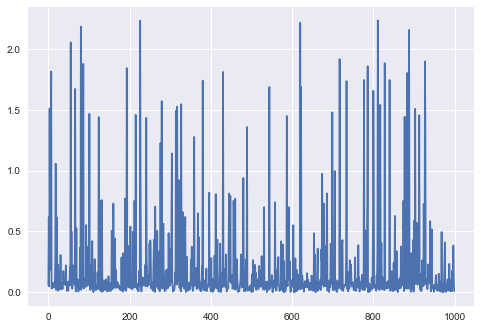

In [170]:
plt.plot(diferenca)

In [257]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',45)
param.iloc[0:45]

,quest,a,b,c,d
0,MT1,1.620765,2.161411,0.161054,1
1,MT2,1.852799,2.758719,0.176854,1
2,MT3,1.263021,0.229747,0.078815,1
3,MT4,1.868424,-0.454915,0.099325,1
4,MT5,2.587798,1.240233,0.184729,1
5,MT6,3.635205,2.392288,0.174938,1
6,MT7,3.531797,1.189594,0.180696,1
7,MT8,2.904952,2.585309,0.123481,1
8,MT9,2.358960,1.379706,0.207710,1
9,MT10,2.841882,0.874222,0.164508,1
